# Artificial Intelligence CourseWork 2: Hyperparameter Optimization



# Introduction
The investigation aimes to explore hyperparameter optimization on Wine Quality Dataset. I will follow Chollet's universal workflow of Deep Learning With Python. 

The overall goal of this project is to develop a program that systematically explores the hyperparameter space to identify the most effective configuration for the model. This involves implementing a search strategy, in this case, random search, to sample different hyperparameter combinations from a predefined space.

I will assess the model's performance using cross-validation, a robust statistical method that maximizes the use of available data by iteratively splitting the dataset into training and validation subsets. This practice helps in estimating the performance of the model on unseen data, thereby ensuring that our optimization process generalizes well and does not overfit to particular quirks of the training data.

By the end of this investigatiI aimpire to have a model tuned to offer the highest predictive accuracy on the Wine Quality Dataset. This report will detail the steps taken in the universal workflow, the implementation of our hyperparameter optimization program, the results obtained, and discussion.

# Methodology
## Step 1: Define the Problem and Assemble a Dataset
The Wine Quality dataset typically refers to one of two datasets available in the UCI Machine Learning Repository related to red and white variants of the Portuguese "Vinho Verde" wine. Wine quality is a subjective variable, judged by experts, and scored on a scale from 0 (very bad) to 10 (excellent). 
The red wine dataset contains 1,597 instance while the white wine dataset contains 4,898 instancs. I will mainly use the red wine dataset for more quicker training.

Each dataset has 11 input features:

* Fixed acidity, 
* Volatile acidity, 
* Citric acid, 
* Residual sugar, 
* Chlorides, 
* Free sulfur dioxide, 
* Total sulfur dioxide, 
* Density, 
* pH, 
* Sulphates, 
* Alcohol. 

The output variable is the quality of the wine, scored on a scale from 0 to 10. Therefore, it can be treated as either a regression problem if we consider the output variable as continuous, or a classification problem for a discrete output. 

For the purpose of this project, I converted it into a classification problem where each wine is great(a score of 7 or higher), good(a score between 4 and 6), not good(a score below 4). 

In this way, it is transformed into a **multi-class classification problem**, and my goal is to classify the red wine into the right category. After identifying the problem type, the next step is to determine the choice of model architecture and evaluation metric.

## Step 2: Choose a Evaluation Metric
For multi-class classfication problems, **categorical entropy** and **accuracy** would be the most frequently-used metrics. In this case, given input feature, the model should be able to classified the data into the right category. 

## Step 3: Decide on a Evaluation Protocol
Evaluation Protocol is essential to keep track of the progress as I tune my models. There are three common ways:
* Hold-out validation set
* K-fold cross-validation
* Iterated K-fold validation

I will use both **K-fold cross validation** and **Hold-out validation set** as evaluation protocol. The holdout test set will be used to assess the model's final performance after tuning and validating the model through K-fold cross-validation on the training set.
Wine Quality dataset is small dataset, where overfitting can be a concern. Cross-validacan be one of the solution to ensure the model generalizes well to unseen data.

For smaller datasets, each fold in K-fold cross-validation contains less data, which means the validation scores might have higher variance. In such cases, K-fold cross-validation is indeed very suitable because it ensures that each observation is used for both training and validation exactly once, making the most out of limited data.

I have an exact quantity of 1597 pieces of data. I am not sure what is the most appropriate number for k, might be 3, 5, or 10. I will conduct experimentations on this to see if there is any differences.

## Step 4: Prepare the Data

Now I have determined the dataset, the evaluation metrics, the evaluation protocol. It is time to prepare the data and preprocess them. 

* Missing Values


    Missing values in the dataset are being filled with the mean value of their respective columns. This is a common imputation technique to handle misg data.

* Extract Feature and Target Value


   Input features are being taken from all columns except the last two, and target variable is taken from the second last column of he DataFram. The .to_numpy() method is used to convert the DataFrame slices into numpy arrays.

* Standardize Input Features


    The input features are being standardIzed using StandardScaler, which removes the mean and scales the data this way. It is an essential  preprdocessing step to normalize the data before feeding it to machine learning model.

    The target variable y is being relabelled to three classes:
    Class 0: for original value between 6 and 9 (inclusive)
    Class 1: for original value between 4 and 6 (inclusive)
    Class 2: for all other values

* One-hot Encode the Target

    The relabeled target variable is one-hot encoded, which is necessary for multi-class classification with neural networks. This creates 
matrix representation of the data.

* Split Data into Training and Test Sets

    The scaled data is split into training and test sets using an 80-20 split. 80% of the data is used for training, and 20% is reserved for testing the model's performance. The random_state parameter ensures reproducibility of the split.

* Set Up K-Fold Cross-Validation

    A KFold cross-validator is set up to use 3 folds first, as discussed.


In [54]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from tensorflow.keras.utils import to_categorical
from sklearn.model_selection import train_test_split, KFold

# load the data
df = pd.read_csv('C:/Users/80443/Desktop/Goldsmiths/AI/WineQT.csv')

# fill missing values with the mean
df = df.fillna(df.mean())
X = df.iloc[:, :-2].to_numpy()  #  Input variable
y = df.iloc[:, -2].to_numpy()   # Target variable (the second last column)

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
# make it a 3-class classification tasks
y_relabel = np.where((y>=7) & (y<=9), 0,
            np.where((y>=4) & (y<=6), 1, 2)) 
y_encoded = to_categorical(y_relabel, num_classes=3)

# split train set and test set
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42)
# use cross validation to split the train and validation set, k = 3
n_splits=5
cross_validator = KFold(n_splits=n_splits, shuffle=True, random_state=42)


## Step 5: Build a Basic Model
I will build a neural network between features and the target. Key hyperparameters for tuning included the architecture of the neural network (number of layers and units), learning rate, optimizer type, and regularization parameters. Random search was chosen to efficiently navigate the hyperparameter space with a predefined range for each parameter. And in later experiment, I will try to include more hyperparameters.

In [61]:
from tensorflow.keras import models, layers, regularizers
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt


def create_model(hidden_units, hidden_layers, optimizer, dropout_rate, l1, l2, learning_rate, adam_beta_1=None, adam_beta_2=None, momentum=None, learning_rate_decay=None, rho=None):
    model = models.Sequential()
    model.add(layers.Dense(hidden_units, activation='relu', input_shape=(11,), kernel_regularizer=regularizers.l1_l2(l1=l1, l2=l2)))
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(3, activation='softmax'))
    
    if optimizer == 'Adam':
        if adam_beta_1 is not None and adam_beta_2 is not None:
            optimizer = Adam(learning_rate=learning_rate, beta_1=adam_beta_1, beta_2=adam_beta_2)
    elif optimizer == 'RMSprop':
        optimizer = RMSprop(learning_rate=learning_rate, rho=rho)
    elif optimizer == 'momentum':
        optimizer = SGD(learning_rate=learning_rate, momentum=momentum)
    else:
        raise ValueError("Unknown optimizer")
    # I am not sure how to handle the parameter of different optimizers. I asked GPT4 about it, GPT4 paid version, accessed on Jan 25th.
        
    model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model

# from lab code
def plot_loss(history):
    loss = history.history['loss']
    val_loss = history.history['val_loss']

    epochs = range(1, len(loss) + 1)

    blue_dots = 'bo'
    solid_blue_line = 'b'

    plt.plot(epochs, loss, blue_dots, label = 'Training loss')
    plt.plot(epochs, val_loss, solid_blue_line, label = 'Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

# from lab code
def plot_accuracy(history):
    acc = history.history['accuracy']
    val_acc = history.history['val_accuracy']
    
    epochs = range(1, len(acc) + 1)
    
    plt.plot(epochs, acc, 'bo', label = 'Training acc')
    plt.plot(epochs, val_acc, 'b', label = 'Validation acc')
    plt.title('Training and validation acc')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()
    
    

## Experiment 1: Kfold = 5, basic hyperparameters

* Learning Rate: 0.1, 0.01, 0.001, 0.0001, 0.00001, 0.000001

* Hidden Layers: 1, 2, 3, 4, 5

* Hidden Units: 8, 16, 32, 64, 128, 256

* Batch Size: 128, 256, 512

* Optimizers: SGD, RMSprop, Adam

* Dropout Rates: 0.2, 0.3, 0.4

Dropout is a regularization technique that randomly sets a fraction of input units to 0 at each update during training time, which helps prevent overfitting. The rates 0.2, 0.3, 0.4 here mean that 20%, 30%, or 40% of the nodes will be turned off.

* L1 Regularization: 0.001, 0.01, 0.1

These are regularization techniques that constrain the weights of the network during training. L1 regularization adds an L1 penalty equal to the absolute value of the magnitude of coefficients, which can lead to sparse models with some weights pushed to zero. 

* L2 Regularization: 0.001, 0.01, 0.1

L2 regularization adds an L2 penalty equal to the square of the magnitude of coefficients, which tends to spread error among terms but doesn't make weights exactly zero. Values 0.001, 0.01, 0.1 provide a range of regularization strengths to prevent overfitting.

* Momentum (for SGD): 0.8, 0.9, 0.99, 0.999

Momentum is a term added to the parameter updates that can help accelerate SGD in the correct direction. The options 0.8, 0.9, 0.99, 0.999 offer different levels of momentum.

* Learning Rate Decay: lr/100 for lr in learning_rate

This is a technique to reduce the learning rate over time. Starting with a larger learning rate can help the model converge quickly, and decreasing it can help the model fine-tune its weights. Nearer the end of training, the more precise the learning rate decay should be tune.

* Rho (for RMSprop): 0.8, 0.9, 0.99

Rho is a hyperparameter of the RMSprop optimizer that controls the decay rate of the moving average of the squared gradients. It's similar to the momentum term but applied to the gradient squared.

* Beta Values (for Adam): adam_beta_1 = 0.9, 0.95, adam_beta_2 = 0.999, 0.9995

These hyperparameters control the decay rates of the moving averages of the past gradients (beta_1) and the past squared gradients (beta_2) in the Adam optimizer.

In [62]:
learning_rate = [
    10 ** -i for i in range(1, 6)
]
hidden_layers = [
    1, 2, 3, 4, 5,
]
hidden_units = [
    8, 16, 32, 64, 128, 256,
]
batch_size = [
    128, 256, 512,
]
optimizer = [
    'momentum', 'RMSprop', 'Adam',
]
dropout_rate = [0.2, 0.3, 0.4,]

l1=[0.001, 0.01, 0.1,]
l2=[0.001, 0.01, 0.1,]

momentum = [
    0.8, 0.9, 0.99, 0.999,
]
learning_rate_decay = [lr/100 for lr in learning_rate]

rho = [0.8, 0.9, 0.99]

adam_beta_1 = [0.9, 0.95]
adam_beta_2 = [0.999, 0.9995]

param_space = {
    'learning_rate': learning_rate,
    'hidden_layers': hidden_layers,
    'hidden_units': hidden_units,
    'batch_size': batch_size,
    'learning_rate_decay': learning_rate_decay,
    'optimizer': optimizer,
    'l1': l1,
    'l2': l2,
    'dropout_rate': dropout_rate,
    'momentum': momentum if 'momentum' in optimizer else [None],
    'adam_beta_1': adam_beta_1 if 'Adam' in optimizer else [None],
    'adam_beta_2': adam_beta_2 if 'Adam' in optimizer else [None],
    'rho': rho if 'RMSprop' in optimizer else [None],
}

Experiment number: 1
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 219ms/step - loss: 4.0740 - accuracy: 0.2517 - val_loss: 3.4577 - val_accuracy: 0.5246
Epoch 2/100
2/2 [==============================] - 0s 48ms/step - loss: 3.4385 - accuracy: 0.5185 - val_loss: 3.1201 - val_accuracy: 0.7760
Epoch 3/100
2/2 [==============================] - 0s 47ms/step - loss: 3.1000 - accuracy: 0.6676 - val_loss: 2.8832 - val_accuracy: 0.8087
Epoch 4/100
2/2 [==============================] - 0s 50ms/step - loss: 2.8410 - accuracy: 0.7825 - val_loss: 2.7010 - val_accuracy: 0.8087
Epoch 5/100
2/2 [==============================] - 0s 50ms/step - 

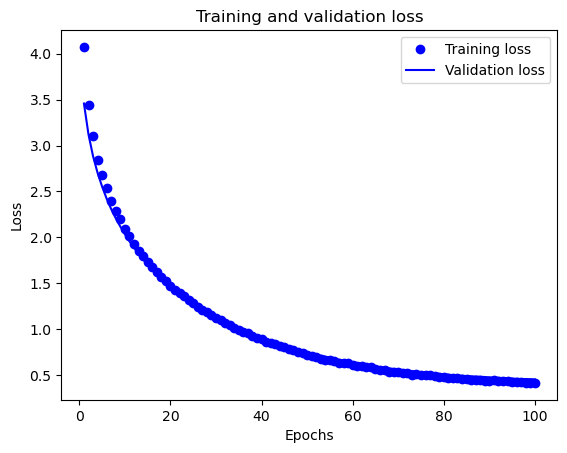

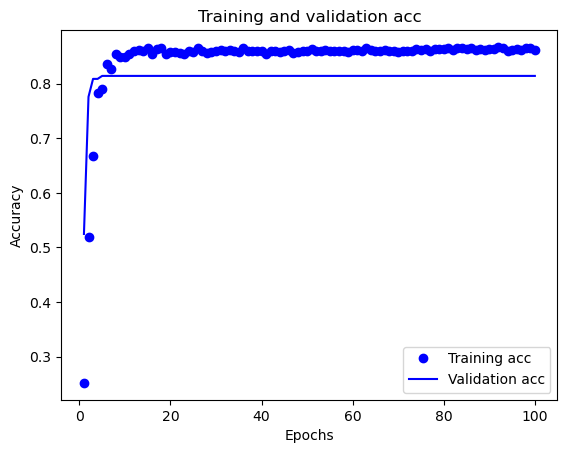

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 231ms/step - loss: 3.9221 - accuracy: 0.5130 - val_loss: 3.3483 - val_accuracy: 0.7978
Epoch 2/100
2/2 [==============================] - 0s 41ms/step - loss: 3.2995 - accuracy: 0.7565 - val_loss: 3.0280 - val_accuracy: 0.8197
Epoch 3/100
2/2 [==============================] - 0s 38ms/step - loss: 3.0166 - accuracy: 0.7852 - val_loss: 2.7981 - val_accuracy: 0.8361
Epoch 4/100
2/2 [==============================] - 0s 39ms/step - loss: 2.8084 - accuracy: 0.8167 - val_loss: 2.6177 - val_accuracy: 0.8361
Epoch 5/100
2/2 [====================

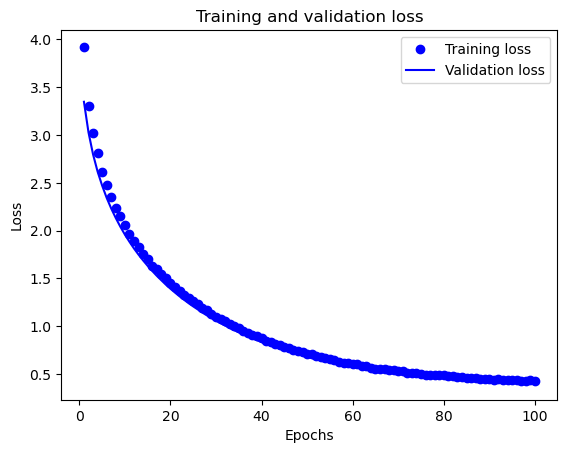

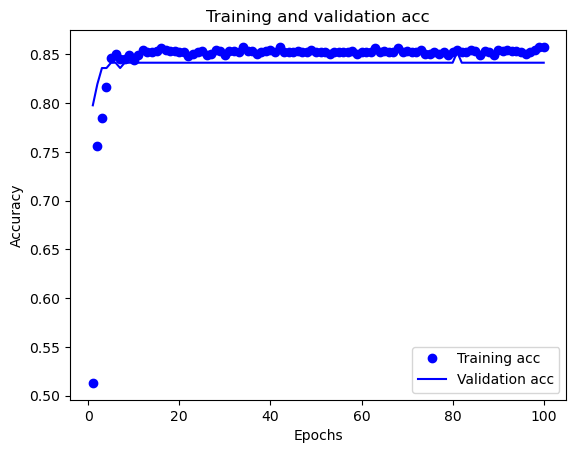

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 229ms/step - loss: 4.4019 - accuracy: 0.1382 - val_loss: 3.6999 - val_accuracy: 0.3005
Epoch 2/100
2/2 [==============================] - 0s 39ms/step - loss: 3.6802 - accuracy: 0.2955 - val_loss: 3.3129 - val_accuracy: 0.4973
Epoch 3/100
2/2 [==============================] - 0s 38ms/step - loss: 3.2990 - accuracy: 0.4706 - val_loss: 3.0489 - val_accuracy: 0.6503
Epoch 4/100
2/2 [==============================] - 0s 40ms/step - loss: 3.0715 - accuracy: 0.5472 - val_loss: 2.8435 - val_accuracy: 0.8033
Epoch 5/100
2/2 [====================

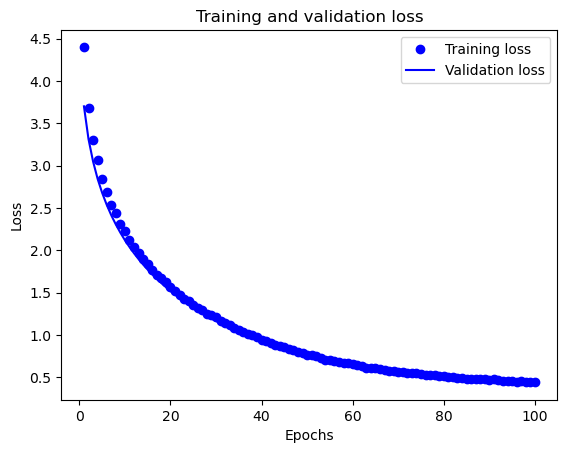

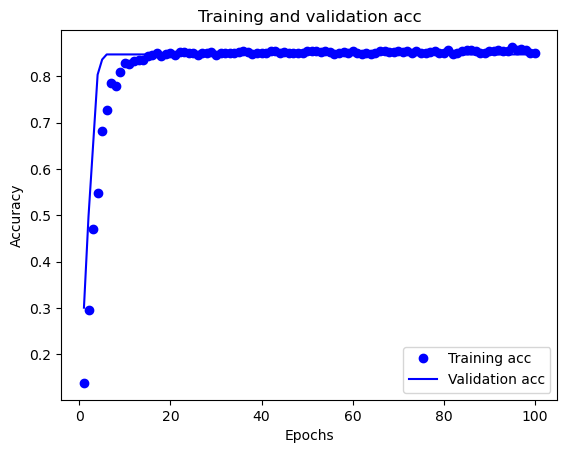

6/6 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 221ms/step - loss: 4.0579 - accuracy: 0.3885 - val_loss: 3.4976 - val_accuracy: 0.6721
Epoch 2/100
2/2 [==============================] - 0s 39ms/step - loss: 3.4546 - accuracy: 0.6430 - val_loss: 3.1505 - val_accuracy: 0.7923
Epoch 3/100
2/2 [==============================] - 0s 91ms/step - loss: 3.1201 - accuracy: 0.7305 - val_loss: 2.9102 - val_accuracy: 0.8525
Epoch 4/100
2/2 [==============================] - 0s 38ms/step - loss: 2.8904 - accuracy: 0.7866 - val_loss: 2.7184 - val_accuracy: 0.8689
Epoch 5/100
2/2 [===================

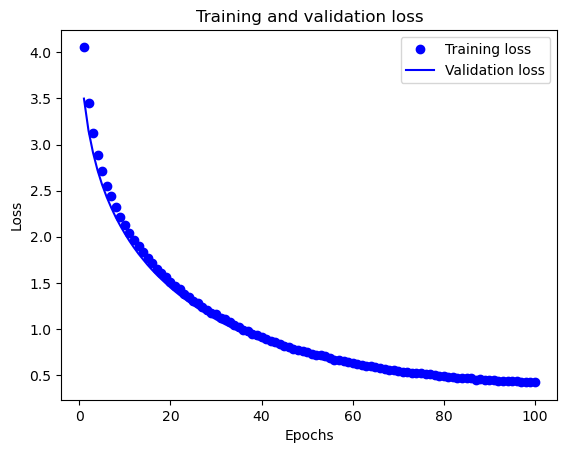

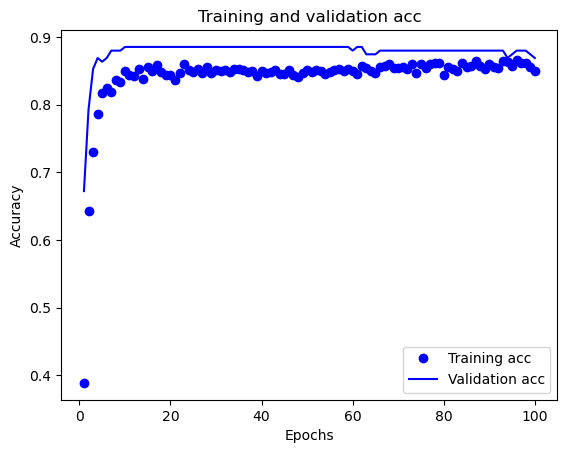

6/6 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (732, 11)
y_current_train shape: (732, 3)
Epoch 1/100
2/2 [==============================] - 1s 227ms/step - loss: 4.3021 - accuracy: 0.1462 - val_loss: 3.6382 - val_accuracy: 0.3462
Epoch 2/100
2/2 [==============================] - 0s 44ms/step - loss: 3.6220 - accuracy: 0.3074 - val_loss: 3.2524 - val_accuracy: 0.5220
Epoch 3/100
2/2 [==============================] - 0s 39ms/step - loss: 3.2489 - accuracy: 0.5164 - val_loss: 2.9822 - val_accuracy: 0.7308
Epoch 4/100
2/2 [==============================] - 0s 41ms/step - loss: 2.9947 - accuracy: 0.6120 - val_loss: 2.7748 - val_accuracy: 0.8297
Epoch 5/100
2/2 [===================

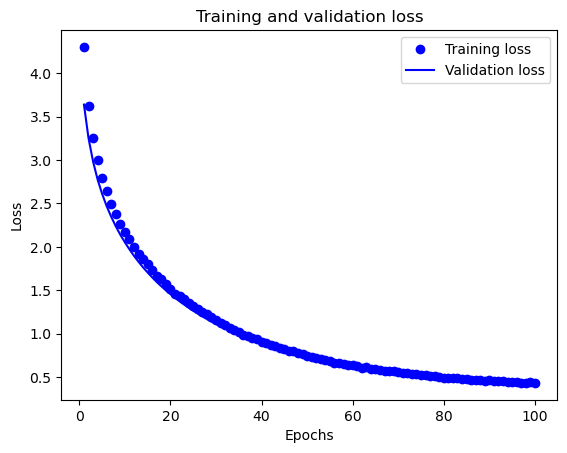

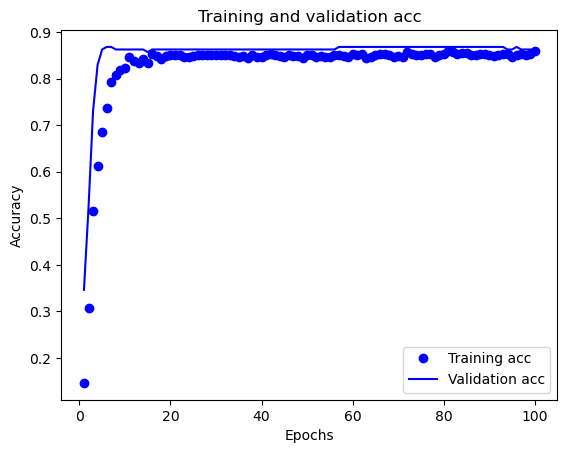

6/6 [==============================] - 0s 3ms/step
Experiment number: 2
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 1, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 115ms/step - loss: 1.4071 - accuracy: 0.1601 - val_loss: 1.3684 - val_accuracy: 0.2022
Epoch 2/100
3/3 [==============================] - 0s 20ms/step - loss: 1.4082 - accuracy: 0.1683 - val_loss: 1.3681 - val_accuracy: 0.2022
Epoch 3/100
3/3 [==============================] - 0s 21ms/step - loss: 1.3951 - accuracy: 0.1915 - val_loss: 1.3677 - val_accuracy: 0.2022
Epoch 4/100
3/3 [==============================] - 0s 21ms/step - loss: 1.3917 - accuracy: 0.1614 - val_loss: 1.3672 - val_accuracy: 0.2022
Epoch 5/100
3/3 [============

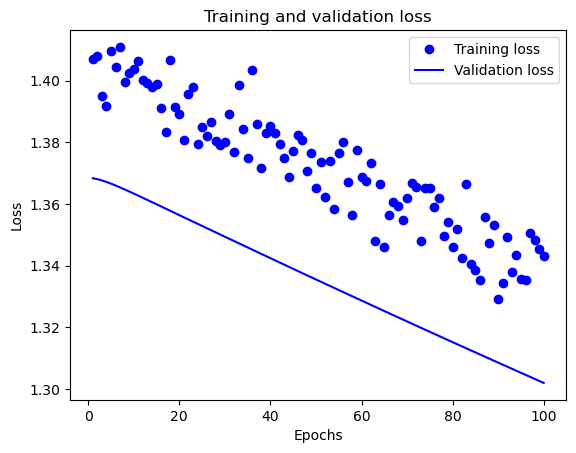

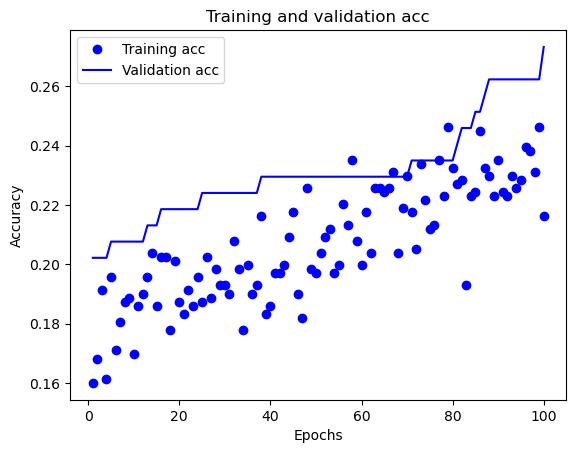

6/6 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 1, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 110ms/step - loss: 1.2202 - accuracy: 0.4118 - val_loss: 1.2247 - val_accuracy: 0.4372
Epoch 2/100
3/3 [==============================] - 0s 20ms/step - loss: 1.2196 - accuracy: 0.4063 - val_loss: 1.2245 - val_accuracy: 0.4372
Epoch 3/100
3/3 [==============================] - 0s 22ms/step - loss: 1.2172 - accuracy: 0.4104 - val_loss: 1.2242 - val_accuracy: 0.4372
Epoch 4/100
3/3 [==============================] - 0s 22ms/step - loss: 1.2301 - accuracy: 0.4172 - val_loss: 1.2239 - val_accuracy: 0.4372
Epoch 5/100
3/3 [==============================] -

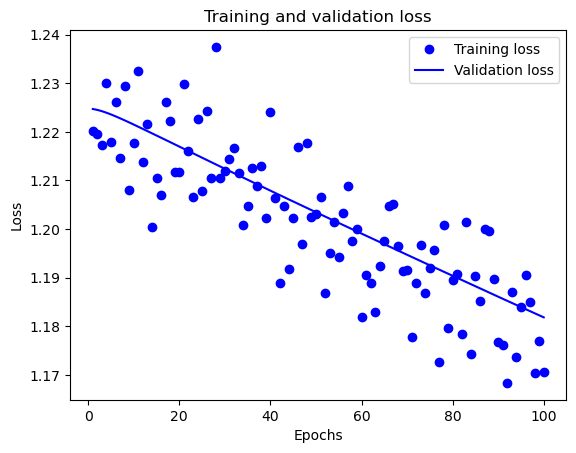

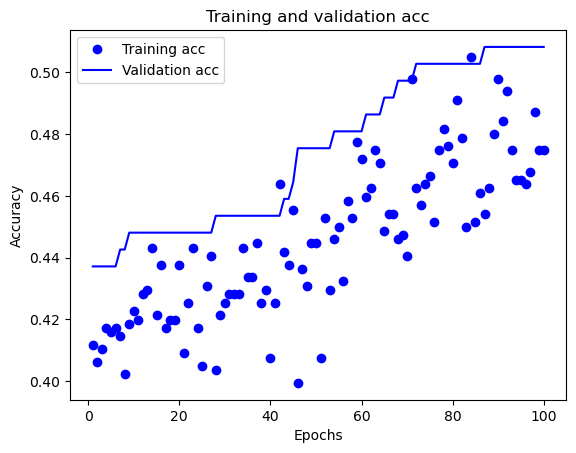

6/6 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 1, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 115ms/step - loss: 1.4867 - accuracy: 0.2066 - val_loss: 1.4664 - val_accuracy: 0.2186
Epoch 2/100
3/3 [==============================] - 0s 17ms/step - loss: 1.4857 - accuracy: 0.2066 - val_loss: 1.4661 - val_accuracy: 0.2186
Epoch 3/100
3/3 [==============================] - 0s 17ms/step - loss: 1.4712 - accuracy: 0.2107 - val_loss: 1.4657 - val_accuracy: 0.2186
Epoch 4/100
3/3 [==============================] - 0s 16ms/step - loss: 1.4671 - accuracy: 0.2161 - val_loss: 1.4653 - val_accuracy: 0.2186
Epoch 5/100
3/3 [==============================] -

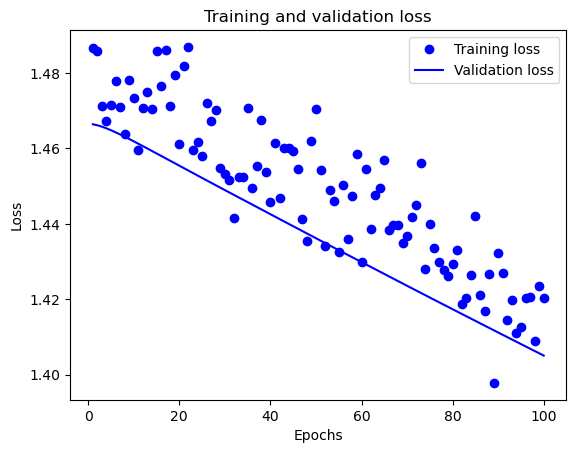

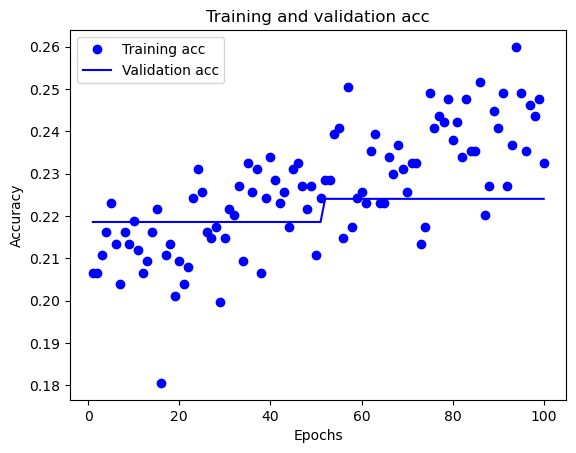

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 1, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 133ms/step - loss: 1.2007 - accuracy: 0.4514 - val_loss: 1.2441 - val_accuracy: 0.3934
Epoch 2/100
3/3 [==============================] - 0s 23ms/step - loss: 1.2195 - accuracy: 0.4118 - val_loss: 1.2439 - val_accuracy: 0.3880
Epoch 3/100
3/3 [==============================] - 0s 24ms/step - loss: 1.2149 - accuracy: 0.4254 - val_loss: 1.2435 - val_accuracy: 0.3880
Epoch 4/100
3/3 [==============================] - 0s 13ms/step - loss: 1.2074 - accuracy: 0.4268 - val_loss: 1.2431 - val_accuracy: 0.3880
Epoch 5/100
3/3 [==============================] - 

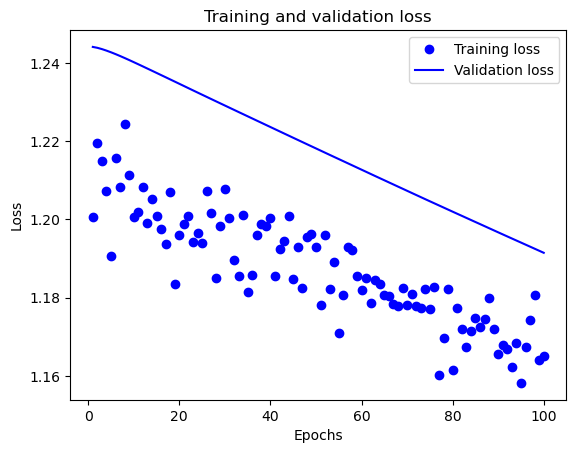

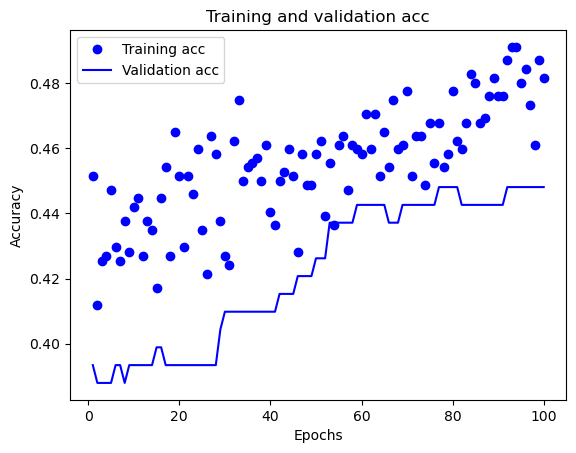

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 1, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 256
X_current_train shape: (732, 11)
y_current_train shape: (732, 3)
Epoch 1/100
3/3 [==============================] - 1s 120ms/step - loss: 1.4829 - accuracy: 0.1243 - val_loss: 1.5140 - val_accuracy: 0.0879
Epoch 2/100
3/3 [==============================] - 0s 19ms/step - loss: 1.4911 - accuracy: 0.1434 - val_loss: 1.5137 - val_accuracy: 0.0879
Epoch 3/100
3/3 [==============================] - 0s 25ms/step - loss: 1.4787 - accuracy: 0.1489 - val_loss: 1.5131 - val_accuracy: 0.0879
Epoch 4/100
3/3 [==============================] - 0s 24ms/step - loss: 1.4711 - accuracy: 0.1571 - val_loss: 1.5125 - val_accuracy: 0.0879
Epoch 5/100
3/3 [==============================] - 

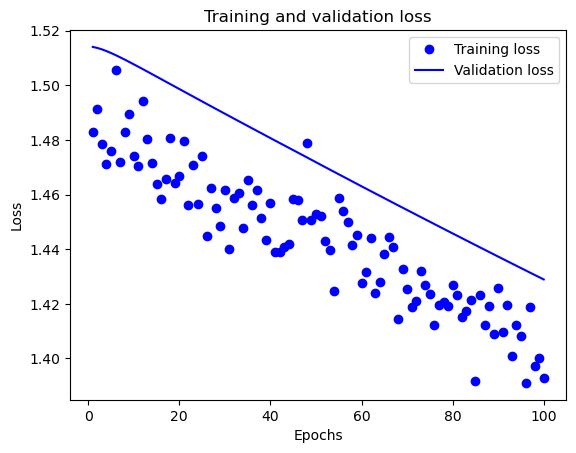

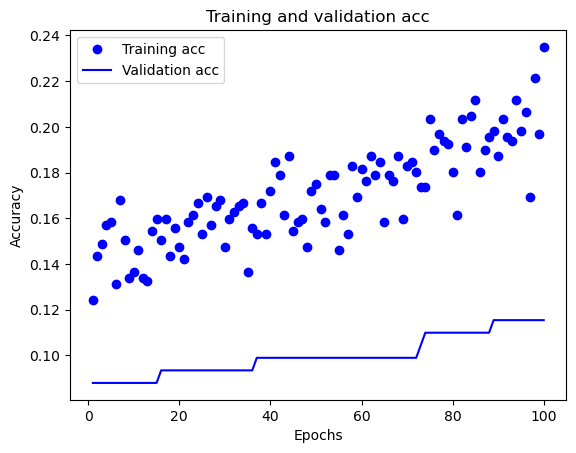

6/6 [==============================] - 0s 0s/step
Experiment number: 3
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 4, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 117ms/step - loss: 2.3679 - accuracy: 0.6621 - val_loss: 1.2652 - val_accuracy: 0.8142
Epoch 2/100
3/3 [==============================] - 0s 23ms/step - loss: 1.4528 - accuracy: 0.8591 - val_loss: 1.6765 - val_accuracy: 0.8142
Epoch 3/100
3/3 [==============================] - 0s 21ms/step - loss: 1.3192 - accuracy: 0.8591 - val_loss: 1.0646 - val_accuracy: 0.8142
Epoch 4/100
3/3 [==============================] - 0s 20ms/step - loss: 0.9298 - accuracy: 0.8591 - val_loss: 0.9810 - val_accuracy: 0.8142
Epoch 5/100
3/3 [===

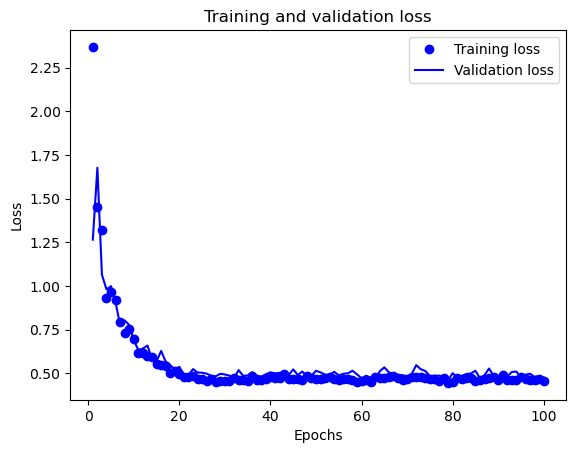

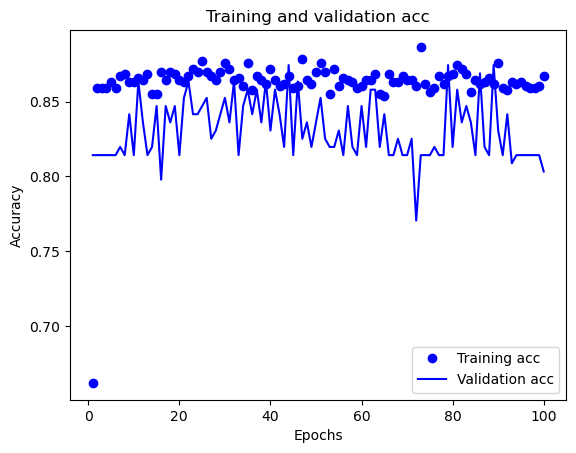

6/6 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 4, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 115ms/step - loss: 2.4047 - accuracy: 0.6033 - val_loss: 1.2022 - val_accuracy: 0.8415
Epoch 2/100
3/3 [==============================] - 0s 22ms/step - loss: 1.4269 - accuracy: 0.8523 - val_loss: 1.4836 - val_accuracy: 0.8579
Epoch 3/100
3/3 [==============================] - 0s 21ms/step - loss: 1.3214 - accuracy: 0.8564 - val_loss: 1.0087 - val_accuracy: 0.8525
Epoch 4/100
3/3 [==============================] - 0s 16ms/step - loss: 0.9770 - accuracy: 0.8577 - val_loss: 0.9330 - val_accuracy: 0.8415
Epoch 5/100
3/3 [=======================

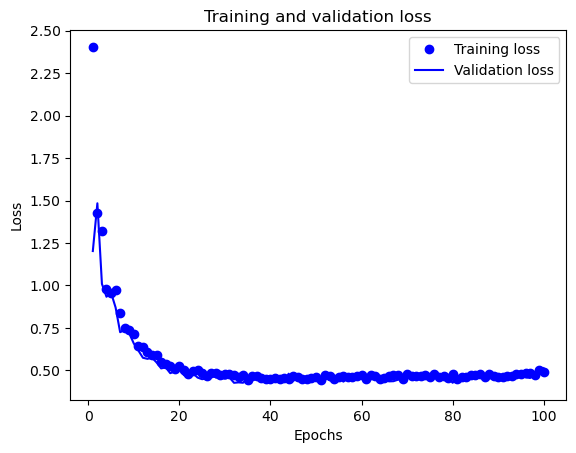

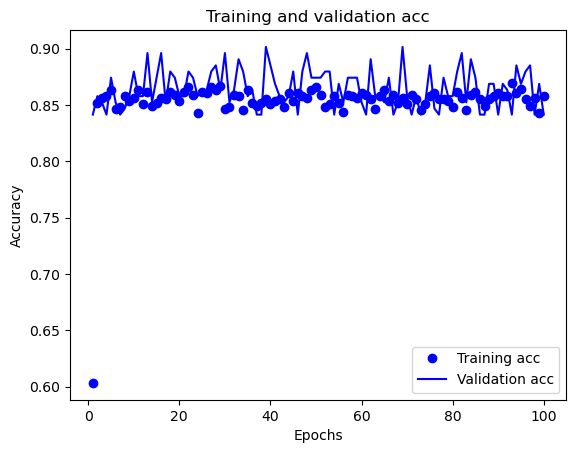

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 4, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 117ms/step - loss: 2.4220 - accuracy: 0.6648 - val_loss: 1.1956 - val_accuracy: 0.8470
Epoch 2/100
3/3 [==============================] - 0s 19ms/step - loss: 1.4000 - accuracy: 0.8509 - val_loss: 1.5215 - val_accuracy: 0.8470
Epoch 3/100
3/3 [==============================] - 0s 27ms/step - loss: 1.3457 - accuracy: 0.8536 - val_loss: 1.0840 - val_accuracy: 0.8415
Epoch 4/100
3/3 [==============================] - 0s 22ms/step - loss: 0.9877 - accuracy: 0.8618 - val_loss: 0.9441 - val_accuracy: 0.8470
Epoch 5/100
3/3 [========================

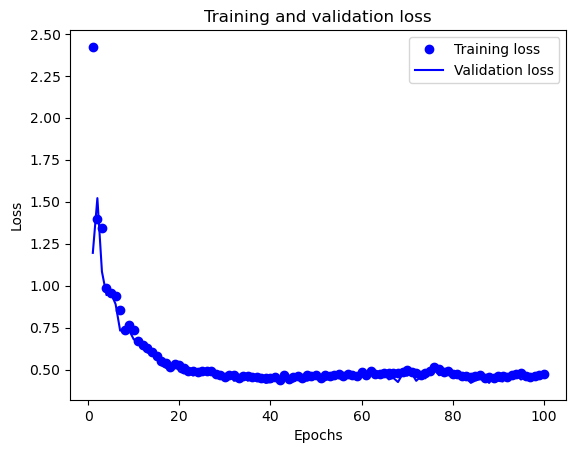

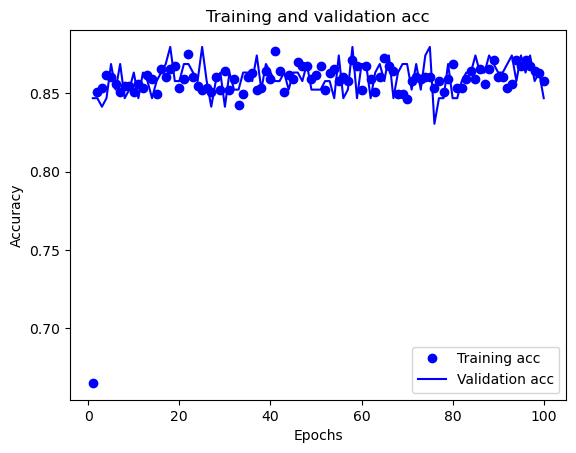

6/6 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 4, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 122ms/step - loss: 2.2976 - accuracy: 0.7086 - val_loss: 1.1846 - val_accuracy: 0.8852
Epoch 2/100
3/3 [==============================] - 0s 17ms/step - loss: 1.4121 - accuracy: 0.8523 - val_loss: 1.4593 - val_accuracy: 0.8525
Epoch 3/100
3/3 [==============================] - 0s 17ms/step - loss: 1.3294 - accuracy: 0.8495 - val_loss: 0.9655 - val_accuracy: 0.8907
Epoch 4/100
3/3 [==============================] - 0s 21ms/step - loss: 0.9107 - accuracy: 0.8550 - val_loss: 0.8967 - val_accuracy: 0.8579
Epoch 5/100
3/3 [=======================

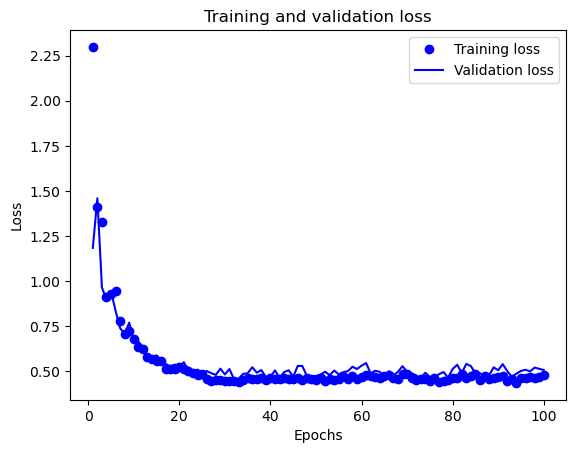

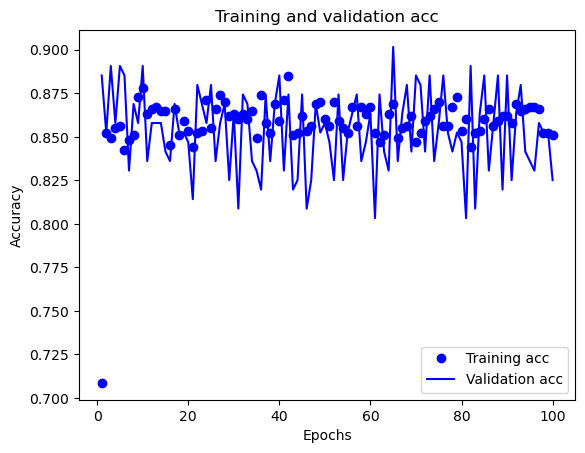

6/6 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 4, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None}
Batch size: 256
X_current_train shape: (732, 11)
y_current_train shape: (732, 3)
Epoch 1/100
3/3 [==============================] - 1s 112ms/step - loss: 2.2266 - accuracy: 0.7445 - val_loss: 1.0965 - val_accuracy: 0.8626
Epoch 2/100
3/3 [==============================] - 0s 25ms/step - loss: 1.3381 - accuracy: 0.8470 - val_loss: 1.4391 - val_accuracy: 0.8681
Epoch 3/100
3/3 [==============================] - 0s 14ms/step - loss: 1.2854 - accuracy: 0.8566 - val_loss: 0.9345 - val_accuracy: 0.8626
Epoch 4/100
3/3 [==============================] - 0s 23ms/step - loss: 0.8942 - accuracy: 0.8579 - val_loss: 0.9102 - val_accuracy: 0.8571
Epoch 5/100
3/3 [=======================

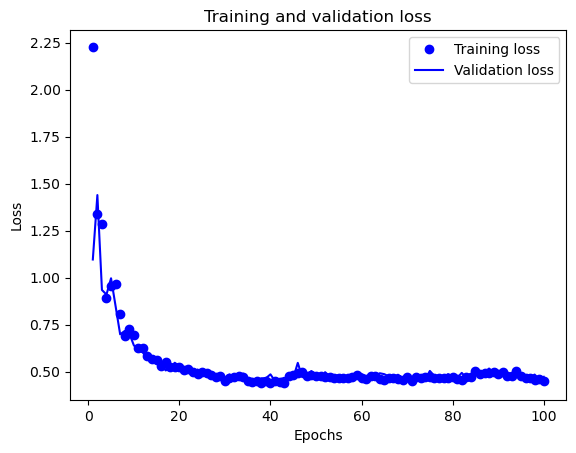

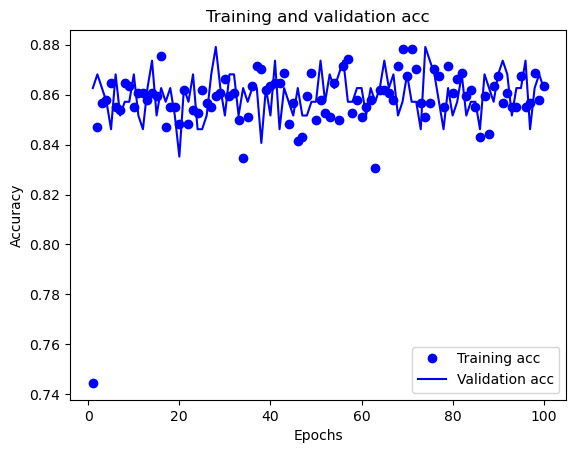

6/6 [==============================] - 0s 4ms/step
Experiment number: 4
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 5, 'hidden_units': 8, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 244ms/step - loss: 1.8214 - accuracy: 0.6799 - val_loss: 1.8201 - val_accuracy: 0.7322
Epoch 2/100
2/2 [==============================] - 0s 39ms/step - loss: 1.8313 - accuracy: 0.6703 - val_loss: 1.8192 - val_accuracy: 0.7322
Epoch 3/100
2/2 [==============================] - 0s 38ms/step - loss: 1.8214 - accuracy: 0.6785 - val_loss: 1.8185 - val_accuracy: 0.7322
Epoch 4/100
2/2 [==============================] - 0s 39ms/step - loss: 1.8184 - accuracy: 0.6936 - val_loss: 1.8179 - val_accuracy: 0.7322
Epoch 5/100
2/2

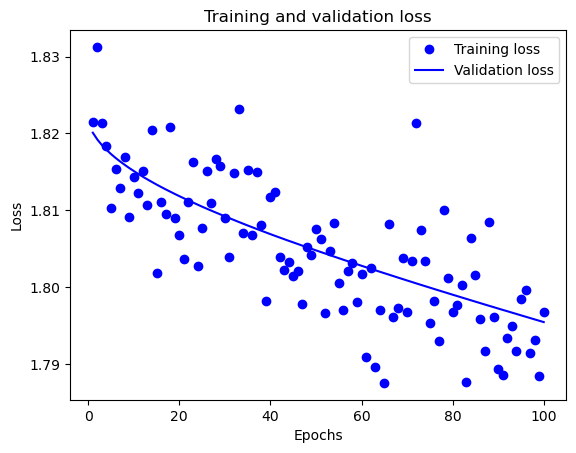

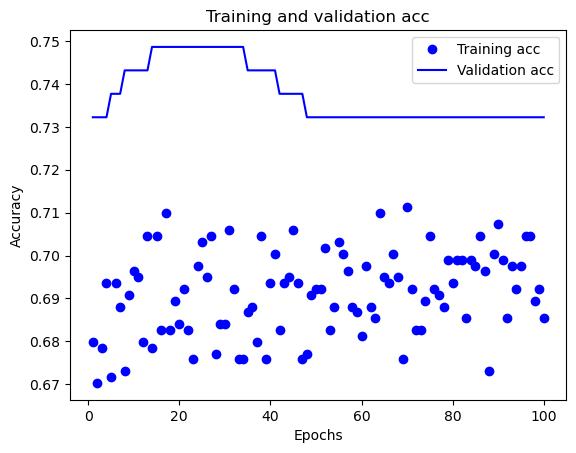

6/6 [==============================] - 0s 4ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 5, 'hidden_units': 8, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 295ms/step - loss: 1.9593 - accuracy: 0.4008 - val_loss: 1.9495 - val_accuracy: 0.3989
Epoch 2/100
2/2 [==============================] - 0s 51ms/step - loss: 1.9603 - accuracy: 0.4337 - val_loss: 1.9485 - val_accuracy: 0.3989
Epoch 3/100
2/2 [==============================] - 0s 44ms/step - loss: 1.9358 - accuracy: 0.4008 - val_loss: 1.9478 - val_accuracy: 0.3989
Epoch 4/100
2/2 [==============================] - 0s 41ms/step - loss: 1.9336 - accuracy: 0.4200 - val_loss: 1.9471 - val_accuracy: 0.3989
Epoch 5/100
2/2 [===================

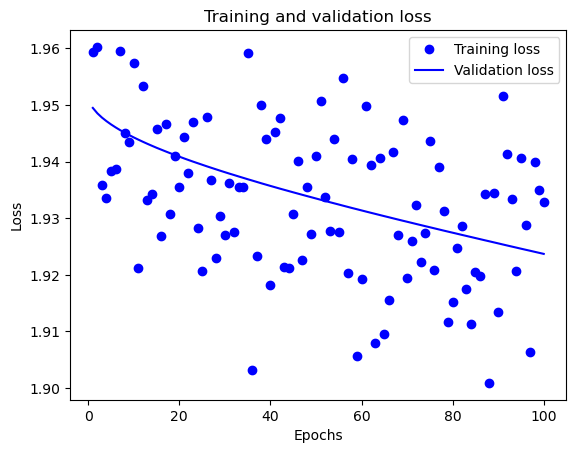

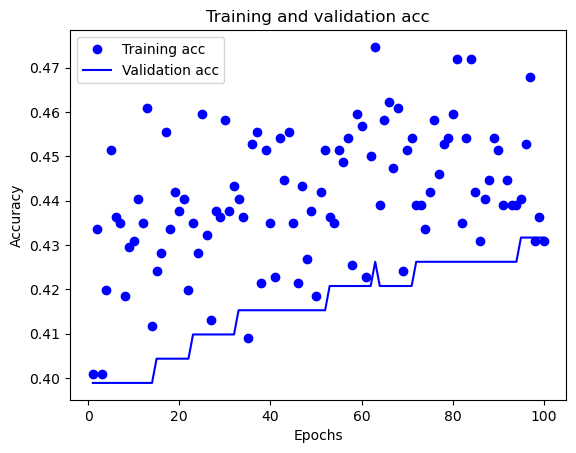

6/6 [==============================] - 0s 4ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 5, 'hidden_units': 8, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 233ms/step - loss: 1.8516 - accuracy: 0.3967 - val_loss: 1.7853 - val_accuracy: 0.5464
Epoch 2/100
2/2 [==============================] - 0s 38ms/step - loss: 1.8397 - accuracy: 0.4008 - val_loss: 1.7843 - val_accuracy: 0.5464
Epoch 3/100
2/2 [==============================] - 0s 37ms/step - loss: 1.8328 - accuracy: 0.4090 - val_loss: 1.7836 - val_accuracy: 0.5464
Epoch 4/100
2/2 [==============================] - 0s 40ms/step - loss: 1.8447 - accuracy: 0.4323 - val_loss: 1.7830 - val_accuracy: 0.5464
Epoch 5/100
2/2 [===================

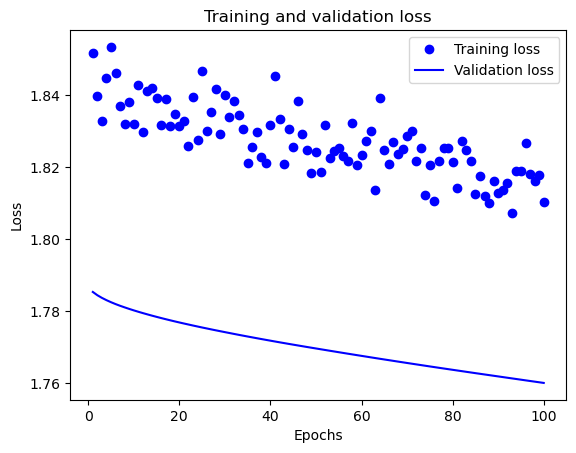

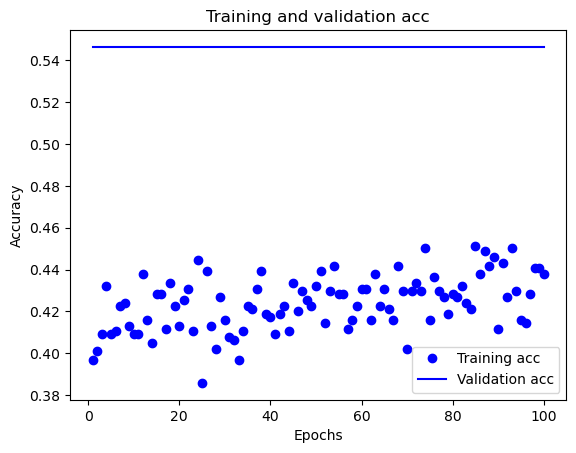

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 5, 'hidden_units': 8, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 233ms/step - loss: 2.3930 - accuracy: 0.3051 - val_loss: 2.4180 - val_accuracy: 0.2514
Epoch 2/100
2/2 [==============================] - 0s 42ms/step - loss: 2.3442 - accuracy: 0.3352 - val_loss: 2.4166 - val_accuracy: 0.2514
Epoch 3/100
2/2 [==============================] - 0s 36ms/step - loss: 2.3867 - accuracy: 0.2873 - val_loss: 2.4156 - val_accuracy: 0.2514
Epoch 4/100
2/2 [==============================] - 0s 48ms/step - loss: 2.3818 - accuracy: 0.3352 - val_loss: 2.4146 - val_accuracy: 0.2514
Epoch 5/100
2/2 [====================

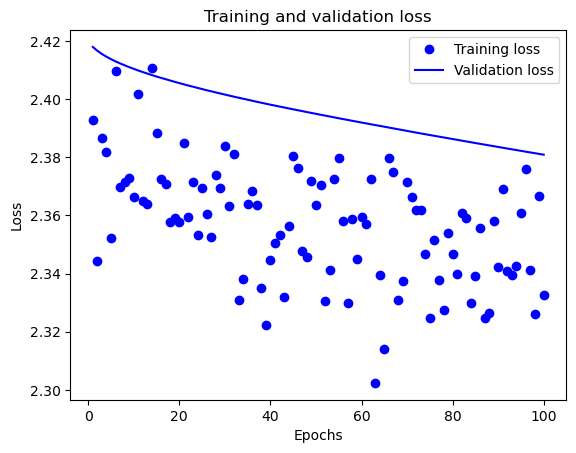

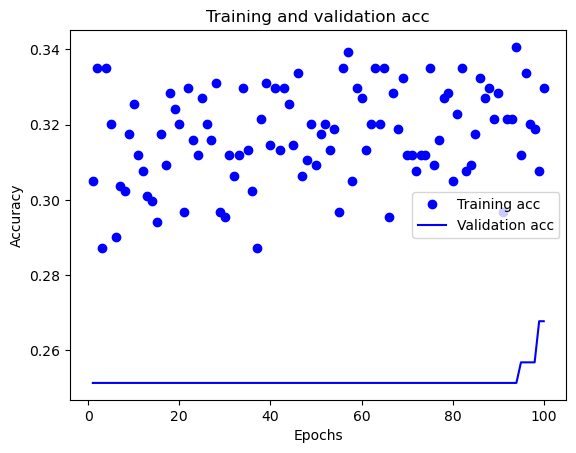

6/6 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 5, 'hidden_units': 8, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (732, 11)
y_current_train shape: (732, 3)
Epoch 1/100
2/2 [==============================] - 1s 223ms/step - loss: 2.0052 - accuracy: 0.4604 - val_loss: 1.9642 - val_accuracy: 0.5055
Epoch 2/100
2/2 [==============================] - 0s 34ms/step - loss: 1.9965 - accuracy: 0.4658 - val_loss: 1.9632 - val_accuracy: 0.5055
Epoch 3/100
2/2 [==============================] - 0s 40ms/step - loss: 1.9845 - accuracy: 0.4740 - val_loss: 1.9624 - val_accuracy: 0.5055
Epoch 4/100
2/2 [==============================] - 0s 30ms/step - loss: 1.9959 - accuracy: 0.4809 - val_loss: 1.9617 - val_accuracy: 0.5055
Epoch 5/100
2/2 [===================

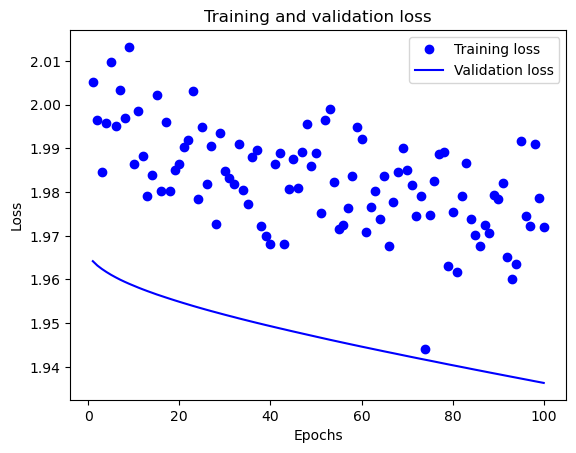

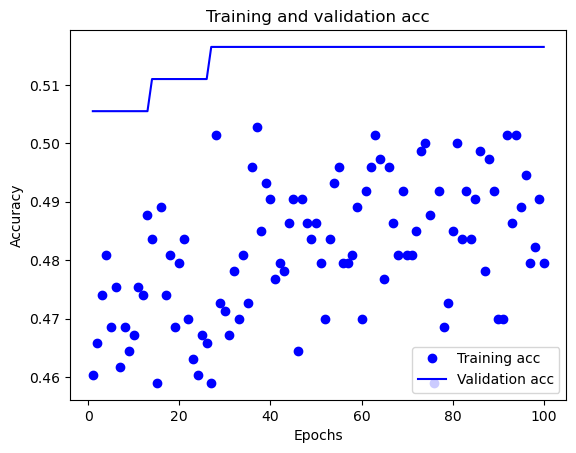

6/6 [==============================] - 0s 3ms/step
Experiment number: 5
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 5, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 118ms/step - loss: 2.2716 - accuracy: 0.3789 - val_loss: 2.2285 - val_accuracy: 0.4262
Epoch 2/100
3/3 [==============================] - 0s 24ms/step - loss: 2.2841 - accuracy: 0.3803 - val_loss: 2.2276 - val_accuracy: 0.4262
Epoch 3/100
3/3 [==============================] - 0s 25ms/step - loss: 2.2751 - accuracy: 0.3926 - val_loss: 2.2268 - val_accuracy: 0.4262
Epoch 4/100
3/3 [==============================] - 0s 20ms/step - loss: 2.2880 - accuracy: 0.3871 - val_loss: 2.2261 - val_accuracy: 0.4262
Epoch 5/100
3/3 [===============

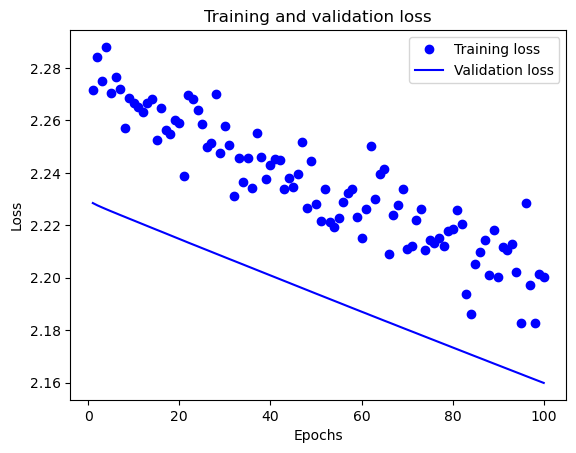

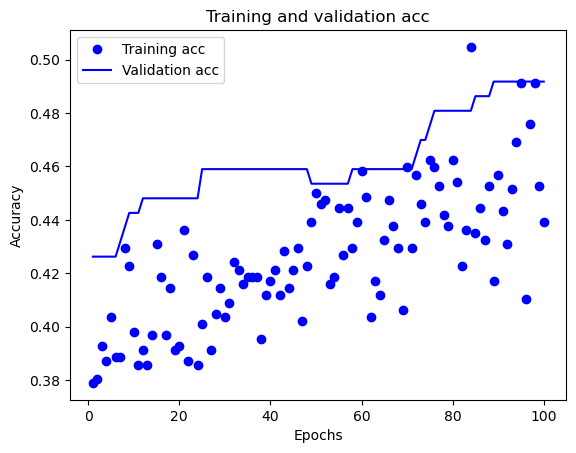

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 5, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 138ms/step - loss: 2.4053 - accuracy: 0.2271 - val_loss: 2.3936 - val_accuracy: 0.1858
Epoch 2/100
3/3 [==============================] - 0s 29ms/step - loss: 2.4077 - accuracy: 0.2408 - val_loss: 2.3925 - val_accuracy: 0.1858
Epoch 3/100
3/3 [==============================] - 0s 24ms/step - loss: 2.4235 - accuracy: 0.2285 - val_loss: 2.3915 - val_accuracy: 0.1858
Epoch 4/100
3/3 [==============================] - 0s 16ms/step - loss: 2.4164 - accuracy: 0.2353 - val_loss: 2.3905 - val_accuracy: 0.1858
Epoch 5/100
3/3 [==============================] - 0s 

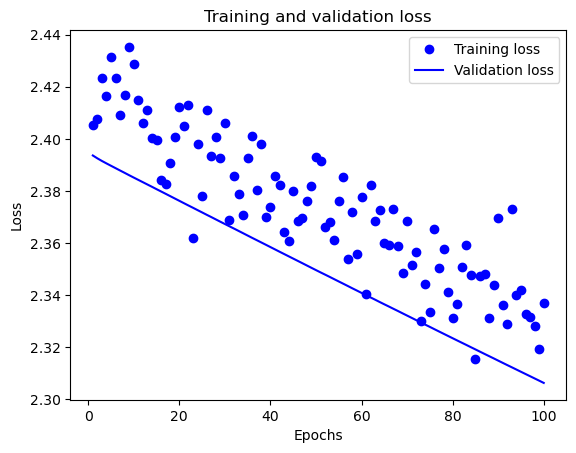

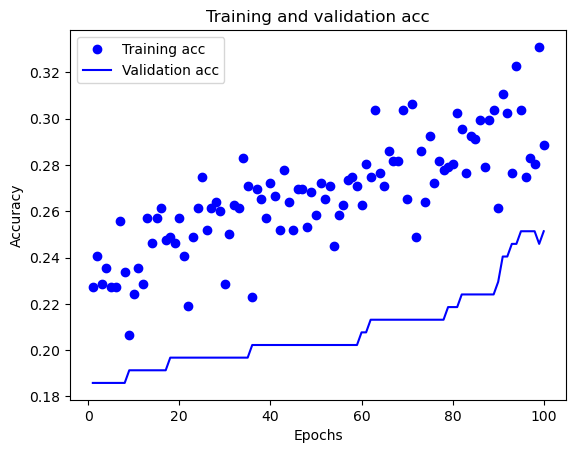

6/6 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 5, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 118ms/step - loss: 2.1540 - accuracy: 0.5609 - val_loss: 2.1438 - val_accuracy: 0.5956
Epoch 2/100
3/3 [==============================] - 0s 25ms/step - loss: 2.1562 - accuracy: 0.5650 - val_loss: 2.1430 - val_accuracy: 0.5956
Epoch 3/100
3/3 [==============================] - 0s 20ms/step - loss: 2.1487 - accuracy: 0.5746 - val_loss: 2.1422 - val_accuracy: 0.5956
Epoch 4/100
3/3 [==============================] - 0s 23ms/step - loss: 2.1480 - accuracy: 0.5663 - val_loss: 2.1416 - val_accuracy: 0.5956
Epoch 5/100
3/3 [==============================] - 0s

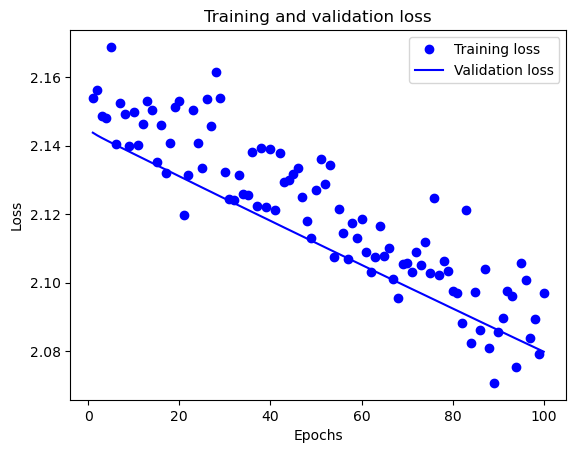

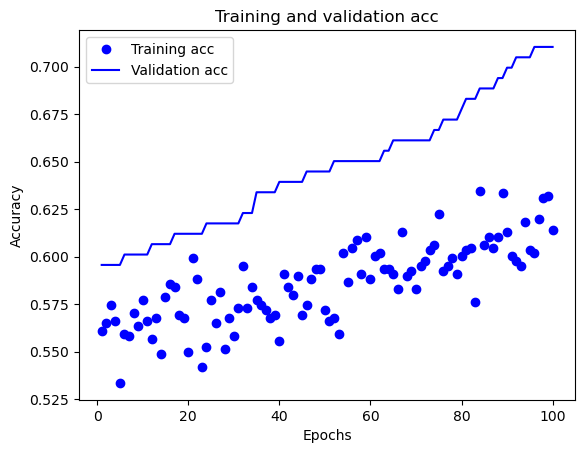

6/6 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 5, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 118ms/step - loss: 2.5087 - accuracy: 0.2230 - val_loss: 2.4912 - val_accuracy: 0.2404
Epoch 2/100
3/3 [==============================] - 0s 22ms/step - loss: 2.5144 - accuracy: 0.2312 - val_loss: 2.4900 - val_accuracy: 0.2404
Epoch 3/100
3/3 [==============================] - 0s 19ms/step - loss: 2.4928 - accuracy: 0.2312 - val_loss: 2.4890 - val_accuracy: 0.2404
Epoch 4/100
3/3 [==============================] - 0s 21ms/step - loss: 2.5168 - accuracy: 0.2285 - val_loss: 2.4880 - val_accuracy: 0.2404
Epoch 5/100
3/3 [==============================] - 0s

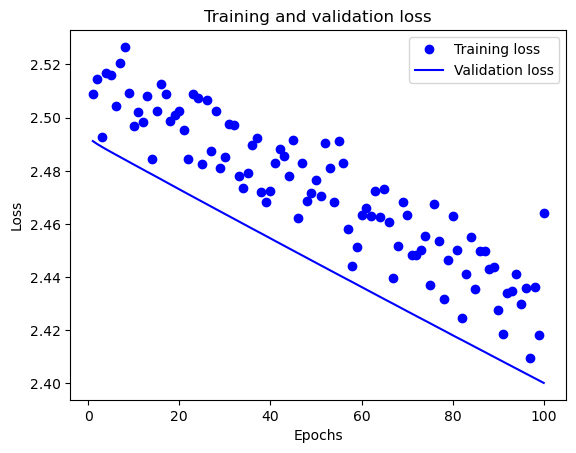

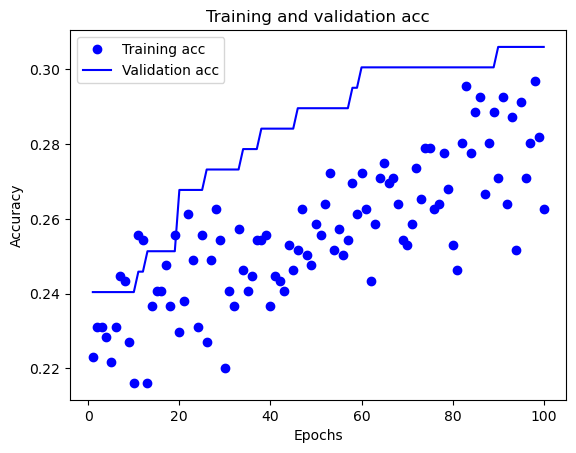

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 5, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8}
Batch size: 256
X_current_train shape: (732, 11)
y_current_train shape: (732, 3)
Epoch 1/100
3/3 [==============================] - 1s 107ms/step - loss: 2.3497 - accuracy: 0.3224 - val_loss: 2.3352 - val_accuracy: 0.1923
Epoch 2/100
3/3 [==============================] - 0s 21ms/step - loss: 2.3732 - accuracy: 0.2855 - val_loss: 2.3341 - val_accuracy: 0.1923
Epoch 3/100
3/3 [==============================] - 0s 21ms/step - loss: 2.3654 - accuracy: 0.3087 - val_loss: 2.3331 - val_accuracy: 0.1923
Epoch 4/100
3/3 [==============================] - 0s 21ms/step - loss: 2.3941 - accuracy: 0.2691 - val_loss: 2.3322 - val_accuracy: 0.1978
Epoch 5/100
3/3 [==============================] - 0s 

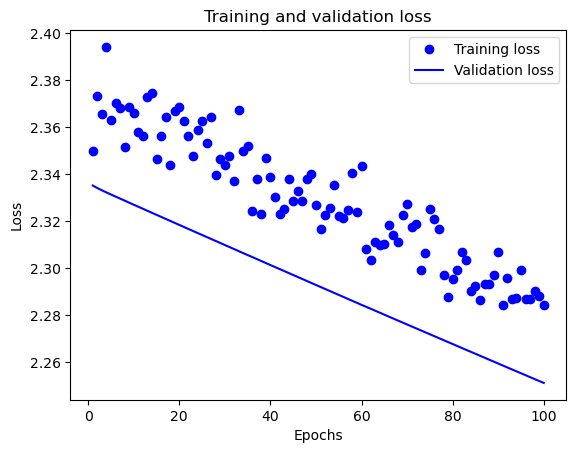

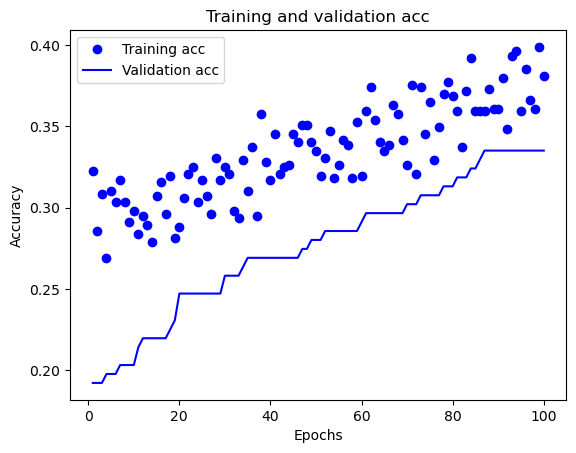

6/6 [==============================] - 0s 395us/step
Experiment number: 6
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 128
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
6/6 [==============================] - 1s 46ms/step - loss: 11.5538 - accuracy: 0.1710 - val_loss: 11.5224 - val_accuracy: 0.1475
Epoch 2/100
6/6 [==============================] - 0s 12ms/step - loss: 11.5380 - accuracy: 0.1874 - val_loss: 11.5167 - val_accuracy: 0.1475
Epoch 3/100
6/6 [==============================] - 0s 10ms/step - loss: 11.5453 - accuracy: 0.1696 - val_loss: 11.5075 - val_accuracy: 0.1475
Epoch 4/100
6/6 [==============================] - 0s 9ms/step - loss: 11.5173 - accuracy: 0.1792 - val_loss: 11.4948 - val_accuracy: 0.1585
Epoc

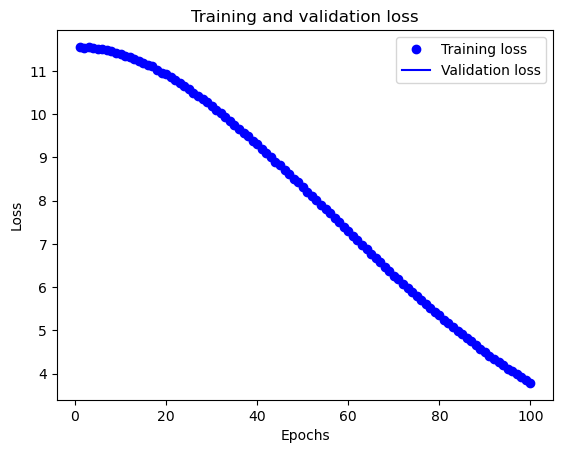

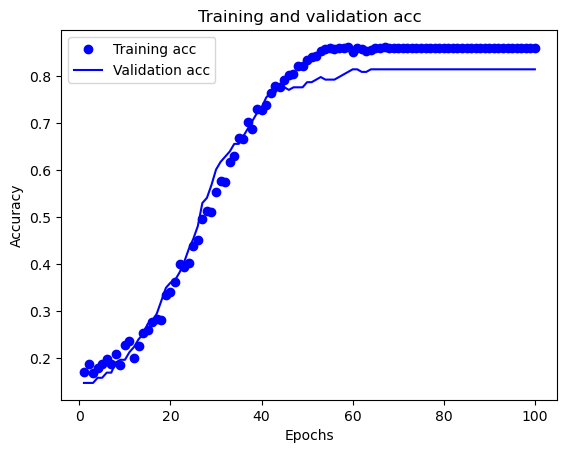

6/6 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 128
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
6/6 [==============================] - 1s 46ms/step - loss: 11.8006 - accuracy: 0.3776 - val_loss: 11.7868 - val_accuracy: 0.3880
Epoch 2/100
6/6 [==============================] - 0s 9ms/step - loss: 11.8127 - accuracy: 0.3461 - val_loss: 11.7817 - val_accuracy: 0.3934
Epoch 3/100
6/6 [==============================] - 0s 9ms/step - loss: 11.7845 - accuracy: 0.3789 - val_loss: 11.7734 - val_accuracy: 0.3934
Epoch 4/100
6/6 [==============================] - 0s 10ms/step - loss: 11.7862 - accuracy: 0.3721 - val_loss: 11.7620 - val_accuracy: 0.3934
Epoch 5/100
6/6 [===========

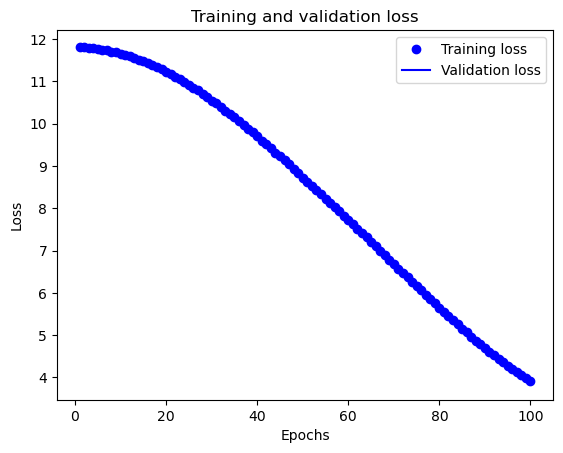

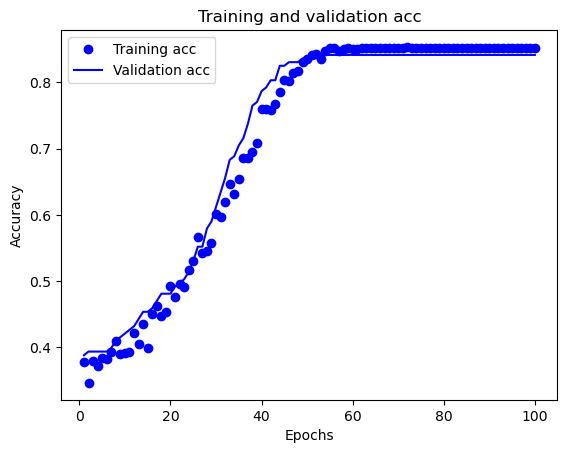

6/6 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 128
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
6/6 [==============================] - 1s 47ms/step - loss: 11.1724 - accuracy: 0.4473 - val_loss: 11.1601 - val_accuracy: 0.5137
Epoch 2/100
6/6 [==============================] - 0s 9ms/step - loss: 11.1738 - accuracy: 0.4337 - val_loss: 11.1553 - val_accuracy: 0.5137
Epoch 3/100
6/6 [==============================] - 0s 9ms/step - loss: 11.1607 - accuracy: 0.4514 - val_loss: 11.1476 - val_accuracy: 0.5137
Epoch 4/100
6/6 [==============================] - 0s 12ms/step - loss: 11.1570 - accuracy: 0.4432 - val_loss: 11.1369 - val_accuracy: 0.5137
Epoch 5/100
6/6 [===========

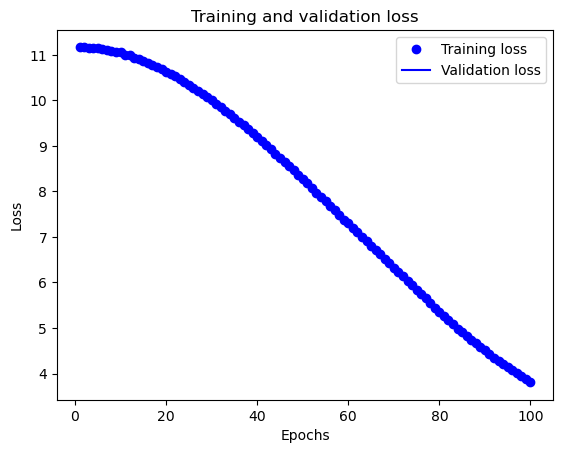

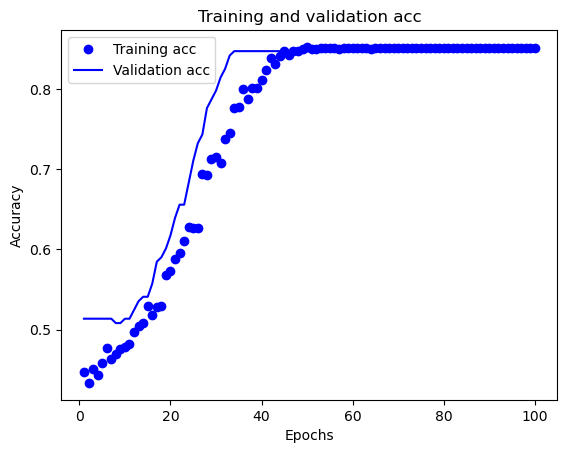

6/6 [==============================] - 0s 338us/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 128
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
6/6 [==============================] - 1s 49ms/step - loss: 11.7634 - accuracy: 0.2845 - val_loss: 11.7880 - val_accuracy: 0.2404
Epoch 2/100
6/6 [==============================] - 0s 9ms/step - loss: 11.7696 - accuracy: 0.2681 - val_loss: 11.7826 - val_accuracy: 0.2404
Epoch 3/100
6/6 [==============================] - 0s 9ms/step - loss: 11.7694 - accuracy: 0.2914 - val_loss: 11.7738 - val_accuracy: 0.2404
Epoch 4/100
6/6 [==============================] - 0s 10ms/step - loss: 11.7642 - accuracy: 0.2668 - val_loss: 11.7617 - val_accuracy: 0.2459
Epoch 5/100
6/6 [=========

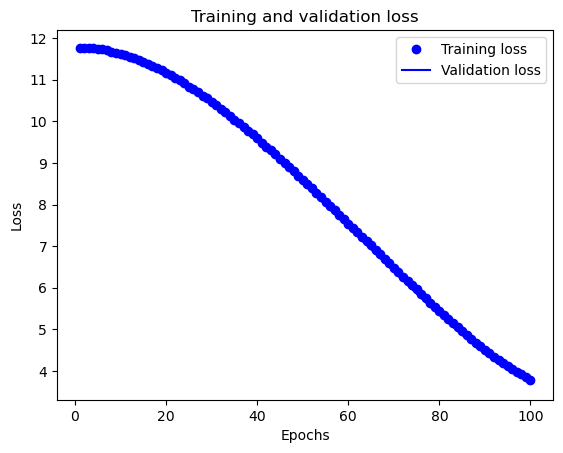

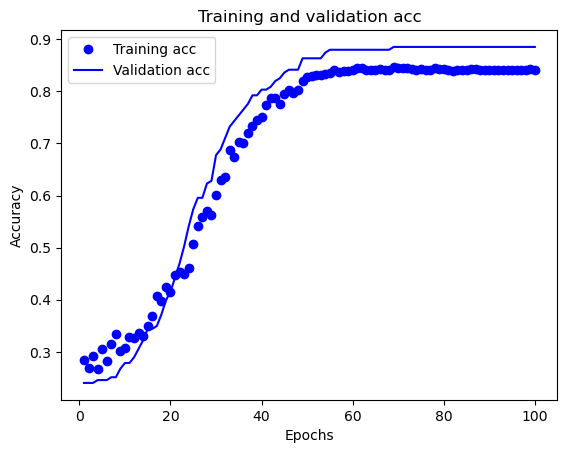

6/6 [==============================] - 0s 4ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 128
X_current_train shape: (732, 11)
y_current_train shape: (732, 3)
Epoch 1/100
6/6 [==============================] - 1s 46ms/step - loss: 10.8853 - accuracy: 0.5191 - val_loss: 10.8704 - val_accuracy: 0.5440
Epoch 2/100
6/6 [==============================] - 0s 10ms/step - loss: 10.8897 - accuracy: 0.5082 - val_loss: 10.8657 - val_accuracy: 0.5440
Epoch 3/100
6/6 [==============================] - 0s 11ms/step - loss: 10.8879 - accuracy: 0.5314 - val_loss: 10.8580 - val_accuracy: 0.5440
Epoch 4/100
6/6 [==============================] - 0s 10ms/step - loss: 10.8818 - accuracy: 0.5027 - val_loss: 10.8474 - val_accuracy: 0.5440
Epoch 5/100
6/6 [=========

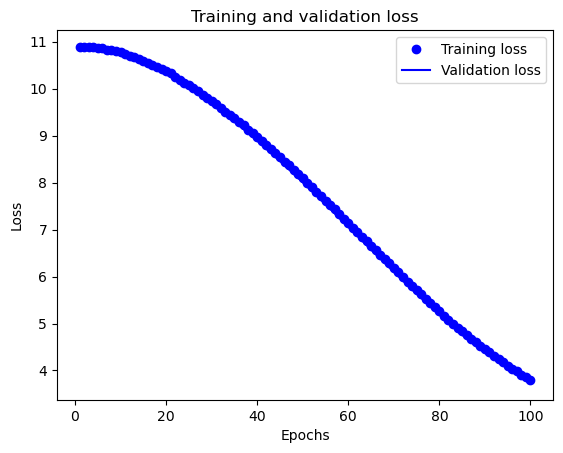

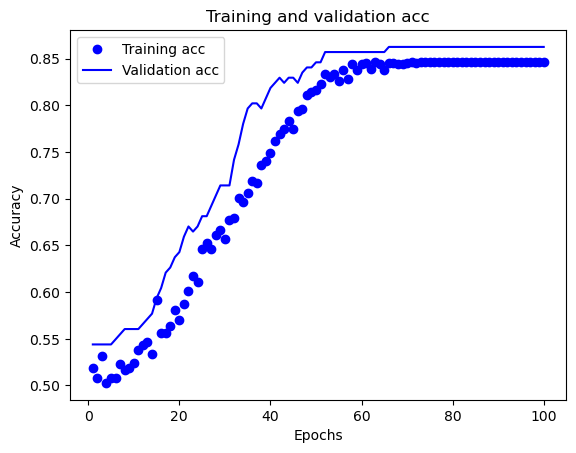

6/6 [==============================] - 0s 0s/step
Experiment number: 7
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 32, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None}
Batch size: 128
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
6/6 [==============================] - 1s 50ms/step - loss: 7.8927 - accuracy: 0.3707 - val_loss: 7.5955 - val_accuracy: 0.5246
Epoch 2/100
6/6 [==============================] - 0s 10ms/step - loss: 7.6431 - accuracy: 0.3953 - val_loss: 7.3408 - val_accuracy: 0.5574
Epoch 3/100
6/6 [==============================] - 0s 10ms/step - loss: 7.3670 - accuracy: 0.4651 - val_loss: 7.0950 - val_accuracy: 0.6175
Epoch 4/100
6/6 [==============================] - 0s 9ms/step - loss: 7.0935 - accuracy: 0.5185 - val_loss: 6.8599 - val_accuracy: 0.6175
Epoch 5/100
6/6 [==

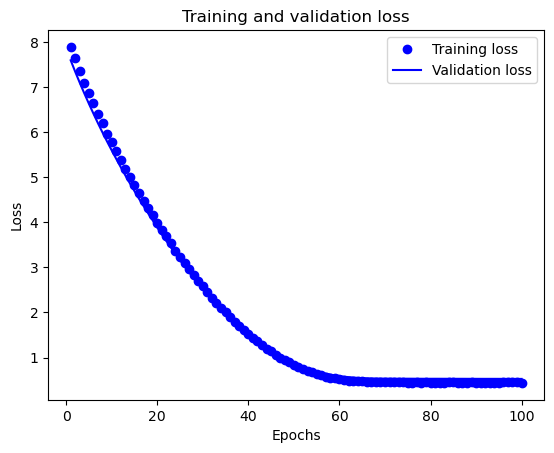

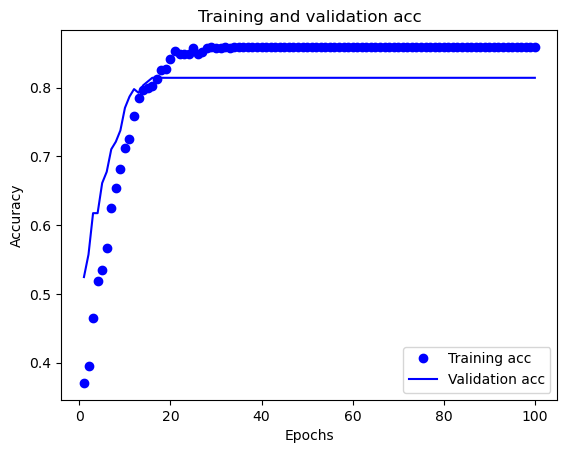

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 32, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None}
Batch size: 128
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
6/6 [==============================] - 1s 46ms/step - loss: 7.7010 - accuracy: 0.2421 - val_loss: 7.4174 - val_accuracy: 0.2732
Epoch 2/100
6/6 [==============================] - 0s 9ms/step - loss: 7.4220 - accuracy: 0.2449 - val_loss: 7.1408 - val_accuracy: 0.2896
Epoch 3/100
6/6 [==============================] - 0s 9ms/step - loss: 7.1121 - accuracy: 0.2613 - val_loss: 6.8730 - val_accuracy: 0.3388
Epoch 4/100
6/6 [==============================] - 0s 9ms/step - loss: 6.8570 - accuracy: 0.3133 - val_loss: 6.6171 - val_accuracy: 0.3989
Epoch 5/100
6/6 [=========================

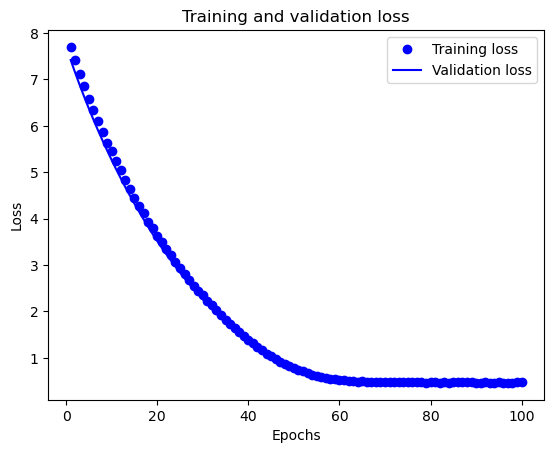

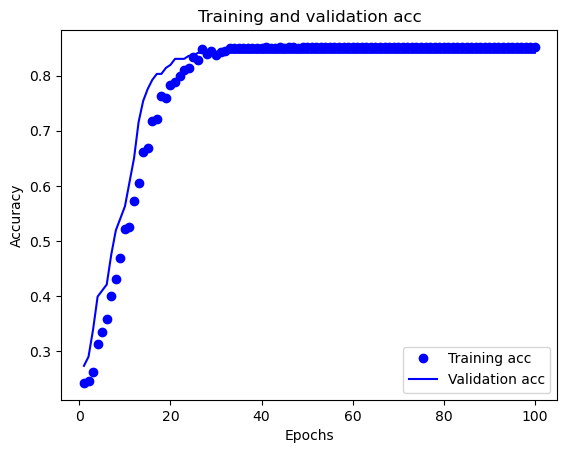

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 32, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None}
Batch size: 128
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
6/6 [==============================] - 1s 47ms/step - loss: 7.3238 - accuracy: 0.5376 - val_loss: 7.0874 - val_accuracy: 0.6120
Epoch 2/100
6/6 [==============================] - 0s 10ms/step - loss: 7.0574 - accuracy: 0.5404 - val_loss: 6.8442 - val_accuracy: 0.6667
Epoch 3/100
6/6 [==============================] - 0s 9ms/step - loss: 6.8034 - accuracy: 0.6074 - val_loss: 6.6071 - val_accuracy: 0.7268
Epoch 4/100
6/6 [==============================] - 0s 9ms/step - loss: 6.5778 - accuracy: 0.6170 - val_loss: 6.3789 - val_accuracy: 0.7705
Epoch 5/100
6/6 [========================

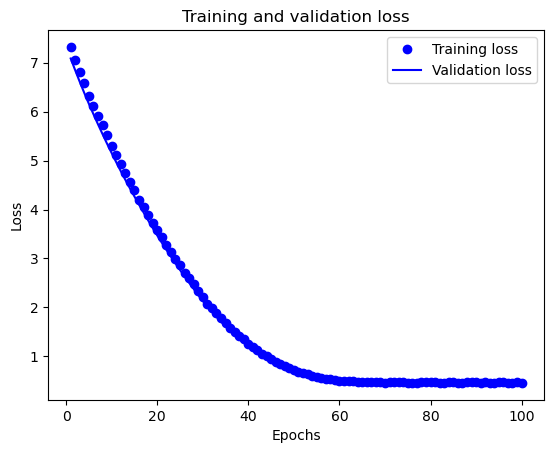

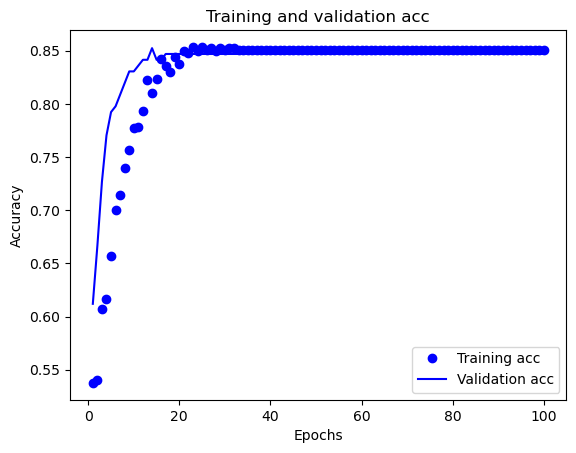

6/6 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 32, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None}
Batch size: 128
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
6/6 [==============================] - 1s 48ms/step - loss: 8.1522 - accuracy: 0.1997 - val_loss: 7.8747 - val_accuracy: 0.2186
Epoch 2/100
6/6 [==============================] - 0s 10ms/step - loss: 7.8719 - accuracy: 0.2285 - val_loss: 7.5852 - val_accuracy: 0.2678
Epoch 3/100
6/6 [==============================] - 0s 10ms/step - loss: 7.5706 - accuracy: 0.2927 - val_loss: 7.3084 - val_accuracy: 0.3333
Epoch 4/100
6/6 [==============================] - 0s 9ms/step - loss: 7.3066 - accuracy: 0.3529 - val_loss: 7.0408 - val_accuracy: 0.3770
Epoch 5/100
6/6 [======================

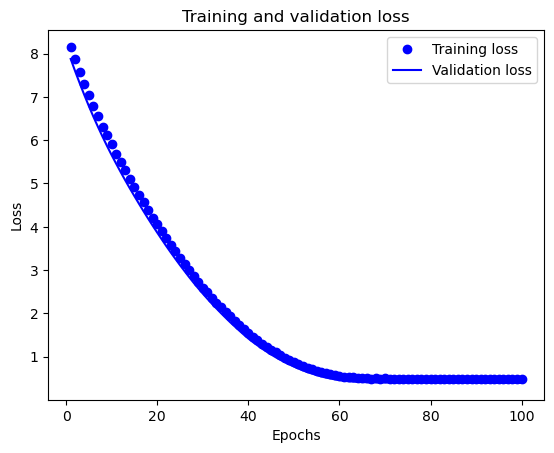

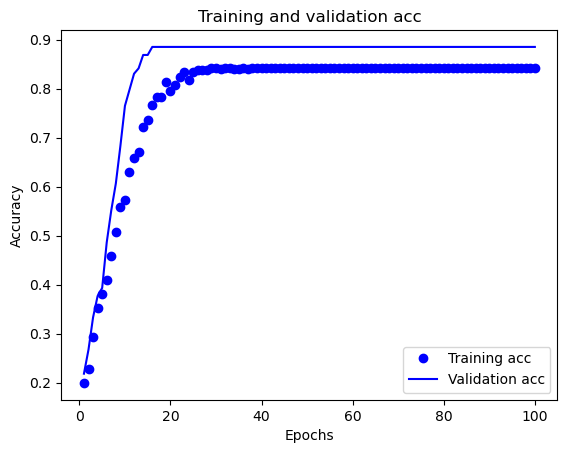

6/6 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 32, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None}
Batch size: 128
X_current_train shape: (732, 11)
y_current_train shape: (732, 3)
Epoch 1/100
6/6 [==============================] - 1s 47ms/step - loss: 8.3512 - accuracy: 0.2322 - val_loss: 8.1376 - val_accuracy: 0.2527
Epoch 2/100
6/6 [==============================] - 0s 10ms/step - loss: 8.0367 - accuracy: 0.2814 - val_loss: 7.8453 - val_accuracy: 0.3187
Epoch 3/100
6/6 [==============================] - 0s 10ms/step - loss: 7.7615 - accuracy: 0.3019 - val_loss: 7.5608 - val_accuracy: 0.3571
Epoch 4/100
6/6 [==============================] - 0s 10ms/step - loss: 7.4850 - accuracy: 0.3320 - val_loss: 7.2858 - val_accuracy: 0.3956
Epoch 5/100
6/6 [=====================

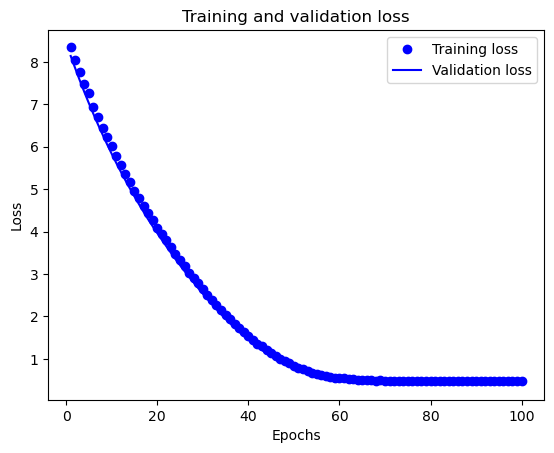

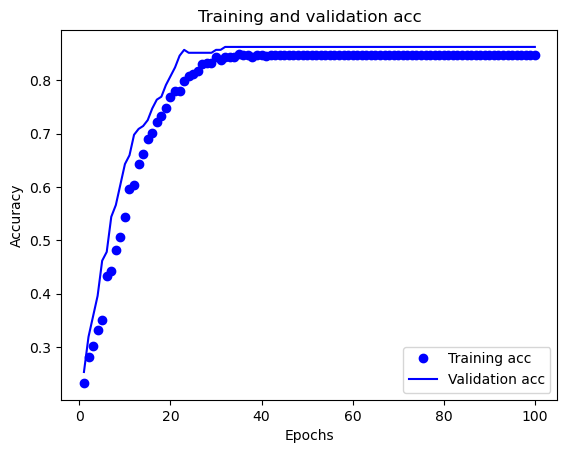

6/6 [==============================] - 0s 1ms/step
Experiment number: 8
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 2, 'hidden_units': 128, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.9995, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 111ms/step - loss: 2.7059 - accuracy: 0.4145 - val_loss: 2.6693 - val_accuracy: 0.4426
Epoch 2/100
3/3 [==============================] - 0s 25ms/step - loss: 2.6757 - accuracy: 0.4679 - val_loss: 2.6574 - val_accuracy: 0.4536
Epoch 3/100
3/3 [==============================] - 0s 20ms/step - loss: 2.6875 - accuracy: 0.4446 - val_loss: 2.6457 - val_accuracy: 0.4536
Epoch 4/100
3/3 [==============================] - 0s 21ms/step - loss: 2.6780 - accuracy: 0.4542 - val_loss: 2.6340 - val_accuracy: 0.4754
Epoch 5/100
3

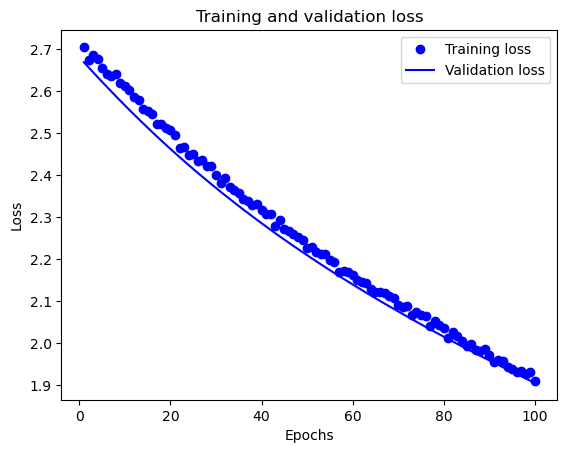

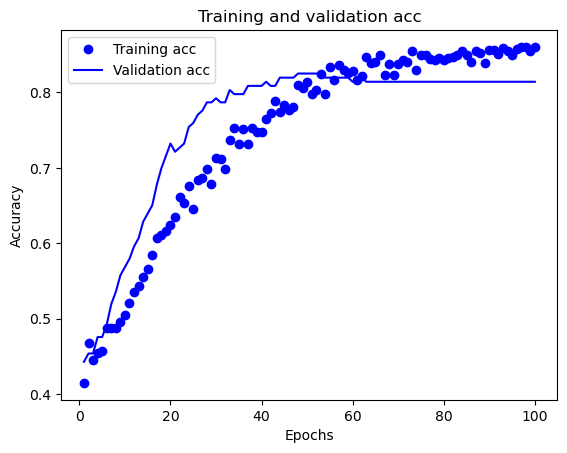

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 2, 'hidden_units': 128, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.9995, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 115ms/step - loss: 2.8085 - accuracy: 0.3680 - val_loss: 2.7400 - val_accuracy: 0.4208
Epoch 2/100
3/3 [==============================] - 0s 21ms/step - loss: 2.8137 - accuracy: 0.3584 - val_loss: 2.7275 - val_accuracy: 0.4208
Epoch 3/100
3/3 [==============================] - 0s 20ms/step - loss: 2.7888 - accuracy: 0.3707 - val_loss: 2.7152 - val_accuracy: 0.4426
Epoch 4/100
3/3 [==============================] - 0s 20ms/step - loss: 2.7772 - accuracy: 0.4131 - val_loss: 2.7029 - val_accuracy: 0.4590
Epoch 5/100
3/3 [==================

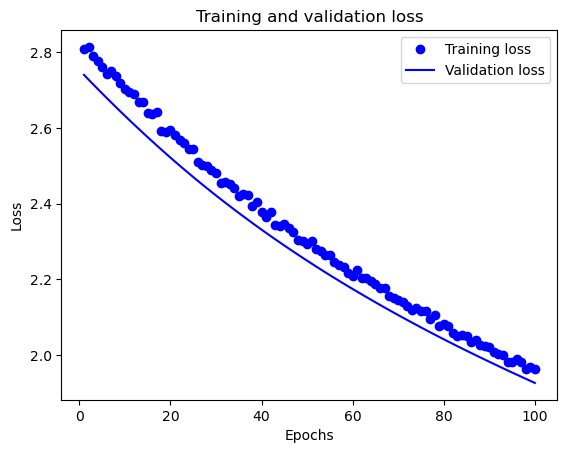

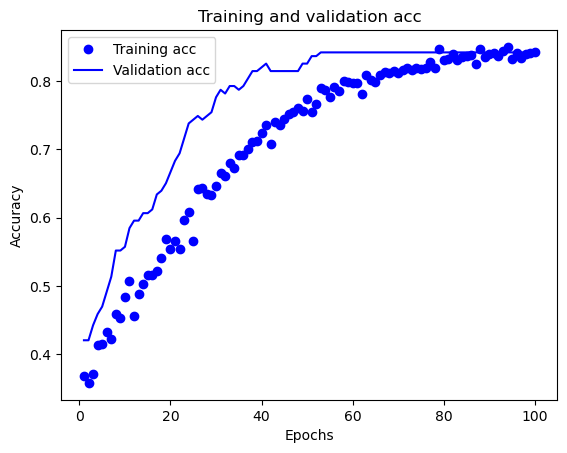

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 2, 'hidden_units': 128, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.9995, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 115ms/step - loss: 2.6255 - accuracy: 0.5787 - val_loss: 2.5904 - val_accuracy: 0.7268
Epoch 2/100
3/3 [==============================] - 0s 17ms/step - loss: 2.6000 - accuracy: 0.6101 - val_loss: 2.5796 - val_accuracy: 0.7268
Epoch 3/100
3/3 [==============================] - 0s 18ms/step - loss: 2.6102 - accuracy: 0.6033 - val_loss: 2.5689 - val_accuracy: 0.7322
Epoch 4/100
3/3 [==============================] - 0s 20ms/step - loss: 2.5961 - accuracy: 0.6197 - val_loss: 2.5584 - val_accuracy: 0.7486
Epoch 5/100
3/3 [==================

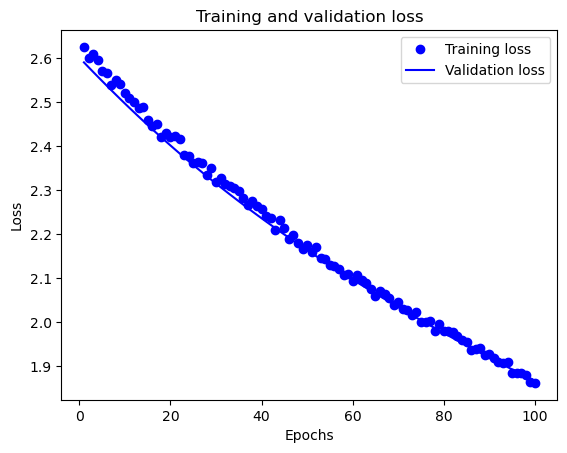

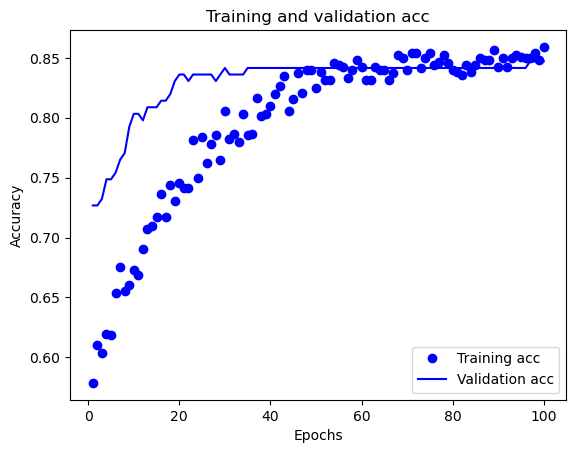

6/6 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 2, 'hidden_units': 128, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.9995, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 115ms/step - loss: 2.7702 - accuracy: 0.4802 - val_loss: 2.6970 - val_accuracy: 0.5410
Epoch 2/100
3/3 [==============================] - 0s 20ms/step - loss: 2.7538 - accuracy: 0.4870 - val_loss: 2.6850 - val_accuracy: 0.5519
Epoch 3/100
3/3 [==============================] - 0s 19ms/step - loss: 2.7419 - accuracy: 0.4788 - val_loss: 2.6731 - val_accuracy: 0.5628
Epoch 4/100
3/3 [==============================] - 0s 20ms/step - loss: 2.7483 - accuracy: 0.4843 - val_loss: 2.6614 - val_accuracy: 0.5792
Epoch 5/100
3/3 [=================

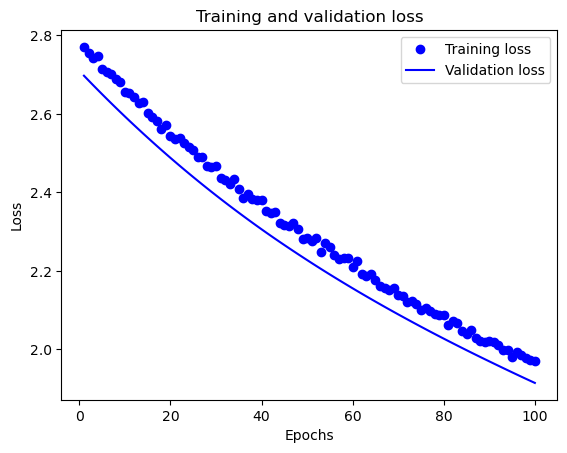

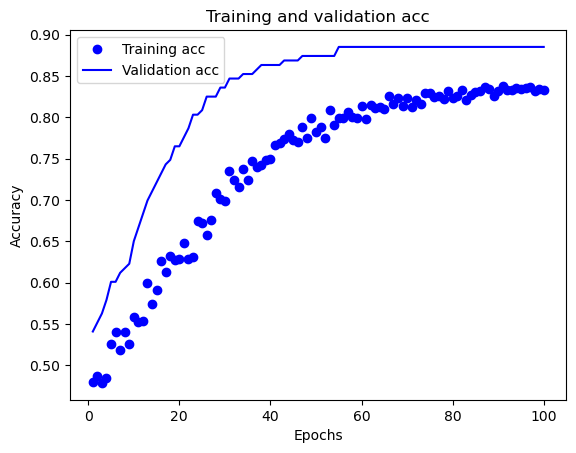

6/6 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 2, 'hidden_units': 128, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.9995, 'rho': None}
Batch size: 256
X_current_train shape: (732, 11)
y_current_train shape: (732, 3)
Epoch 1/100
3/3 [==============================] - 1s 117ms/step - loss: 2.8987 - accuracy: 0.2213 - val_loss: 2.8512 - val_accuracy: 0.1813
Epoch 2/100
3/3 [==============================] - 0s 23ms/step - loss: 2.8882 - accuracy: 0.2514 - val_loss: 2.8380 - val_accuracy: 0.1923
Epoch 3/100
3/3 [==============================] - 0s 19ms/step - loss: 2.8576 - accuracy: 0.2609 - val_loss: 2.8249 - val_accuracy: 0.2088
Epoch 4/100
3/3 [==============================] - 0s 21ms/step - loss: 2.8433 - accuracy: 0.2623 - val_loss: 2.8120 - val_accuracy: 0.2363
Epoch 5/100
3/3 [=================

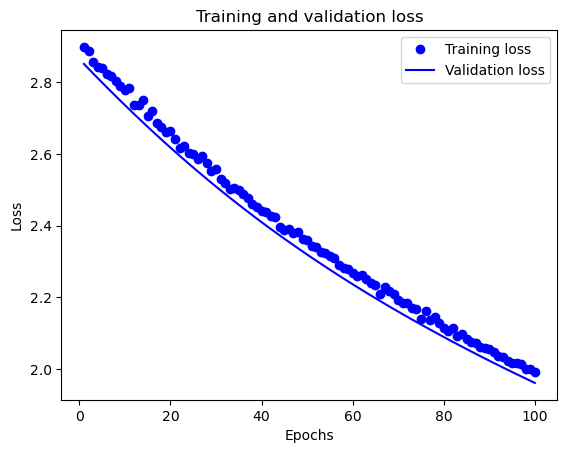

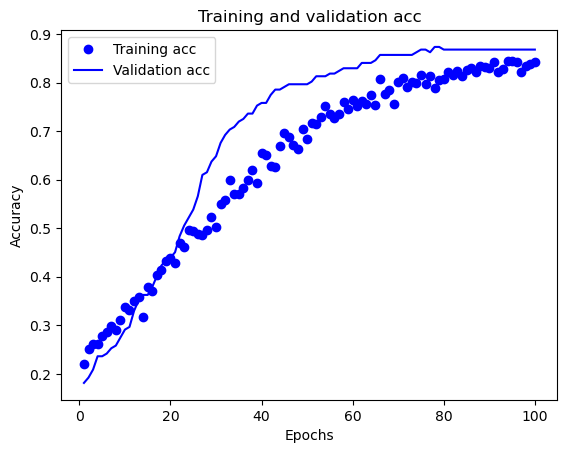

6/6 [==============================] - 0s 2ms/step
Experiment number: 9
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 223ms/step - loss: 1.4101 - accuracy: 0.3762 - val_loss: 1.1326 - val_accuracy: 0.4754
Epoch 2/100
2/2 [==============================] - 0s 36ms/step - loss: 1.2232 - accuracy: 0.4651 - val_loss: 1.0242 - val_accuracy: 0.5628
Epoch 3/100
2/2 [==============================] - 0s 30ms/step - loss: 1.1437 - accuracy: 0.5472 - val_loss: 0.9471 - val_accuracy: 0.6175
Epoch 4/100
2/2 [==============================] - 0s 37ms/step - loss: 1.0811 - accuracy: 0.5869 - val_loss: 0.8951 - val_accuracy: 0.6503
Epoch 5/100


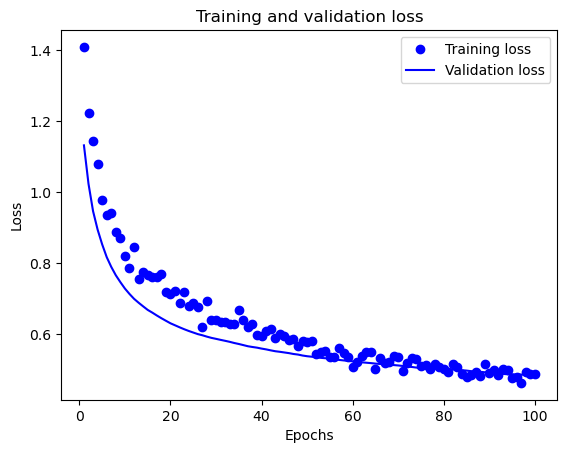

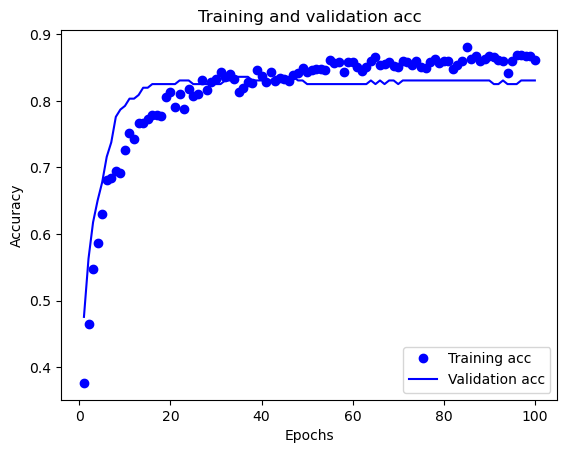

6/6 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 220ms/step - loss: 1.3813 - accuracy: 0.3912 - val_loss: 0.9899 - val_accuracy: 0.5792
Epoch 2/100
2/2 [==============================] - 0s 39ms/step - loss: 1.1547 - accuracy: 0.4897 - val_loss: 0.9001 - val_accuracy: 0.6448
Epoch 3/100
2/2 [==============================] - 0s 43ms/step - loss: 1.1104 - accuracy: 0.5212 - val_loss: 0.8342 - val_accuracy: 0.6776
Epoch 4/100
2/2 [==============================] - 0s 44ms/step - loss: 1.0063 - accuracy: 0.5663 - val_loss: 0.7858 - val_accuracy: 0.6995
Epoch 5/100
2/2 [================

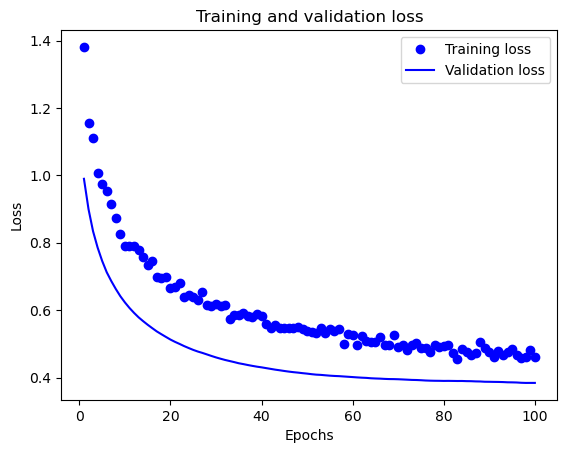

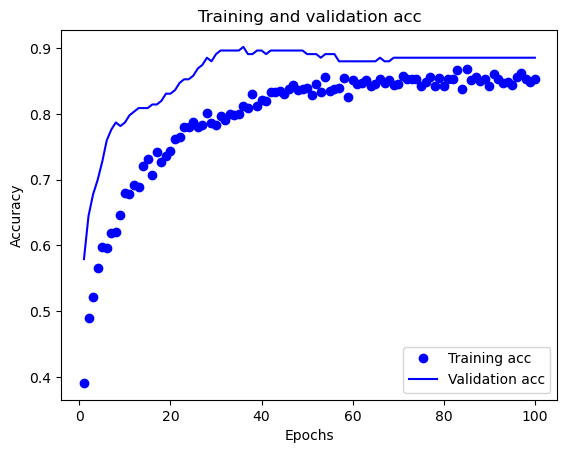

6/6 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 216ms/step - loss: 1.3043 - accuracy: 0.4501 - val_loss: 0.9538 - val_accuracy: 0.5738
Epoch 2/100
2/2 [==============================] - 0s 37ms/step - loss: 1.1351 - accuracy: 0.4884 - val_loss: 0.8789 - val_accuracy: 0.6175
Epoch 3/100
2/2 [==============================] - 0s 31ms/step - loss: 1.0371 - accuracy: 0.5280 - val_loss: 0.8257 - val_accuracy: 0.6721
Epoch 4/100
2/2 [==============================] - 0s 34ms/step - loss: 1.0236 - accuracy: 0.5636 - val_loss: 0.7830 - val_accuracy: 0.6940
Epoch 5/100
2/2 [================

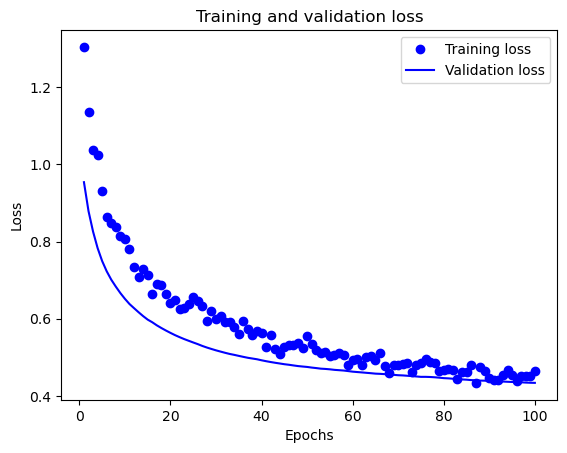

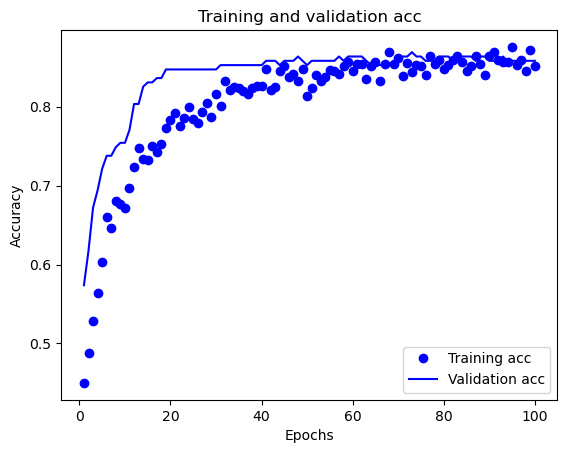

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
2/2 [==============================] - 1s 215ms/step - loss: 1.5105 - accuracy: 0.2668 - val_loss: 1.1477 - val_accuracy: 0.4426
Epoch 2/100
2/2 [==============================] - 0s 42ms/step - loss: 1.3468 - accuracy: 0.3502 - val_loss: 1.0532 - val_accuracy: 0.5191
Epoch 3/100
2/2 [==============================] - 0s 33ms/step - loss: 1.2589 - accuracy: 0.4036 - val_loss: 0.9843 - val_accuracy: 0.5683
Epoch 4/100
2/2 [==============================] - 0s 35ms/step - loss: 1.1453 - accuracy: 0.4679 - val_loss: 0.9307 - val_accuracy: 0.6120
Epoch 5/100
2/2 [=================

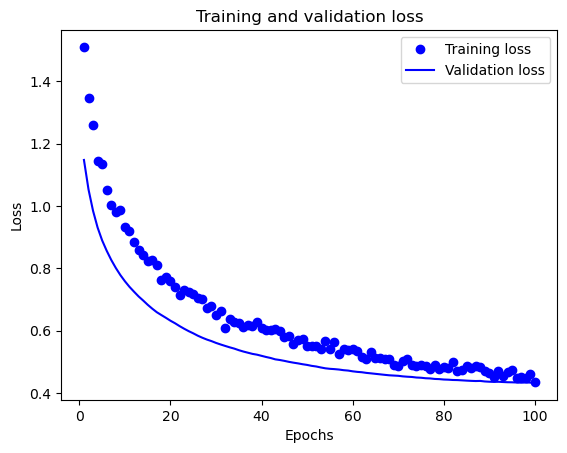

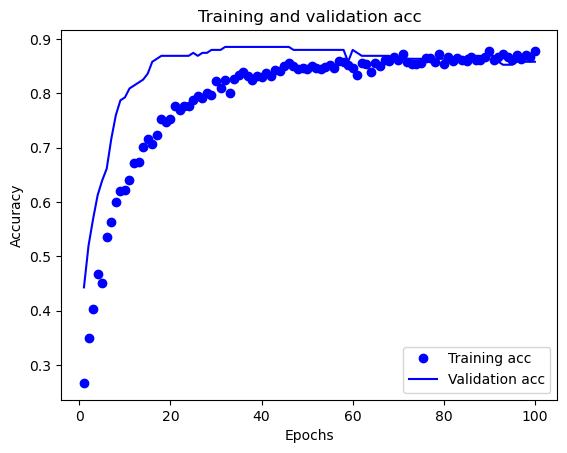

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.99}
Batch size: 512
X_current_train shape: (732, 11)
y_current_train shape: (732, 3)
Epoch 1/100
2/2 [==============================] - 1s 245ms/step - loss: 1.6885 - accuracy: 0.2527 - val_loss: 1.3705 - val_accuracy: 0.3022
Epoch 2/100
2/2 [==============================] - 0s 49ms/step - loss: 1.4307 - accuracy: 0.3238 - val_loss: 1.2372 - val_accuracy: 0.3956
Epoch 3/100
2/2 [==============================] - 0s 37ms/step - loss: 1.3529 - accuracy: 0.3484 - val_loss: 1.1509 - val_accuracy: 0.4505
Epoch 4/100
2/2 [==============================] - 0s 45ms/step - loss: 1.2269 - accuracy: 0.4085 - val_loss: 1.0856 - val_accuracy: 0.4945
Epoch 5/100
2/2 [=================

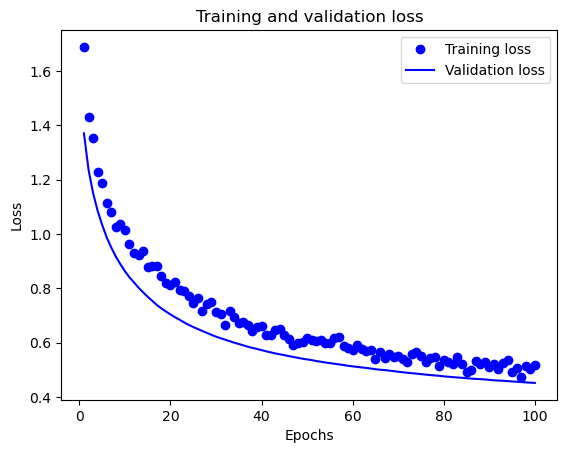

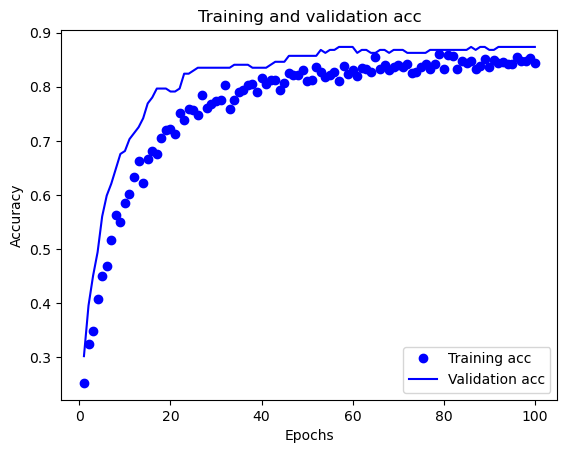

6/6 [==============================] - 0s 3ms/step
Experiment number: 10
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 8, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 129ms/step - loss: 1.5619 - accuracy: 0.2435 - val_loss: 1.5340 - val_accuracy: 0.1366
Epoch 2/100
3/3 [==============================] - 0s 21ms/step - loss: 1.5620 - accuracy: 0.2654 - val_loss: 1.5143 - val_accuracy: 0.1366
Epoch 3/100
3/3 [==============================] - 0s 21ms/step - loss: 1.5328 - accuracy: 0.2886 - val_loss: 1.4874 - val_accuracy: 0.1421
Epoch 4/100
3/3 [==============================] - 0s 16ms/step - loss: 1.5413 - accuracy: 0.2859 - val_loss: 1.4556 - val_accuracy: 0.1421
Epoch 5/100
3/3 [============

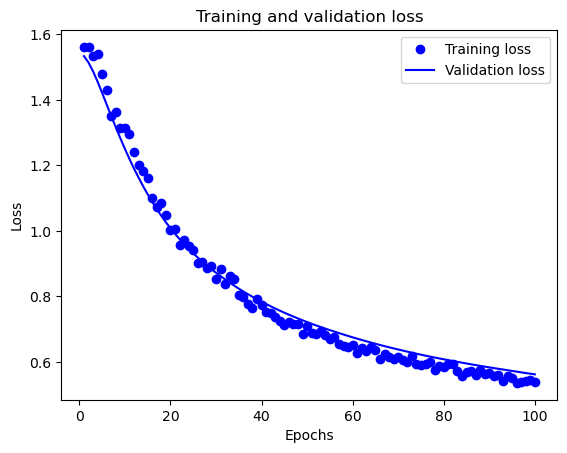

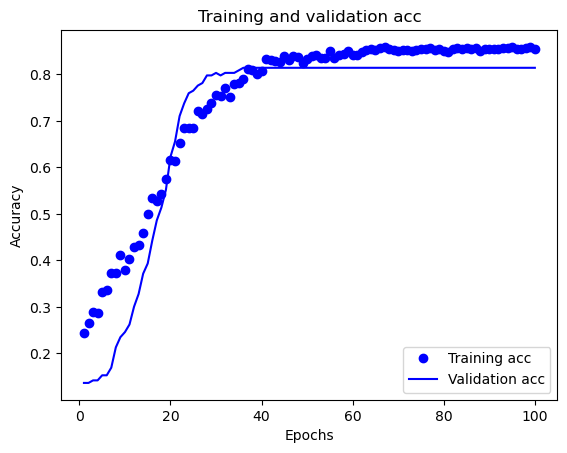

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 8, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 120ms/step - loss: 1.8138 - accuracy: 0.2900 - val_loss: 1.5986 - val_accuracy: 0.2842
Epoch 2/100
3/3 [==============================] - 0s 20ms/step - loss: 1.7267 - accuracy: 0.3119 - val_loss: 1.5690 - val_accuracy: 0.2842
Epoch 3/100
3/3 [==============================] - 0s 18ms/step - loss: 1.6965 - accuracy: 0.3023 - val_loss: 1.5286 - val_accuracy: 0.3005
Epoch 4/100
3/3 [==============================] - 0s 19ms/step - loss: 1.6153 - accuracy: 0.3570 - val_loss: 1.4822 - val_accuracy: 0.3169
Epoch 5/100
3/3 [==============================] - 0

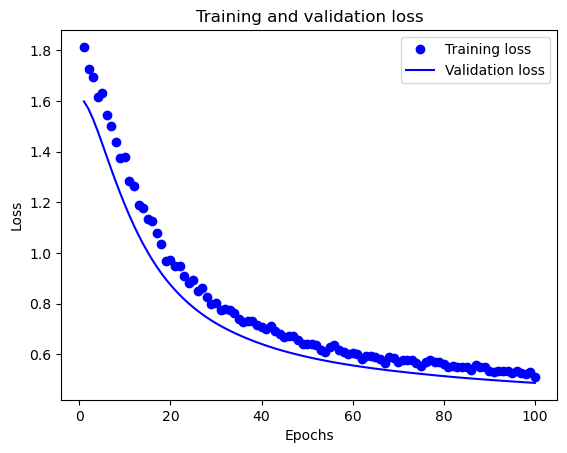

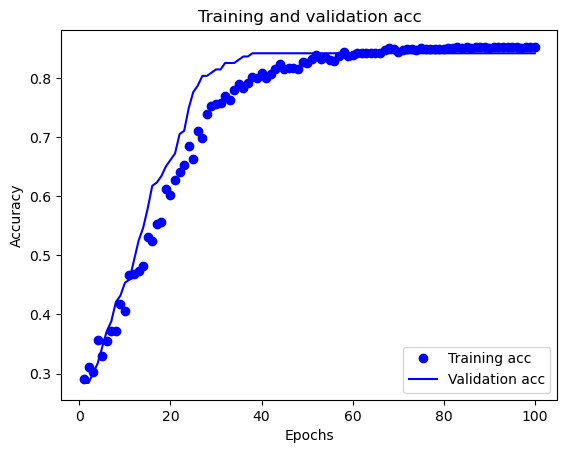

6/6 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 8, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 115ms/step - loss: 1.2415 - accuracy: 0.4583 - val_loss: 1.1704 - val_accuracy: 0.4645
Epoch 2/100
3/3 [==============================] - 0s 15ms/step - loss: 1.2116 - accuracy: 0.4979 - val_loss: 1.1556 - val_accuracy: 0.4809
Epoch 3/100
3/3 [==============================] - 0s 16ms/step - loss: 1.2008 - accuracy: 0.5075 - val_loss: 1.1352 - val_accuracy: 0.5027
Epoch 4/100
3/3 [==============================] - 0s 22ms/step - loss: 1.1578 - accuracy: 0.5404 - val_loss: 1.1113 - val_accuracy: 0.5246
Epoch 5/100
3/3 [==============================] - 

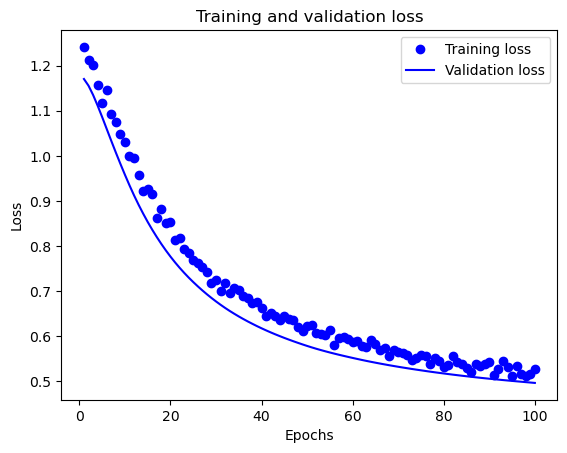

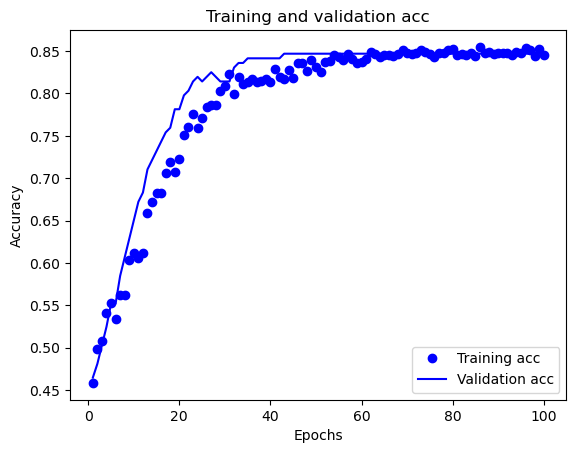

6/6 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 8, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 256
X_current_train shape: (731, 11)
y_current_train shape: (731, 3)
Epoch 1/100
3/3 [==============================] - 1s 107ms/step - loss: 1.7813 - accuracy: 0.2640 - val_loss: 1.8463 - val_accuracy: 0.2077
Epoch 2/100
3/3 [==============================] - 0s 26ms/step - loss: 1.8679 - accuracy: 0.2722 - val_loss: 1.8153 - val_accuracy: 0.2131
Epoch 3/100
3/3 [==============================] - 0s 20ms/step - loss: 1.7487 - accuracy: 0.2886 - val_loss: 1.7731 - val_accuracy: 0.2350
Epoch 4/100
3/3 [==============================] - 0s 17ms/step - loss: 1.7192 - accuracy: 0.2763 - val_loss: 1.7231 - val_accuracy: 0.2568
Epoch 5/100
3/3 [==============================] - 

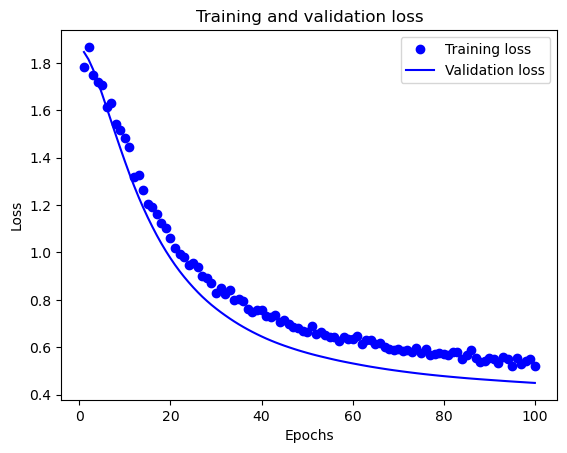

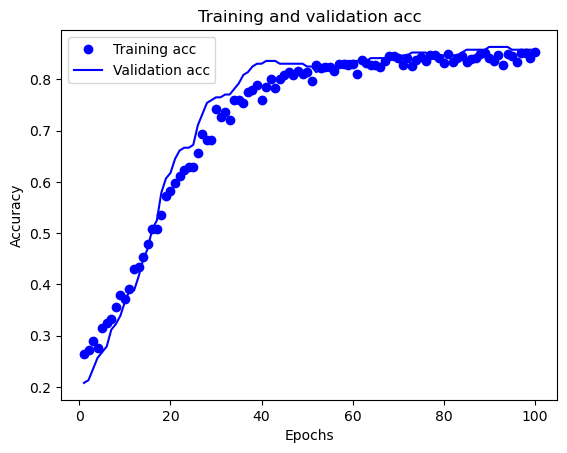

6/6 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 4, 'hidden_units': 8, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None}
Batch size: 256
X_current_train shape: (732, 11)
y_current_train shape: (732, 3)
Epoch 1/100
3/3 [==============================] - 1s 118ms/step - loss: 1.2385 - accuracy: 0.4877 - val_loss: 1.2141 - val_accuracy: 0.4286
Epoch 2/100
3/3 [==============================] - 0s 17ms/step - loss: 1.2115 - accuracy: 0.4904 - val_loss: 1.2008 - val_accuracy: 0.4505
Epoch 3/100
3/3 [==============================] - 0s 18ms/step - loss: 1.2312 - accuracy: 0.5082 - val_loss: 1.1824 - val_accuracy: 0.4505
Epoch 4/100
3/3 [==============================] - 0s 19ms/step - loss: 1.2031 - accuracy: 0.5014 - val_loss: 1.1605 - val_accuracy: 0.4615
Epoch 5/100
3/3 [==============================] - 0

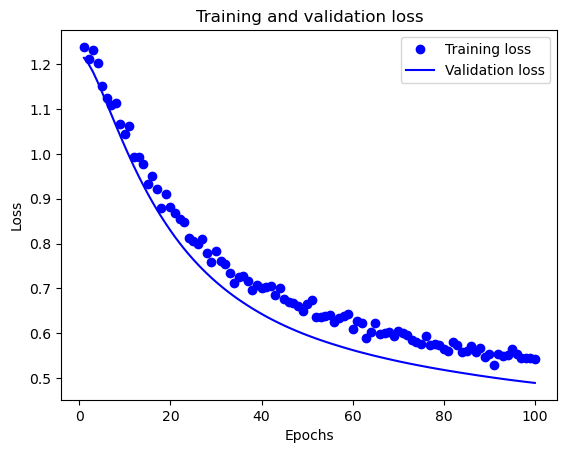

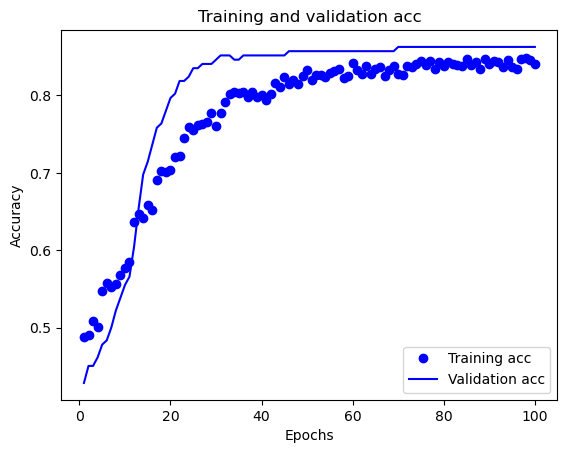

6/6 [==============================] - 0s 1ms/step
Best score: 0.8610640725394824
Best parameters: {'learning_rate': 0.001, 'hidden_layers': 2, 'hidden_units': 16, 'batch_size': 512, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'rho': 0.99}
Best model is in 10 experiment


In [64]:
n_iter = 10
best_score = 0
best_params = {}

for i in range(n_iter):
    print(f"Experiment number: {i+1}")
    sampled_params = {k: np.random.choice(list(v)) for k,v in param_space.items()} # use random search
    model_params = {k:v for k, v in sampled_params.items() if k != 'batch_size'}
    if model_params['optimizer'] != 'momentum':
        model_params['momentum'] = None
    if model_params['optimizer'] != 'Adam':
        model_params['adam_beta_1'] = None
        model_params['adam_beta_2'] = None
    if model_params['optimizer'] != 'RMSprop':
        model_params['rho'] = None

    cv_scores = []
    for train_index, val_index in cross_validator.split(X_train): # I am confused about the data splits here, asked GPT4, accessed on Jan 27th
        X_current_train, X_val = X_train[train_index], X_train[val_index]
        y_current_train, y_val = y_train[train_index], y_train[val_index]
        model = create_model(**model_params)
        print("Model parameters:", model_params)
        print("Batch size:", sampled_params['batch_size'])
        print("X_current_train shape:", X_current_train.shape)
        print("y_current_train shape:", y_current_train.shape)
        history = model.fit(
            X_current_train, y_current_train, 
            epochs=100, 
            batch_size=sampled_params['batch_size'],
            verbose=1,
            validation_data=(X_val, y_val)
        )
        plot_loss(history)
        plot_accuracy(history)
        y_val_pred = model.predict(X_val) # the evaluation and scoring part, I am not sure which libraries to use. Asked GPT4, accessed on Jan 27th
        y_val_pred_classes = np.argmax(y_val_pred, axis=1)
        y_true_classes = np.argmax(y_val, axis=1)
        
        scoring = accuracy_score(y_true_classes, y_val_pred_classes)
        cv_scores.append(scoring)
    mean_cv_scores = np.mean(cv_scores)
        
    if mean_cv_scores > best_score:
        best_score = mean_cv_scores
        if sampled_params['optimizer'] == 'momentum':
            sampled_params['adam_beta_1'] = None
            sampled_params['adam_beta_2'] = None
            sampled_params['rho'] = None
        if sampled_params['optimizer'] == 'RMSprop':
            sampled_params['adam_beta_1'] = None
            sampled_params['adam_beta_2'] = None
            sampled_params['momentum'] = None
        if sampled_params['optimizer'] == 'Adam':
            sampled_params['momentum'] = None
            sampled_params['rho'] = None
        best_params = {k: v for k, v in sampled_params.items() if v is not None}
               
print("Best score:", best_score)
print("Best parameters:", best_params)
print(f"Best model is in {i+1} experiment")

### Experiment 1 Result Analysis
The provided best score indicates a good level of accuracy; however, it shows a sign of overfitting. T If the model's accuracy on the training santly higher than its accuracy on the validatio.nte mmy's ability to geneI will

In your next experiment, you can implement batch normalization by addmodeltion layers i. It is normallyural neDenseure, typand y after fully connected layers buAnd I will functions). It is also advisable to monitor both training and validation metrics closely to determine if batch normalization helps in reducing the gap between training and validation performance, which would be a good indicator of mitigated overfitting.

## Step 6: Scale up — Experiment 2: Kfold = 10, batch_normalization
In the next experiment, I will add batch normalization function. 
* Batch Normalization: True, False
Batch normalization is a technique to provide any layer in a neural network with inputs that are zero mean/unit variance, which helps to stabilize the training process.

In [65]:
n_splits=10
cross_validator = KFold(n_splits=n_splits, shuffle=True, random_state=42)

def create_model(hidden_units, hidden_layers, optimizer, dropout_rate, l1, l2, learning_rate, adam_beta_1=None, adam_beta_2=None, momentum=None, learning_rate_decay=None, rho=None, batch_norm=False):
    model = models.Sequential()
    model.add(layers.Dense(hidden_units, activation='relu', input_shape=(11,), kernel_regularizer=regularizers.l1_l2(l1=l1, l2=l2)))
    if batch_norm == True:
        model.add(layers.BatchNormalization())
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(3, activation='softmax'))
    
    if optimizer == 'Adam':
        if adam_beta_1 is not None and adam_beta_2 is not None:
            optimizer = Adam(learning_rate=learning_rate, beta_1=adam_beta_1, beta_2=adam_beta_2)
    elif optimizer == 'RMSprop':
        optimizer = RMSprop(learning_rate=learning_rate, rho=rho)
    elif optimizer == 'momentum':
        optimizer = SGD(learning_rate=learning_rate, momentum=momentum)
    else:
        raise ValueError("Unknown optimizer")
    # I am not sure how to handle the parameter of different optimizers. I asked GPT4 about it, GPT4 paid version, accessed on Jan 25th.
        
    model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model

In [66]:
learning_rate = [
    10 ** -i for i in range(1, 6)
]
hidden_layers = [
    1, 2, 3, 4, 5,
]
hidden_units = [
    8, 16, 32, 64, 128, 256,
]
batch_size = [
    128, 256, 512,
]
optimizer = [
    'momentum', 'RMSprop', 'Adam',
]
dropout_rate = [0.2, 0.3, 0.4,]

l1=[0.001, 0.01, 0.1,]
l2=[0.001, 0.01, 0.1,]

momentum = [
    0.8, 0.9, 0.99, 0.999,
]
learning_rate_decay = [lr/100 for lr in learning_rate]

rho = [0.8, 0.9, 0.99]

adam_beta_1 = [0.9, 0.95]
adam_beta_2 = [0.999, 0.9995]

batch_norm = [True, False]

param_space = {
    'learning_rate': learning_rate,
    'hidden_layers': hidden_layers,
    'hidden_units': hidden_units,
    'batch_size': batch_size,
    'learning_rate_decay': learning_rate_decay,
    'optimizer': optimizer,
    'l1': l1,
    'l2': l2,
    'dropout_rate': dropout_rate,
    'momentum': momentum if 'momentum' in optimizer else [None],
    'adam_beta_1': adam_beta_1 if 'Adam' in optimizer else [None],
    'adam_beta_2': adam_beta_2 if 'Adam' in optimizer else [None],
    'rho': rho if 'RMSprop' in optimizer else [None],
    'batch_norm': batch_norm,
}

Experiment number: 1
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 261ms/step - loss: 1.9773 - accuracy: 0.3613 - val_loss: 1.5196 - val_accuracy: 0.4457
Epoch 2/100
2/2 [==============================] - 0s 44ms/step - loss: 1.9989 - accuracy: 0.3358 - val_loss: 1.5157 - val_accuracy: 0.4457
Epoch 3/100
2/2 [==============================] - 0s 46ms/step - loss: 1.9881 - accuracy: 0.3540 - val_loss: 1.5118 - val_accuracy: 0.4565
Epoch 4/100
2/2 [==============================] - 0s 44ms/step - loss: 1.9547 - accuracy: 0.3589 - val_loss: 1.5079 - val_accuracy: 0.4783
Epoch 5/100
2/2 [==============================] - 0s 54ms/st

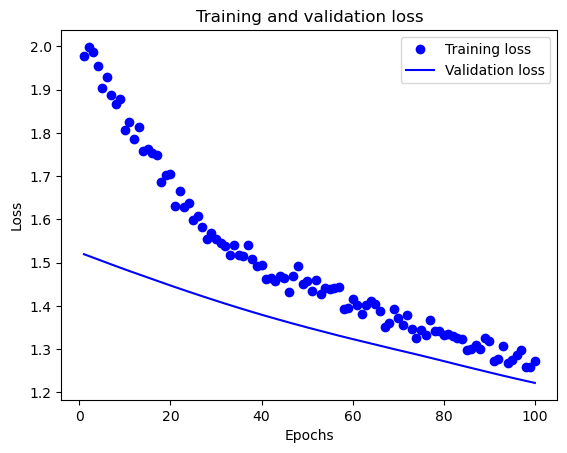

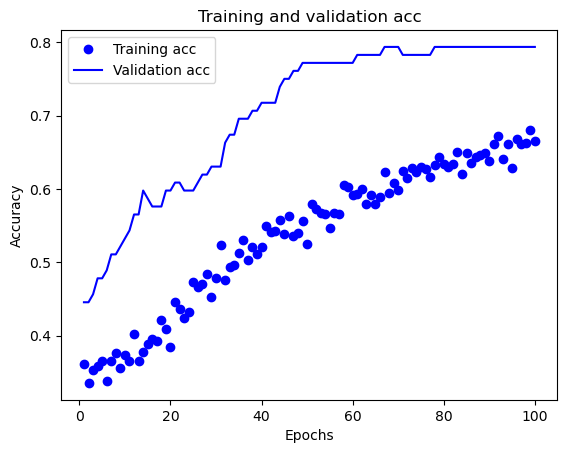

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 233ms/step - loss: 2.1902 - accuracy: 0.3248 - val_loss: 1.6922 - val_accuracy: 0.1630
Epoch 2/100
2/2 [==============================] - 0s 44ms/step - loss: 2.1261 - accuracy: 0.3443 - val_loss: 1.6847 - val_accuracy: 0.1630
Epoch 3/100
2/2 [==============================] - 0s 44ms/step - loss: 2.0799 - accuracy: 0.3662 - val_loss: 1.6774 - val_accuracy: 0.1522
Epoch 4/100
2/2 [==============================] - 0s 45ms/step - loss: 2.0399 - accuracy: 0.3723 - val_loss: 1.6701 - val_accuracy: 0.1630
Epoch 5/100
2/2 [===============

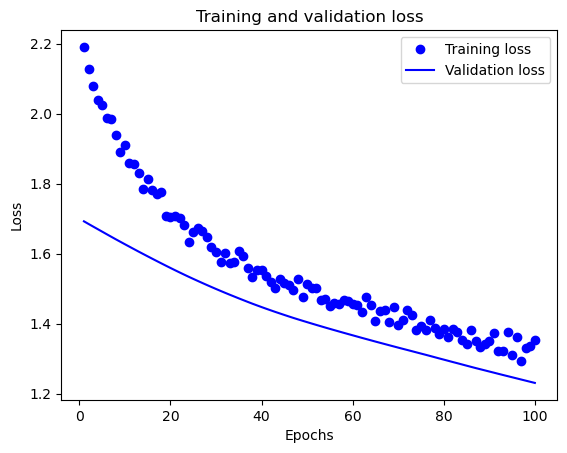

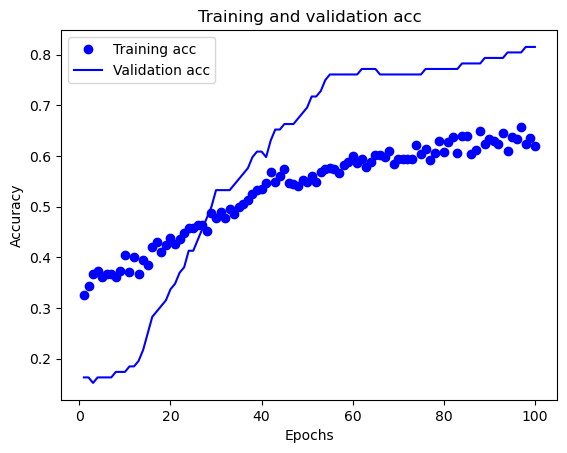

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 254ms/step - loss: 2.1555 - accuracy: 0.3187 - val_loss: 1.7397 - val_accuracy: 0.1196
Epoch 2/100
2/2 [==============================] - 0s 47ms/step - loss: 2.1263 - accuracy: 0.3102 - val_loss: 1.7312 - val_accuracy: 0.1196
Epoch 3/100
2/2 [==============================] - 0s 50ms/step - loss: 2.0708 - accuracy: 0.3358 - val_loss: 1.7228 - val_accuracy: 0.1196
Epoch 4/100
2/2 [==============================] - 0s 49ms/step - loss: 2.0849 - accuracy: 0.3090 - val_loss: 1.7145 - val_accuracy: 0.1087
Epoch 5/100
2/2 [===============

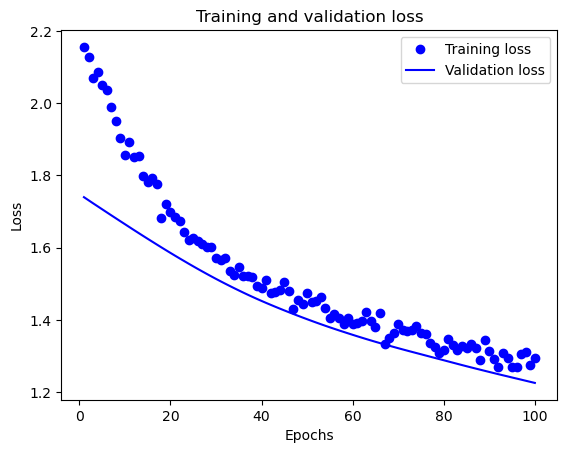

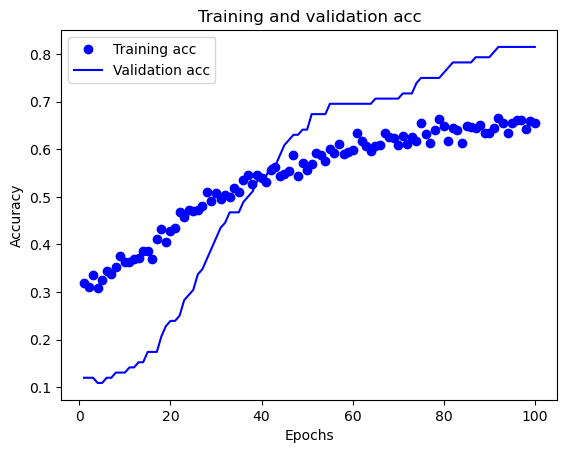

3/3 [==============================] - 0s 4ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 252ms/step - loss: 2.0529 - accuracy: 0.2774 - val_loss: 1.3232 - val_accuracy: 0.8370
Epoch 2/100
2/2 [==============================] - 0s 47ms/step - loss: 2.0095 - accuracy: 0.2725 - val_loss: 1.3219 - val_accuracy: 0.8370
Epoch 3/100
2/2 [==============================] - 0s 52ms/step - loss: 1.9820 - accuracy: 0.2859 - val_loss: 1.3205 - val_accuracy: 0.8370
Epoch 4/100
2/2 [==============================] - 0s 50ms/step - loss: 1.9644 - accuracy: 0.2762 - val_loss: 1.3191 - val_accuracy: 0.8370
Epoch 5/100
2/2 [==============

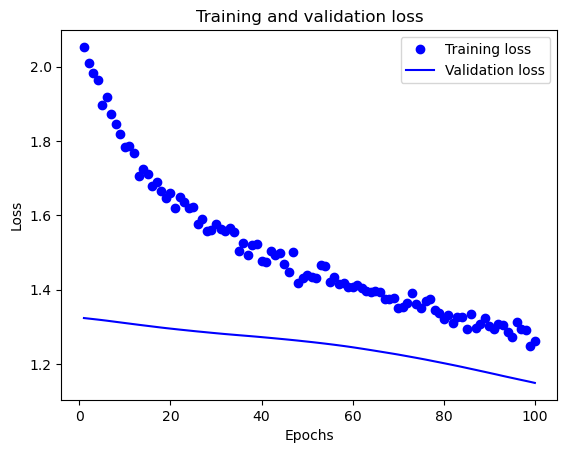

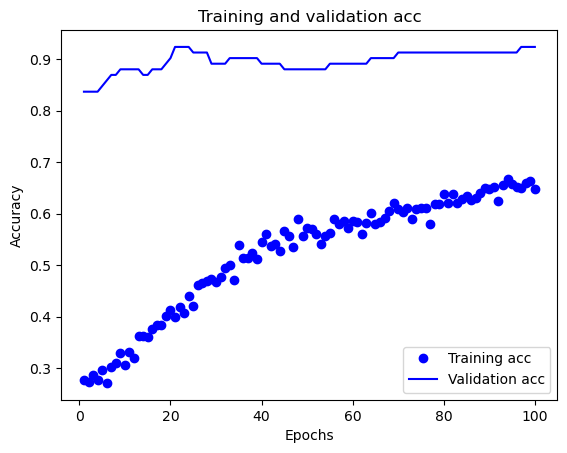

3/3 [==============================] - 0s 5ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 258ms/step - loss: 2.1164 - accuracy: 0.3900 - val_loss: 1.5681 - val_accuracy: 0.2637
Epoch 2/100
2/2 [==============================] - 0s 45ms/step - loss: 2.0268 - accuracy: 0.4034 - val_loss: 1.5629 - val_accuracy: 0.2637
Epoch 3/100
2/2 [==============================] - 0s 44ms/step - loss: 1.9817 - accuracy: 0.3998 - val_loss: 1.5579 - val_accuracy: 0.2857
Epoch 4/100
2/2 [==============================] - 0s 43ms/step - loss: 2.0155 - accuracy: 0.4265 - val_loss: 1.5530 - val_accuracy: 0.3077
Epoch 5/100
2/2 [==============

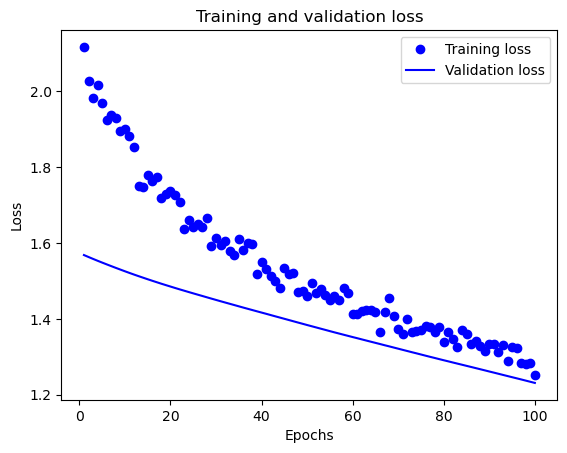

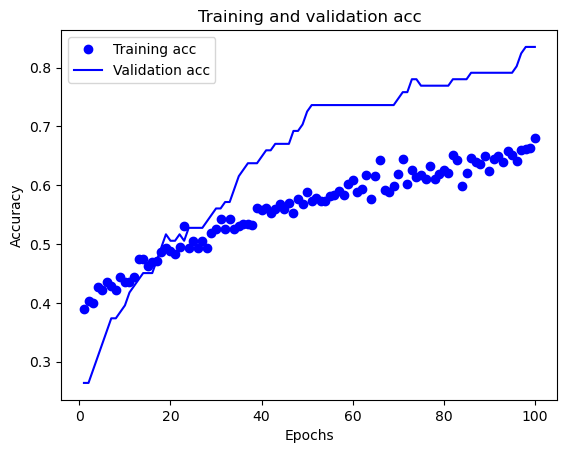

3/3 [==============================] - 0s 722us/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 225ms/step - loss: 2.1183 - accuracy: 0.3086 - val_loss: 1.3800 - val_accuracy: 0.6374
Epoch 2/100
2/2 [==============================] - 0s 52ms/step - loss: 2.0539 - accuracy: 0.3244 - val_loss: 1.3785 - val_accuracy: 0.6484
Epoch 3/100
2/2 [==============================] - 0s 38ms/step - loss: 2.0395 - accuracy: 0.3378 - val_loss: 1.3769 - val_accuracy: 0.6593
Epoch 4/100
2/2 [==============================] - 0s 36ms/step - loss: 2.0268 - accuracy: 0.3414 - val_loss: 1.3755 - val_accuracy: 0.6703
Epoch 5/100
2/2 [============

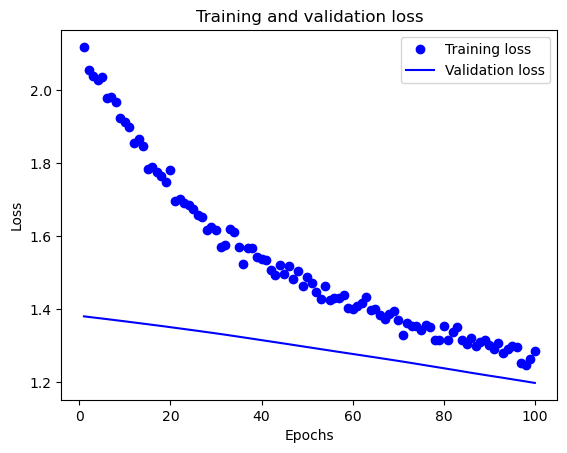

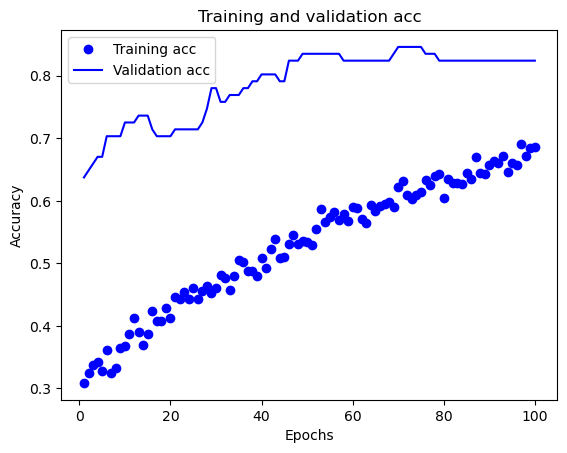

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 251ms/step - loss: 2.0285 - accuracy: 0.4095 - val_loss: 1.6862 - val_accuracy: 0.1209
Epoch 2/100
2/2 [==============================] - 0s 28ms/step - loss: 2.0501 - accuracy: 0.3973 - val_loss: 1.6795 - val_accuracy: 0.1209
Epoch 3/100
2/2 [==============================] - 0s 51ms/step - loss: 1.9795 - accuracy: 0.4010 - val_loss: 1.6727 - val_accuracy: 0.1209
Epoch 4/100
2/2 [==============================] - 0s 51ms/step - loss: 1.8918 - accuracy: 0.4277 - val_loss: 1.6660 - val_accuracy: 0.1209
Epoch 5/100
2/2 [===============

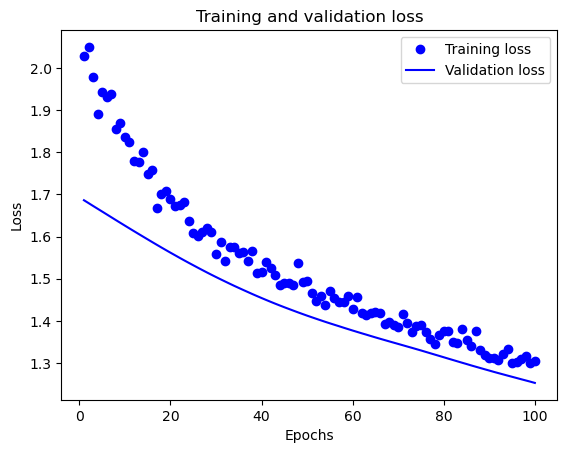

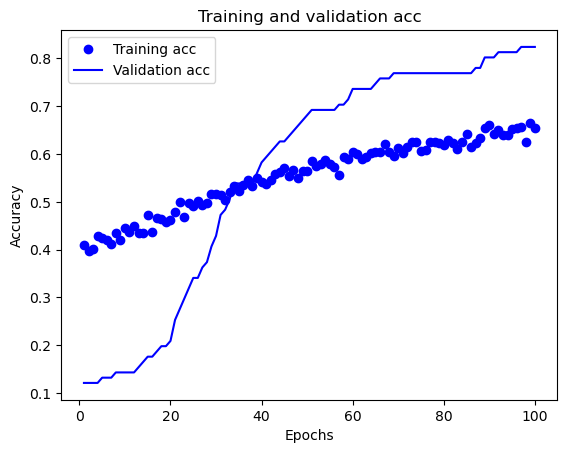

3/3 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 263ms/step - loss: 1.7996 - accuracy: 0.3609 - val_loss: 1.5682 - val_accuracy: 0.2527
Epoch 2/100
2/2 [==============================] - 0s 86ms/step - loss: 1.8042 - accuracy: 0.3633 - val_loss: 1.5656 - val_accuracy: 0.2747
Epoch 3/100
2/2 [==============================] - 0s 45ms/step - loss: 1.7844 - accuracy: 0.3426 - val_loss: 1.5630 - val_accuracy: 0.2857
Epoch 4/100
2/2 [==============================] - 0s 48ms/step - loss: 1.7500 - accuracy: 0.3597 - val_loss: 1.5606 - val_accuracy: 0.3187
Epoch 5/100
2/2 [==============

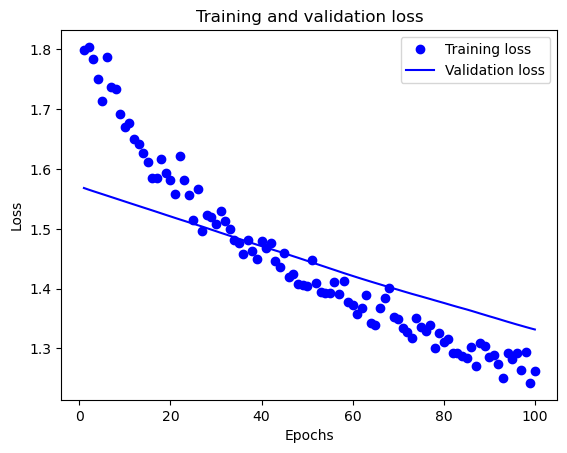

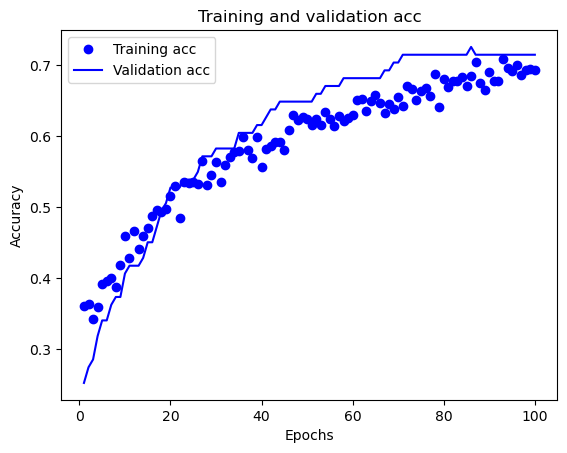

3/3 [==============================] - 0s 270us/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 266ms/step - loss: 2.1488 - accuracy: 0.2539 - val_loss: 1.3601 - val_accuracy: 0.8352
Epoch 2/100
2/2 [==============================] - 0s 53ms/step - loss: 2.1320 - accuracy: 0.2479 - val_loss: 1.3590 - val_accuracy: 0.8352
Epoch 3/100
2/2 [==============================] - 0s 37ms/step - loss: 2.1138 - accuracy: 0.2612 - val_loss: 1.3581 - val_accuracy: 0.8462
Epoch 4/100
2/2 [==============================] - 0s 37ms/step - loss: 2.1226 - accuracy: 0.2637 - val_loss: 1.3572 - val_accuracy: 0.8352
Epoch 5/100
2/2 [============

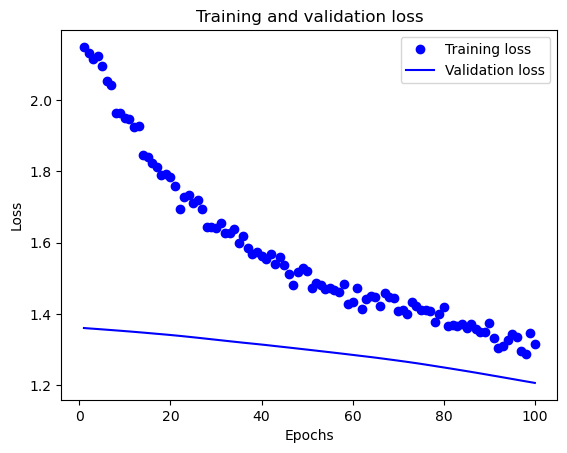

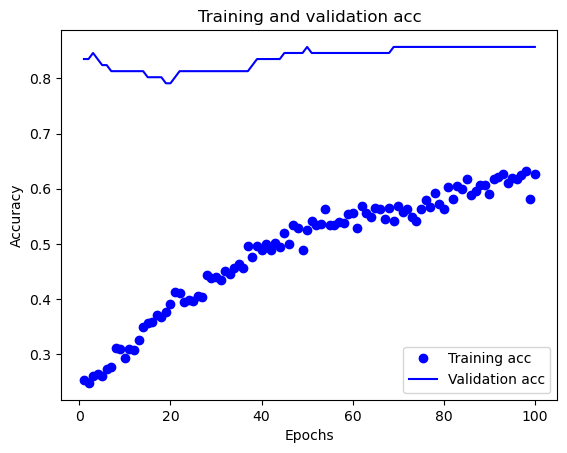

3/3 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 247ms/step - loss: 2.1543 - accuracy: 0.2661 - val_loss: 1.4816 - val_accuracy: 0.3077
Epoch 2/100
2/2 [==============================] - 0s 44ms/step - loss: 2.1077 - accuracy: 0.2807 - val_loss: 1.4782 - val_accuracy: 0.3297
Epoch 3/100
2/2 [==============================] - 0s 46ms/step - loss: 2.0497 - accuracy: 0.3123 - val_loss: 1.4748 - val_accuracy: 0.3516
Epoch 4/100
2/2 [==============================] - 0s 41ms/step - loss: 2.1039 - accuracy: 0.2673 - val_loss: 1.4713 - val_accuracy: 0.3626
Epoch 5/100
2/2 [==============

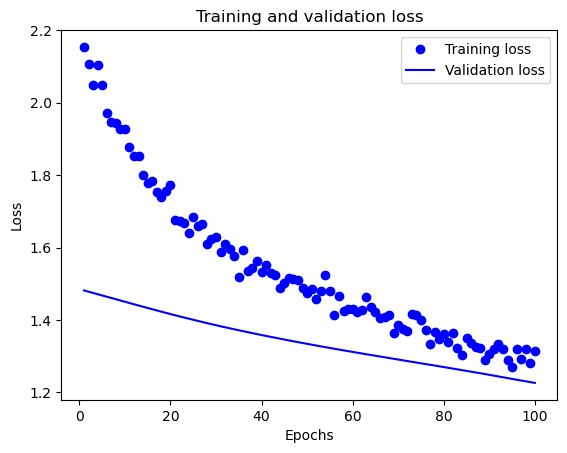

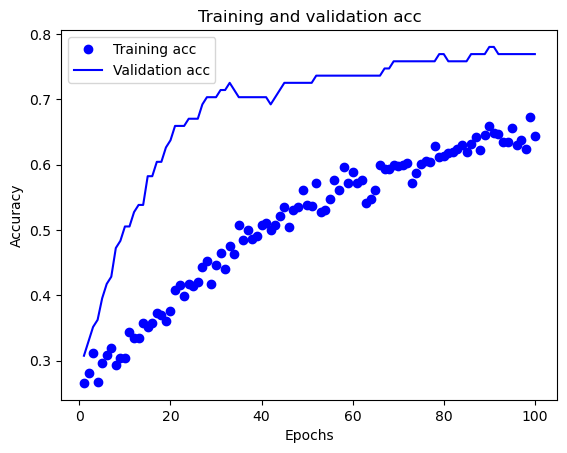

3/3 [==============================] - 0s 0s/step
Experiment number: 2
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 41ms/step - loss: 4.4602 - accuracy: 0.5949 - val_loss: 2.1631 - val_accuracy: 0.8370
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 1.7437 - accuracy: 0.8479 - val_loss: 1.9726 - val_accuracy: 0.8370
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 1.5721 - accuracy: 0.8333 - val_loss: 1.3117 - val_accuracy: 0.8370
Epoch 4/100
7/7 [==============================] - 0s 7ms/step - loss: 1.0905 - accuracy: 0.8564 - val_loss: 1.1831 - val_accuracy: 0.8370
Epoch 5/100
7/7 [=

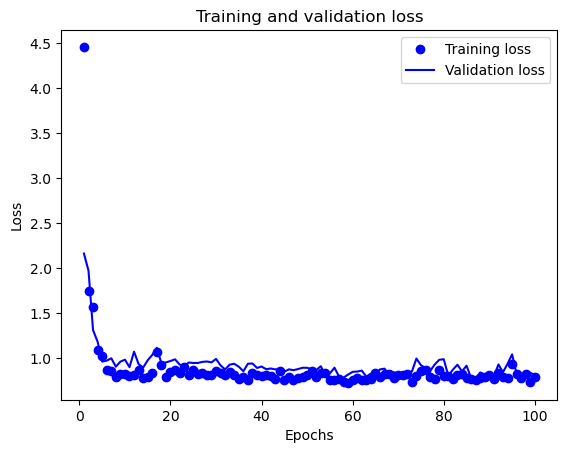

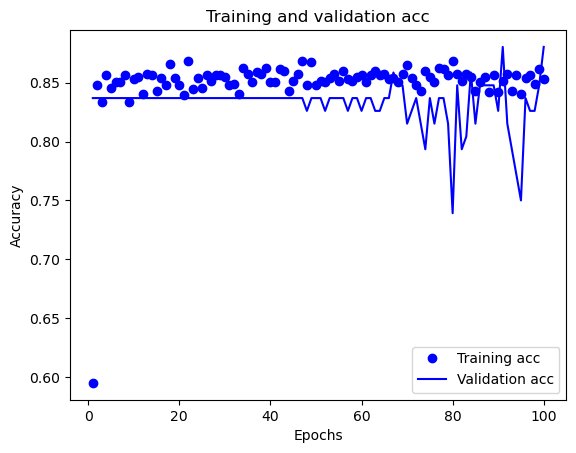

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 41ms/step - loss: 4.1821 - accuracy: 0.5998 - val_loss: 2.2211 - val_accuracy: 0.7935
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 1.8427 - accuracy: 0.8552 - val_loss: 1.8760 - val_accuracy: 0.7935
Epoch 3/100
7/7 [==============================] - 0s 7ms/step - loss: 1.6416 - accuracy: 0.8394 - val_loss: 1.3150 - val_accuracy: 0.7935
Epoch 4/100
7/7 [==============================] - 0s 6ms/step - loss: 1.1529 - accuracy: 0.8491 - val_loss: 1.2196 - val_accuracy: 0.7935
Epoch 5/100
7/7 [=====================

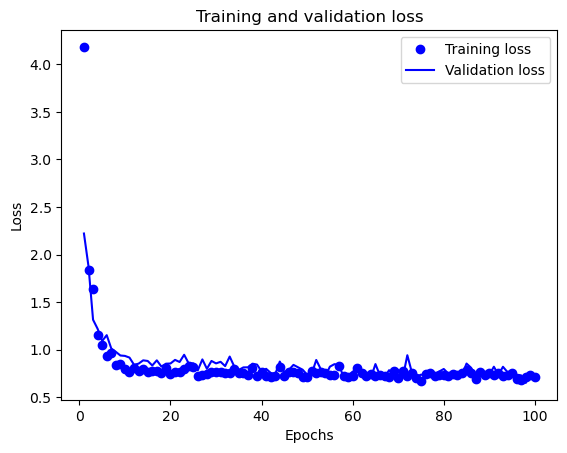

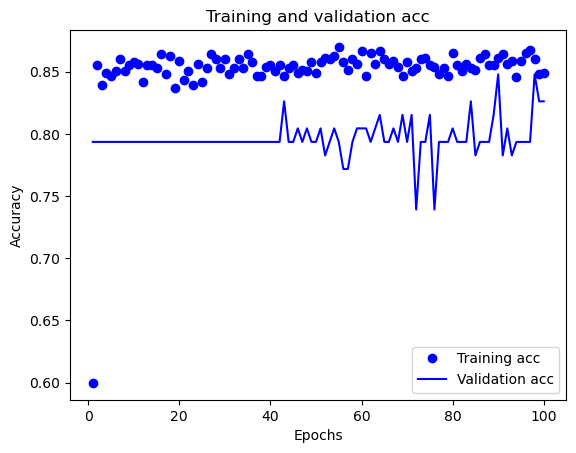

3/3 [==============================] - 0s 8ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 42ms/step - loss: 4.1614 - accuracy: 0.5742 - val_loss: 2.0147 - val_accuracy: 0.8152
Epoch 2/100
7/7 [==============================] - 0s 7ms/step - loss: 1.7059 - accuracy: 0.8552 - val_loss: 2.1029 - val_accuracy: 0.8152
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 1.6021 - accuracy: 0.8552 - val_loss: 1.4015 - val_accuracy: 0.8152
Epoch 4/100
7/7 [==============================] - 0s 6ms/step - loss: 1.2613 - accuracy: 0.8443 - val_loss: 1.3468 - val_accuracy: 0.8152
Epoch 5/100
7/7 [=====================

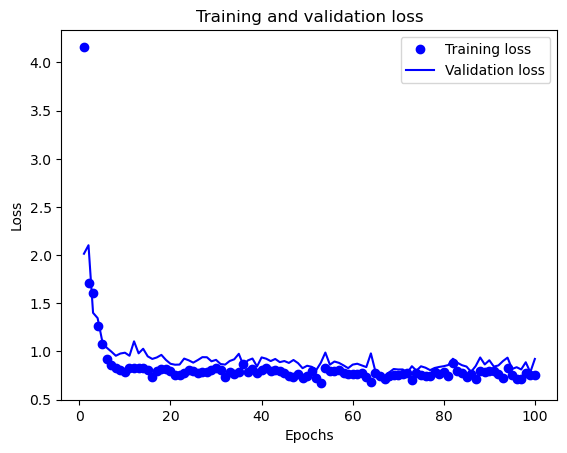

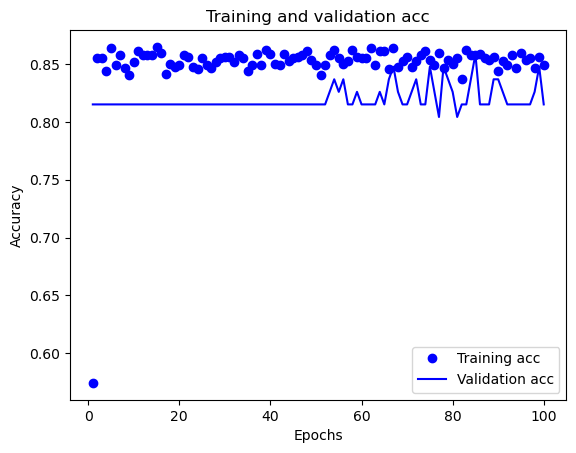

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 43ms/step - loss: 4.3743 - accuracy: 0.5620 - val_loss: 1.9835 - val_accuracy: 0.8587
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 1.7693 - accuracy: 0.8528 - val_loss: 1.7431 - val_accuracy: 0.8587
Epoch 3/100
7/7 [==============================] - 0s 7ms/step - loss: 1.5768 - accuracy: 0.8163 - val_loss: 1.2064 - val_accuracy: 0.8587
Epoch 4/100
7/7 [==============================] - 0s 6ms/step - loss: 1.1235 - accuracy: 0.8443 - val_loss: 1.0787 - val_accuracy: 0.8587
Epoch 5/100
7/7 [======================

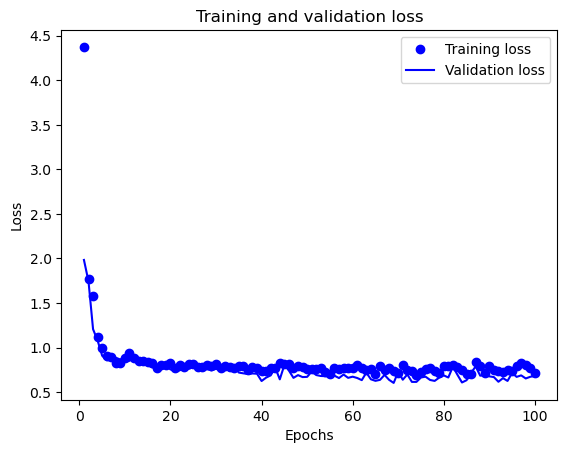

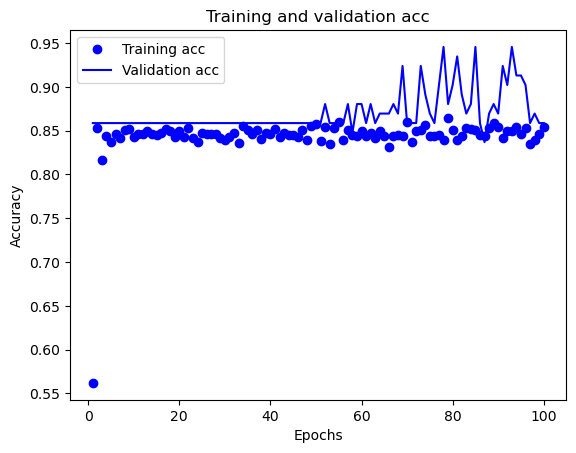

3/3 [==============================] - 0s 7ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 43ms/step - loss: 4.5564 - accuracy: 0.5650 - val_loss: 2.0382 - val_accuracy: 0.8352
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 1.8757 - accuracy: 0.8530 - val_loss: 2.0470 - val_accuracy: 0.8352
Epoch 3/100
7/7 [==============================] - 0s 7ms/step - loss: 1.6890 - accuracy: 0.8518 - val_loss: 1.2337 - val_accuracy: 0.8352
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 1.2447 - accuracy: 0.8420 - val_loss: 1.1461 - val_accuracy: 0.8352
Epoch 5/100
7/7 [=====================

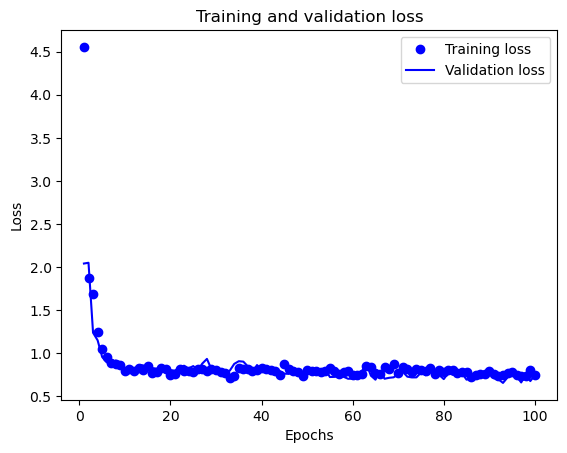

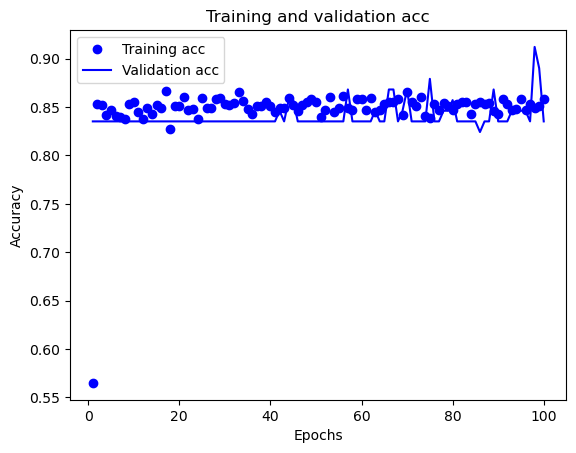

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 45ms/step - loss: 4.1517 - accuracy: 0.5395 - val_loss: 1.8072 - val_accuracy: 0.8681
Epoch 2/100
7/7 [==============================] - 0s 7ms/step - loss: 1.7856 - accuracy: 0.8420 - val_loss: 1.8958 - val_accuracy: 0.8681
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 1.5763 - accuracy: 0.8420 - val_loss: 1.1787 - val_accuracy: 0.8681
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 1.2211 - accuracy: 0.8275 - val_loss: 1.1990 - val_accuracy: 0.8681
Epoch 5/100
7/7 [======================

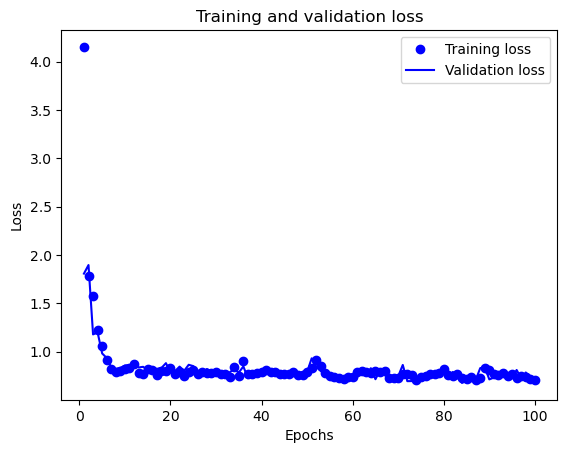

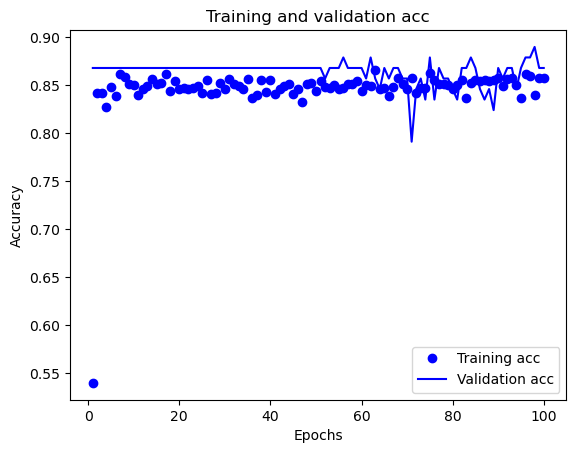

3/3 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 43ms/step - loss: 4.5662 - accuracy: 0.5225 - val_loss: 2.1069 - val_accuracy: 0.9011
Epoch 2/100
7/7 [==============================] - 0s 7ms/step - loss: 1.8503 - accuracy: 0.8372 - val_loss: 1.9396 - val_accuracy: 0.9011
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 1.7193 - accuracy: 0.8433 - val_loss: 1.1432 - val_accuracy: 0.9011
Epoch 4/100
7/7 [==============================] - 0s 7ms/step - loss: 1.1966 - accuracy: 0.8348 - val_loss: 0.9824 - val_accuracy: 0.9011
Epoch 5/100
7/7 [=====================

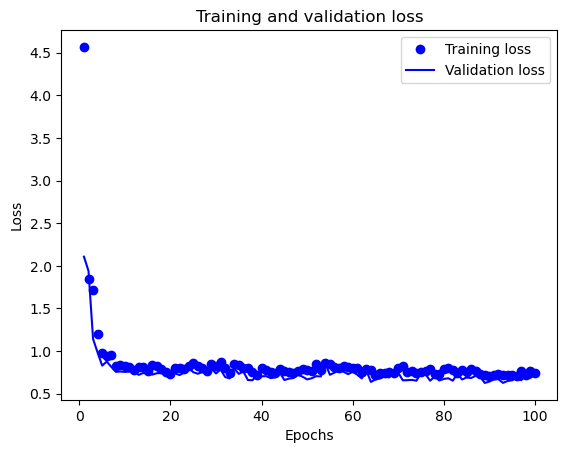

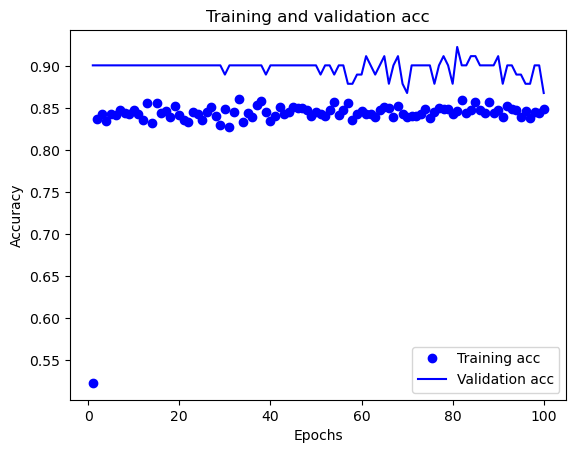

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 40ms/step - loss: 4.3002 - accuracy: 0.5917 - val_loss: 1.9738 - val_accuracy: 0.8681
Epoch 2/100
7/7 [==============================] - 0s 10ms/step - loss: 1.7648 - accuracy: 0.8433 - val_loss: 1.9695 - val_accuracy: 0.8681
Epoch 3/100
7/7 [==============================] - 0s 7ms/step - loss: 1.6371 - accuracy: 0.8457 - val_loss: 1.2182 - val_accuracy: 0.8681
Epoch 4/100
7/7 [==============================] - 0s 6ms/step - loss: 1.1201 - accuracy: 0.8505 - val_loss: 1.0995 - val_accuracy: 0.8681
Epoch 5/100
7/7 [=====================

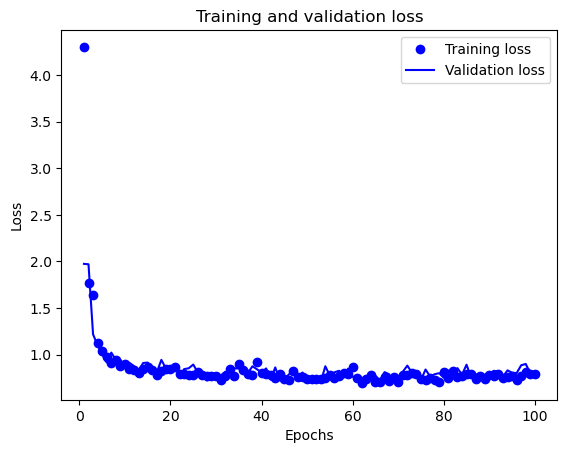

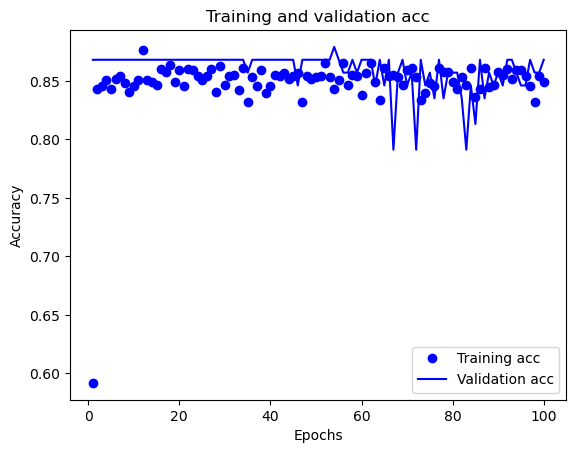

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 42ms/step - loss: 4.3986 - accuracy: 0.5832 - val_loss: 1.8842 - val_accuracy: 0.8901
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 1.8441 - accuracy: 0.8408 - val_loss: 1.8541 - val_accuracy: 0.8901
Epoch 3/100
7/7 [==============================] - 0s 7ms/step - loss: 1.6347 - accuracy: 0.8299 - val_loss: 1.1720 - val_accuracy: 0.8901
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 1.2081 - accuracy: 0.8433 - val_loss: 1.0142 - val_accuracy: 0.8901
Epoch 5/100
7/7 [=====================

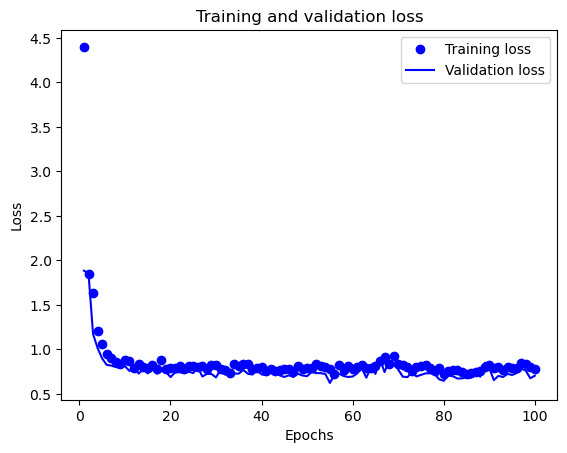

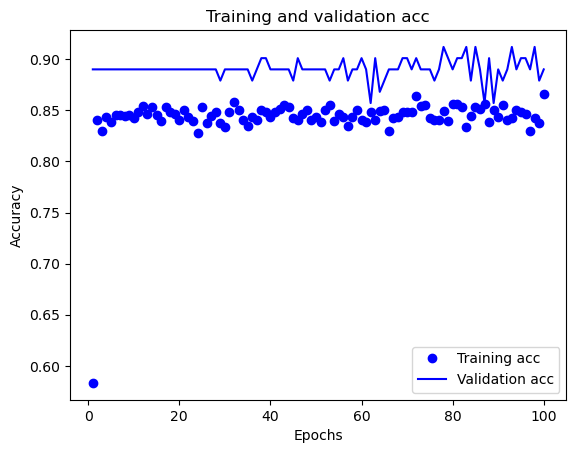

3/3 [==============================] - 0s 4ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 2, 'hidden_units': 16, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 43ms/step - loss: 4.3900 - accuracy: 0.5808 - val_loss: 1.9953 - val_accuracy: 0.8352
Epoch 2/100
7/7 [==============================] - 0s 6ms/step - loss: 1.7552 - accuracy: 0.8408 - val_loss: 1.9358 - val_accuracy: 0.8352
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 1.5300 - accuracy: 0.8445 - val_loss: 1.2201 - val_accuracy: 0.8352
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 1.1812 - accuracy: 0.8591 - val_loss: 1.2080 - val_accuracy: 0.8352
Epoch 5/100
7/7 [=====================

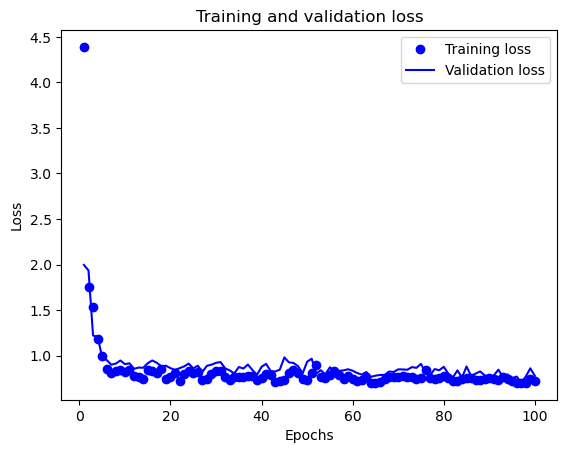

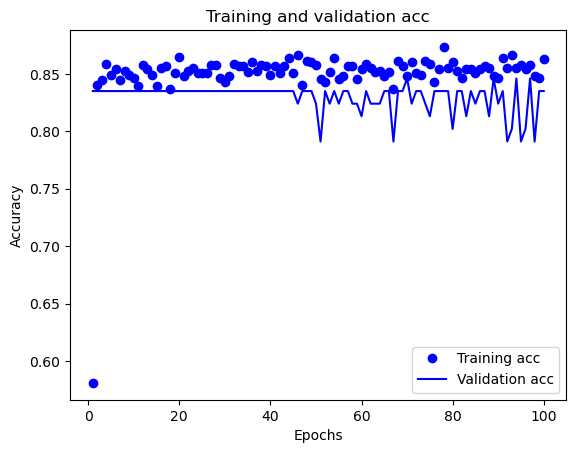

3/3 [==============================] - 0s 0s/step
Experiment number: 3
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 256
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
4/4 [==============================] - 1s 84ms/step - loss: 16.1639 - accuracy: 0.2968 - val_loss: 15.1150 - val_accuracy: 0.4130
Epoch 2/100
4/4 [==============================] - 0s 17ms/step - loss: 15.5175 - accuracy: 0.3212 - val_loss: 14.5769 - val_accuracy: 0.5326
Epoch 3/100
4/4 [==============================] - 0s 16ms/step - loss: 14.8270 - accuracy: 0.3735 - val_loss: 14.0466 - val_accuracy: 0.6848
Epoch 4/100
4/4 [==============================] - 0s 17ms/step - loss: 14.2168 - accuracy: 0.4343 - val_loss: 13.5292 - val_accuracy: 0.7174
Epoch 5

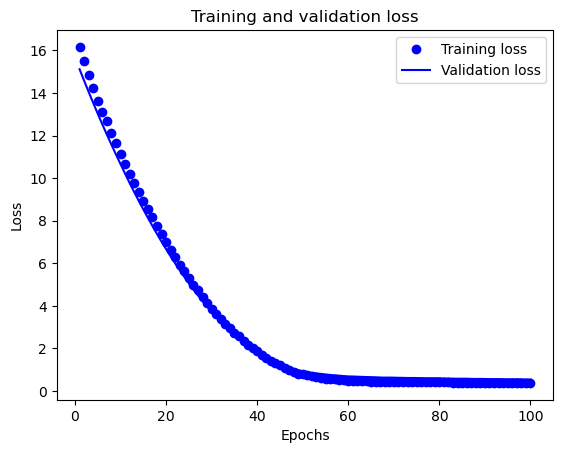

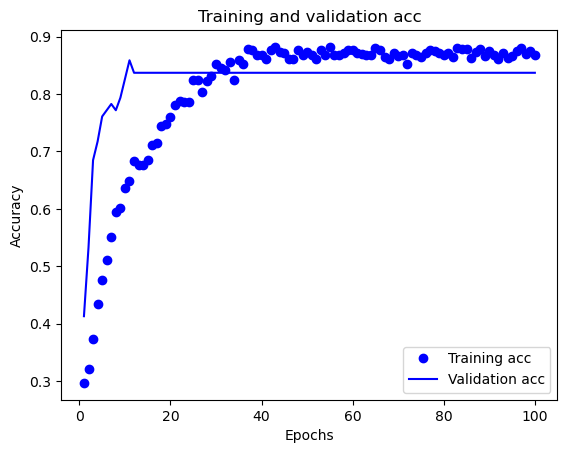

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 256
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
4/4 [==============================] - 1s 91ms/step - loss: 16.4256 - accuracy: 0.2470 - val_loss: 15.2329 - val_accuracy: 0.3587
Epoch 2/100
4/4 [==============================] - 0s 15ms/step - loss: 15.6395 - accuracy: 0.3090 - val_loss: 14.6803 - val_accuracy: 0.4891
Epoch 3/100
4/4 [==============================] - 0s 13ms/step - loss: 15.0734 - accuracy: 0.3394 - val_loss: 14.1390 - val_accuracy: 0.6739
Epoch 4/100
4/4 [==============================] - 0s 12ms/step - loss: 14.3764 - accuracy: 0.3869 - val_loss: 13.6094 - val_accuracy: 0.7065
Epoch 5/100
4/4 [===========

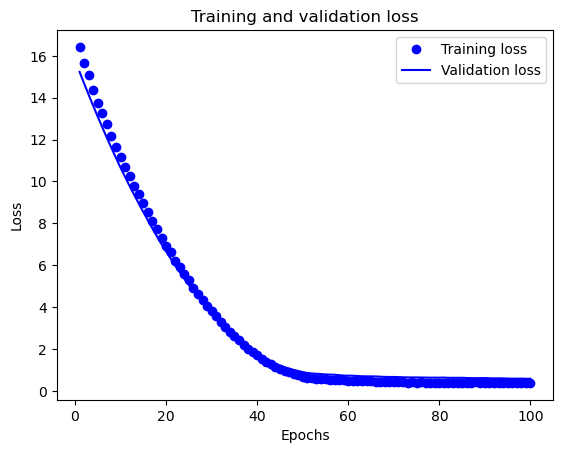

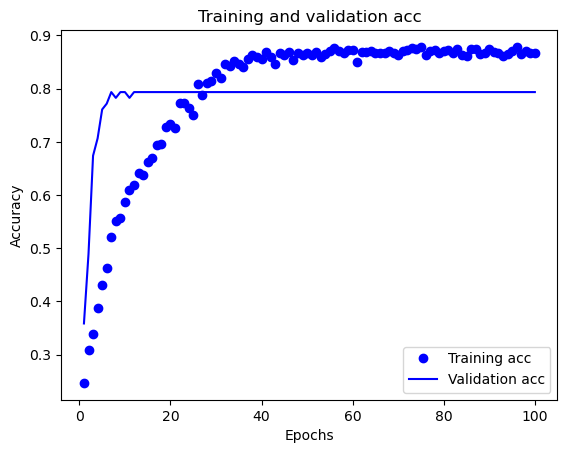

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 256
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
4/4 [==============================] - 1s 85ms/step - loss: 16.7850 - accuracy: 0.3589 - val_loss: 15.8544 - val_accuracy: 0.3043
Epoch 2/100
4/4 [==============================] - 0s 12ms/step - loss: 16.1147 - accuracy: 0.3917 - val_loss: 15.2991 - val_accuracy: 0.4565
Epoch 3/100
4/4 [==============================] - 0s 16ms/step - loss: 15.4781 - accuracy: 0.3990 - val_loss: 14.7533 - val_accuracy: 0.5435
Epoch 4/100
4/4 [==============================] - 0s 14ms/step - loss: 14.8374 - accuracy: 0.4635 - val_loss: 14.2145 - val_accuracy: 0.6196
Epoch 5/100
4/4 [===========

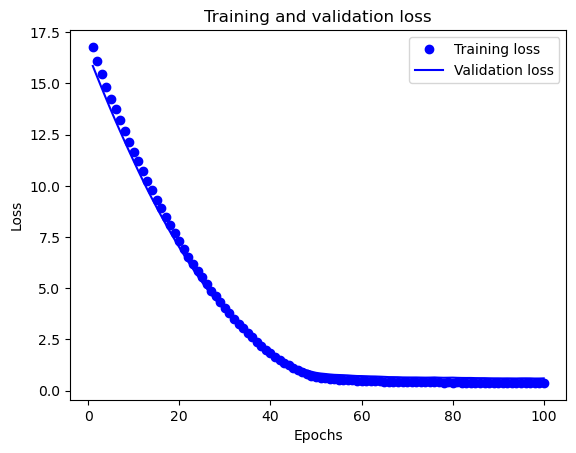

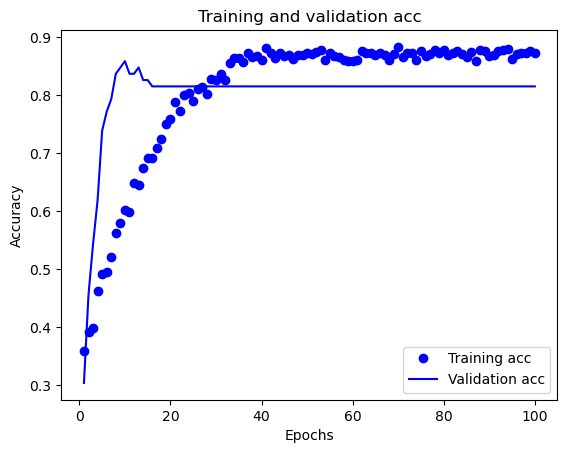

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 256
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
4/4 [==============================] - 1s 78ms/step - loss: 16.3309 - accuracy: 0.2762 - val_loss: 15.2051 - val_accuracy: 0.5326
Epoch 2/100
4/4 [==============================] - 0s 12ms/step - loss: 15.6500 - accuracy: 0.3273 - val_loss: 14.6623 - val_accuracy: 0.6413
Epoch 3/100
4/4 [==============================] - 0s 10ms/step - loss: 15.0461 - accuracy: 0.3394 - val_loss: 14.1204 - val_accuracy: 0.7391
Epoch 4/100
4/4 [==============================] - 0s 16ms/step - loss: 14.4186 - accuracy: 0.3796 - val_loss: 13.5933 - val_accuracy: 0.8478
Epoch 5/100
4/4 [===========

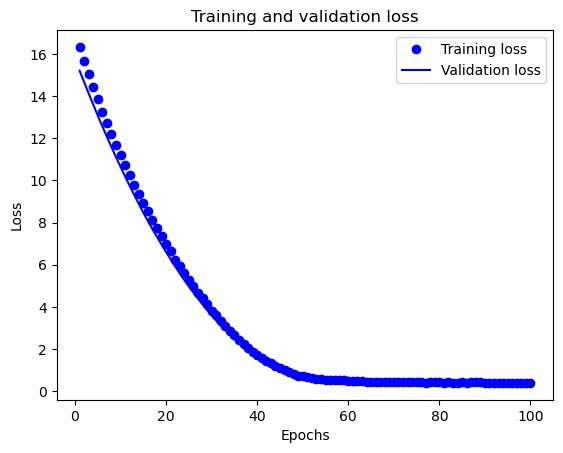

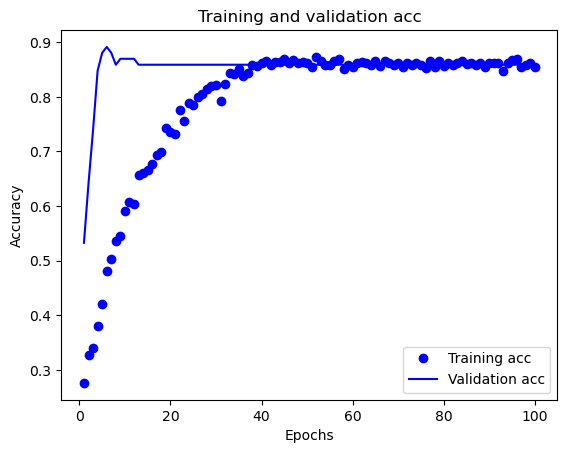

3/3 [==============================] - 0s 4ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 256
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
4/4 [==============================] - 2s 83ms/step - loss: 16.7783 - accuracy: 0.4301 - val_loss: 16.1047 - val_accuracy: 0.1648
Epoch 2/100
4/4 [==============================] - 0s 15ms/step - loss: 16.0200 - accuracy: 0.4702 - val_loss: 15.4806 - val_accuracy: 0.1648
Epoch 3/100
4/4 [==============================] - 0s 17ms/step - loss: 15.4137 - accuracy: 0.4812 - val_loss: 14.8748 - val_accuracy: 0.1978
Epoch 4/100
4/4 [==============================] - 0s 17ms/step - loss: 14.7689 - accuracy: 0.5115 - val_loss: 14.2819 - val_accuracy: 0.2857
Epoch 5/100
4/4 [==========

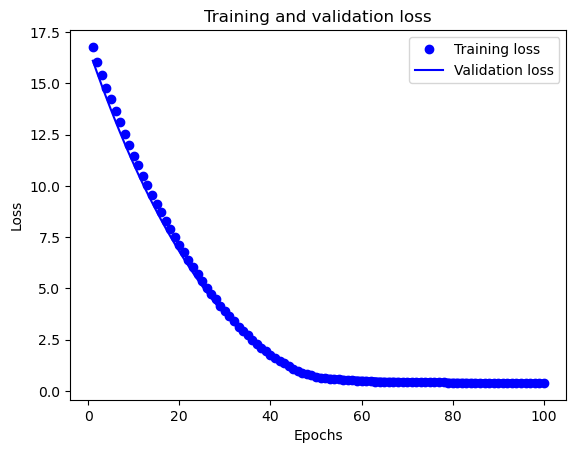

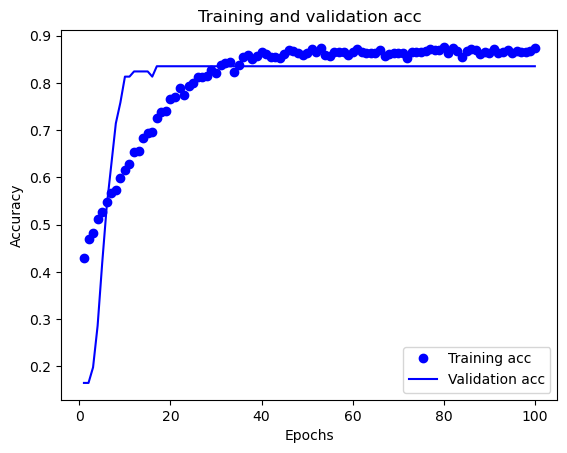

3/3 [==============================] - 0s 4ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 256
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
4/4 [==============================] - 1s 87ms/step - loss: 16.7213 - accuracy: 0.2296 - val_loss: 15.5715 - val_accuracy: 0.5824
Epoch 2/100
4/4 [==============================] - 0s 16ms/step - loss: 16.0002 - accuracy: 0.2928 - val_loss: 15.0156 - val_accuracy: 0.7253
Epoch 3/100
4/4 [==============================] - 0s 18ms/step - loss: 15.3321 - accuracy: 0.3293 - val_loss: 14.4758 - val_accuracy: 0.8022
Epoch 4/100
4/4 [==============================] - 0s 16ms/step - loss: 14.7505 - accuracy: 0.3779 - val_loss: 13.9450 - val_accuracy: 0.8132
Epoch 5/100
4/4 [==========

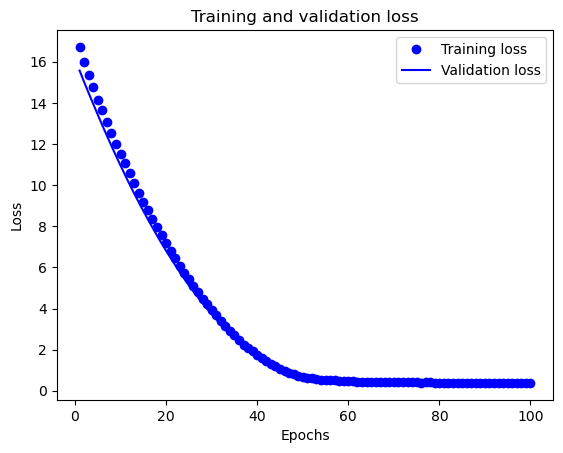

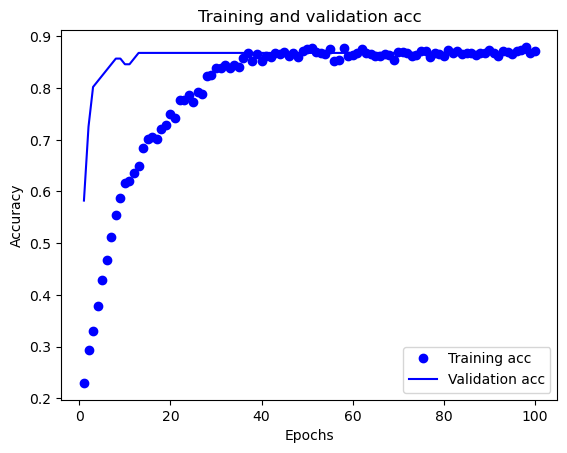

3/3 [==============================] - 0s 7ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 256
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
4/4 [==============================] - 1s 84ms/step - loss: 16.1646 - accuracy: 0.3791 - val_loss: 15.4499 - val_accuracy: 0.2418
Epoch 2/100
4/4 [==============================] - 0s 13ms/step - loss: 15.4917 - accuracy: 0.4034 - val_loss: 14.8695 - val_accuracy: 0.4176
Epoch 3/100
4/4 [==============================] - 0s 16ms/step - loss: 14.8912 - accuracy: 0.4374 - val_loss: 14.3073 - val_accuracy: 0.6264
Epoch 4/100
4/4 [==============================] - 0s 17ms/step - loss: 14.3105 - accuracy: 0.4836 - val_loss: 13.7550 - val_accuracy: 0.7363
Epoch 5/100
4/4 [==========

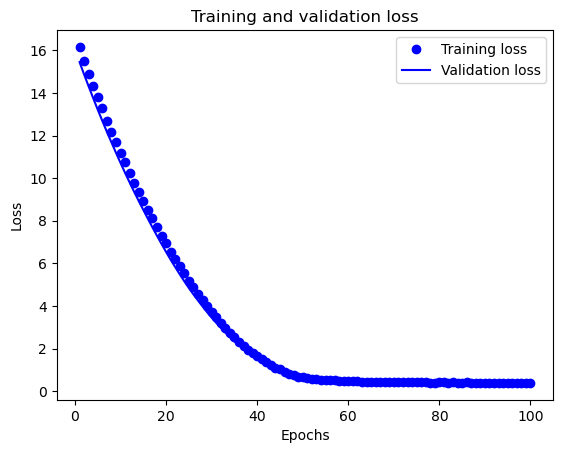

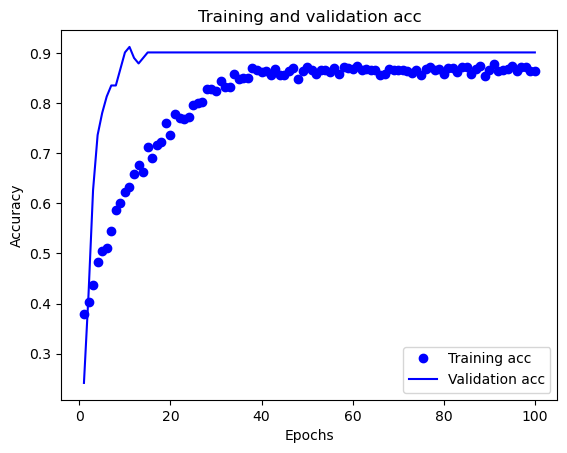

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 256
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
4/4 [==============================] - 1s 85ms/step - loss: 16.3386 - accuracy: 0.3013 - val_loss: 15.2465 - val_accuracy: 0.6044
Epoch 2/100
4/4 [==============================] - 0s 14ms/step - loss: 15.7139 - accuracy: 0.3196 - val_loss: 14.7171 - val_accuracy: 0.6593
Epoch 3/100
4/4 [==============================] - 0s 11ms/step - loss: 15.0189 - accuracy: 0.3900 - val_loss: 14.1966 - val_accuracy: 0.7473
Epoch 4/100
4/4 [==============================] - 0s 14ms/step - loss: 14.4518 - accuracy: 0.4423 - val_loss: 13.6789 - val_accuracy: 0.7912
Epoch 5/100
4/4 [===========

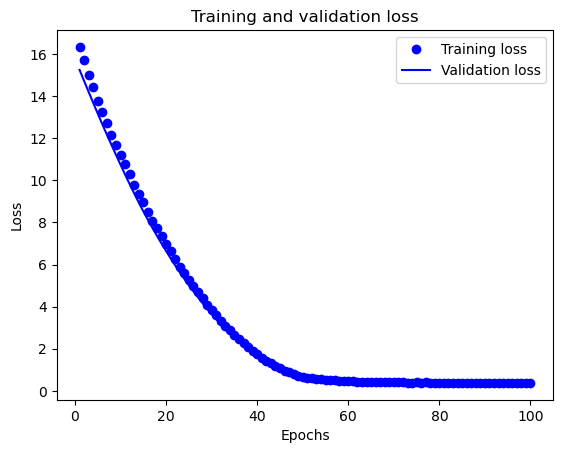

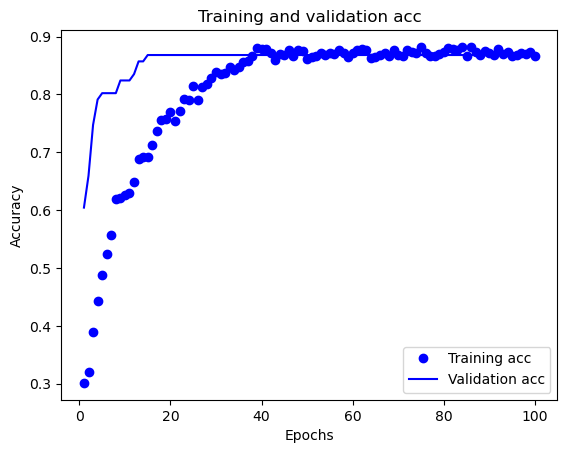

3/3 [==============================] - 0s 8ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 256
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
4/4 [==============================] - 1s 92ms/step - loss: 16.9323 - accuracy: 0.4204 - val_loss: 16.0978 - val_accuracy: 0.2308
Epoch 2/100
4/4 [==============================] - 0s 15ms/step - loss: 16.2714 - accuracy: 0.4386 - val_loss: 15.5058 - val_accuracy: 0.2747
Epoch 3/100
4/4 [==============================] - 0s 15ms/step - loss: 15.5412 - accuracy: 0.5103 - val_loss: 14.9286 - val_accuracy: 0.3956
Epoch 4/100
4/4 [==============================] - 0s 16ms/step - loss: 14.9729 - accuracy: 0.5188 - val_loss: 14.3632 - val_accuracy: 0.5385
Epoch 5/100
4/4 [==========

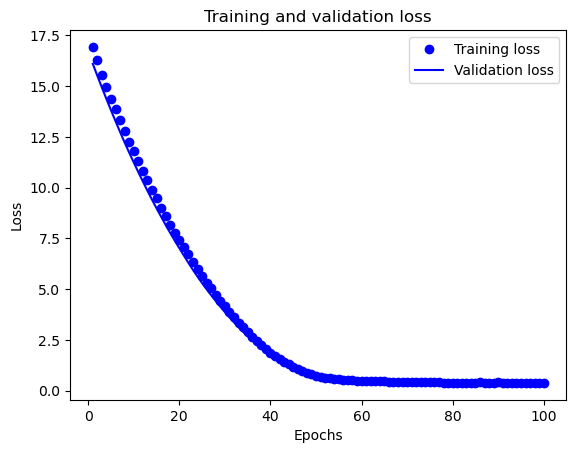

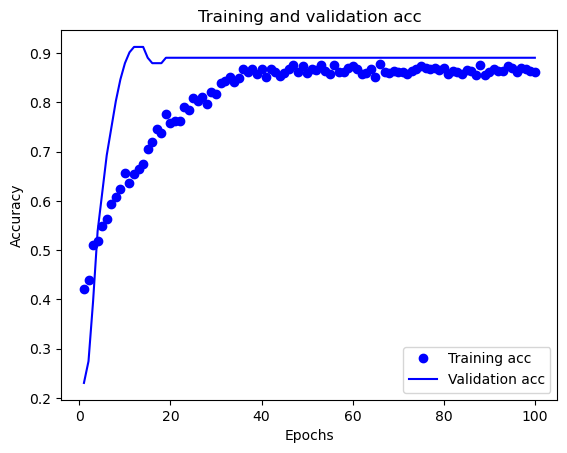

3/3 [==============================] - 0s 9ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': True}
Batch size: 256
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
4/4 [==============================] - 1s 84ms/step - loss: 16.7603 - accuracy: 0.3293 - val_loss: 15.7399 - val_accuracy: 0.7143
Epoch 2/100
4/4 [==============================] - 0s 16ms/step - loss: 16.1410 - accuracy: 0.3232 - val_loss: 15.1884 - val_accuracy: 0.7802
Epoch 3/100
4/4 [==============================] - 0s 17ms/step - loss: 15.4704 - accuracy: 0.3913 - val_loss: 14.6489 - val_accuracy: 0.7802
Epoch 4/100
4/4 [==============================] - 0s 15ms/step - loss: 14.8683 - accuracy: 0.4131 - val_loss: 14.1202 - val_accuracy: 0.8242
Epoch 5/100
4/4 [==========

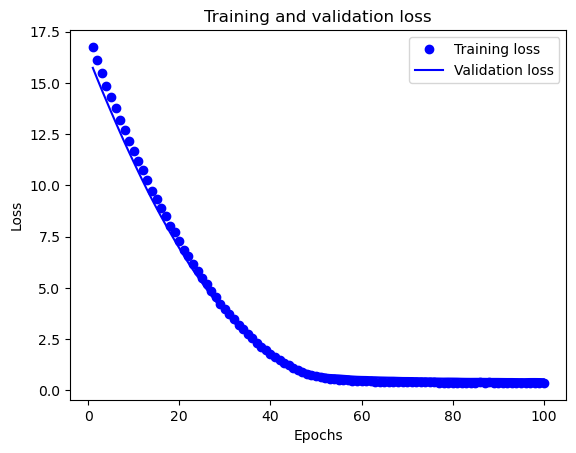

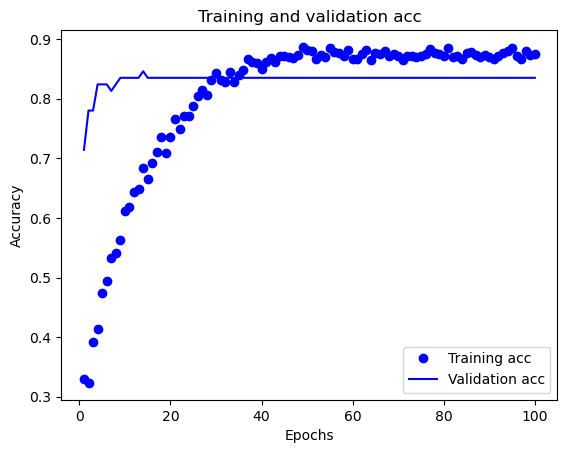

3/3 [==============================] - 0s 2ms/step
Experiment number: 4
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 215ms/step - loss: 6.6902 - accuracy: 0.5353 - val_loss: 2.9931 - val_accuracy: 0.8370
Epoch 2/100
2/2 [==============================] - 0s 34ms/step - loss: 2.7100 - accuracy: 0.8516 - val_loss: 2.7163 - val_accuracy: 0.8370
Epoch 3/100
2/2 [==============================] - 0s 32ms/step - loss: 2.7639 - accuracy: 0.8516 - val_loss: 2.9681 - val_accuracy: 0.8370
Epoch 4/100
2/2 [==============================] - 0s 54ms/step - loss: 2.7977 - accuracy: 0.8516 - val_loss: 2.3445 - val_accuracy: 0.8370
Epoch 5/100
2/2

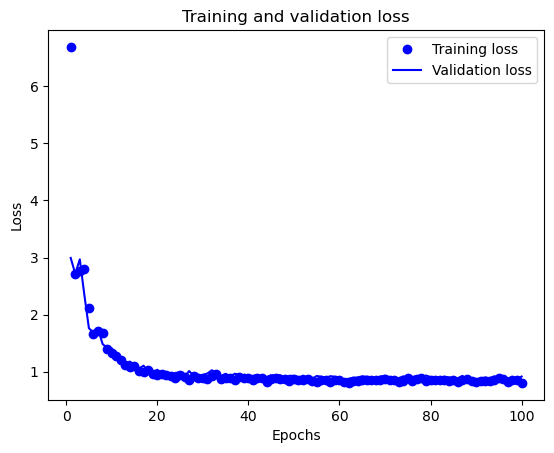

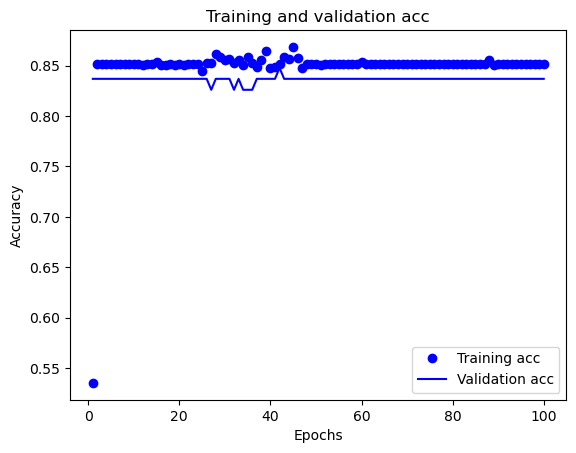

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 230ms/step - loss: 6.8412 - accuracy: 0.5243 - val_loss: 3.0947 - val_accuracy: 0.7935
Epoch 2/100
2/2 [==============================] - 0s 37ms/step - loss: 2.6541 - accuracy: 0.8564 - val_loss: 2.7750 - val_accuracy: 0.7935
Epoch 3/100
2/2 [==============================] - 0s 37ms/step - loss: 2.7989 - accuracy: 0.8564 - val_loss: 2.9010 - val_accuracy: 0.7935
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 2.7561 - accuracy: 0.8564 - val_loss: 2.3768 - val_accuracy: 0.7935
Epoch 5/100
2/2 [====================

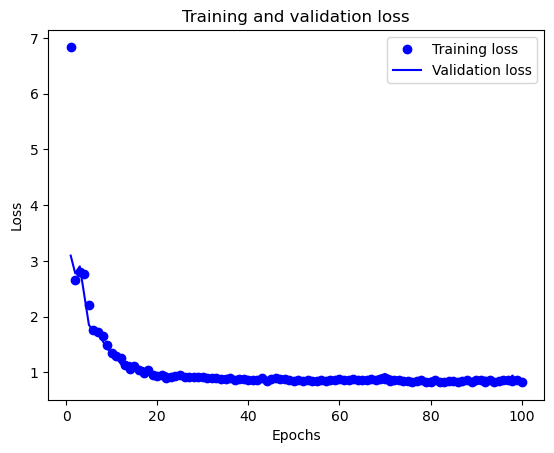

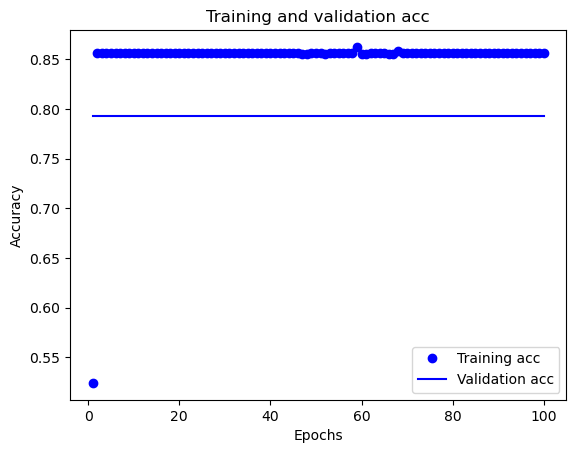

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 233ms/step - loss: 6.5502 - accuracy: 0.4915 - val_loss: 2.9143 - val_accuracy: 0.8152
Epoch 2/100
2/2 [==============================] - 0s 49ms/step - loss: 2.6054 - accuracy: 0.8540 - val_loss: 2.8028 - val_accuracy: 0.8152
Epoch 3/100
2/2 [==============================] - 0s 34ms/step - loss: 2.7203 - accuracy: 0.8540 - val_loss: 2.8067 - val_accuracy: 0.8152
Epoch 4/100
2/2 [==============================] - 0s 33ms/step - loss: 2.5758 - accuracy: 0.8540 - val_loss: 2.2870 - val_accuracy: 0.8152
Epoch 5/100
2/2 [===================

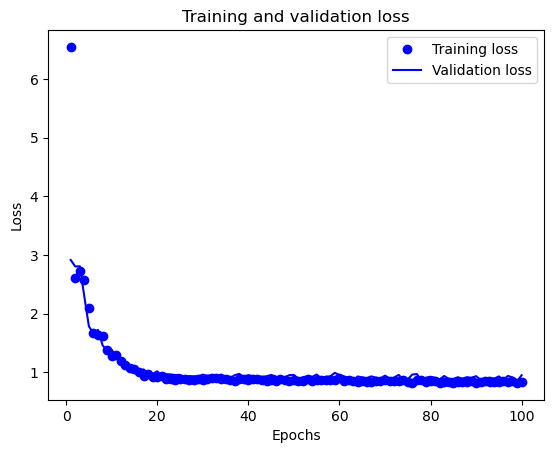

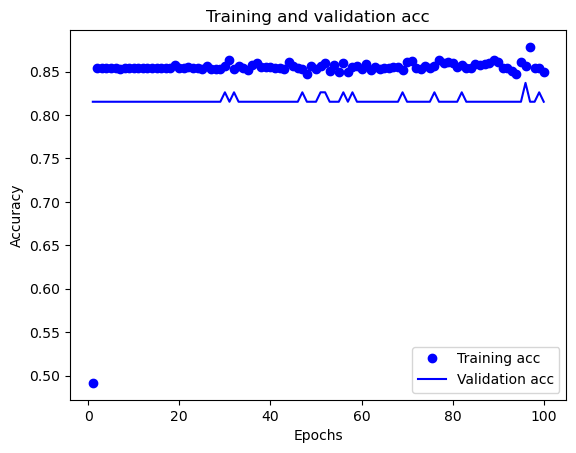

3/3 [==============================] - 0s 4ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 235ms/step - loss: 7.3567 - accuracy: 0.3942 - val_loss: 2.7978 - val_accuracy: 0.8587
Epoch 2/100
2/2 [==============================] - 0s 36ms/step - loss: 2.6569 - accuracy: 0.8479 - val_loss: 2.6374 - val_accuracy: 0.8587
Epoch 3/100
2/2 [==============================] - 0s 50ms/step - loss: 2.8346 - accuracy: 0.8491 - val_loss: 2.6888 - val_accuracy: 0.8587
Epoch 4/100
2/2 [==============================] - 0s 37ms/step - loss: 2.7262 - accuracy: 0.8491 - val_loss: 2.0782 - val_accuracy: 0.8587
Epoch 5/100
2/2 [===================

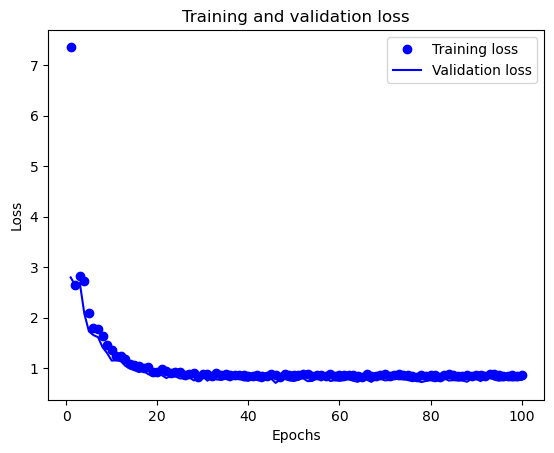

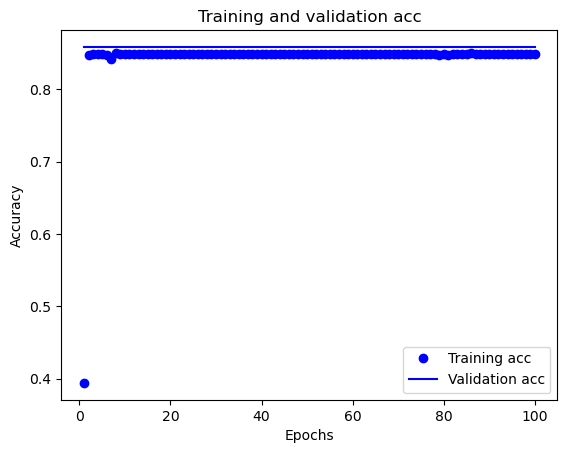

3/3 [==============================] - 0s 252us/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 227ms/step - loss: 6.9394 - accuracy: 0.4447 - val_loss: 2.8640 - val_accuracy: 0.8352
Epoch 2/100
2/2 [==============================] - 0s 39ms/step - loss: 2.6168 - accuracy: 0.8518 - val_loss: 2.5251 - val_accuracy: 0.8352
Epoch 3/100
2/2 [==============================] - 0s 41ms/step - loss: 2.6296 - accuracy: 0.8518 - val_loss: 2.6179 - val_accuracy: 0.8352
Epoch 4/100
2/2 [==============================] - 0s 37ms/step - loss: 2.5769 - accuracy: 0.8518 - val_loss: 2.0387 - val_accuracy: 0.8352
Epoch 5/100
2/2 [=================

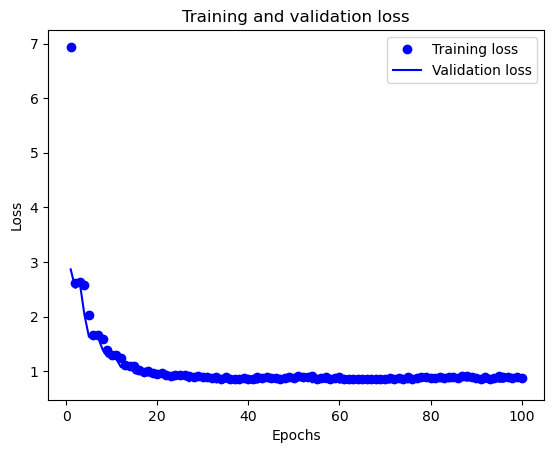

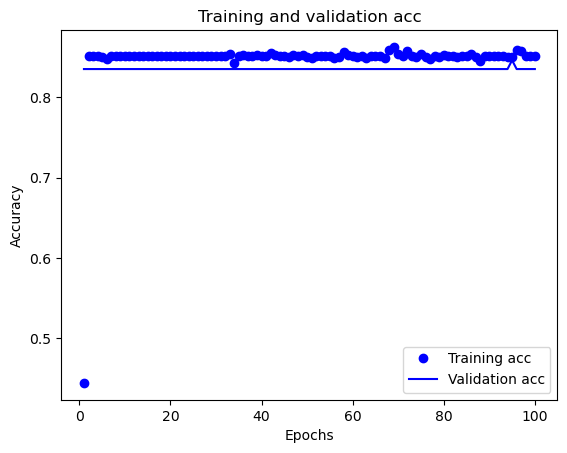

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 218ms/step - loss: 7.1448 - accuracy: 0.4970 - val_loss: 3.1019 - val_accuracy: 0.8681
Epoch 2/100
2/2 [==============================] - 0s 40ms/step - loss: 2.7899 - accuracy: 0.8481 - val_loss: 2.5875 - val_accuracy: 0.8681
Epoch 3/100
2/2 [==============================] - 0s 50ms/step - loss: 2.7224 - accuracy: 0.8481 - val_loss: 2.9327 - val_accuracy: 0.8681
Epoch 4/100
2/2 [==============================] - 0s 36ms/step - loss: 2.7706 - accuracy: 0.8481 - val_loss: 2.3731 - val_accuracy: 0.8681
Epoch 5/100
2/2 [====================

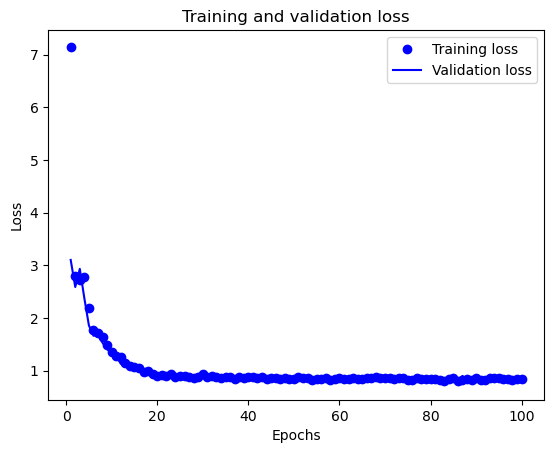

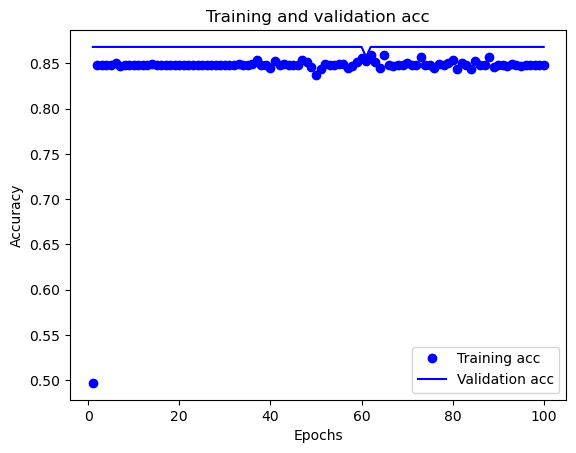

3/3 [==============================] - 0s 8ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 235ms/step - loss: 6.3799 - accuracy: 0.4313 - val_loss: 2.5556 - val_accuracy: 0.9011
Epoch 2/100
2/2 [==============================] - 0s 35ms/step - loss: 2.5463 - accuracy: 0.8433 - val_loss: 2.4792 - val_accuracy: 0.9011
Epoch 3/100
2/2 [==============================] - 0s 33ms/step - loss: 2.6799 - accuracy: 0.8445 - val_loss: 2.4493 - val_accuracy: 0.9011
Epoch 4/100
2/2 [==============================] - 0s 50ms/step - loss: 2.4720 - accuracy: 0.8445 - val_loss: 1.8655 - val_accuracy: 0.9011
Epoch 5/100
2/2 [===================

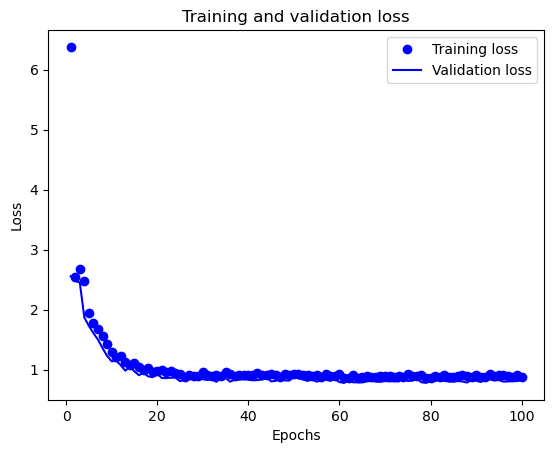

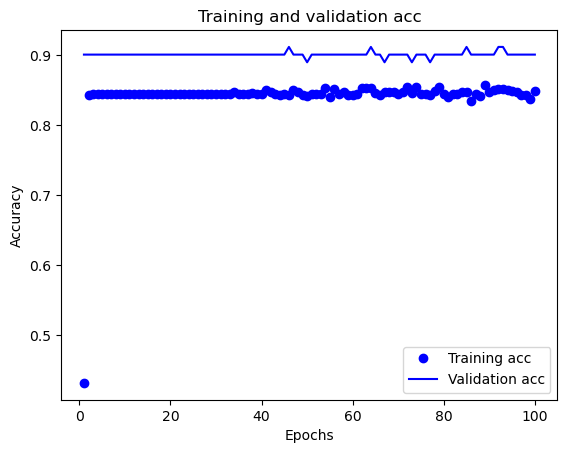

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 224ms/step - loss: 6.8501 - accuracy: 0.4107 - val_loss: 2.7636 - val_accuracy: 0.8681
Epoch 2/100
2/2 [==============================] - 0s 42ms/step - loss: 2.6205 - accuracy: 0.8481 - val_loss: 2.6704 - val_accuracy: 0.8681
Epoch 3/100
2/2 [==============================] - 0s 32ms/step - loss: 2.8034 - accuracy: 0.8481 - val_loss: 2.8238 - val_accuracy: 0.8681
Epoch 4/100
2/2 [==============================] - 0s 52ms/step - loss: 2.7238 - accuracy: 0.8481 - val_loss: 2.1149 - val_accuracy: 0.8681
Epoch 5/100
2/2 [===================

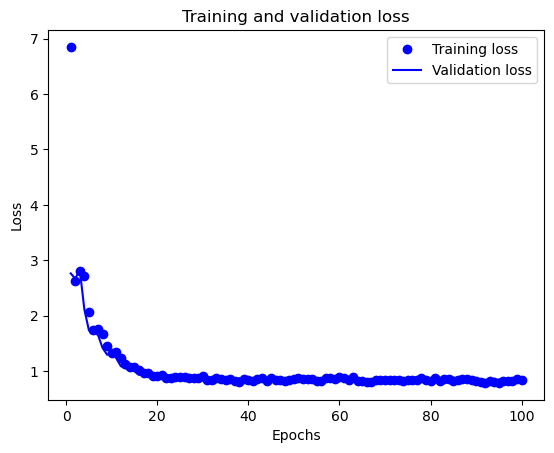

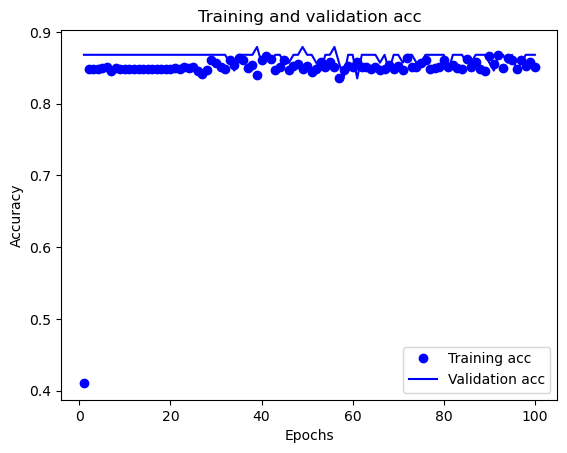

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 230ms/step - loss: 6.6034 - accuracy: 0.5273 - val_loss: 2.7389 - val_accuracy: 0.8901
Epoch 2/100
2/2 [==============================] - 0s 42ms/step - loss: 2.6105 - accuracy: 0.8457 - val_loss: 2.4939 - val_accuracy: 0.8901
Epoch 3/100
2/2 [==============================] - 0s 39ms/step - loss: 2.7176 - accuracy: 0.8457 - val_loss: 2.6219 - val_accuracy: 0.8901
Epoch 4/100
2/2 [==============================] - 0s 39ms/step - loss: 2.6345 - accuracy: 0.8591 - val_loss: 2.1108 - val_accuracy: 0.8791
Epoch 5/100
2/2 [===================

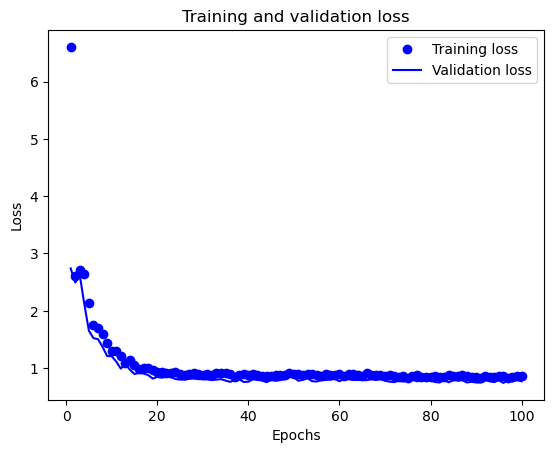

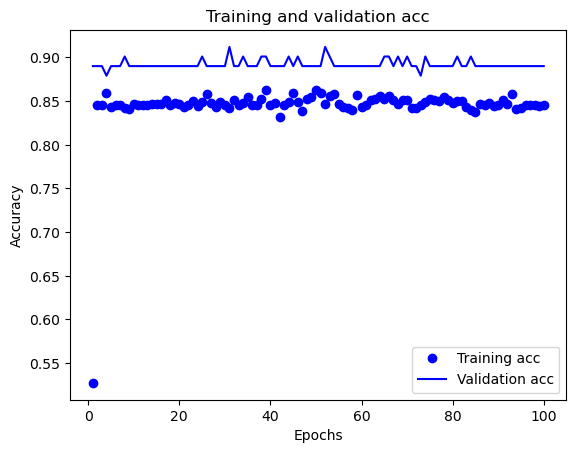

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 231ms/step - loss: 7.0000 - accuracy: 0.5091 - val_loss: 2.9063 - val_accuracy: 0.8352
Epoch 2/100
2/2 [==============================] - 0s 33ms/step - loss: 2.6250 - accuracy: 0.8518 - val_loss: 2.7943 - val_accuracy: 0.8352
Epoch 3/100
2/2 [==============================] - 0s 43ms/step - loss: 2.8199 - accuracy: 0.8518 - val_loss: 2.8652 - val_accuracy: 0.8352
Epoch 4/100
2/2 [==============================] - 0s 35ms/step - loss: 2.6914 - accuracy: 0.8518 - val_loss: 2.1504 - val_accuracy: 0.8352
Epoch 5/100
2/2 [====================

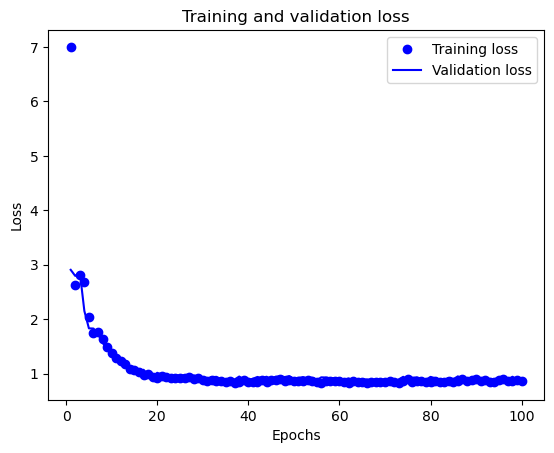

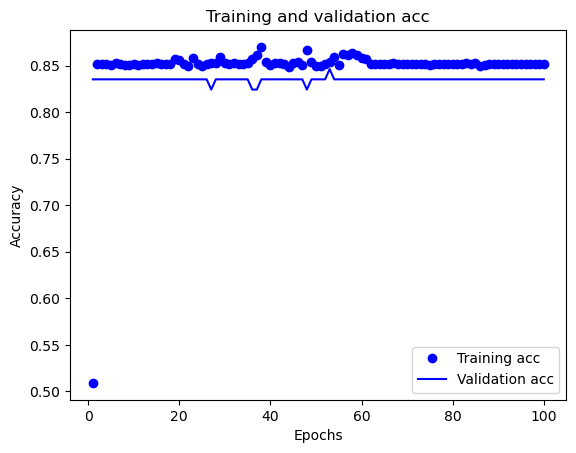

3/3 [==============================] - 0s 0s/step
Experiment number: 5
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 224ms/step - loss: 2.9647 - accuracy: 0.4599 - val_loss: 2.8495 - val_accuracy: 0.3913
Epoch 2/100
2/2 [==============================] - 0s 50ms/step - loss: 2.9499 - accuracy: 0.4526 - val_loss: 2.8481 - val_accuracy: 0.3913
Epoch 3/100
2/2 [==============================] - 0s 34ms/step - loss: 2.9938 - accuracy: 0.4416 - val_loss: 2.8458 - val_accuracy: 0.3913
Epoch 4/100
2/2 [==============================] - 0s 37ms/step - loss: 2.9797 - accuracy: 0.4453 - val_loss: 2.8427 - val_accuracy: 0.3913
Epoch 5/10

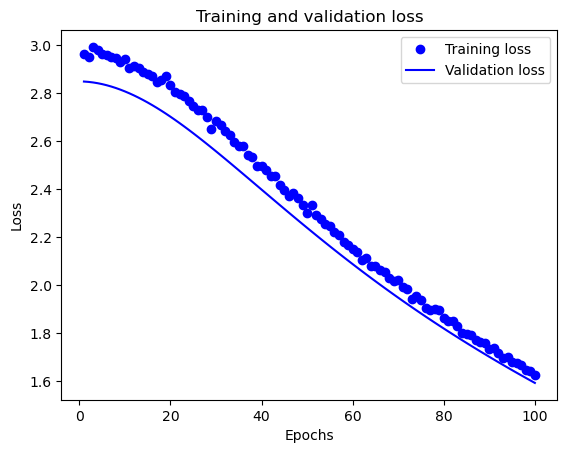

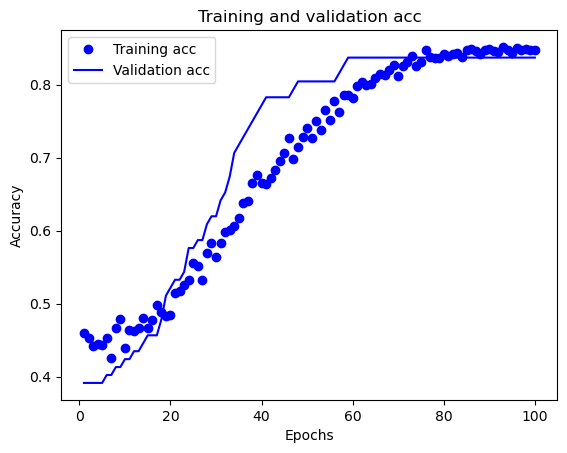

3/3 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 242ms/step - loss: 3.3041 - accuracy: 0.4002 - val_loss: 3.3686 - val_accuracy: 0.3370
Epoch 2/100
2/2 [==============================] - 0s 50ms/step - loss: 3.2953 - accuracy: 0.4002 - val_loss: 3.3662 - val_accuracy: 0.3370
Epoch 3/100
2/2 [==============================] - 0s 27ms/step - loss: 3.3232 - accuracy: 0.3942 - val_loss: 3.3626 - val_accuracy: 0.3370
Epoch 4/100
2/2 [==============================] - 0s 86ms/step - loss: 3.2691 - accuracy: 0.4331 - val_loss: 3.3576 - val_accuracy: 0.3370
Epoch 5/100
2/2 [=============

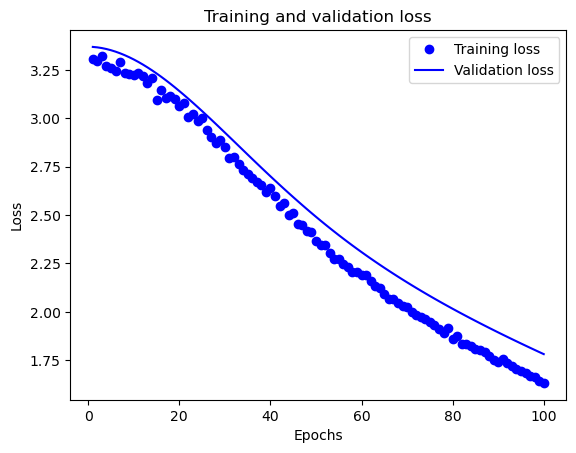

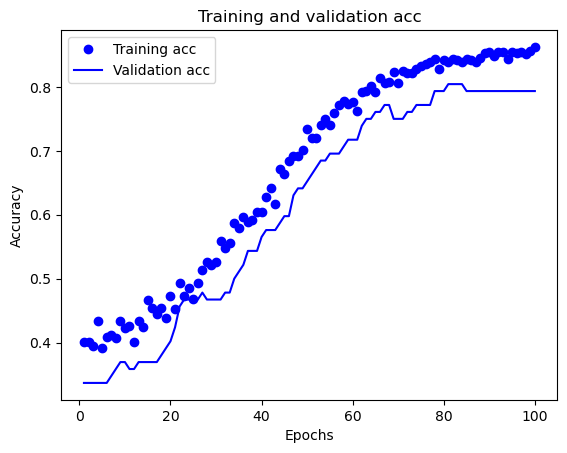

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 232ms/step - loss: 2.6041 - accuracy: 0.5754 - val_loss: 2.5219 - val_accuracy: 0.6304
Epoch 2/100
2/2 [==============================] - 0s 37ms/step - loss: 2.5759 - accuracy: 0.6144 - val_loss: 2.5207 - val_accuracy: 0.6304
Epoch 3/100
2/2 [==============================] - 0s 33ms/step - loss: 2.5742 - accuracy: 0.6119 - val_loss: 2.5190 - val_accuracy: 0.6304
Epoch 4/100
2/2 [==============================] - 0s 36ms/step - loss: 2.5698 - accuracy: 0.6229 - val_loss: 2.5166 - val_accuracy: 0.6304
Epoch 5/100
2/2 [=============

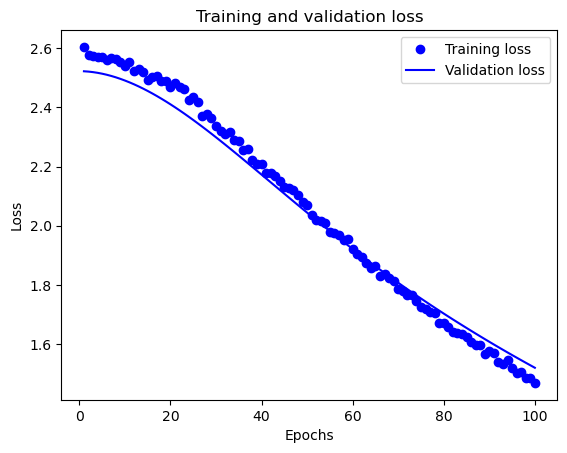

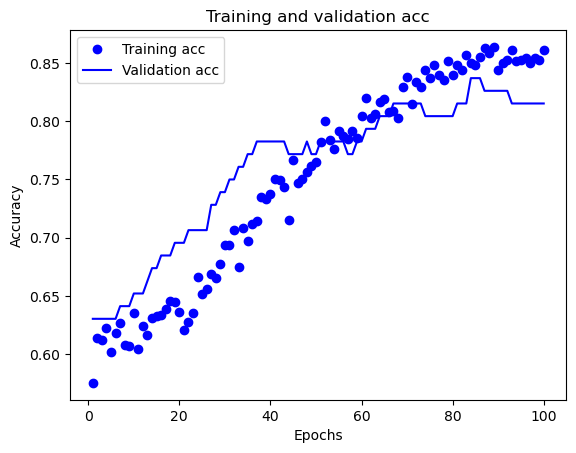

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 214ms/step - loss: 3.2282 - accuracy: 0.2713 - val_loss: 3.1756 - val_accuracy: 0.3043
Epoch 2/100
2/2 [==============================] - 0s 43ms/step - loss: 3.2357 - accuracy: 0.2871 - val_loss: 3.1734 - val_accuracy: 0.3043
Epoch 3/100
2/2 [==============================] - 0s 41ms/step - loss: 3.2264 - accuracy: 0.2725 - val_loss: 3.1699 - val_accuracy: 0.3043
Epoch 4/100
2/2 [==============================] - 0s 39ms/step - loss: 3.2386 - accuracy: 0.2774 - val_loss: 3.1652 - val_accuracy: 0.3043
Epoch 5/100
2/2 [==============

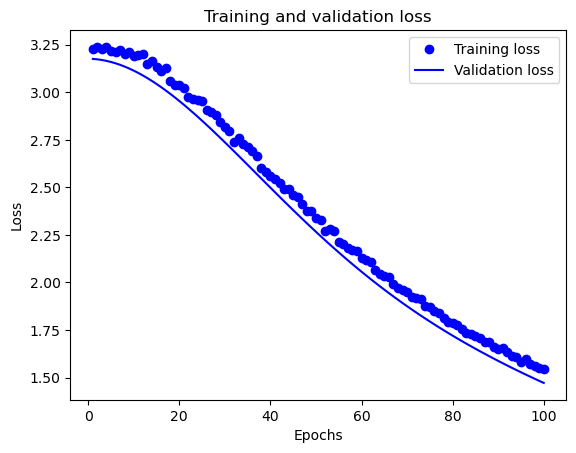

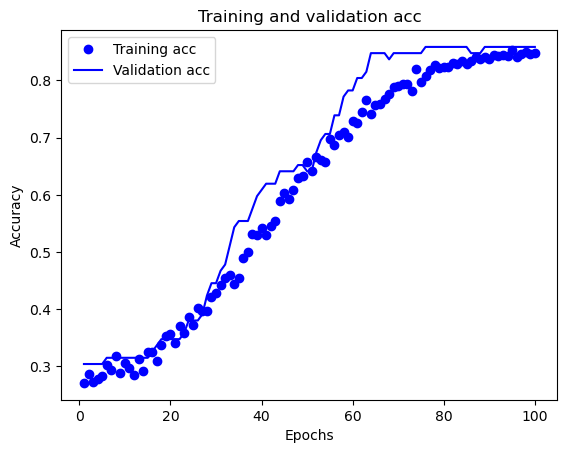

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 203ms/step - loss: 3.6362 - accuracy: 0.1179 - val_loss: 3.6309 - val_accuracy: 0.0989
Epoch 2/100
2/2 [==============================] - 0s 33ms/step - loss: 3.6455 - accuracy: 0.1142 - val_loss: 3.6280 - val_accuracy: 0.0989
Epoch 3/100
2/2 [==============================] - 0s 38ms/step - loss: 3.6925 - accuracy: 0.1081 - val_loss: 3.6235 - val_accuracy: 0.0989
Epoch 4/100
2/2 [==============================] - 0s 34ms/step - loss: 3.6756 - accuracy: 0.1227 - val_loss: 3.6174 - val_accuracy: 0.0989
Epoch 5/100
2/2 [==============

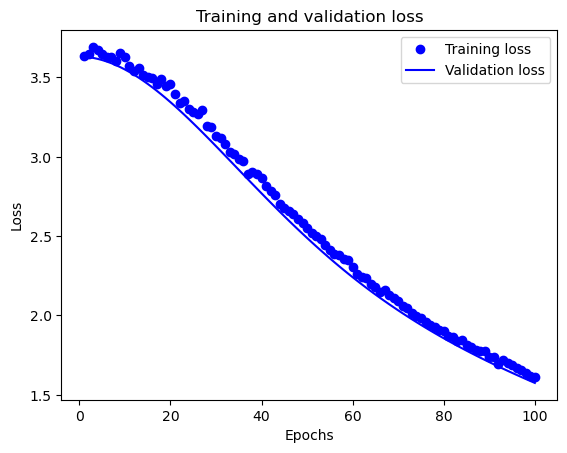

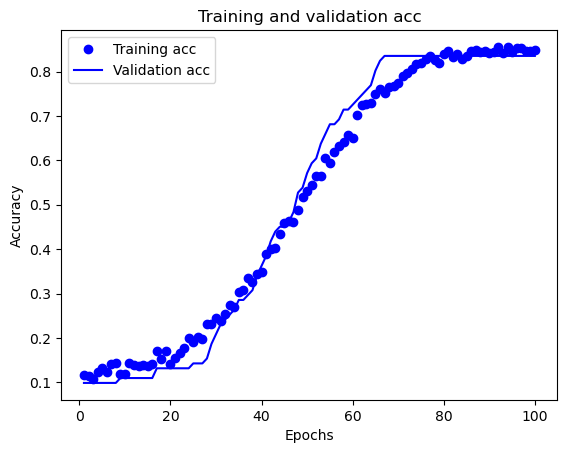

3/3 [==============================] - 0s 5ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 234ms/step - loss: 3.2129 - accuracy: 0.2503 - val_loss: 3.0734 - val_accuracy: 0.2747
Epoch 2/100
2/2 [==============================] - 0s 41ms/step - loss: 3.1850 - accuracy: 0.2904 - val_loss: 3.0715 - val_accuracy: 0.2747
Epoch 3/100
2/2 [==============================] - 0s 41ms/step - loss: 3.1887 - accuracy: 0.2977 - val_loss: 3.0684 - val_accuracy: 0.2747
Epoch 4/100
2/2 [==============================] - 0s 39ms/step - loss: 3.1783 - accuracy: 0.3026 - val_loss: 3.0642 - val_accuracy: 0.2747
Epoch 5/100
2/2 [=============

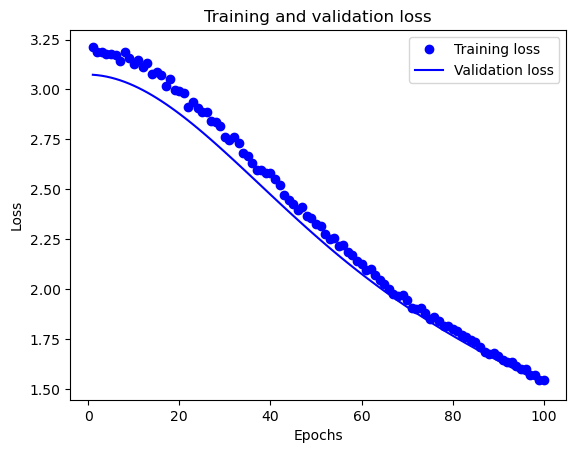

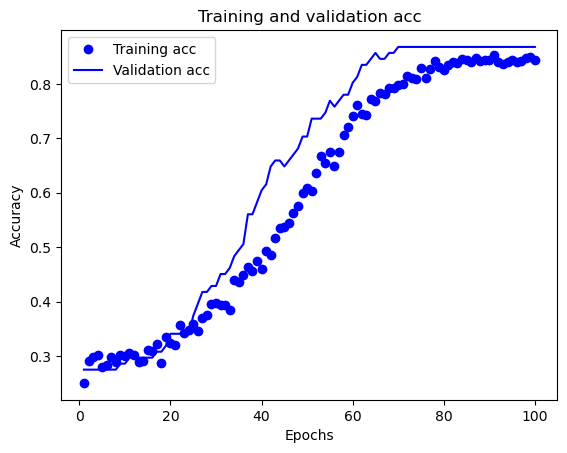

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 238ms/step - loss: 3.0458 - accuracy: 0.3026 - val_loss: 2.9799 - val_accuracy: 0.2637
Epoch 2/100
2/2 [==============================] - 0s 45ms/step - loss: 3.0526 - accuracy: 0.3317 - val_loss: 2.9780 - val_accuracy: 0.2637
Epoch 3/100
2/2 [==============================] - 0s 45ms/step - loss: 3.0309 - accuracy: 0.3062 - val_loss: 2.9751 - val_accuracy: 0.2637
Epoch 4/100
2/2 [==============================] - 0s 42ms/step - loss: 3.0452 - accuracy: 0.3171 - val_loss: 2.9712 - val_accuracy: 0.2747
Epoch 5/100
2/2 [==============

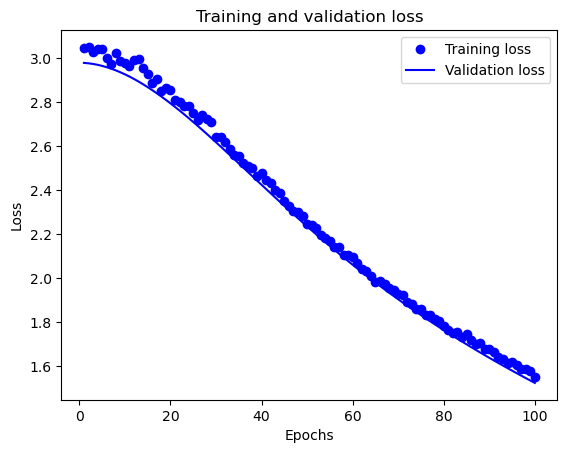

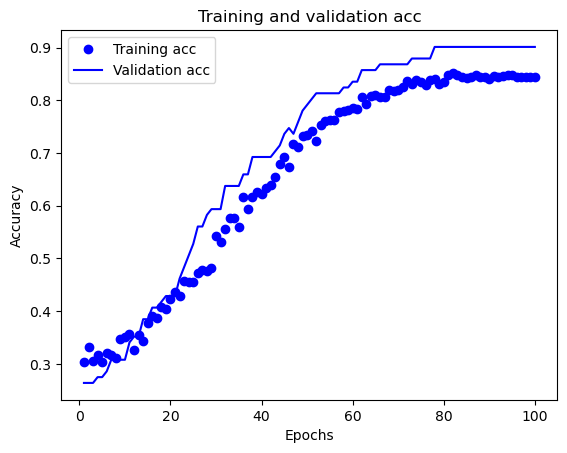

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 229ms/step - loss: 3.7353 - accuracy: 0.1142 - val_loss: 3.5666 - val_accuracy: 0.0440
Epoch 2/100
2/2 [==============================] - 0s 29ms/step - loss: 3.7663 - accuracy: 0.0948 - val_loss: 3.5634 - val_accuracy: 0.0440
Epoch 3/100
2/2 [==============================] - 0s 39ms/step - loss: 3.7276 - accuracy: 0.1045 - val_loss: 3.5584 - val_accuracy: 0.0440
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 3.7163 - accuracy: 0.1106 - val_loss: 3.5518 - val_accuracy: 0.0440
Epoch 5/100
2/2 [=============

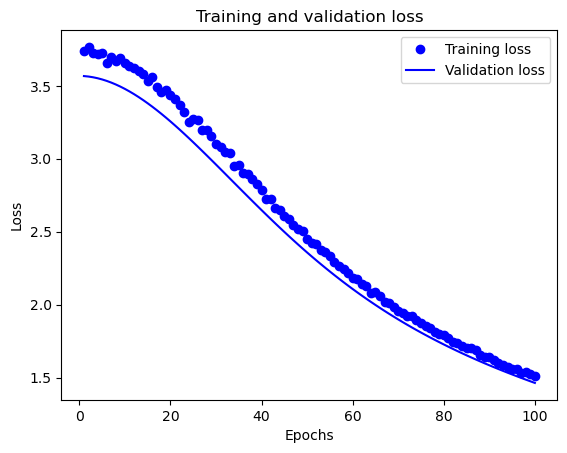

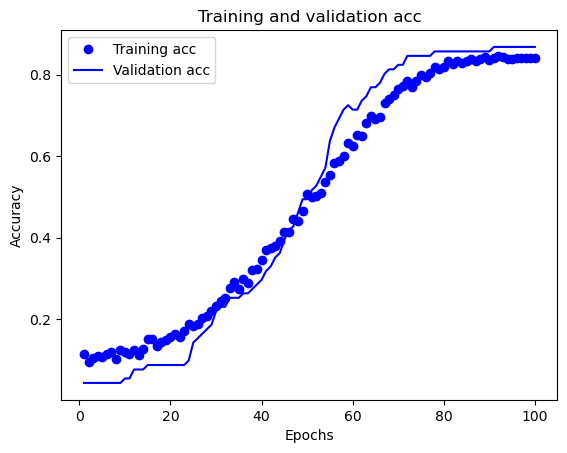

3/3 [==============================] - 0s 8ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 218ms/step - loss: 2.8590 - accuracy: 0.3852 - val_loss: 2.9394 - val_accuracy: 0.2637
Epoch 2/100
2/2 [==============================] - 0s 39ms/step - loss: 2.8166 - accuracy: 0.4119 - val_loss: 2.9378 - val_accuracy: 0.2637
Epoch 3/100
2/2 [==============================] - 0s 49ms/step - loss: 2.8337 - accuracy: 0.3852 - val_loss: 2.9352 - val_accuracy: 0.2637
Epoch 4/100
2/2 [==============================] - 0s 45ms/step - loss: 2.8503 - accuracy: 0.3888 - val_loss: 2.9317 - val_accuracy: 0.2637
Epoch 5/100
2/2 [=============

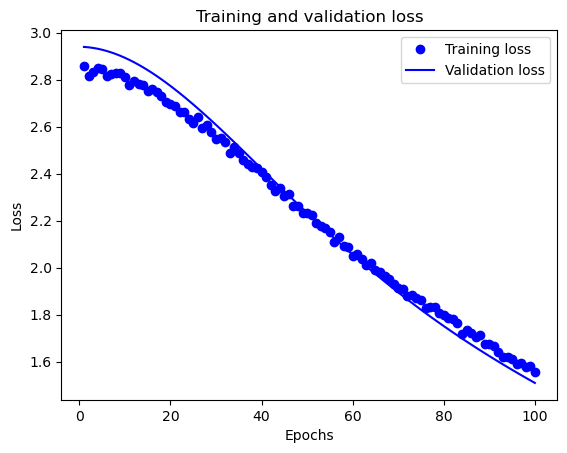

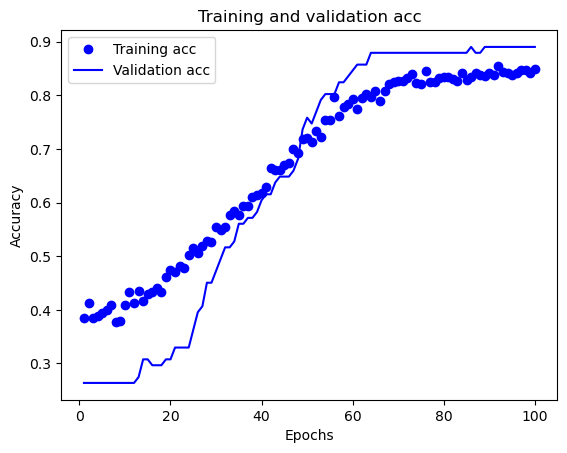

3/3 [==============================] - 0s 8ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 237ms/step - loss: 3.1996 - accuracy: 0.1531 - val_loss: 3.1158 - val_accuracy: 0.1319
Epoch 2/100
2/2 [==============================] - 0s 33ms/step - loss: 3.2319 - accuracy: 0.1470 - val_loss: 3.1137 - val_accuracy: 0.1319
Epoch 3/100
2/2 [==============================] - 0s 52ms/step - loss: 3.1791 - accuracy: 0.1628 - val_loss: 3.1105 - val_accuracy: 0.1319
Epoch 4/100
2/2 [==============================] - 0s 43ms/step - loss: 3.2128 - accuracy: 0.1519 - val_loss: 3.1061 - val_accuracy: 0.1319
Epoch 5/100
2/2 [=============

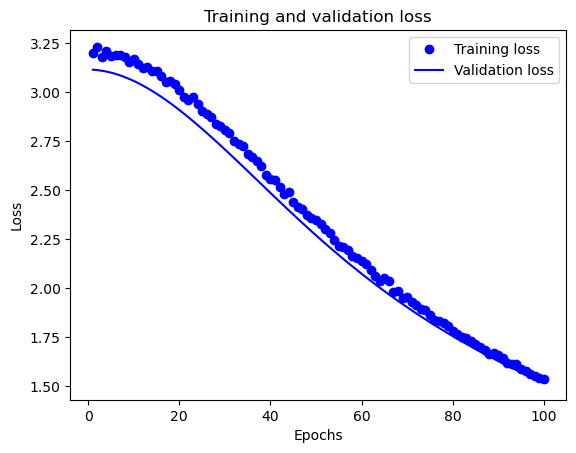

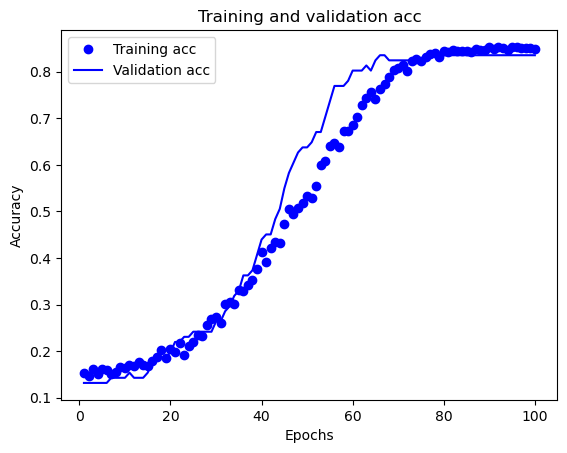

3/3 [==============================] - 0s 3ms/step
Experiment number: 6
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 255ms/step - loss: 5.8661 - accuracy: 0.2445 - val_loss: 5.2138 - val_accuracy: 0.4891
Epoch 2/100
2/2 [==============================] - 0s 37ms/step - loss: 5.8595 - accuracy: 0.2445 - val_loss: 5.2164 - val_accuracy: 0.4674
Epoch 3/100
2/2 [==============================] - 0s 33ms/step - loss: 5.8660 - accuracy: 0.2397 - val_loss: 5.2182 - val_accuracy: 0.4674
Epoch 4/100
2/2 [==============================] - 0s 43ms/step - loss: 5.8450 - accuracy: 0.2409 - val_loss: 5.2195 - val_accuracy: 0.4565
Epoch 5/100

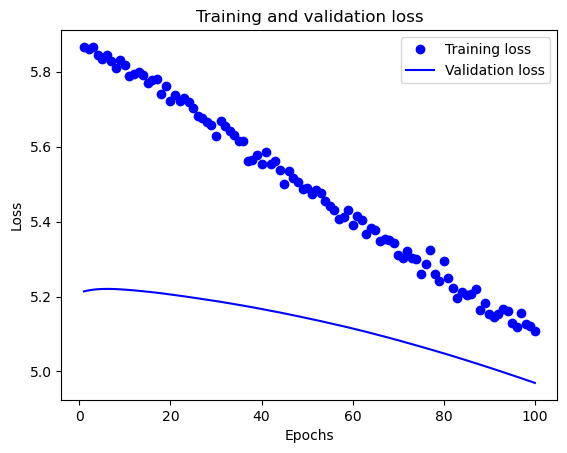

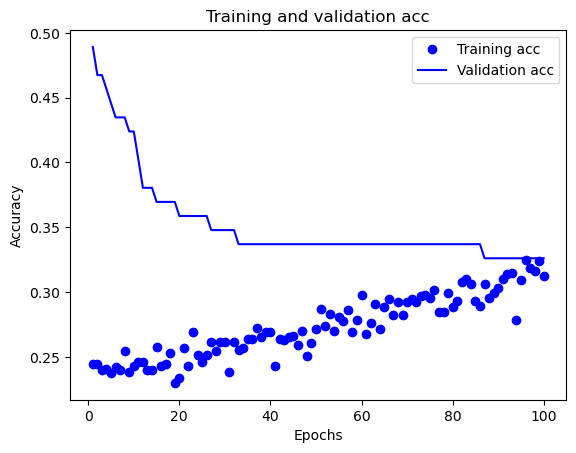

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 234ms/step - loss: 5.9552 - accuracy: 0.3650 - val_loss: 5.4981 - val_accuracy: 0.4130
Epoch 2/100
2/2 [==============================] - 0s 37ms/step - loss: 5.9185 - accuracy: 0.3869 - val_loss: 5.4970 - val_accuracy: 0.4130
Epoch 3/100
2/2 [==============================] - 0s 34ms/step - loss: 5.9057 - accuracy: 0.3504 - val_loss: 5.4950 - val_accuracy: 0.4130
Epoch 4/100
2/2 [==============================] - 0s 29ms/step - loss: 5.8818 - accuracy: 0.3759 - val_loss: 5.4925 - val_accuracy: 0.4130
Epoch 5/100
2/2 [===============

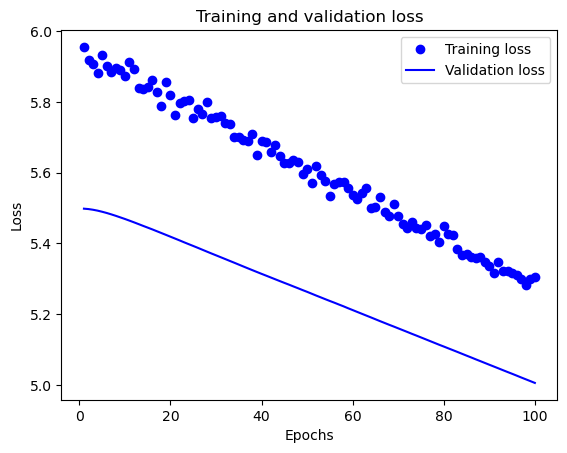

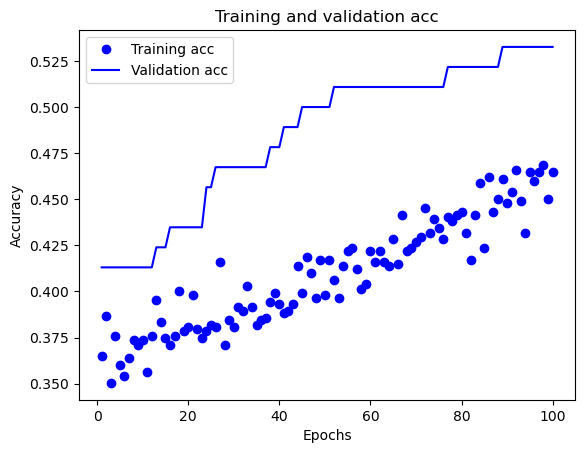

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 241ms/step - loss: 5.4402 - accuracy: 0.3504 - val_loss: 4.9060 - val_accuracy: 0.6413
Epoch 2/100
2/2 [==============================] - 0s 37ms/step - loss: 5.4572 - accuracy: 0.3479 - val_loss: 4.9078 - val_accuracy: 0.6413
Epoch 3/100
2/2 [==============================] - 0s 38ms/step - loss: 5.4509 - accuracy: 0.3370 - val_loss: 4.9091 - val_accuracy: 0.6413
Epoch 4/100
2/2 [==============================] - 0s 35ms/step - loss: 5.4482 - accuracy: 0.3491 - val_loss: 4.9096 - val_accuracy: 0.6304
Epoch 5/100
2/2 [================

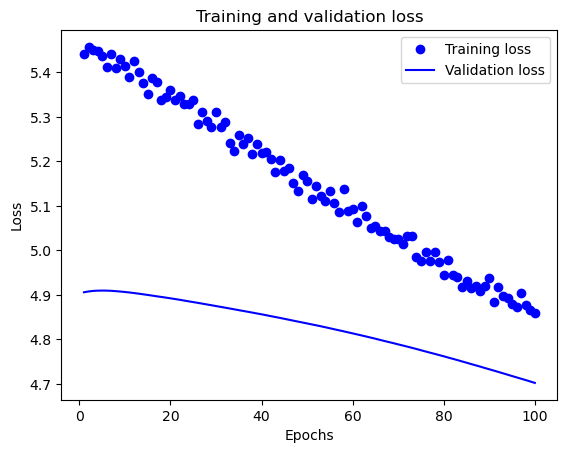

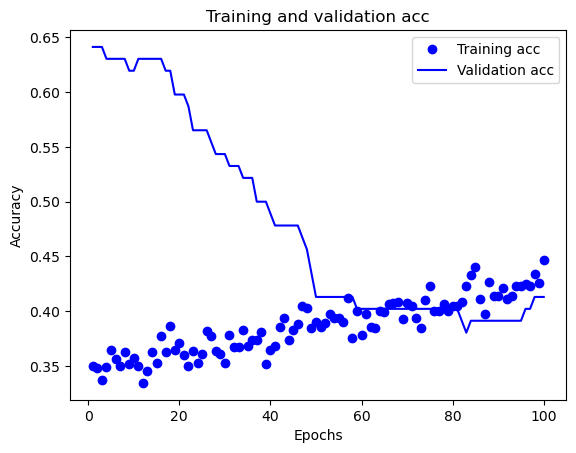

3/3 [==============================] - 0s 809us/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 244ms/step - loss: 5.7576 - accuracy: 0.3698 - val_loss: 5.5784 - val_accuracy: 0.3261
Epoch 2/100
2/2 [==============================] - 0s 36ms/step - loss: 5.7681 - accuracy: 0.3796 - val_loss: 5.5758 - val_accuracy: 0.3261
Epoch 3/100
2/2 [==============================] - 0s 34ms/step - loss: 5.7492 - accuracy: 0.3905 - val_loss: 5.5725 - val_accuracy: 0.3370
Epoch 4/100
2/2 [==============================] - 0s 33ms/step - loss: 5.7583 - accuracy: 0.3747 - val_loss: 5.5684 - val_accuracy: 0.3370
Epoch 5/100
2/2 [=============

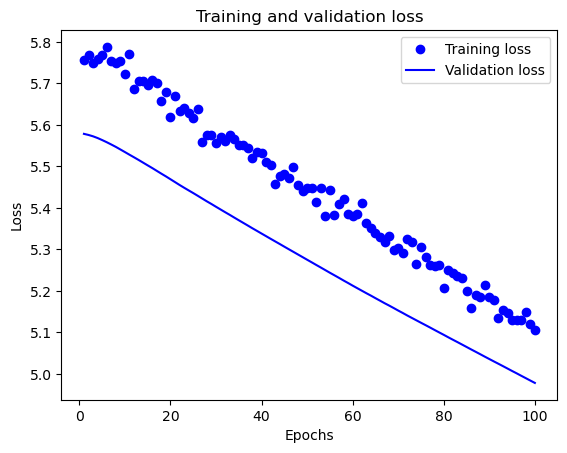

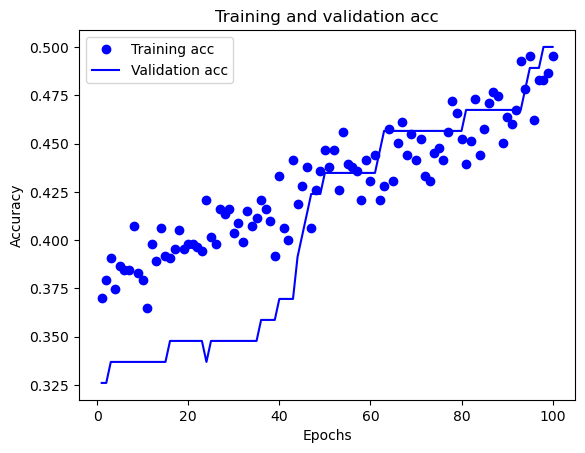

3/3 [==============================] - 0s 810us/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 2s 249ms/step - loss: 6.0125 - accuracy: 0.4678 - val_loss: 6.1630 - val_accuracy: 0.0769
Epoch 2/100
2/2 [==============================] - 0s 41ms/step - loss: 5.9790 - accuracy: 0.4787 - val_loss: 6.1559 - val_accuracy: 0.0769
Epoch 3/100
2/2 [==============================] - 0s 35ms/step - loss: 6.0574 - accuracy: 0.4569 - val_loss: 6.1476 - val_accuracy: 0.0989
Epoch 4/100
2/2 [==============================] - 0s 35ms/step - loss: 5.9995 - accuracy: 0.4617 - val_loss: 6.1385 - val_accuracy: 0.1099
Epoch 5/100
2/2 [=============

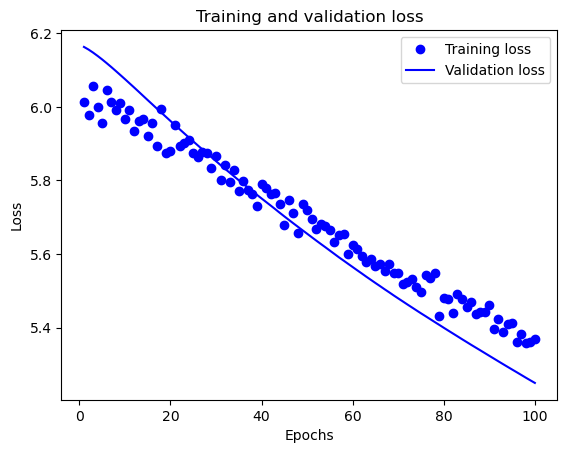

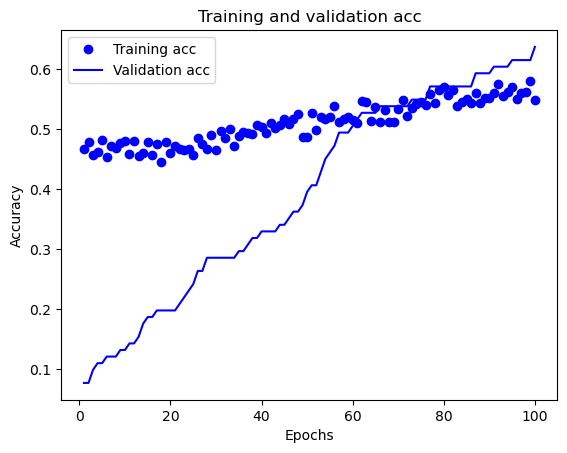

3/3 [==============================] - 0s 7ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 250ms/step - loss: 5.9386 - accuracy: 0.3609 - val_loss: 5.8519 - val_accuracy: 0.1868
Epoch 2/100
2/2 [==============================] - 0s 36ms/step - loss: 5.8558 - accuracy: 0.3694 - val_loss: 5.8456 - val_accuracy: 0.1868
Epoch 3/100
2/2 [==============================] - 0s 37ms/step - loss: 5.8639 - accuracy: 0.4010 - val_loss: 5.8384 - val_accuracy: 0.1758
Epoch 4/100
2/2 [==============================] - 0s 50ms/step - loss: 5.9202 - accuracy: 0.3694 - val_loss: 5.8304 - val_accuracy: 0.1758
Epoch 5/100
2/2 [===============

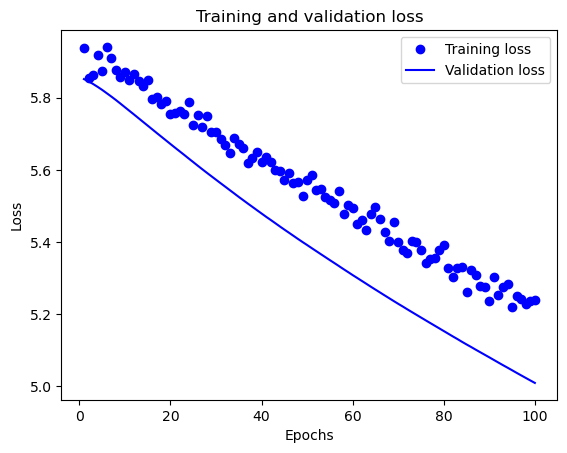

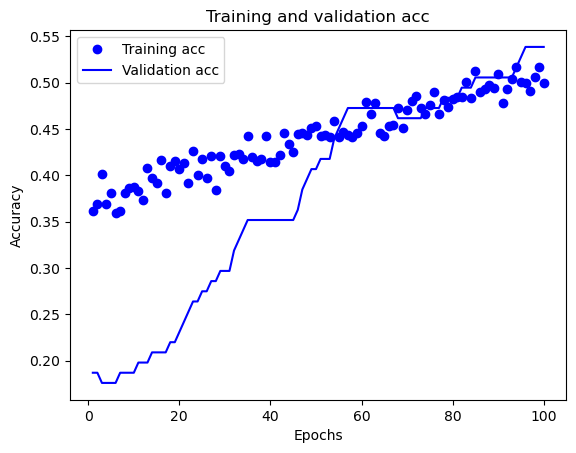

3/3 [==============================] - 0s 7ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 249ms/step - loss: 6.3536 - accuracy: 0.2697 - val_loss: 5.0395 - val_accuracy: 0.6813
Epoch 2/100
2/2 [==============================] - 0s 36ms/step - loss: 6.3442 - accuracy: 0.2697 - val_loss: 5.0449 - val_accuracy: 0.6703
Epoch 3/100
2/2 [==============================] - 0s 35ms/step - loss: 6.3234 - accuracy: 0.2880 - val_loss: 5.0497 - val_accuracy: 0.6593
Epoch 4/100
2/2 [==============================] - 0s 52ms/step - loss: 6.3295 - accuracy: 0.2722 - val_loss: 5.0538 - val_accuracy: 0.6374
Epoch 5/100
2/2 [===============

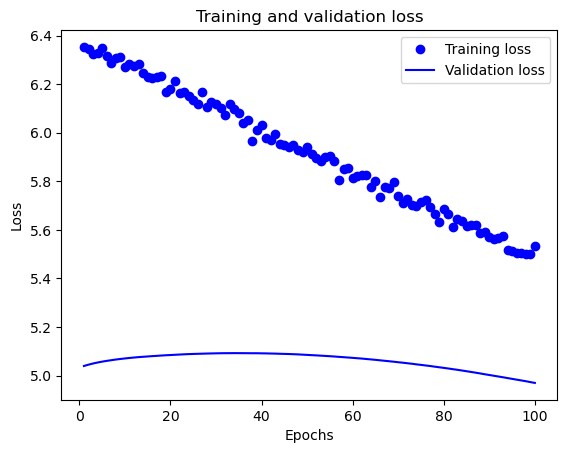

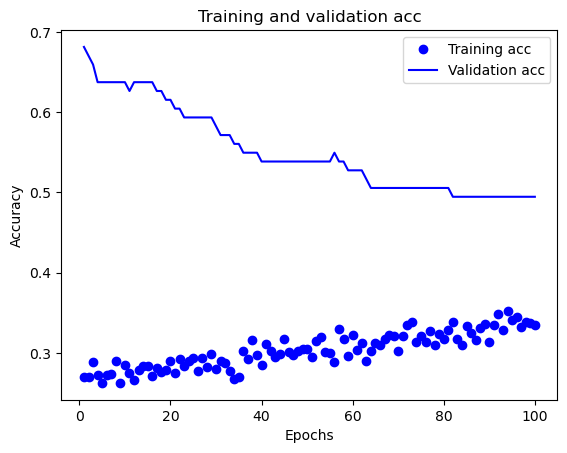

3/3 [==============================] - 0s 8ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 251ms/step - loss: 6.2403 - accuracy: 0.3038 - val_loss: 5.4637 - val_accuracy: 0.4835
Epoch 2/100
2/2 [==============================] - 0s 48ms/step - loss: 6.2146 - accuracy: 0.3013 - val_loss: 5.4707 - val_accuracy: 0.4615
Epoch 3/100
2/2 [==============================] - 0s 40ms/step - loss: 6.2840 - accuracy: 0.2916 - val_loss: 5.4769 - val_accuracy: 0.4505
Epoch 4/100
2/2 [==============================] - 0s 41ms/step - loss: 6.2002 - accuracy: 0.3001 - val_loss: 5.4819 - val_accuracy: 0.4396
Epoch 5/100
2/2 [===============

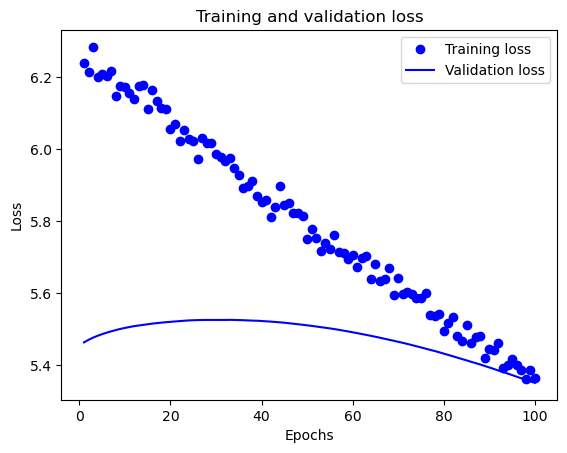

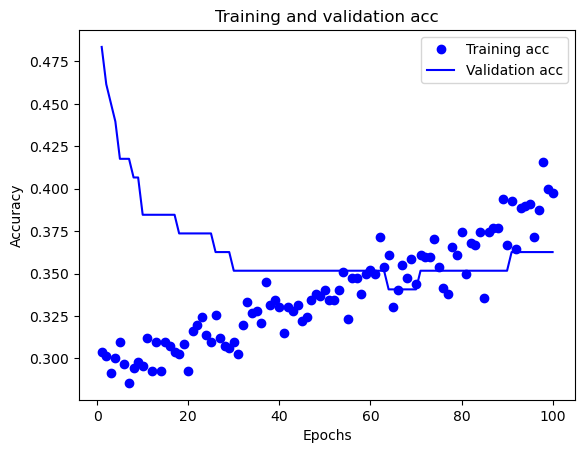

3/3 [==============================] - 0s 9ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 242ms/step - loss: 6.0547 - accuracy: 0.2916 - val_loss: 5.3942 - val_accuracy: 0.5934
Epoch 2/100
2/2 [==============================] - 0s 39ms/step - loss: 6.0652 - accuracy: 0.3098 - val_loss: 5.3985 - val_accuracy: 0.5824
Epoch 3/100
2/2 [==============================] - 0s 38ms/step - loss: 6.0461 - accuracy: 0.3026 - val_loss: 5.4017 - val_accuracy: 0.5824
Epoch 4/100
2/2 [==============================] - 0s 41ms/step - loss: 6.0296 - accuracy: 0.2989 - val_loss: 5.4043 - val_accuracy: 0.5604
Epoch 5/100
2/2 [===============

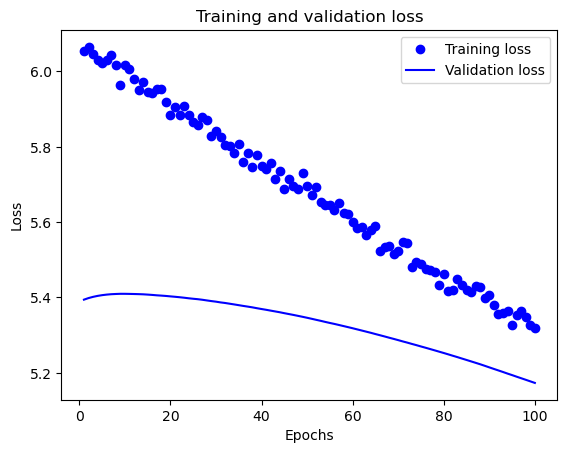

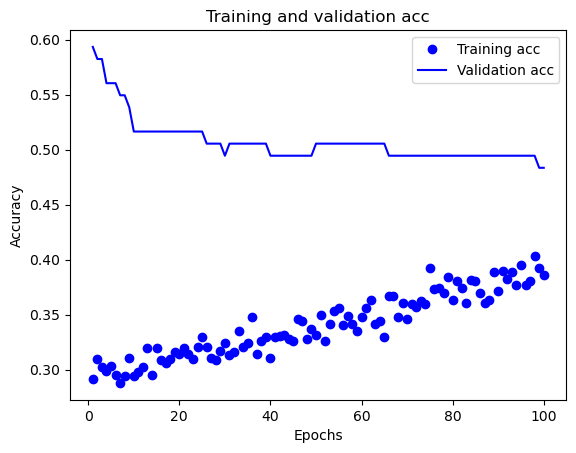

3/3 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 248ms/step - loss: 6.0991 - accuracy: 0.3354 - val_loss: 5.7677 - val_accuracy: 0.2527
Epoch 2/100
2/2 [==============================] - 0s 44ms/step - loss: 6.0898 - accuracy: 0.3183 - val_loss: 5.7653 - val_accuracy: 0.2637
Epoch 3/100
2/2 [==============================] - 0s 29ms/step - loss: 6.0654 - accuracy: 0.3232 - val_loss: 5.7623 - val_accuracy: 0.2637
Epoch 4/100
2/2 [==============================] - 0s 33ms/step - loss: 6.0750 - accuracy: 0.3244 - val_loss: 5.7584 - val_accuracy: 0.2637
Epoch 5/100
2/2 [===============

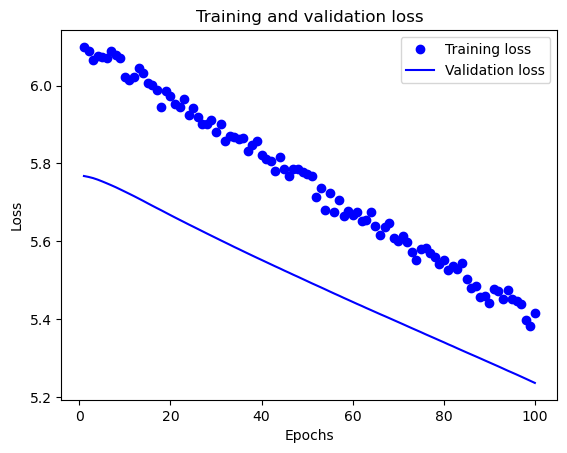

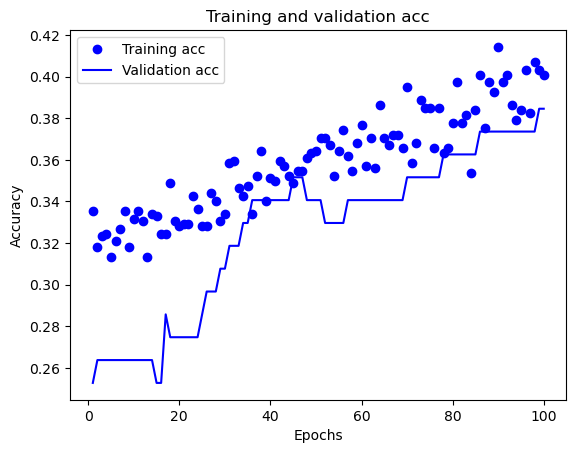

3/3 [==============================] - 0s 0s/step
Experiment number: 7
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 43ms/step - loss: 3.7505 - accuracy: 0.4136 - val_loss: 3.2088 - val_accuracy: 0.4674
Epoch 2/100
7/7 [==============================] - 0s 10ms/step - loss: 3.7634 - accuracy: 0.4258 - val_loss: 3.2089 - val_accuracy: 0.4783
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 3.7392 - accuracy: 0.4161 - val_loss: 3.2083 - val_accuracy: 0.4783
Epoch 4/100
7/7 [==============================] - 0s 9ms/step - loss: 3.6711 - accuracy: 0.4221 - val_loss: 3.2069 - val_accuracy: 0.4891
Epoch 5/100


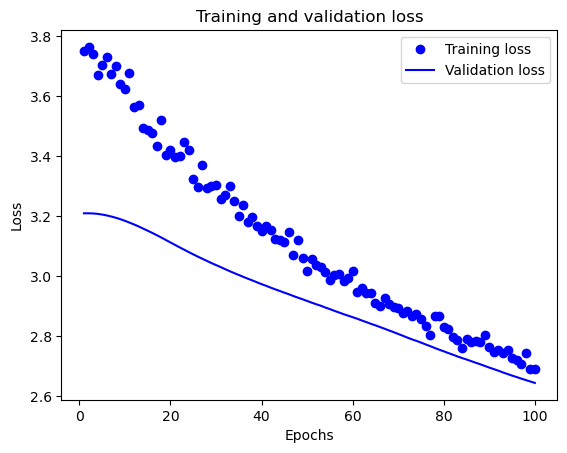

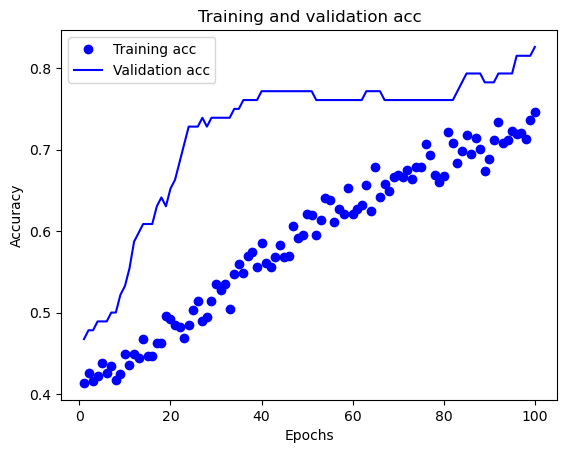

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 44ms/step - loss: 3.7201 - accuracy: 0.4380 - val_loss: 3.1596 - val_accuracy: 0.4674
Epoch 2/100
7/7 [==============================] - 0s 7ms/step - loss: 3.7016 - accuracy: 0.4465 - val_loss: 3.1586 - val_accuracy: 0.4674
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 3.6667 - accuracy: 0.4623 - val_loss: 3.1570 - val_accuracy: 0.4891
Epoch 4/100
7/7 [==============================] - 0s 12ms/step - loss: 3.6974 - accuracy: 0.4513 - val_loss: 3.1546 - val_accuracy: 0.4674
Epoch 5/100
7/7 [================

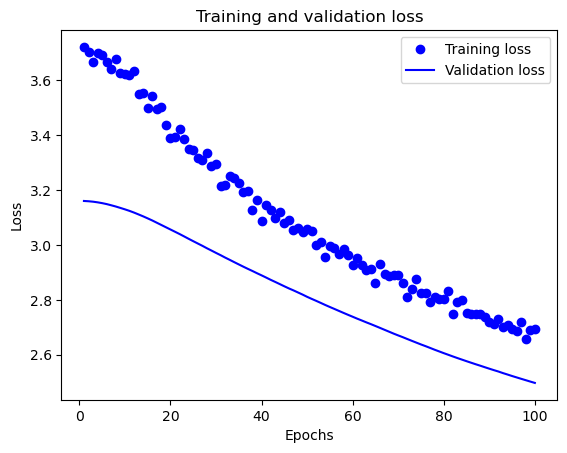

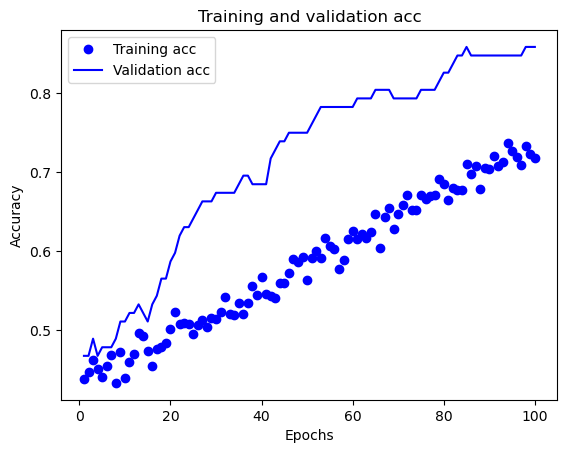

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 44ms/step - loss: 4.0413 - accuracy: 0.3333 - val_loss: 3.0918 - val_accuracy: 0.5870
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 3.9825 - accuracy: 0.3297 - val_loss: 3.0969 - val_accuracy: 0.5761
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 3.9661 - accuracy: 0.3370 - val_loss: 3.1011 - val_accuracy: 0.5652
Epoch 4/100
7/7 [==============================] - 0s 9ms/step - loss: 3.9154 - accuracy: 0.3370 - val_loss: 3.1044 - val_accuracy: 0.5543
Epoch 5/100
7/7 [=================

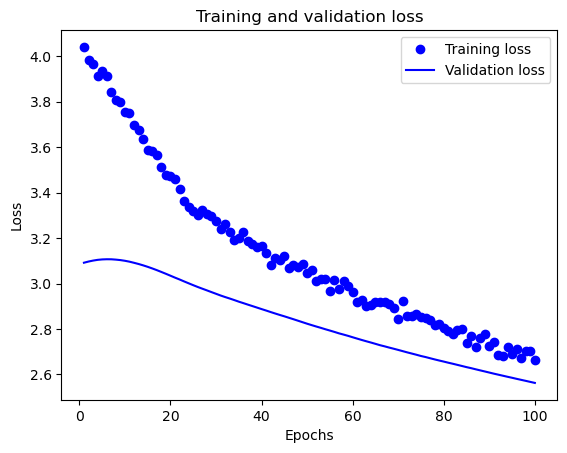

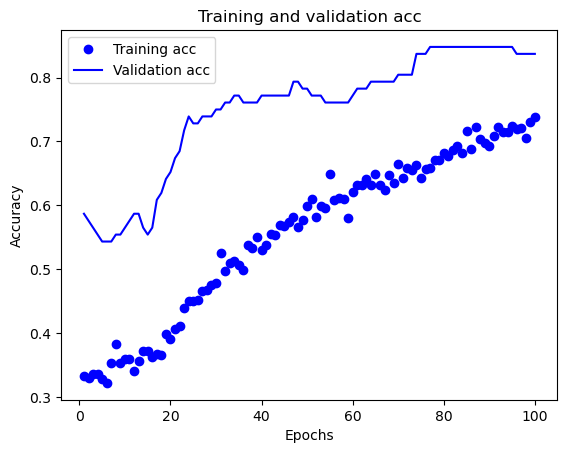

3/3 [==============================] - 0s 223us/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 42ms/step - loss: 3.8567 - accuracy: 0.3698 - val_loss: 3.5137 - val_accuracy: 0.1196
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 3.9628 - accuracy: 0.3491 - val_loss: 3.5024 - val_accuracy: 0.1196
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 3.8797 - accuracy: 0.3394 - val_loss: 3.4899 - val_accuracy: 0.1196
Epoch 4/100
7/7 [==============================] - 0s 9ms/step - loss: 3.8690 - accuracy: 0.3637 - val_loss: 3.4770 - val_accuracy: 0.1196
Epoch 5/100
7/7 [==============

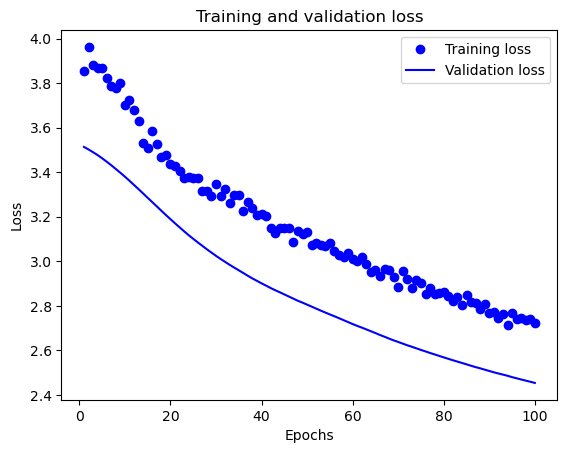

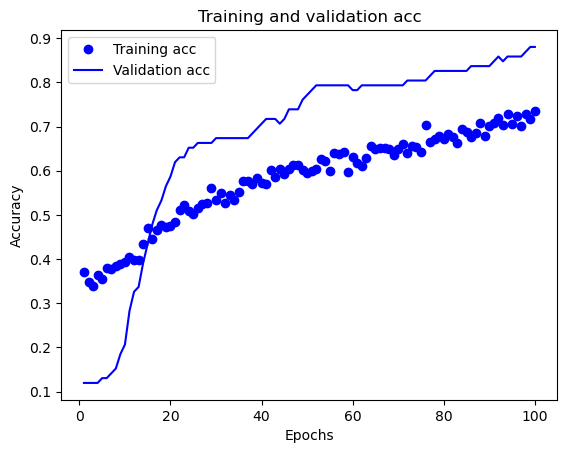

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 46ms/step - loss: 3.6319 - accuracy: 0.3925 - val_loss: 3.2242 - val_accuracy: 0.3736
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 3.5748 - accuracy: 0.3961 - val_loss: 3.2204 - val_accuracy: 0.4066
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 3.5806 - accuracy: 0.4022 - val_loss: 3.2157 - val_accuracy: 0.4066
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 3.5929 - accuracy: 0.3949 - val_loss: 3.2107 - val_accuracy: 0.4176
Epoch 5/100
7/7 [=================

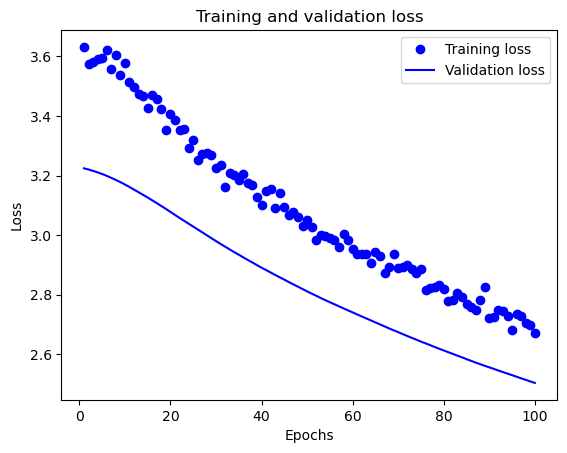

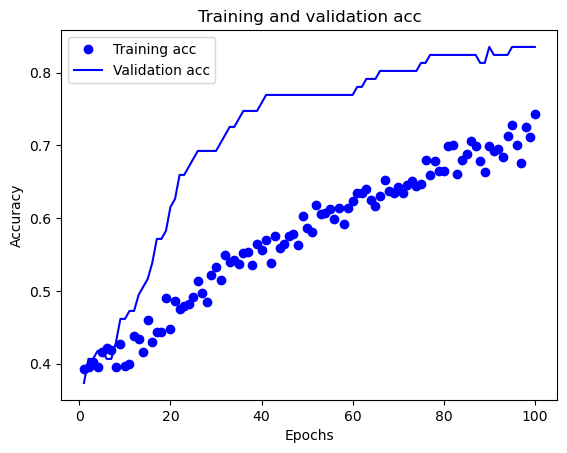

3/3 [==============================] - 0s 7ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 45ms/step - loss: 3.8405 - accuracy: 0.3147 - val_loss: 3.2801 - val_accuracy: 0.2747
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 3.8058 - accuracy: 0.3123 - val_loss: 3.2802 - val_accuracy: 0.2747
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 3.9317 - accuracy: 0.3050 - val_loss: 3.2786 - val_accuracy: 0.2747
Epoch 4/100
7/7 [==============================] - 0s 9ms/step - loss: 3.8104 - accuracy: 0.3572 - val_loss: 3.2762 - val_accuracy: 0.2967
Epoch 5/100
7/7 [================

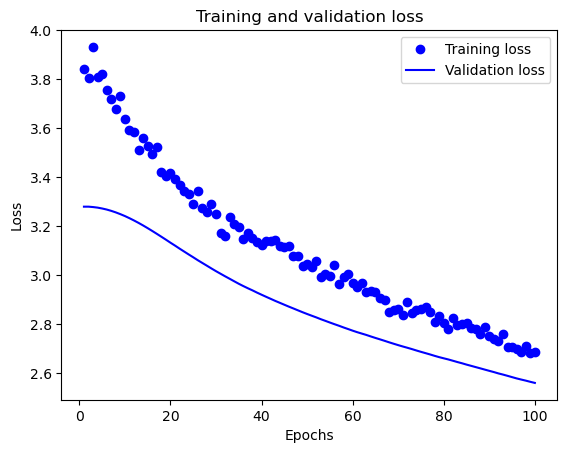

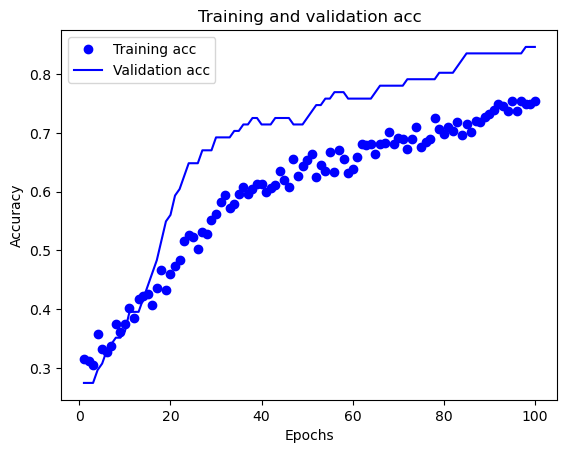

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 44ms/step - loss: 3.9697 - accuracy: 0.2649 - val_loss: 3.1982 - val_accuracy: 0.3516
Epoch 2/100
7/7 [==============================] - 0s 11ms/step - loss: 3.9747 - accuracy: 0.2491 - val_loss: 3.2007 - val_accuracy: 0.3516
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 3.9073 - accuracy: 0.2515 - val_loss: 3.2025 - val_accuracy: 0.3407
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 3.9244 - accuracy: 0.2442 - val_loss: 3.2032 - val_accuracy: 0.3297
Epoch 5/100
7/7 [================

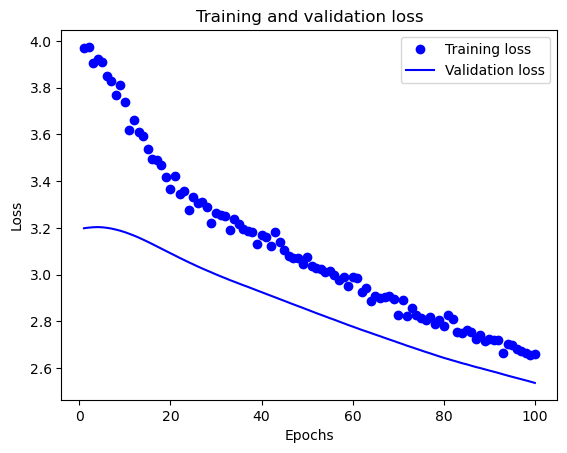

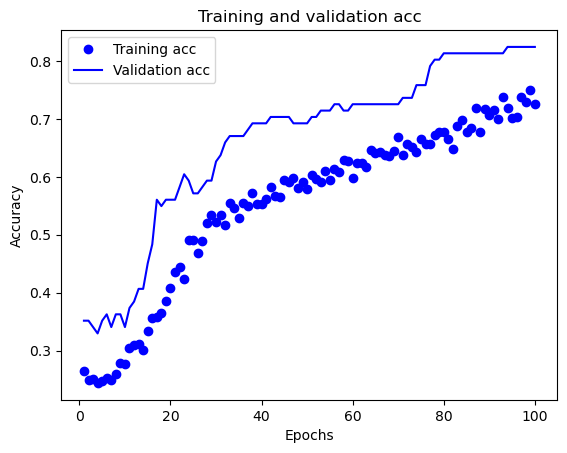

3/3 [==============================] - 0s 8ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 44ms/step - loss: 4.3033 - accuracy: 0.3524 - val_loss: 3.4923 - val_accuracy: 0.2308
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 4.2998 - accuracy: 0.3560 - val_loss: 3.4853 - val_accuracy: 0.2308
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 4.2409 - accuracy: 0.3706 - val_loss: 3.4778 - val_accuracy: 0.2418
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 4.2530 - accuracy: 0.3597 - val_loss: 3.4700 - val_accuracy: 0.2418
Epoch 5/100
7/7 [================

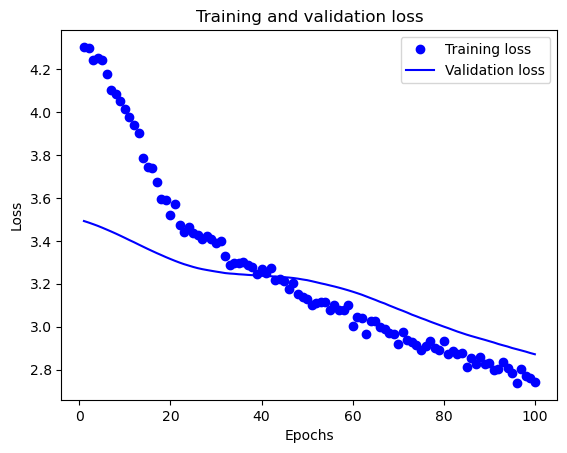

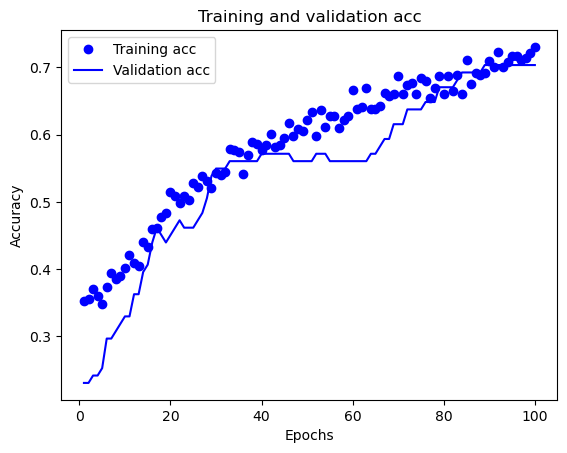

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 45ms/step - loss: 3.7160 - accuracy: 0.2989 - val_loss: 3.3087 - val_accuracy: 0.1538
Epoch 2/100
7/7 [==============================] - 0s 10ms/step - loss: 3.7105 - accuracy: 0.3123 - val_loss: 3.3055 - val_accuracy: 0.1538
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 3.7226 - accuracy: 0.3026 - val_loss: 3.3017 - val_accuracy: 0.1538
Epoch 4/100
7/7 [==============================] - 0s 9ms/step - loss: 3.7008 - accuracy: 0.3183 - val_loss: 3.2970 - val_accuracy: 0.1538
Epoch 5/100
7/7 [===============

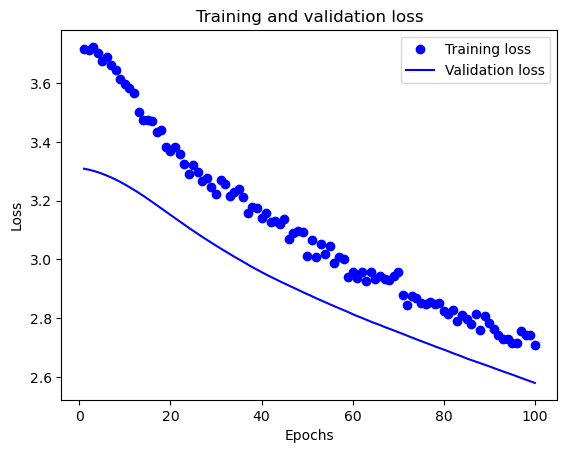

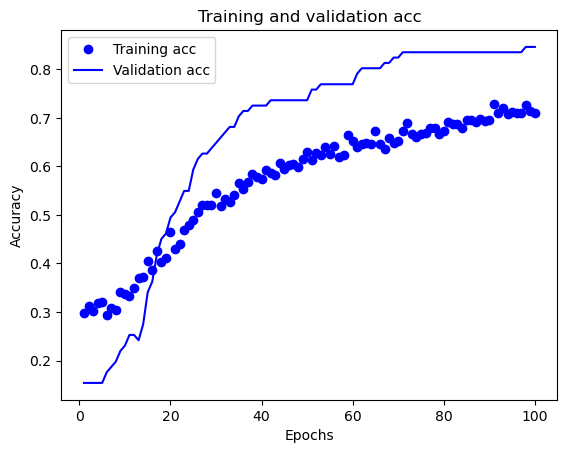

3/3 [==============================] - 0s 4ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 42ms/step - loss: 3.7303 - accuracy: 0.3852 - val_loss: 3.2614 - val_accuracy: 0.1868
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 3.7692 - accuracy: 0.3657 - val_loss: 3.2584 - val_accuracy: 0.2198
Epoch 3/100
7/7 [==============================] - 0s 11ms/step - loss: 3.8016 - accuracy: 0.3657 - val_loss: 3.2547 - val_accuracy: 0.2198
Epoch 4/100
7/7 [==============================] - 0s 9ms/step - loss: 3.7085 - accuracy: 0.3706 - val_loss: 3.2499 - val_accuracy: 0.2198
Epoch 5/100
7/7 [===============

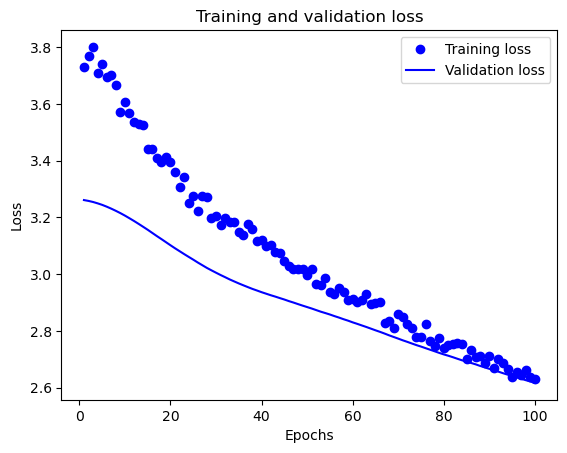

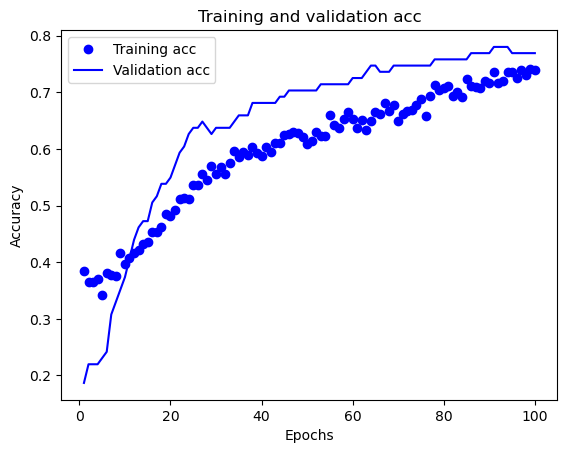

3/3 [==============================] - 0s 3ms/step
Experiment number: 8
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 247ms/step - loss: 1.8888 - accuracy: 0.3686 - val_loss: 1.2368 - val_accuracy: 0.5978
Epoch 2/100
2/2 [==============================] - 0s 32ms/step - loss: 1.8944 - accuracy: 0.3735 - val_loss: 1.2396 - val_accuracy: 0.5978
Epoch 3/100
2/2 [==============================] - 0s 34ms/step - loss: 1.8994 - accuracy: 0.3747 - val_loss: 1.2418 - val_accuracy: 0.5978
Epoch 4/100
2/2 [==============================] - 0s 36ms/step - loss: 1.8497 - accuracy: 0.3929 - val_loss: 1.2437 - val_accuracy: 0.5978
Epoch 5/

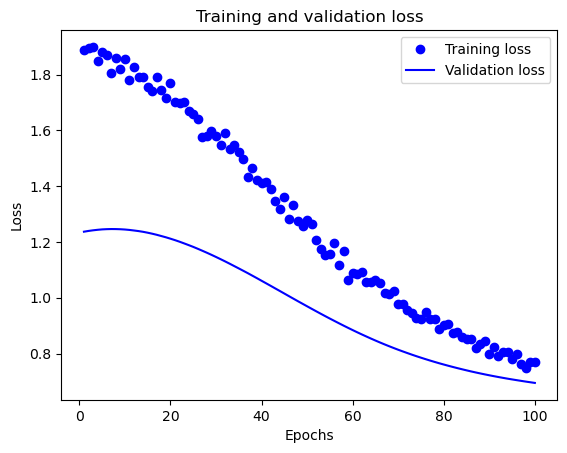

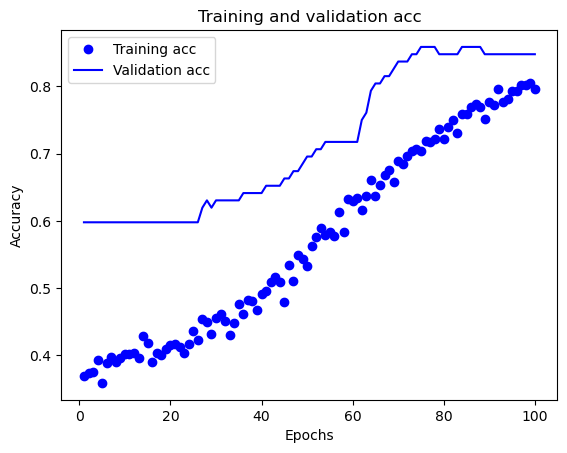

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 238ms/step - loss: 1.5155 - accuracy: 0.3321 - val_loss: 1.1930 - val_accuracy: 0.4783
Epoch 2/100
2/2 [==============================] - 0s 41ms/step - loss: 1.5346 - accuracy: 0.3309 - val_loss: 1.1939 - val_accuracy: 0.4783
Epoch 3/100
2/2 [==============================] - 0s 40ms/step - loss: 1.5565 - accuracy: 0.3309 - val_loss: 1.1944 - val_accuracy: 0.4674
Epoch 4/100
2/2 [==============================] - 0s 35ms/step - loss: 1.5095 - accuracy: 0.3309 - val_loss: 1.1946 - val_accuracy: 0.4674
Epoch 5/100
2/2 [=============

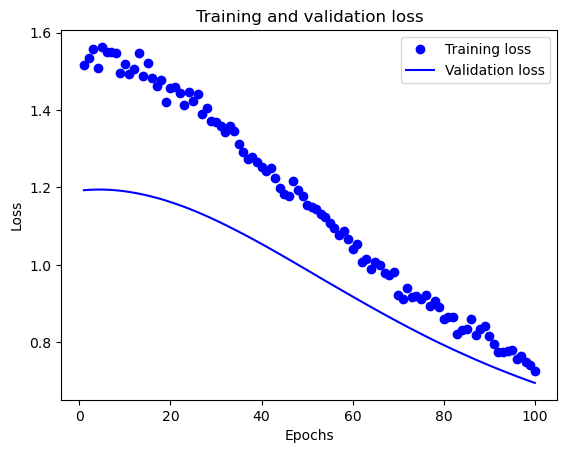

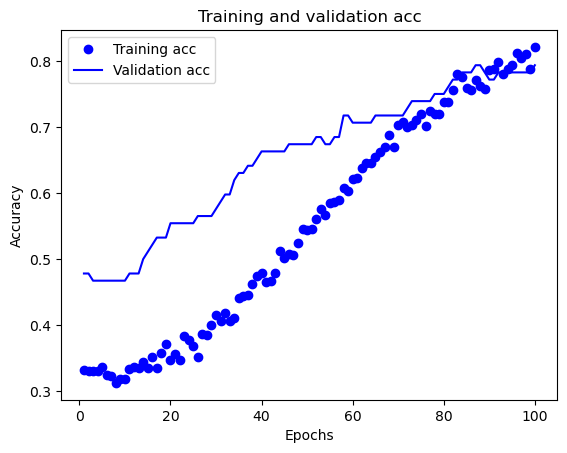

3/3 [==============================] - 0s 5ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 246ms/step - loss: 1.6091 - accuracy: 0.2117 - val_loss: 1.0757 - val_accuracy: 0.5870
Epoch 2/100
2/2 [==============================] - 0s 35ms/step - loss: 1.6312 - accuracy: 0.1959 - val_loss: 1.0779 - val_accuracy: 0.5761
Epoch 3/100
2/2 [==============================] - 0s 43ms/step - loss: 1.6073 - accuracy: 0.2482 - val_loss: 1.0798 - val_accuracy: 0.5761
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 1.5992 - accuracy: 0.2129 - val_loss: 1.0816 - val_accuracy: 0.5761
Epoch 5/100
2/2 [============

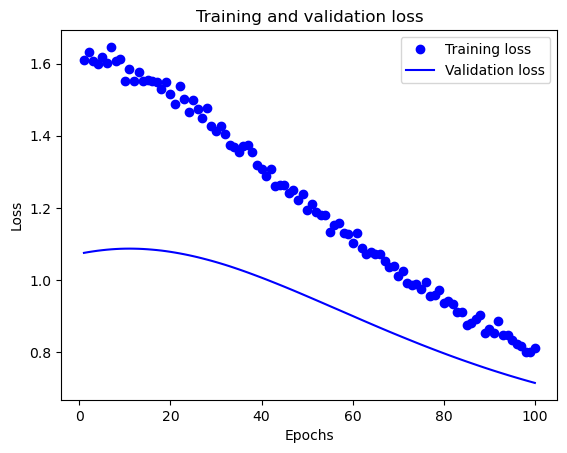

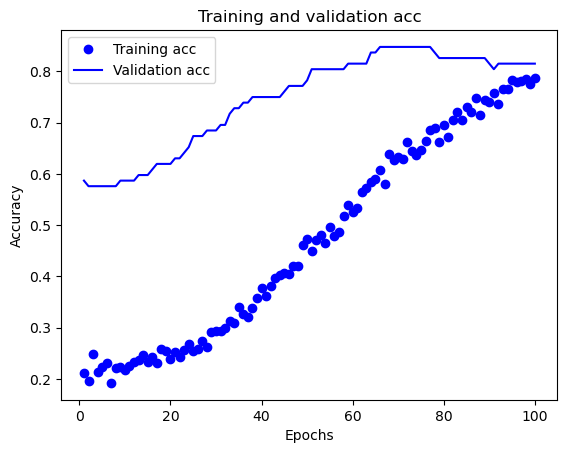

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
2/2 [==============================] - 1s 235ms/step - loss: 1.7047 - accuracy: 0.3491 - val_loss: 1.5946 - val_accuracy: 0.2283
Epoch 2/100
2/2 [==============================] - 0s 38ms/step - loss: 1.6907 - accuracy: 0.3163 - val_loss: 1.5892 - val_accuracy: 0.2391
Epoch 3/100
2/2 [==============================] - 0s 48ms/step - loss: 1.7032 - accuracy: 0.3394 - val_loss: 1.5838 - val_accuracy: 0.2391
Epoch 4/100
2/2 [==============================] - 0s 45ms/step - loss: 1.6811 - accuracy: 0.3650 - val_loss: 1.5774 - val_accuracy: 0.2500
Epoch 5/100
2/2 [=============

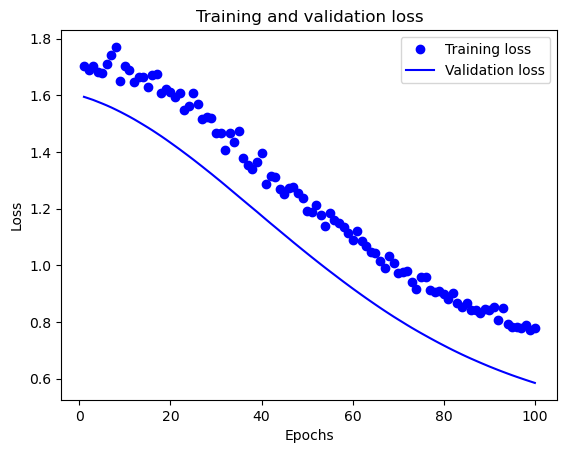

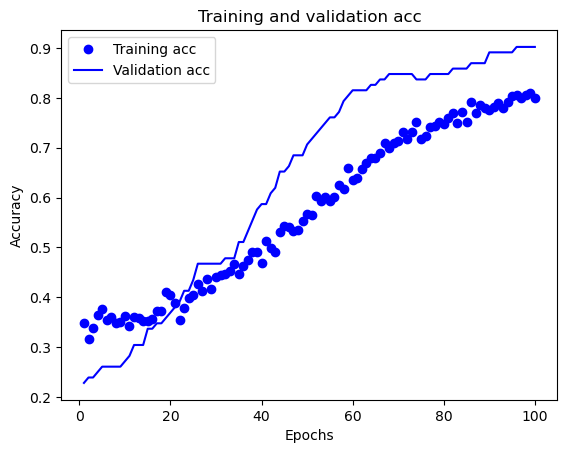

3/3 [==============================] - 0s 7ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 329ms/step - loss: 1.8361 - accuracy: 0.2989 - val_loss: 1.4369 - val_accuracy: 0.2527
Epoch 2/100
2/2 [==============================] - 0s 49ms/step - loss: 1.7888 - accuracy: 0.2928 - val_loss: 1.4372 - val_accuracy: 0.2637
Epoch 3/100
2/2 [==============================] - 0s 49ms/step - loss: 1.7836 - accuracy: 0.2953 - val_loss: 1.4368 - val_accuracy: 0.2637
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 1.7655 - accuracy: 0.2953 - val_loss: 1.4361 - val_accuracy: 0.2637
Epoch 5/100
2/2 [============

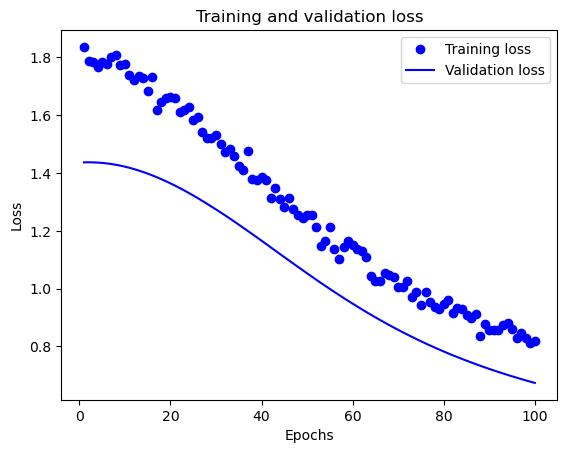

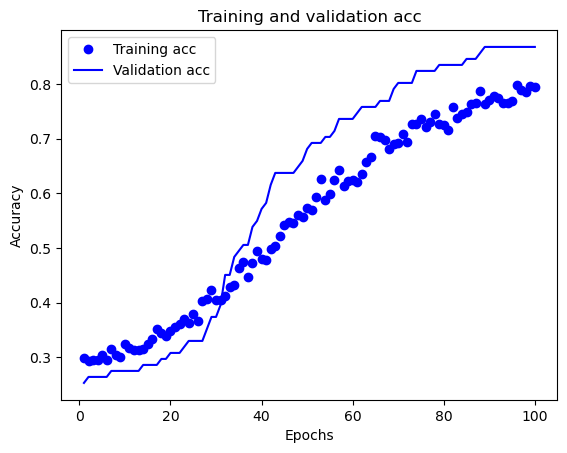

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 250ms/step - loss: 1.8431 - accuracy: 0.2880 - val_loss: 1.1962 - val_accuracy: 0.5275
Epoch 2/100
2/2 [==============================] - 0s 36ms/step - loss: 1.7923 - accuracy: 0.2904 - val_loss: 1.1991 - val_accuracy: 0.5275
Epoch 3/100
2/2 [==============================] - 0s 49ms/step - loss: 1.8788 - accuracy: 0.2819 - val_loss: 1.2015 - val_accuracy: 0.5275
Epoch 4/100
2/2 [==============================] - 0s 36ms/step - loss: 1.8351 - accuracy: 0.2783 - val_loss: 1.2035 - val_accuracy: 0.5055
Epoch 5/100
2/2 [=============

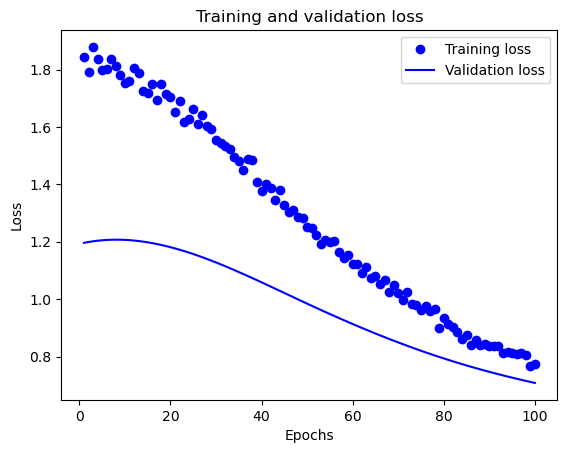

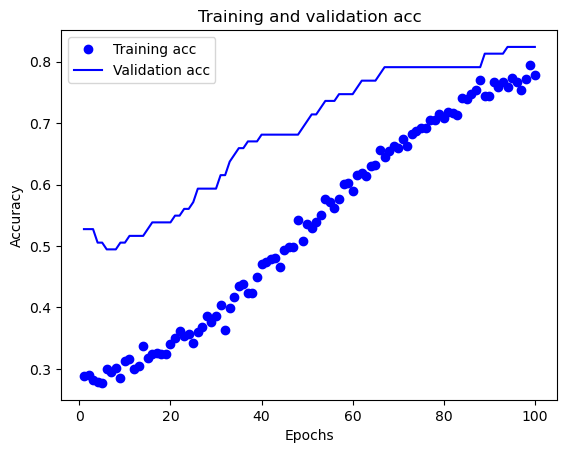

3/3 [==============================] - 0s 262us/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 265ms/step - loss: 2.2521 - accuracy: 0.2977 - val_loss: 1.0946 - val_accuracy: 0.6044
Epoch 2/100
2/2 [==============================] - 0s 47ms/step - loss: 2.2106 - accuracy: 0.3026 - val_loss: 1.1007 - val_accuracy: 0.6044
Epoch 3/100
2/2 [==============================] - 0s 33ms/step - loss: 2.2567 - accuracy: 0.2953 - val_loss: 1.1061 - val_accuracy: 0.6044
Epoch 4/100
2/2 [==============================] - 0s 32ms/step - loss: 2.2387 - accuracy: 0.3001 - val_loss: 1.1109 - val_accuracy: 0.6044
Epoch 5/100
2/2 [==========

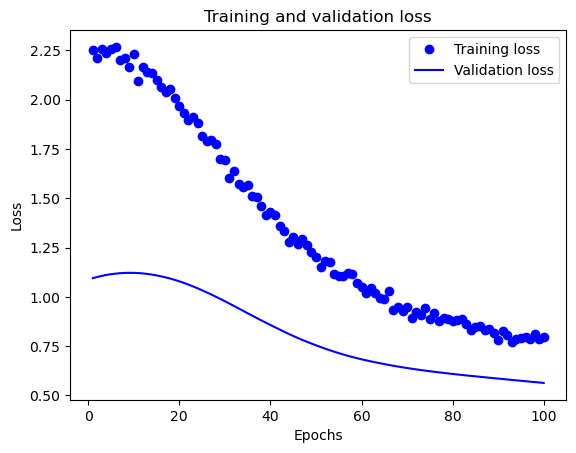

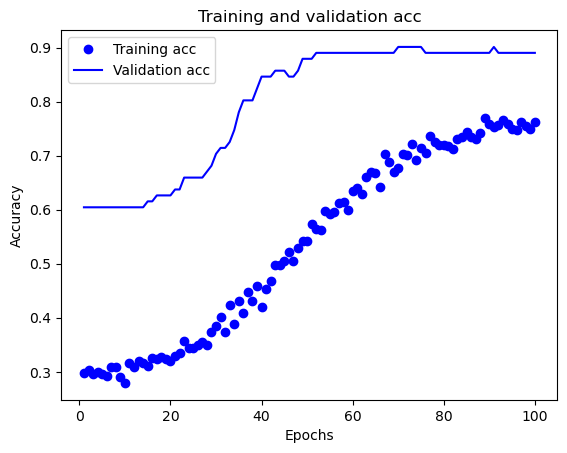

3/3 [==============================] - 0s 8ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 247ms/step - loss: 1.6852 - accuracy: 0.3584 - val_loss: 1.3981 - val_accuracy: 0.2967
Epoch 2/100
2/2 [==============================] - 0s 47ms/step - loss: 1.6602 - accuracy: 0.3524 - val_loss: 1.3975 - val_accuracy: 0.2967
Epoch 3/100
2/2 [==============================] - 0s 47ms/step - loss: 1.6931 - accuracy: 0.3560 - val_loss: 1.3968 - val_accuracy: 0.2967
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 1.6131 - accuracy: 0.3694 - val_loss: 1.3953 - val_accuracy: 0.2967
Epoch 5/100
2/2 [============

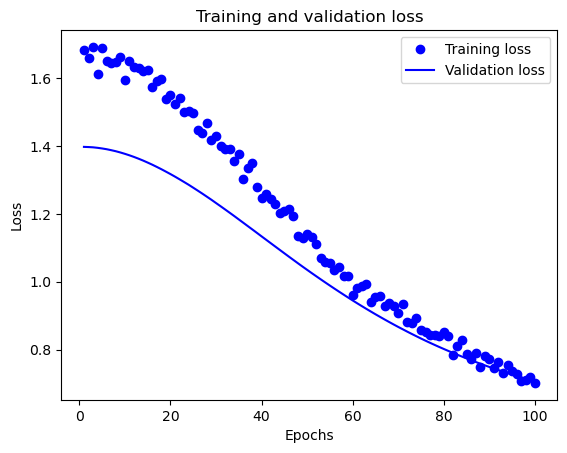

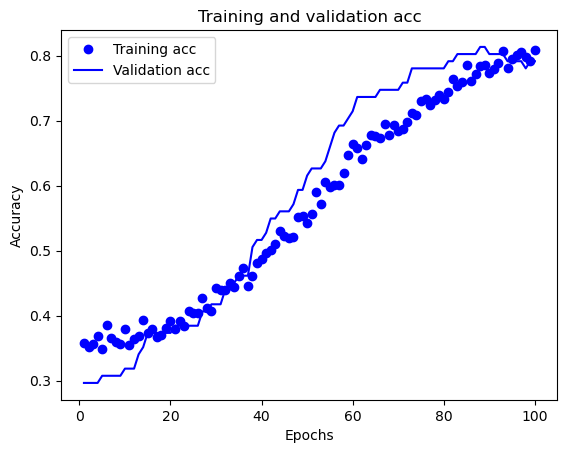

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 249ms/step - loss: 2.1760 - accuracy: 0.3366 - val_loss: 2.1115 - val_accuracy: 0.0549
Epoch 2/100
2/2 [==============================] - 0s 54ms/step - loss: 2.1544 - accuracy: 0.3597 - val_loss: 2.1046 - val_accuracy: 0.0659
Epoch 3/100
2/2 [==============================] - 0s 37ms/step - loss: 2.2286 - accuracy: 0.3354 - val_loss: 2.0970 - val_accuracy: 0.0659
Epoch 4/100
2/2 [==============================] - 0s 52ms/step - loss: 2.1932 - accuracy: 0.3463 - val_loss: 2.0884 - val_accuracy: 0.0769
Epoch 5/100
2/2 [=============

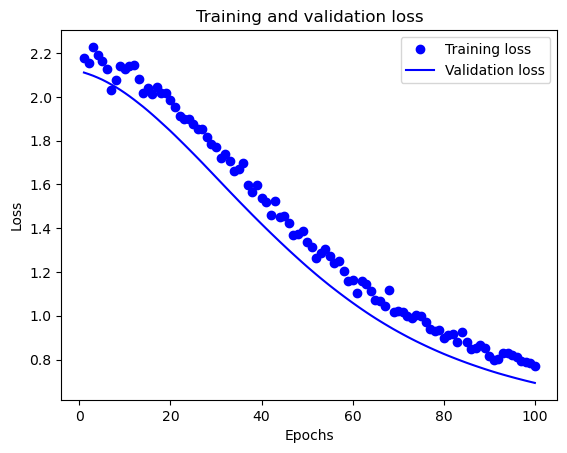

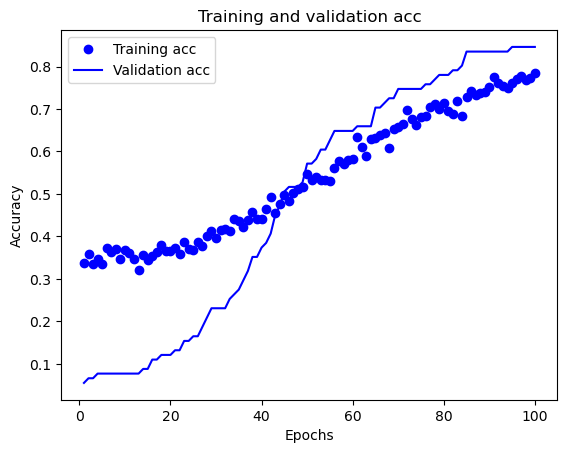

3/3 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 512
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
2/2 [==============================] - 1s 250ms/step - loss: 1.7702 - accuracy: 0.3062 - val_loss: 1.3022 - val_accuracy: 0.3846
Epoch 2/100
2/2 [==============================] - 0s 46ms/step - loss: 1.7390 - accuracy: 0.3329 - val_loss: 1.3045 - val_accuracy: 0.3846
Epoch 3/100
2/2 [==============================] - 0s 42ms/step - loss: 1.7226 - accuracy: 0.3293 - val_loss: 1.3061 - val_accuracy: 0.3846
Epoch 4/100
2/2 [==============================] - 0s 40ms/step - loss: 1.7421 - accuracy: 0.3305 - val_loss: 1.3074 - val_accuracy: 0.3846
Epoch 5/100
2/2 [============

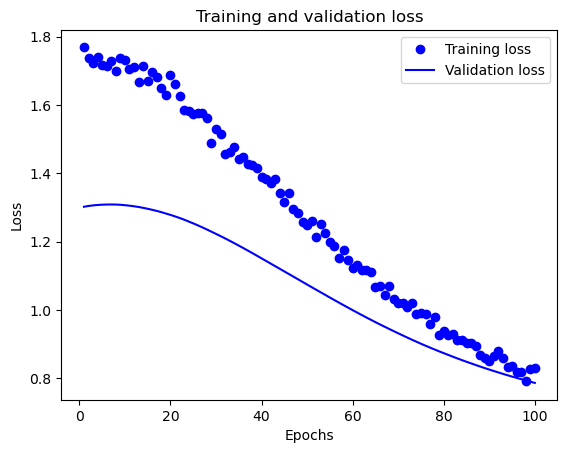

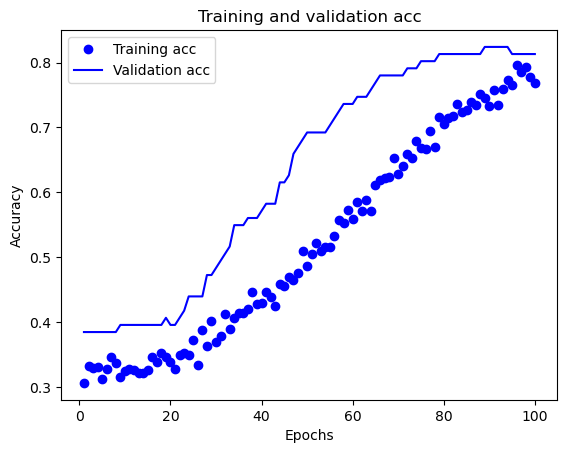

3/3 [==============================] - 0s 0s/step
Experiment number: 9
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 43ms/step - loss: 10.6647 - accuracy: 0.6375 - val_loss: 8.8109 - val_accuracy: 0.8370
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 8.0621 - accuracy: 0.8443 - val_loss: 5.2377 - val_accuracy: 0.8370
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 5.4273 - accuracy: 0.8248 - val_loss: 4.6497 - val_accuracy: 0.8370
Epoch 4/100
7/7 [==============================] - 0s 10ms/step - loss: 4.5528 - accuracy: 0.8321 - val_loss: 4.6285 - val_accuracy: 0.8370
Epoch 5/100
7/7 

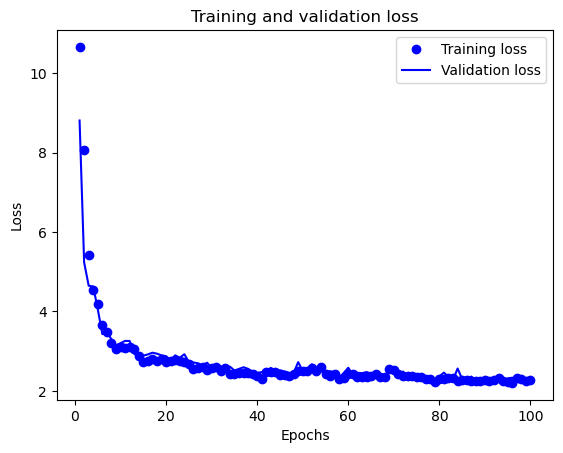

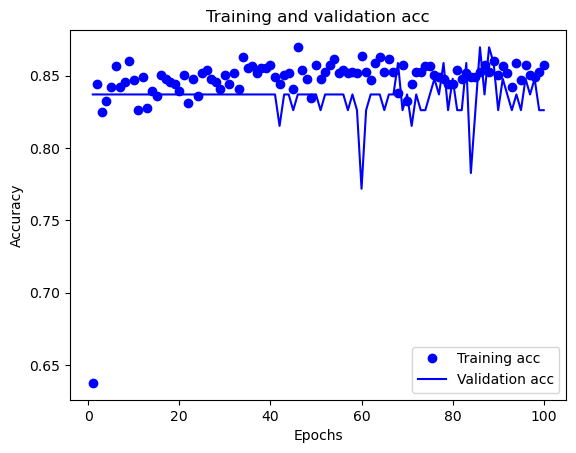

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 44ms/step - loss: 10.8149 - accuracy: 0.5900 - val_loss: 8.9593 - val_accuracy: 0.7935
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 7.9730 - accuracy: 0.8358 - val_loss: 5.3568 - val_accuracy: 0.7935
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 5.6049 - accuracy: 0.8224 - val_loss: 4.9858 - val_accuracy: 0.7935
Epoch 4/100
7/7 [==============================] - 0s 9ms/step - loss: 4.7065 - accuracy: 0.8212 - val_loss: 4.7175 - val_accuracy: 0.7935
Epoch 5/100
7/7 [====================

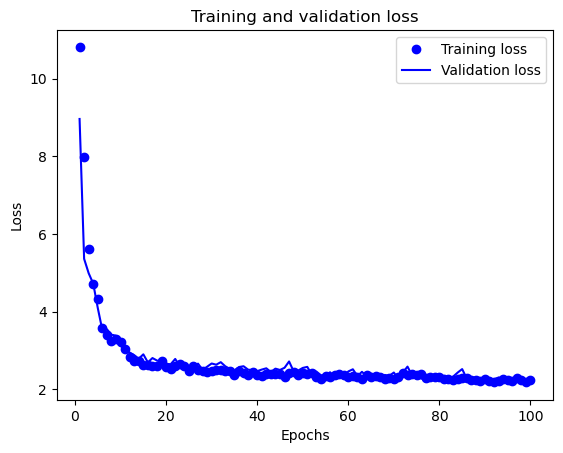

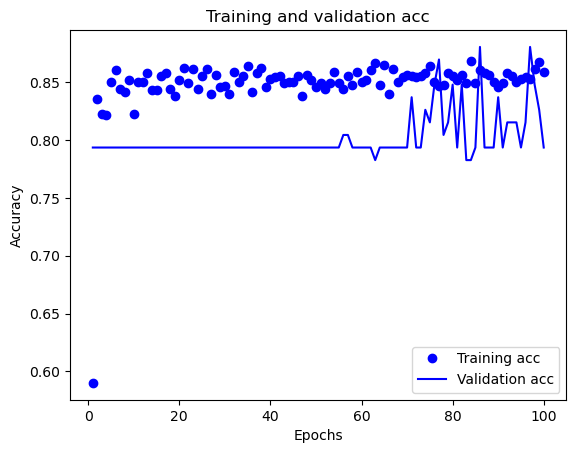

3/3 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 2s 131ms/step - loss: 10.8341 - accuracy: 0.5791 - val_loss: 9.0507 - val_accuracy: 0.8152
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 8.4503 - accuracy: 0.8285 - val_loss: 5.5821 - val_accuracy: 0.8152
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 5.6891 - accuracy: 0.8187 - val_loss: 5.1974 - val_accuracy: 0.8152
Epoch 4/100
7/7 [==============================] - 0s 9ms/step - loss: 4.7125 - accuracy: 0.8431 - val_loss: 4.7360 - val_accuracy: 0.8152
Epoch 5/100
7/7 [===================

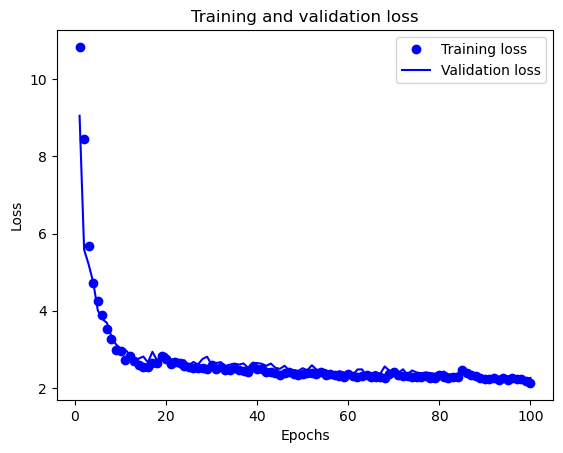

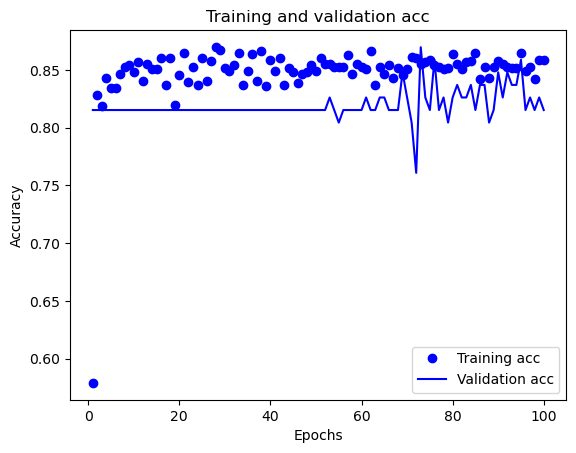

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 41ms/step - loss: 10.8698 - accuracy: 0.5937 - val_loss: 8.8273 - val_accuracy: 0.8587
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 8.0222 - accuracy: 0.8406 - val_loss: 5.2229 - val_accuracy: 0.8587
Epoch 3/100
7/7 [==============================] - 0s 7ms/step - loss: 5.5086 - accuracy: 0.8297 - val_loss: 4.6615 - val_accuracy: 0.8587
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 4.5688 - accuracy: 0.8345 - val_loss: 4.1422 - val_accuracy: 0.8587
Epoch 5/100
7/7 [====================

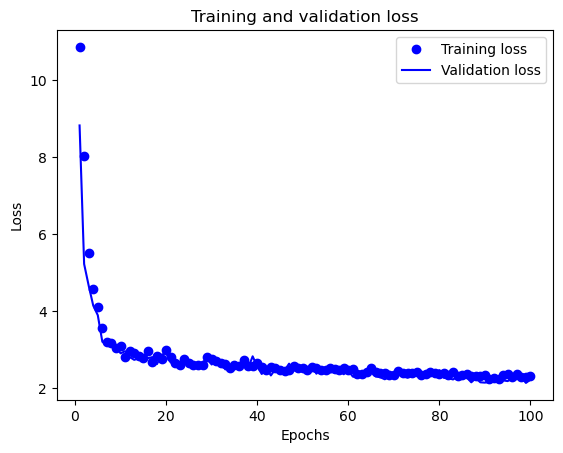

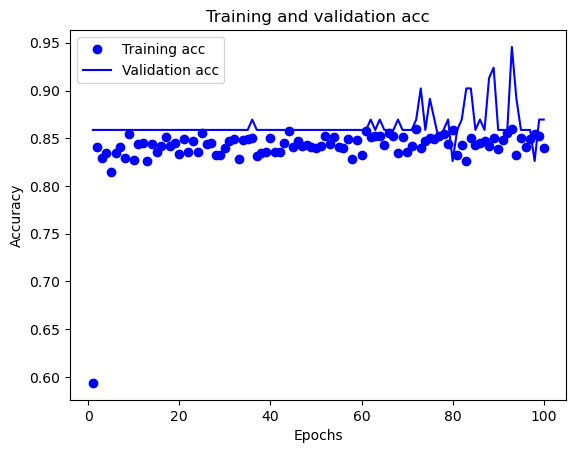

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 46ms/step - loss: 10.7068 - accuracy: 0.5759 - val_loss: 8.6389 - val_accuracy: 0.8352
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 8.0413 - accuracy: 0.8372 - val_loss: 5.0947 - val_accuracy: 0.8352
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 5.3187 - accuracy: 0.8299 - val_loss: 4.4631 - val_accuracy: 0.8352
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 4.2141 - accuracy: 0.8384 - val_loss: 3.8873 - val_accuracy: 0.8352
Epoch 5/100
7/7 [=====================

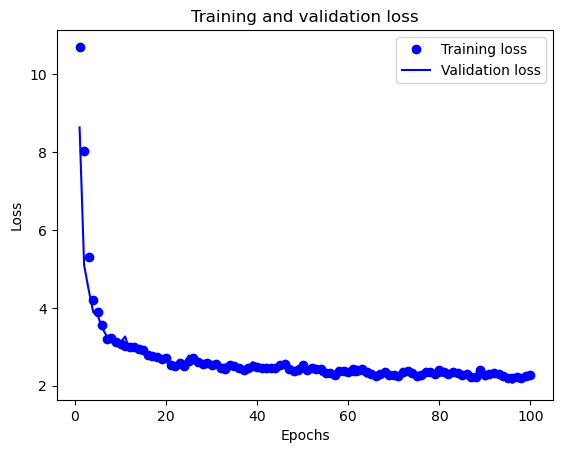

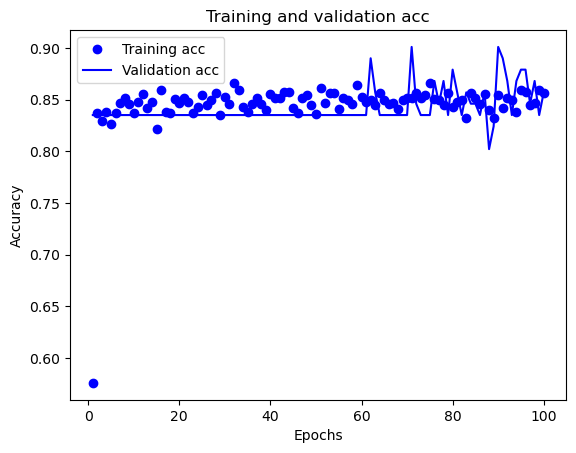

3/3 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 46ms/step - loss: 11.0741 - accuracy: 0.6233 - val_loss: 8.9819 - val_accuracy: 0.8681
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 8.3978 - accuracy: 0.8299 - val_loss: 5.1723 - val_accuracy: 0.8681
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 5.3096 - accuracy: 0.8348 - val_loss: 4.8248 - val_accuracy: 0.8681
Epoch 4/100
7/7 [==============================] - 0s 9ms/step - loss: 4.8417 - accuracy: 0.8311 - val_loss: 4.2967 - val_accuracy: 0.8681
Epoch 5/100
7/7 [====================

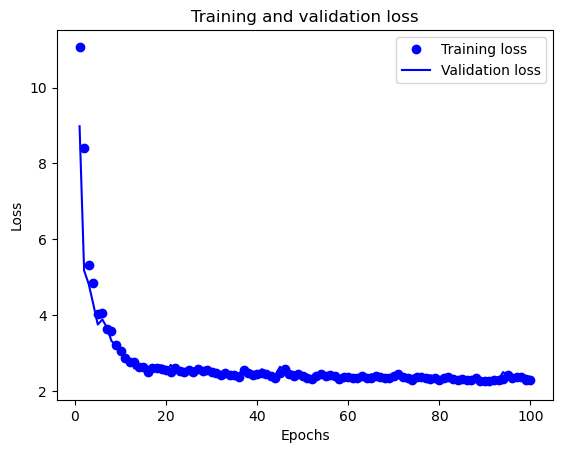

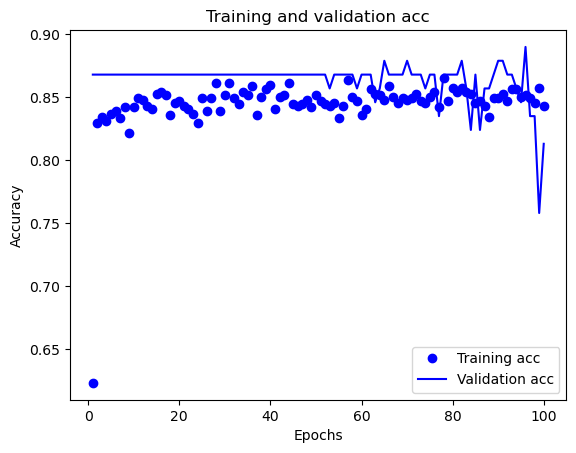

3/3 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 44ms/step - loss: 10.6542 - accuracy: 0.5930 - val_loss: 8.5768 - val_accuracy: 0.9011
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 7.8070 - accuracy: 0.8396 - val_loss: 4.8822 - val_accuracy: 0.9011
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 5.3838 - accuracy: 0.8335 - val_loss: 4.2565 - val_accuracy: 0.9011
Epoch 4/100
7/7 [==============================] - 0s 9ms/step - loss: 4.5893 - accuracy: 0.8226 - val_loss: 4.0148 - val_accuracy: 0.9011
Epoch 5/100
7/7 [====================

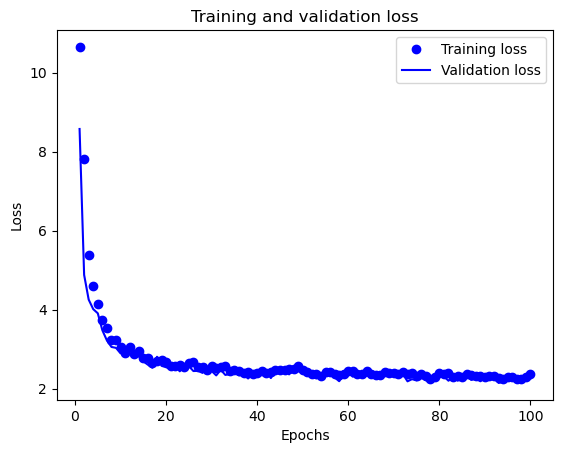

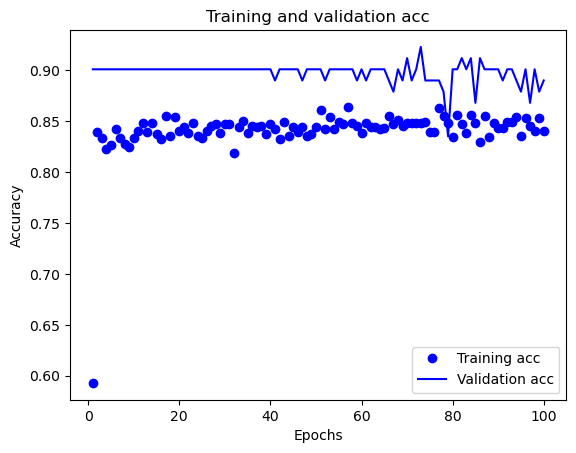

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 42ms/step - loss: 11.2799 - accuracy: 0.5808 - val_loss: 8.9633 - val_accuracy: 0.8681
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 8.3106 - accuracy: 0.8396 - val_loss: 5.3827 - val_accuracy: 0.8681
Epoch 3/100
7/7 [==============================] - 0s 10ms/step - loss: 5.5447 - accuracy: 0.8299 - val_loss: 4.7410 - val_accuracy: 0.8681
Epoch 4/100
7/7 [==============================] - 0s 10ms/step - loss: 4.6902 - accuracy: 0.8129 - val_loss: 4.3846 - val_accuracy: 0.8681
Epoch 5/100
7/7 [===================

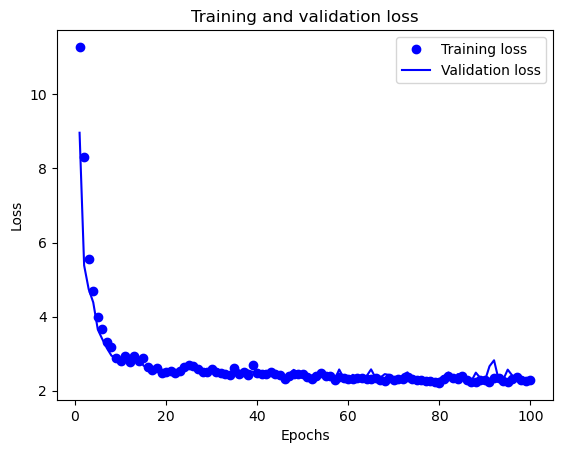

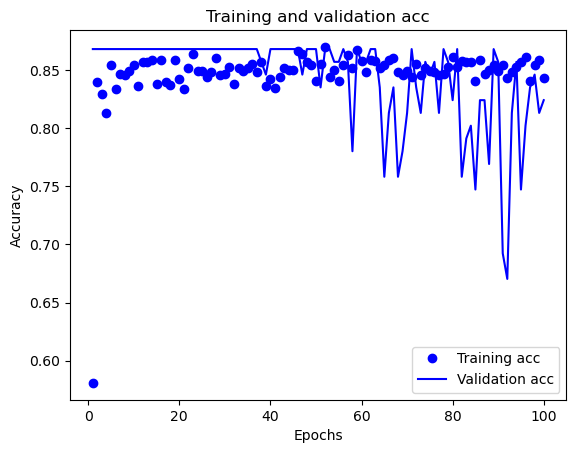

3/3 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 48ms/step - loss: 10.8695 - accuracy: 0.6136 - val_loss: 8.7283 - val_accuracy: 0.8901
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 7.9688 - accuracy: 0.8299 - val_loss: 4.9255 - val_accuracy: 0.8901
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 5.3762 - accuracy: 0.8311 - val_loss: 4.5079 - val_accuracy: 0.8901
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 4.6510 - accuracy: 0.8177 - val_loss: 4.0518 - val_accuracy: 0.8901
Epoch 5/100
7/7 [====================

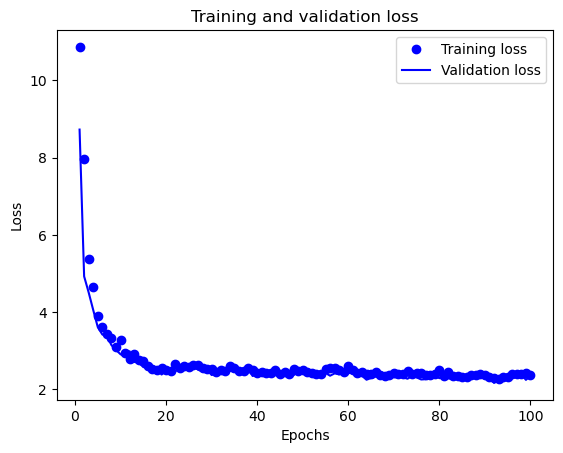

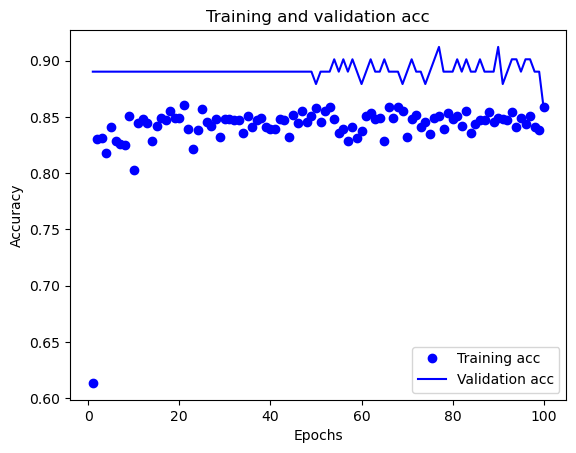

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 128, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 45ms/step - loss: 10.7954 - accuracy: 0.5735 - val_loss: 8.7926 - val_accuracy: 0.8352
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 7.8647 - accuracy: 0.8481 - val_loss: 5.1894 - val_accuracy: 0.8352
Epoch 3/100
7/7 [==============================] - 0s 10ms/step - loss: 5.4425 - accuracy: 0.8202 - val_loss: 4.8204 - val_accuracy: 0.8352
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 4.6969 - accuracy: 0.8457 - val_loss: 4.4931 - val_accuracy: 0.8352
Epoch 5/100
7/7 [====================

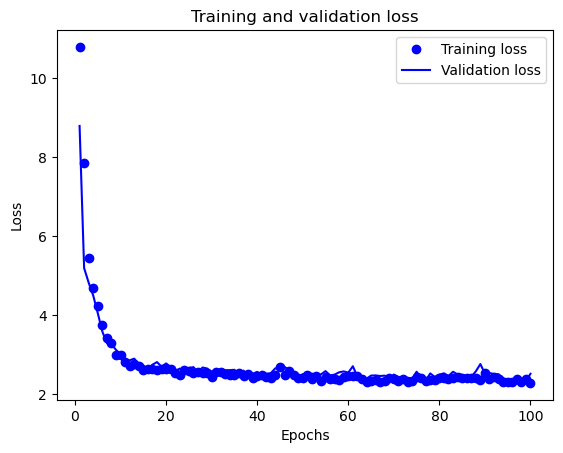

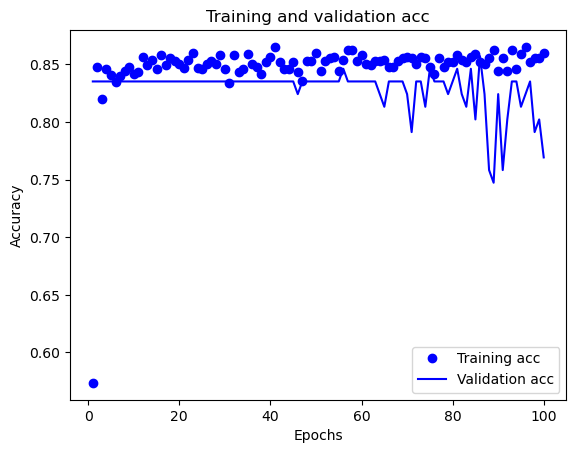

3/3 [==============================] - 0s 3ms/step
Experiment number: 10
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 42ms/step - loss: 4.5797 - accuracy: 0.6034 - val_loss: 2.1213 - val_accuracy: 0.8370
Epoch 2/100
7/7 [==============================] - 0s 7ms/step - loss: 2.7538 - accuracy: 0.8479 - val_loss: 4.5406 - val_accuracy: 0.7283
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 4.5778 - accuracy: 0.7530 - val_loss: 3.7960 - val_accuracy: 0.8370
Epoch 4/100
7/7 [==============================] - 0s 7ms/step - loss: 3.3550 - accuracy: 0.7798 - val_loss: 3.9595 - val_accuracy: 0.8370
Epoch 5/100
7

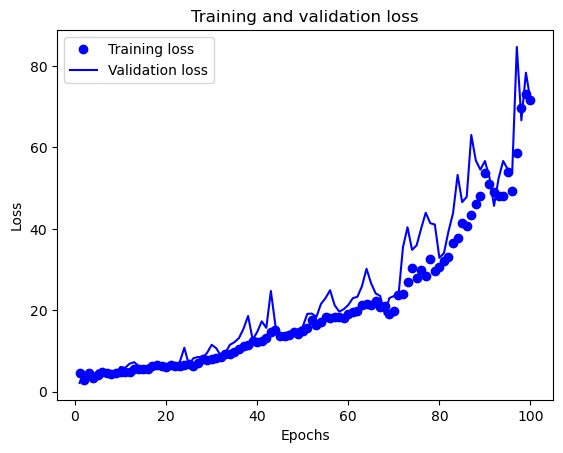

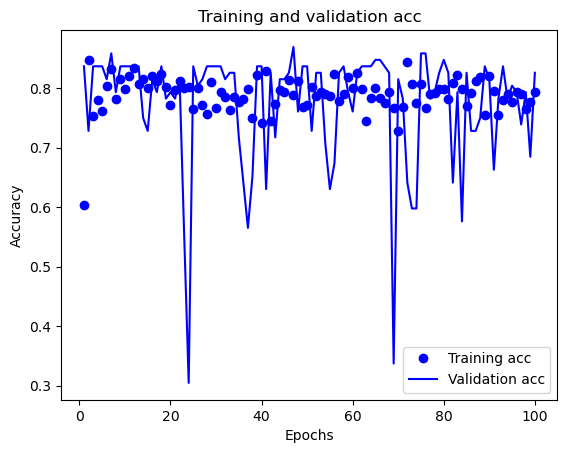

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 43ms/step - loss: 4.4821 - accuracy: 0.5365 - val_loss: 2.2582 - val_accuracy: 0.7935
Epoch 2/100
7/7 [==============================] - 0s 10ms/step - loss: 2.7795 - accuracy: 0.8516 - val_loss: 4.1861 - val_accuracy: 0.7935
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 4.1938 - accuracy: 0.8127 - val_loss: 4.1793 - val_accuracy: 0.7935
Epoch 4/100
7/7 [==============================] - 0s 7ms/step - loss: 3.3828 - accuracy: 0.8248 - val_loss: 3.6914 - val_accuracy: 0.7935
Epoch 5/100
7/7 [==================

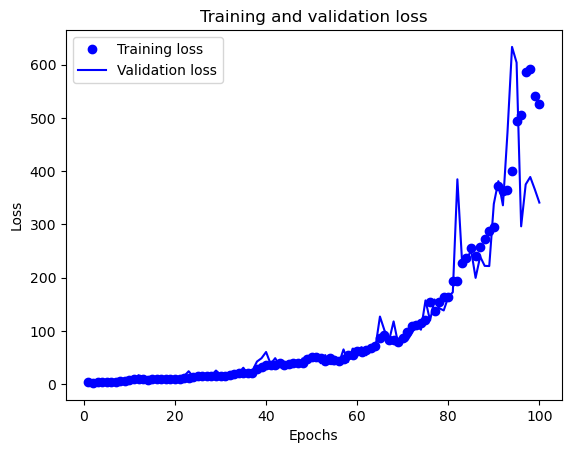

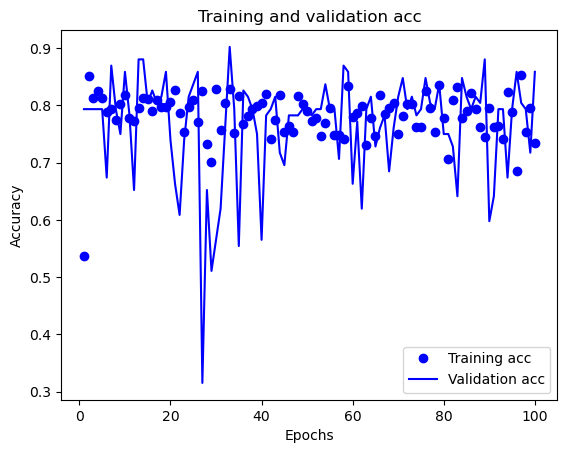

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 2s 42ms/step - loss: 4.2688 - accuracy: 0.6192 - val_loss: 2.2183 - val_accuracy: 0.8152
Epoch 2/100
7/7 [==============================] - 0s 16ms/step - loss: 2.7484 - accuracy: 0.8479 - val_loss: 4.1424 - val_accuracy: 0.8043
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 4.2929 - accuracy: 0.7567 - val_loss: 4.2383 - val_accuracy: 0.8152
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 3.4453 - accuracy: 0.7981 - val_loss: 3.6445 - val_accuracy: 0.8152
Epoch 5/100
7/7 [==================

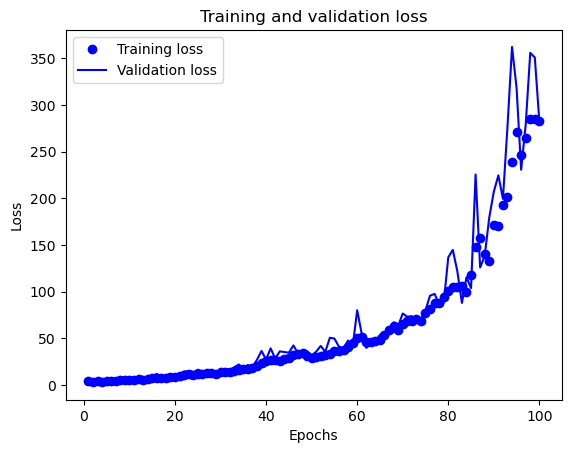

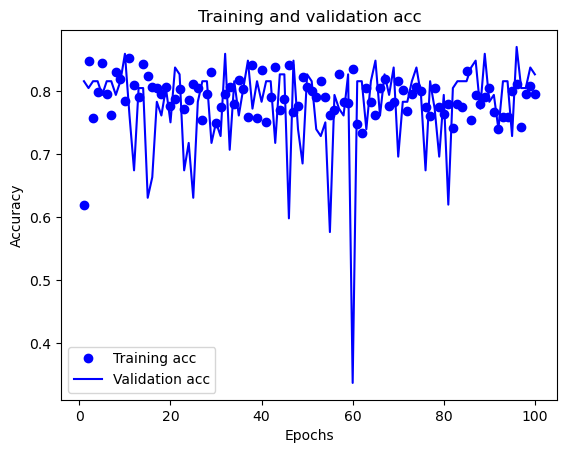

3/3 [==============================] - 0s 8ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (822, 11)
y_current_train shape: (822, 3)
Epoch 1/100
7/7 [==============================] - 1s 43ms/step - loss: 4.2134 - accuracy: 0.5815 - val_loss: 2.0185 - val_accuracy: 0.8587
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 2.7928 - accuracy: 0.8467 - val_loss: 3.9925 - val_accuracy: 0.8587
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 4.3015 - accuracy: 0.7847 - val_loss: 3.7332 - val_accuracy: 0.8587
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 3.3598 - accuracy: 0.8029 - val_loss: 3.2202 - val_accuracy: 0.8587
Epoch 5/100
7/7 [==================

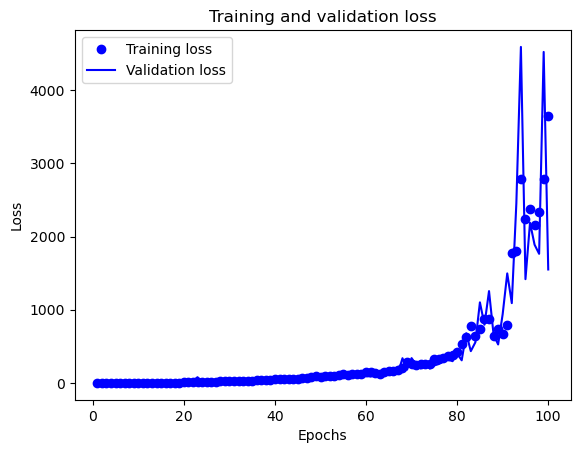

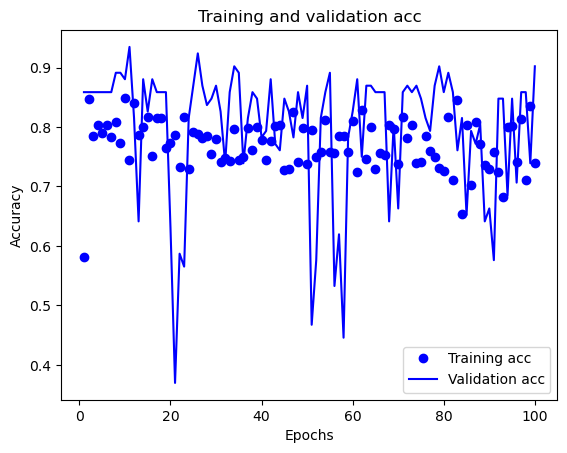

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 42ms/step - loss: 4.5340 - accuracy: 0.5541 - val_loss: 2.1326 - val_accuracy: 0.8352
Epoch 2/100
7/7 [==============================] - 0s 9ms/step - loss: 3.0610 - accuracy: 0.8311 - val_loss: 4.4853 - val_accuracy: 0.8352
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 4.3693 - accuracy: 0.8092 - val_loss: 3.9291 - val_accuracy: 0.8352
Epoch 4/100
7/7 [==============================] - 0s 7ms/step - loss: 3.5210 - accuracy: 0.8007 - val_loss: 3.5235 - val_accuracy: 0.8352
Epoch 5/100
7/7 [===================

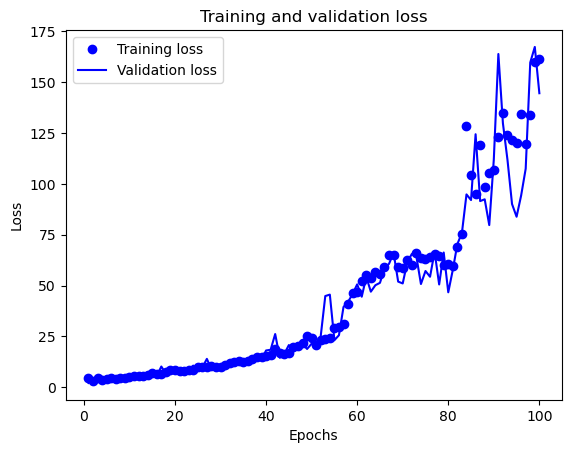

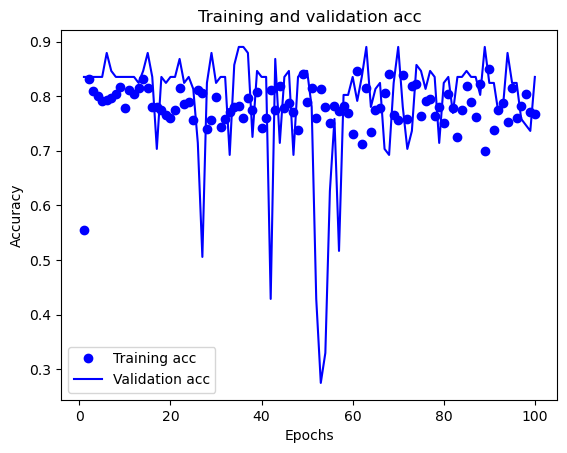

3/3 [==============================] - 0s 8ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 42ms/step - loss: 4.3364 - accuracy: 0.6002 - val_loss: 2.0313 - val_accuracy: 0.8681
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 2.8848 - accuracy: 0.8408 - val_loss: 4.0608 - val_accuracy: 0.8681
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 4.0469 - accuracy: 0.8275 - val_loss: 3.3994 - val_accuracy: 0.8681
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 3.4755 - accuracy: 0.7874 - val_loss: 3.1333 - val_accuracy: 0.8571
Epoch 5/100
7/7 [==================

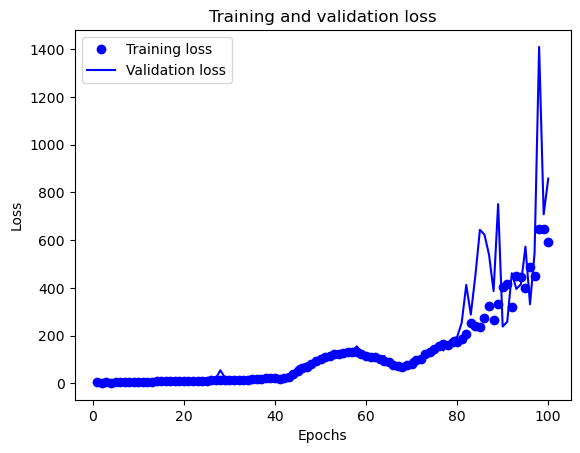

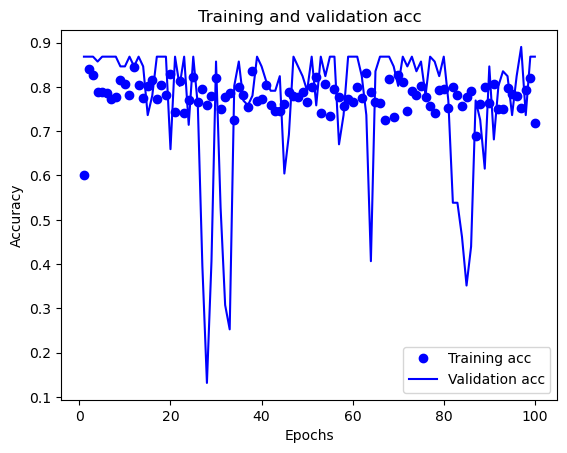

3/3 [==============================] - 0s 8ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 41ms/step - loss: 4.2679 - accuracy: 0.6221 - val_loss: 2.1100 - val_accuracy: 0.9011
Epoch 2/100
7/7 [==============================] - 0s 7ms/step - loss: 3.1339 - accuracy: 0.8420 - val_loss: 4.1853 - val_accuracy: 0.8901
Epoch 3/100
7/7 [==============================] - 0s 8ms/step - loss: 4.5884 - accuracy: 0.7266 - val_loss: 3.9155 - val_accuracy: 0.9011
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 3.8254 - accuracy: 0.7388 - val_loss: 3.5224 - val_accuracy: 0.9011
Epoch 5/100
7/7 [==================

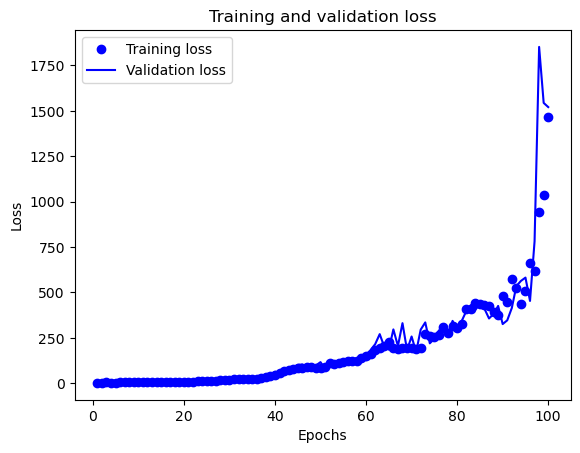

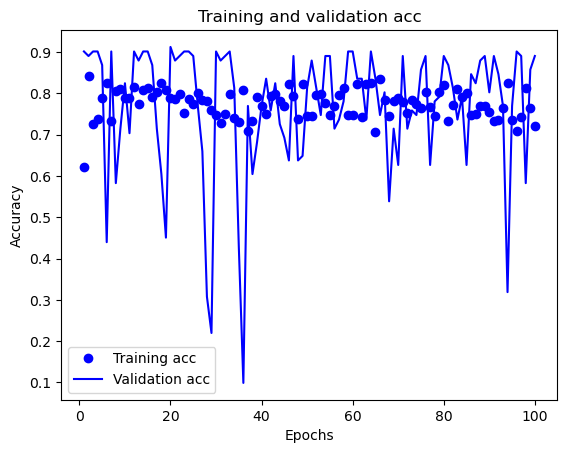

3/3 [==============================] - 0s 4ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 42ms/step - loss: 4.1708 - accuracy: 0.5687 - val_loss: 1.8725 - val_accuracy: 0.8681
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 2.7277 - accuracy: 0.8445 - val_loss: 3.8436 - val_accuracy: 0.8571
Epoch 3/100
7/7 [==============================] - 0s 7ms/step - loss: 4.0513 - accuracy: 0.8044 - val_loss: 3.6405 - val_accuracy: 0.8681
Epoch 4/100
7/7 [==============================] - 0s 7ms/step - loss: 3.4727 - accuracy: 0.8129 - val_loss: 3.5384 - val_accuracy: 0.8681
Epoch 5/100
7/7 [==================

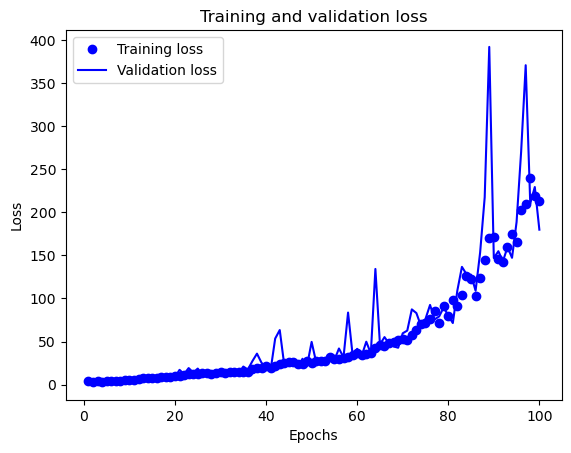

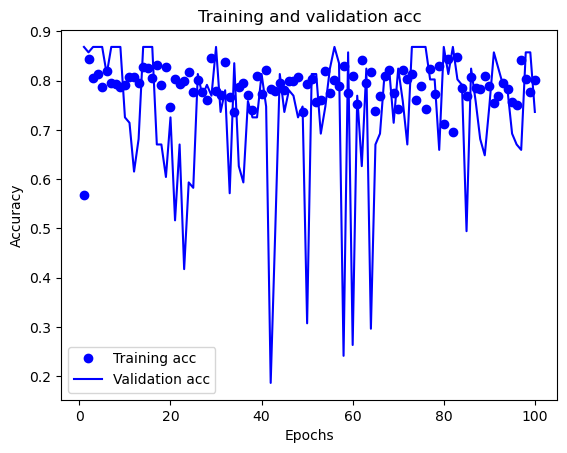

3/3 [==============================] - 0s 9ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 42ms/step - loss: 4.4829 - accuracy: 0.5808 - val_loss: 2.0587 - val_accuracy: 0.8901
Epoch 2/100
7/7 [==============================] - 0s 8ms/step - loss: 2.9812 - accuracy: 0.8311 - val_loss: 4.1186 - val_accuracy: 0.8791
Epoch 3/100
7/7 [==============================] - 0s 6ms/step - loss: 4.3359 - accuracy: 0.7801 - val_loss: 3.8550 - val_accuracy: 0.8901
Epoch 4/100
7/7 [==============================] - 0s 8ms/step - loss: 3.6262 - accuracy: 0.7801 - val_loss: 3.7777 - val_accuracy: 0.8901
Epoch 5/100
7/7 [==================

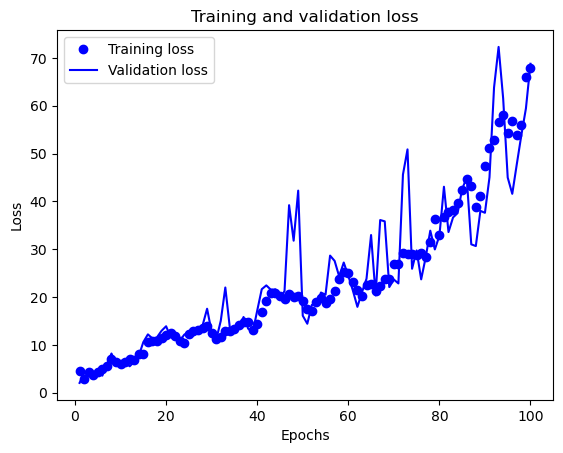

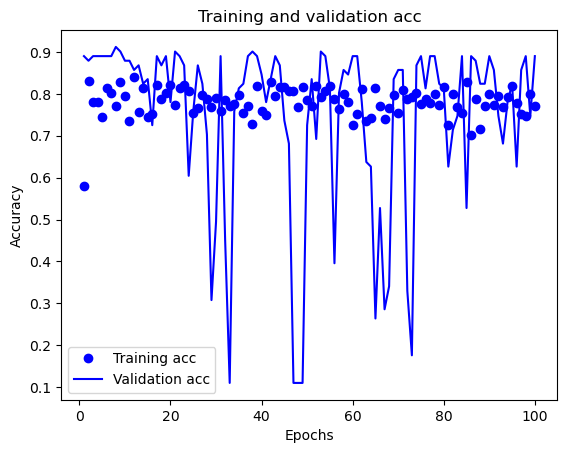

3/3 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True}
Batch size: 128
X_current_train shape: (823, 11)
y_current_train shape: (823, 3)
Epoch 1/100
7/7 [==============================] - 1s 43ms/step - loss: 4.7445 - accuracy: 0.4775 - val_loss: 2.2769 - val_accuracy: 0.8352
Epoch 2/100
7/7 [==============================] - 0s 7ms/step - loss: 2.9942 - accuracy: 0.8433 - val_loss: 4.7910 - val_accuracy: 0.8352
Epoch 3/100
7/7 [==============================] - 0s 9ms/step - loss: 4.8220 - accuracy: 0.8032 - val_loss: 4.5578 - val_accuracy: 0.8352
Epoch 4/100
7/7 [==============================] - 0s 9ms/step - loss: 3.9753 - accuracy: 0.8299 - val_loss: 4.0604 - val_accuracy: 0.8352
Epoch 5/100
7/7 [===================

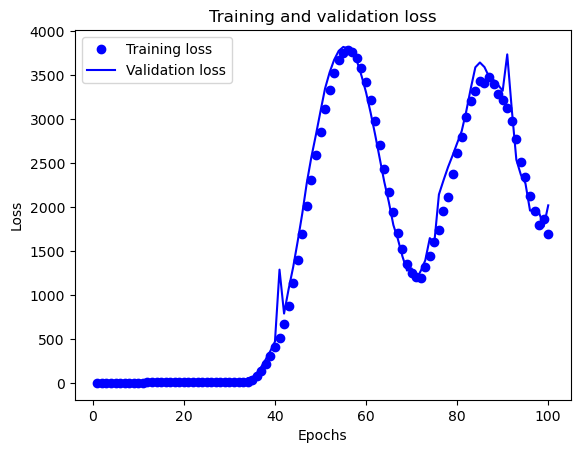

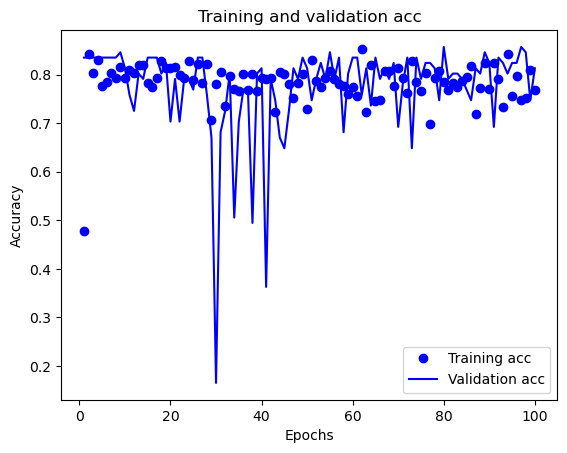

3/3 [==============================] - 0s 2ms/step
Best score: 0.8545269947443861
Best parameters: {'learning_rate': 0.1, 'hidden_layers': 2, 'hidden_units': 16, 'batch_size': 128, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.9, 'batch_norm': True}
Best model is in 10 experiment


In [67]:
n_iter = 10
best_score = 0
best_params = {}

for i in range(n_iter):
    print(f"Experiment number: {i+1}")
    sampled_params = {k: np.random.choice(list(v)) for k,v in param_space.items()} # use random search
    model_params = {k:v for k, v in sampled_params.items() if k != 'batch_size'}
    if model_params['optimizer'] != 'momentum':
        model_params['momentum'] = None
    if model_params['optimizer'] != 'Adam':
        model_params['adam_beta_1'] = None
        model_params['adam_beta_2'] = None
    if model_params['optimizer'] != 'RMSprop':
        model_params['rho'] = None

    cv_scores = []
    for train_index, val_index in cross_validator.split(X_train):
        X_current_train, X_val = X_train[train_index], X_train[val_index]
        y_current_train, y_val = y_train[train_index], y_train[val_index]
        model = create_model(**model_params)
        print("Model parameters:", model_params)
        print("Batch size:", sampled_params['batch_size'])
        print("X_current_train shape:", X_current_train.shape)
        print("y_current_train shape:", y_current_train.shape)
        history = model.fit(
            X_current_train, y_current_train, 
            epochs=100, 
            batch_size=sampled_params['batch_size'],
            verbose=1,
            validation_data=(X_val, y_val)
        )
        plot_loss(history)
        plot_accuracy(history)
        y_val_pred = model.predict(X_val) 
        y_val_pred_classes = np.argmax(y_val_pred, axis=1)
        y_true_classes = np.argmax(y_val, axis=1)
        
        scoring = accuracy_score(y_true_classes, y_val_pred_classes)
        cv_scores.append(scoring)
    mean_cv_scores = np.mean(cv_scores)
        
    if mean_cv_scores > best_score:
        best_score = mean_cv_scores
        if sampled_params['optimizer'] == 'momentum':
            sampled_params['adam_beta_1'] = None
            sampled_params['adam_beta_2'] = None
            sampled_params['rho'] = None
        if sampled_params['optimizer'] == 'RMSprop':
            sampled_params['adam_beta_1'] = None
            sampled_params['adam_beta_2'] = None
            sampled_params['momentum'] = None
        if sampled_params['optimizer'] == 'Adam':
            sampled_params['momentum'] = None
            sampled_params['rho'] = None
        best_params = {k: v for k, v in sampled_params.items() if v is not None}
               
print("Best score:", best_score)
print("Best parameters:", best_params)
print(f"Best model is in {i+1} experiment")

### Experiment 2 Result Analysis
The integration of batch normalization into the training process seems to have had a nuanced effect on the model's performance.

* No Significant Improvement on Accuracy
   The inclusion of batch normalization did not lead to a notable increase in accuracy. This might suggest that the model’s ability to fit the data was not primarily constrained by internal covariate shift or that other factors are limiting the model's performance.

* Mitigating Overfitting
   The observation that signs of overfitting have been reduced is encouraging. Batch normalization can have a regularizing effect, as it introduces a small amount of noise into each layer's inputs during training. This can prevent the model from fitting too closely to the training data.
  
   The fact that batch normalization helped mitigate overfitting but did not improve accuracy might indicate that the model is regularized enough not to overfit but still lacks the capacity to better learn the underlying patterns in the data. This could also be a result of other hyperparameters or aspects of the model architecture that are not optimal.

For the next steps, I will include weight initialization. Proper weight initialization can have an impact on the training dynamics of a neural network. 

## Step 7: Regularizing the Model — Experiment 3: Kfold = 3, batch_normalization, weight initialization

* Batch Normalization: True, False
Batch normalization is a technique to provide any layer in a neural network with inputs that are zero mean/unit variance, which helps to stabilize the training process.

* Weight Initializers: random_normal, random_uniform, he_normal, he_uniform, glorot_normal, glorot_uniform
Weight initialization hyperparameters control how the initial weights of a network are set. Proper initialization can improve convergence during training.

In [68]:
n_splits=3
cross_validator = KFold(n_splits=n_splits, shuffle=True, random_state=42)

def create_model(hidden_units, hidden_layers, optimizer, dropout_rate, l1, l2, learning_rate, initializers, adam_beta_1=None, adam_beta_2=None, momentum=None, learning_rate_decay=None, rho=None, batch_norm=False):
    model = models.Sequential()
    model.add(layers.Dense(hidden_units, activation='relu', input_shape=(11,), kernel_regularizer=regularizers.l1_l2(l1=l1, l2=l2)))
    if batch_norm == True:
        model.add(layers.BatchNormalization())
    model.add(layers.Dropout(dropout_rate))
    model.add(layers.Dense(3, activation='softmax', kernel_initializer=initializers))
    
    if optimizer == 'Adam':
        if adam_beta_1 is not None and adam_beta_2 is not None:
            optimizer = Adam(learning_rate=learning_rate, beta_1=adam_beta_1, beta_2=adam_beta_2)
    elif optimizer == 'RMSprop':
        optimizer = RMSprop(learning_rate=learning_rate, rho=rho)
    elif optimizer == 'momentum':
        optimizer = SGD(learning_rate=learning_rate, momentum=momentum)
    else:
        raise ValueError("Unknown optimizer")  
    model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model


In [69]:
learning_rate = [
    10 ** -i for i in range(1, 6)
]
hidden_layers = [
    1, 2, 3, 4, 5,
]
hidden_units = [
    8, 16, 32, 64, 128, 256,
]
batch_size = [
    128, 256, 512,
]
optimizer = [
    'momentum', 'RMSprop', 'Adam',
]
dropout_rate = [0.2, 0.3, 0.4,]

l1=[0.001, 0.01, 0.1,]
l2=[0.001, 0.01, 0.1,]

momentum = [
    0.8, 0.9, 0.99, 0.999,
]
learning_rate_decay = [lr/100 for lr in learning_rate]

rho = [0.8, 0.9, 0.99]

adam_beta_1 = [0.9, 0.95]
adam_beta_2 = [0.999, 0.9995]

batch_norm = [True, False]
initializers = ['random_normal', 'random_uniform', 'he_normal', 'he_uniform', 'glorot_normal', 'glorot_uniform']

param_space = {
    'learning_rate': learning_rate,
    'hidden_layers': hidden_layers,
    'hidden_units': hidden_units,
    'batch_size': batch_size,
    'learning_rate_decay': learning_rate_decay,
    'optimizer': optimizer,
    'l1': l1,
    'l2': l2,
    'dropout_rate': dropout_rate,
    'momentum': momentum if 'momentum' in optimizer else [None],
    'adam_beta_1': adam_beta_1 if 'Adam' in optimizer else [None],
    'adam_beta_2': adam_beta_2 if 'Adam' in optimizer else [None],
    'rho': rho if 'RMSprop' in optimizer else [None],
    'batch_norm': batch_norm,
    'initializers':initializers,
}

Experiment number: 1
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.9, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 1s 64ms/step - loss: 2.1267 - accuracy: 0.6174 - val_loss: 1.2870 - val_accuracy: 0.8393
Epoch 2/100
5/5 [==============================] - 0s 12ms/step - loss: 0.9398 - accuracy: 0.8112 - val_loss: 1.6786 - val_accuracy: 0.8164
Epoch 3/100
5/5 [==============================] - 0s 12ms/step - loss: 0.8180 - accuracy: 0.8637 - val_loss: 0.7107 - val_accuracy: 0.8164
Epoch 4/100
5/5 [==============================] - 0s 13ms/step - loss: 0.5550 - accuracy: 0.8637 - val_loss: 0.7335 - val_accuracy: 0.8230
Epoch 5/100
5/5 [==============

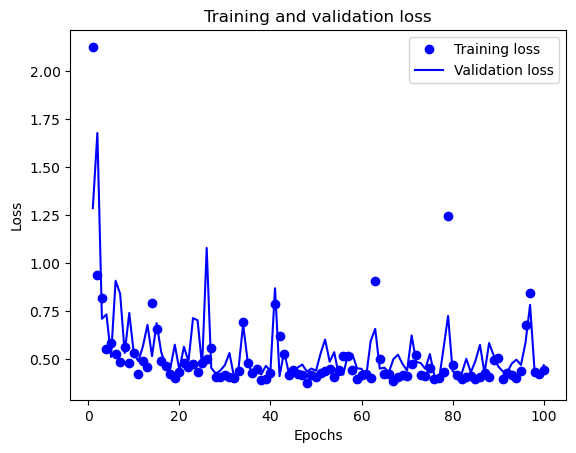

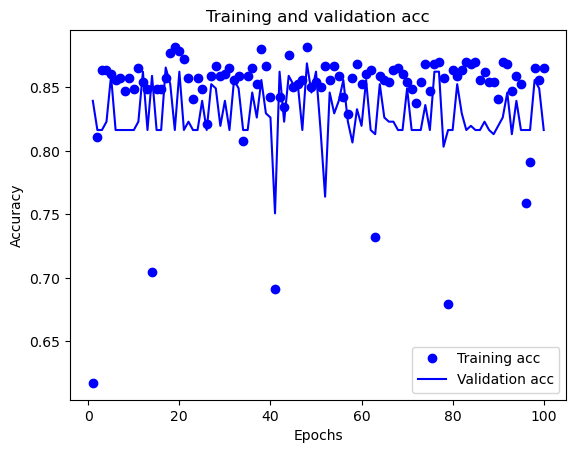

10/10 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.9, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 2s 63ms/step - loss: 1.9636 - accuracy: 0.5977 - val_loss: 0.9830 - val_accuracy: 0.8852
Epoch 2/100
5/5 [==============================] - 0s 14ms/step - loss: 1.0010 - accuracy: 0.7915 - val_loss: 0.9924 - val_accuracy: 0.8721
Epoch 3/100
5/5 [==============================] - 0s 12ms/step - loss: 0.7204 - accuracy: 0.8473 - val_loss: 0.6165 - val_accuracy: 0.8721
Epoch 4/100
5/5 [==============================] - 0s 12ms/step - loss: 0.6365 - accuracy: 0.8374 - val_loss: 0.6380 - val_accuracy: 0.8721

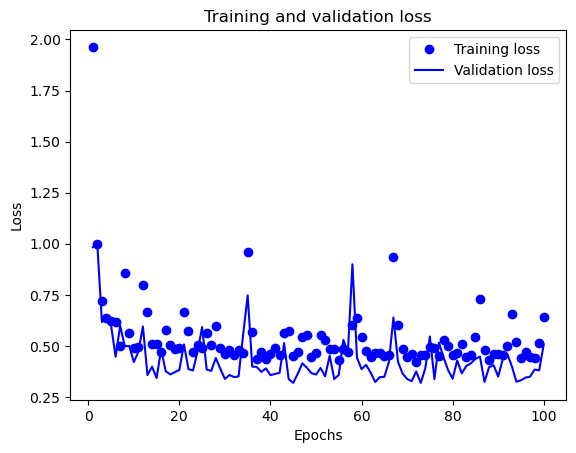

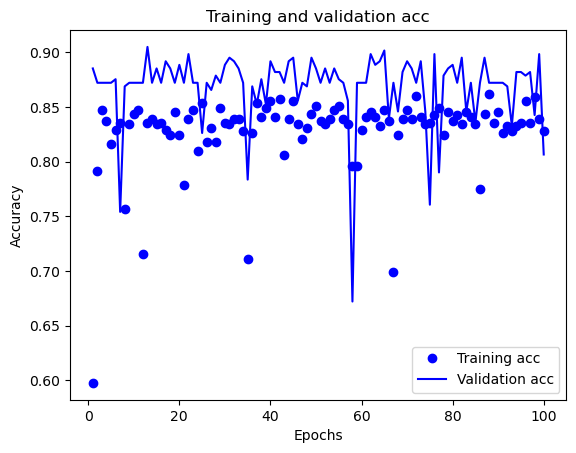

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.9, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 128
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
5/5 [==============================] - 1s 66ms/step - loss: 2.4968 - accuracy: 0.6016 - val_loss: 1.3125 - val_accuracy: 0.8421
Epoch 2/100
5/5 [==============================] - 0s 12ms/step - loss: 1.0249 - accuracy: 0.8311 - val_loss: 1.0044 - val_accuracy: 0.7467
Epoch 3/100
5/5 [==============================] - 0s 12ms/step - loss: 0.8265 - accuracy: 0.8213 - val_loss: 0.8214 - val_accuracy: 0.8421
Epoch 4/100
5/5 [==============================] - 0s 12ms/step - loss: 0.6477 - accuracy: 0.8590 - val_loss: 0.6202 - val_accuracy: 0.8520

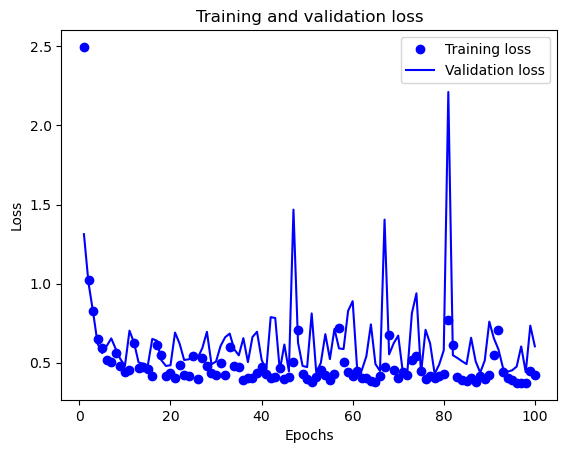

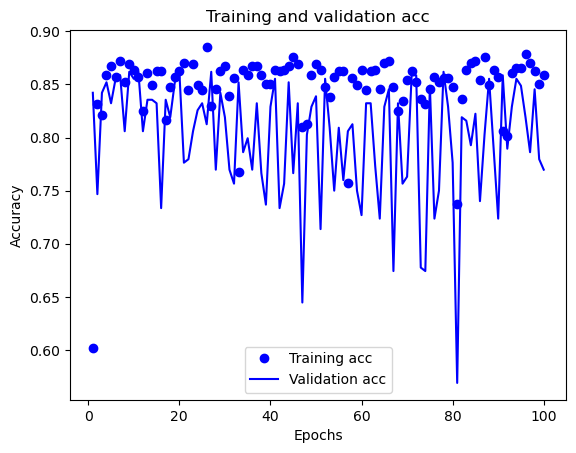

10/10 [==============================] - 0s 2ms/step
Experiment number: 2
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 2, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 259ms/step - loss: 4.4416 - accuracy: 0.3317 - val_loss: 3.9847 - val_accuracy: 0.2984
Epoch 2/100
2/2 [==============================] - 0s 37ms/step - loss: 4.2902 - accuracy: 0.3366 - val_loss: 3.8031 - val_accuracy: 0.5344
Epoch 3/100
2/2 [==============================] - 0s 40ms/step - loss: 4.0322 - accuracy: 0.4483 - val_loss: 3.5508 - val_accuracy: 0.7344
Epoch 4/100
2/2 [==============================] - 0s 38ms/step - loss: 3.7150 - accuracy: 0.5287 - val_loss: 3.2593

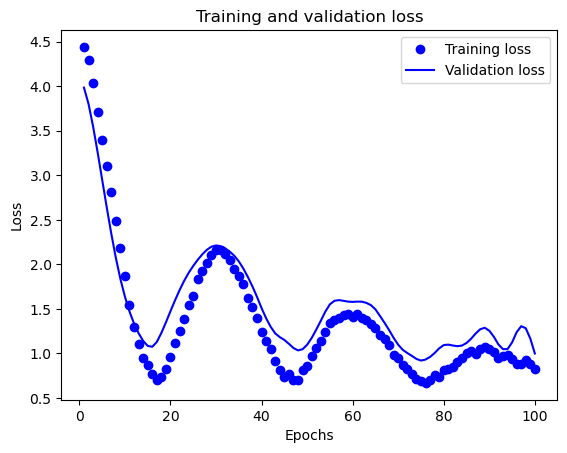

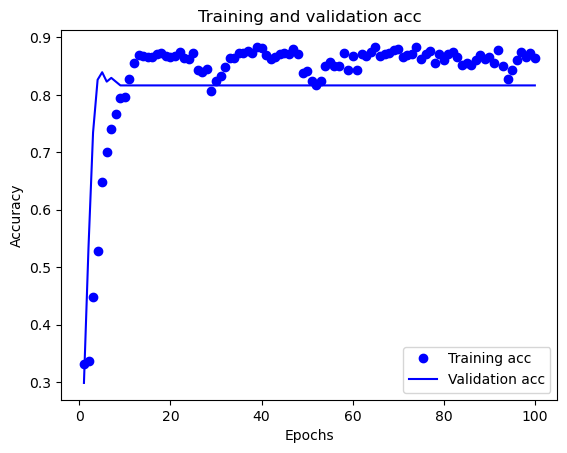

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 2, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 255ms/step - loss: 4.2106 - accuracy: 0.4302 - val_loss: 3.7430 - val_accuracy: 0.4885
Epoch 2/100
2/2 [==============================] - 0s 41ms/step - loss: 4.1404 - accuracy: 0.4581 - val_loss: 3.5763 - val_accuracy: 0.6328
Epoch 3/100
2/2 [==============================] - 0s 40ms/step - loss: 3.9844 - accuracy: 0.4417 - val_loss: 3.3415 - val_accuracy: 0.8098
Epoch 4/100
2/2 [==============================] - 0s 40ms/step - loss: 3.6425 - accuracy: 0.5452 - val_loss: 3.0633 - val_accuracy: 0.86

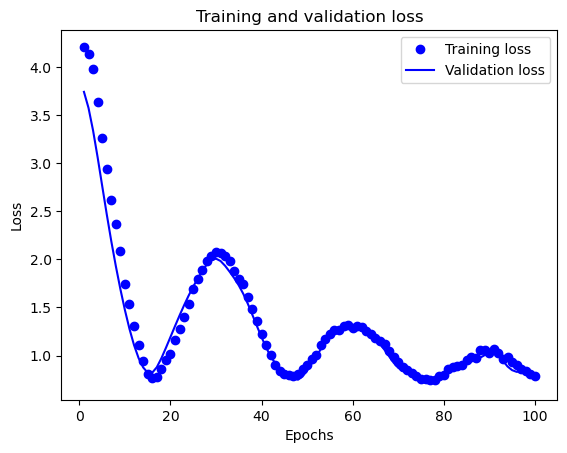

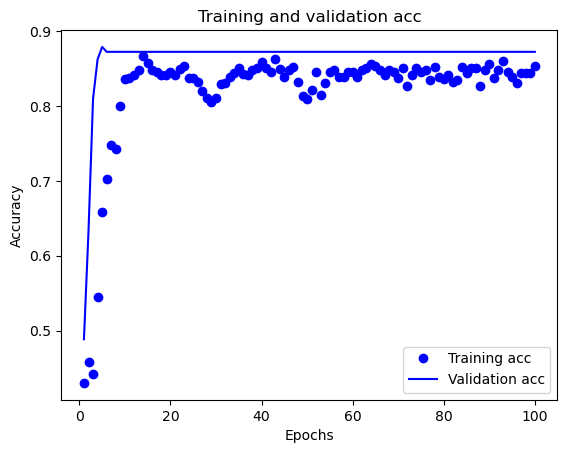

10/10 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 2, 'hidden_units': 64, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
2/2 [==============================] - 1s 243ms/step - loss: 4.2706 - accuracy: 0.3049 - val_loss: 3.7342 - val_accuracy: 0.4770
Epoch 2/100
2/2 [==============================] - 0s 38ms/step - loss: 4.1286 - accuracy: 0.3426 - val_loss: 3.5977 - val_accuracy: 0.6118
Epoch 3/100
2/2 [==============================] - 0s 41ms/step - loss: 3.8742 - accuracy: 0.4180 - val_loss: 3.4016 - val_accuracy: 0.7401
Epoch 4/100
2/2 [==============================] - 0s 42ms/step - loss: 3.5671 - accuracy: 0.5164 - val_loss: 3.1636 - val_accuracy: 0.77

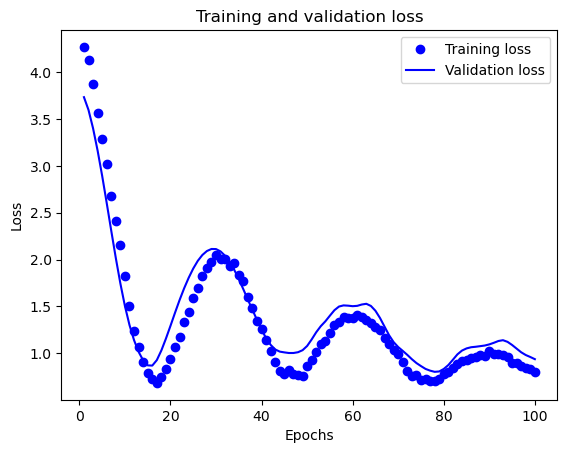

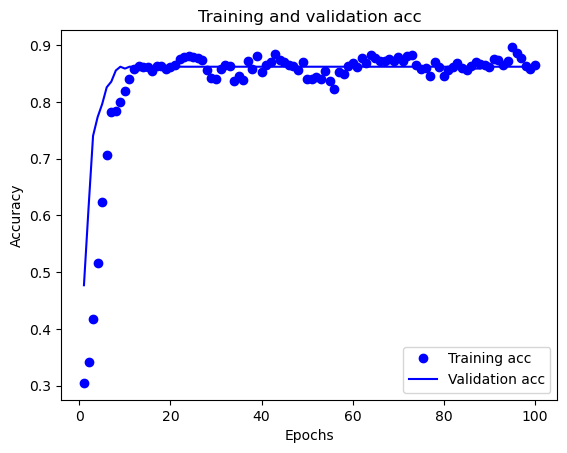

10/10 [==============================] - 0s 1ms/step
Experiment number: 3
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 1s 66ms/step - loss: 5.2346 - accuracy: 0.4072 - val_loss: 5.2010 - val_accuracy: 0.5508
Epoch 2/100
5/5 [==============================] - 0s 12ms/step - loss: 5.2270 - accuracy: 0.3777 - val_loss: 5.2002 - val_accuracy: 0.5475
Epoch 3/100
5/5 [==============================] - 0s 11ms/step - loss: 5.2285 - accuracy: 0.4072 - val_loss: 5.1995 - val_accuracy: 0.5541
Epoch 4/100
5/5 [==============================] - 0s 12ms/step - loss: 5.2381 - accuracy: 0.3826 - val_loss: 5.1988 - 

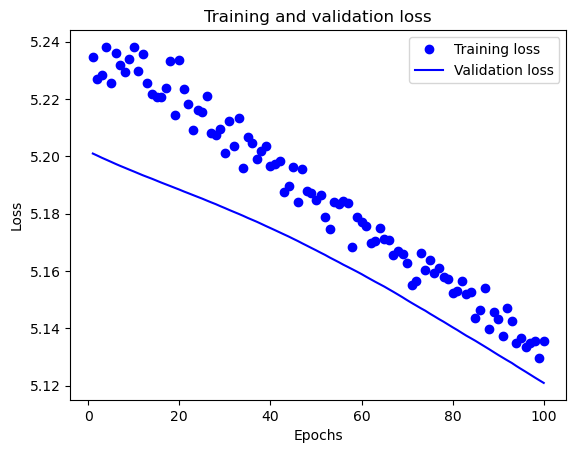

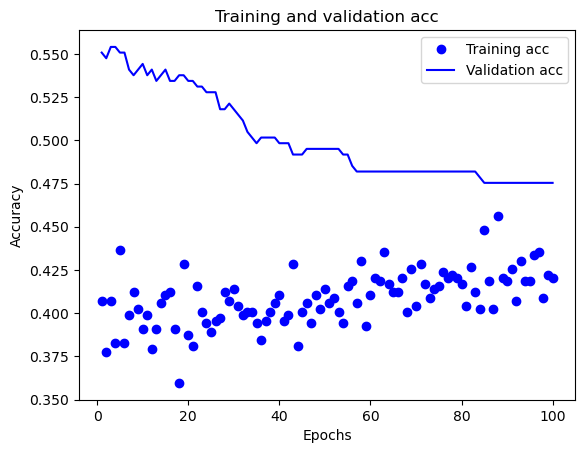

10/10 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 1s 62ms/step - loss: 5.4319 - accuracy: 0.2250 - val_loss: 5.3703 - val_accuracy: 0.5246
Epoch 2/100
5/5 [==============================] - 0s 11ms/step - loss: 5.4339 - accuracy: 0.2397 - val_loss: 5.3706 - val_accuracy: 0.5148
Epoch 3/100
5/5 [==============================] - 0s 13ms/step - loss: 5.4210 - accuracy: 0.2808 - val_loss: 5.3709 - val_accuracy: 0.5115
Epoch 4/100
5/5 [==============================] - 0s 12ms/step - loss: 5.4243 - accuracy: 0.2562 - val_loss: 5.3711 - val_accuracy: 0.4984


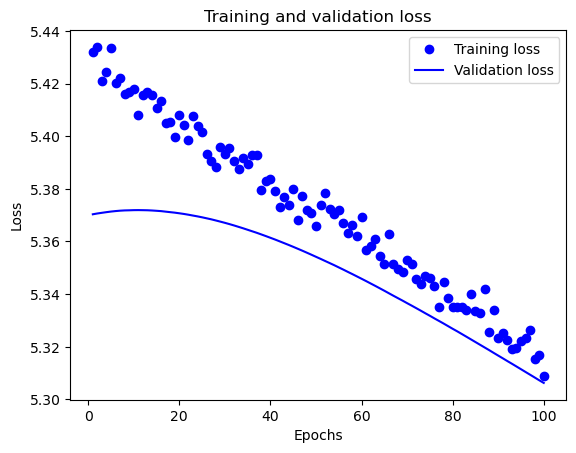

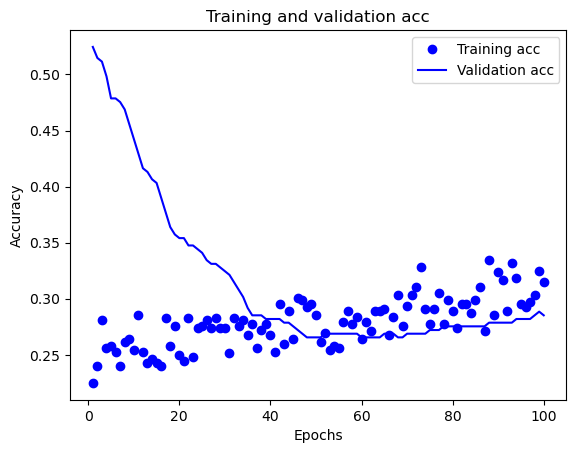

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 128
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
5/5 [==============================] - 1s 61ms/step - loss: 5.1521 - accuracy: 0.3410 - val_loss: 5.1726 - val_accuracy: 0.1349
Epoch 2/100
5/5 [==============================] - 0s 12ms/step - loss: 5.1490 - accuracy: 0.3426 - val_loss: 5.1710 - val_accuracy: 0.1382
Epoch 3/100
5/5 [==============================] - 0s 11ms/step - loss: 5.1457 - accuracy: 0.3246 - val_loss: 5.1694 - val_accuracy: 0.1447
Epoch 4/100
5/5 [==============================] - 0s 13ms/step - loss: 5.1472 - accuracy: 0.3721 - val_loss: 5.1678 - val_accuracy: 0.1480


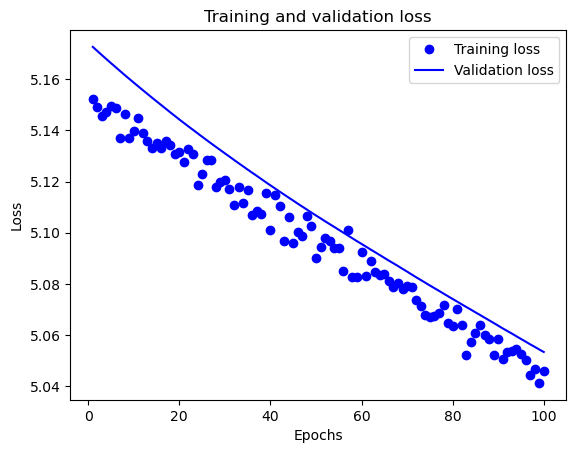

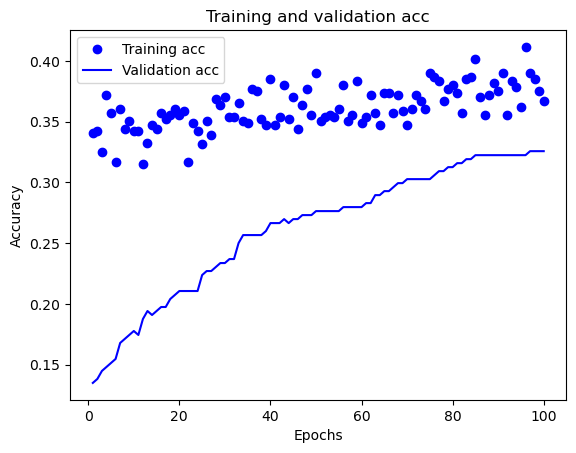

10/10 [==============================] - 0s 1ms/step
Experiment number: 4
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 2, 'hidden_units': 64, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'he_normal'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 252ms/step - loss: 4.3646 - accuracy: 0.2791 - val_loss: 2.9952 - val_accuracy: 0.4754
Epoch 2/100
2/2 [==============================] - 0s 47ms/step - loss: 4.3909 - accuracy: 0.2594 - val_loss: 2.9988 - val_accuracy: 0.4623
Epoch 3/100
2/2 [==============================] - 0s 47ms/step - loss: 4.3900 - accuracy: 0.2693 - val_loss: 3.0016 - val_accuracy: 0.4590
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 4.4091 - accuracy: 0.2594 - val_loss: 3.0031 -

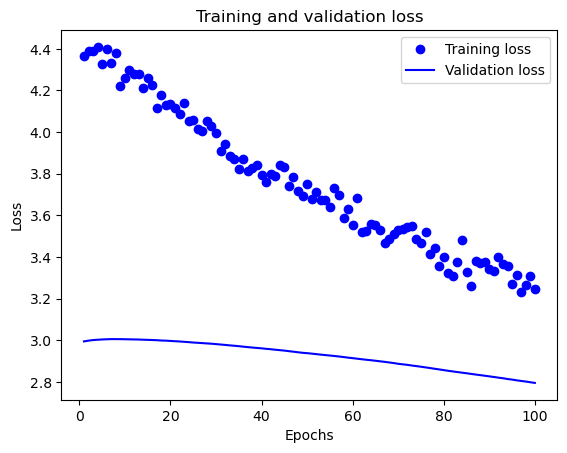

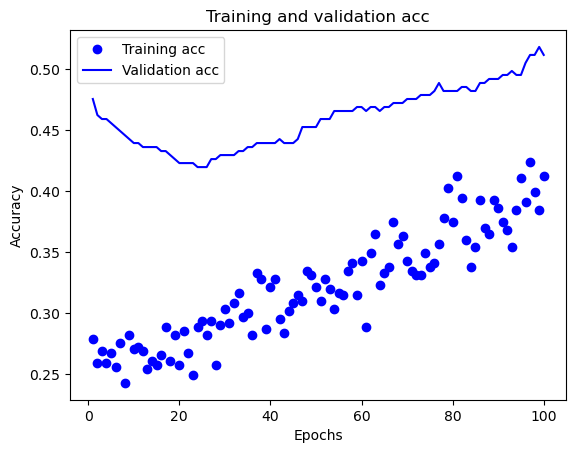

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 2, 'hidden_units': 64, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'he_normal'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 2s 251ms/step - loss: 3.6069 - accuracy: 0.3103 - val_loss: 2.7870 - val_accuracy: 0.7869
Epoch 2/100
2/2 [==============================] - 0s 33ms/step - loss: 3.5917 - accuracy: 0.3169 - val_loss: 2.7894 - val_accuracy: 0.7902
Epoch 3/100
2/2 [==============================] - 0s 33ms/step - loss: 3.6081 - accuracy: 0.3169 - val_loss: 2.7910 - val_accuracy: 0.7902
Epoch 4/100
2/2 [==============================] - 0s 44ms/step - loss: 3.6481 - accuracy: 0.3103 - val_loss: 2.7923 - val_accuracy: 0.7836

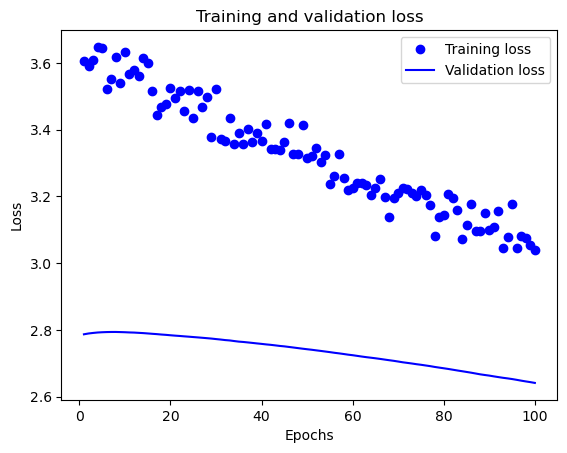

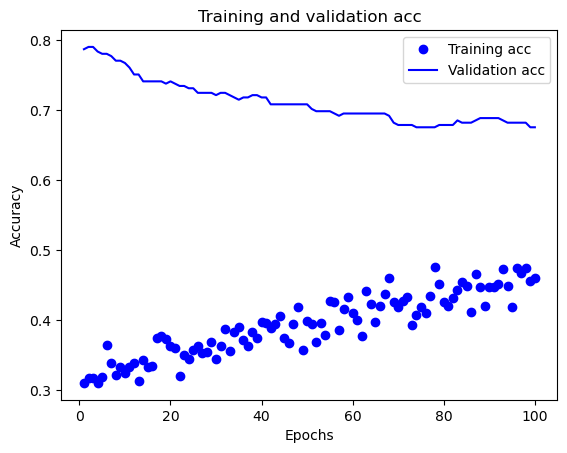

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 2, 'hidden_units': 64, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'he_normal'}
Batch size: 512
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
2/2 [==============================] - 1s 255ms/step - loss: 3.6805 - accuracy: 0.3689 - val_loss: 3.2726 - val_accuracy: 0.1875
Epoch 2/100
2/2 [==============================] - 0s 47ms/step - loss: 3.7110 - accuracy: 0.3557 - val_loss: 3.2702 - val_accuracy: 0.1974
Epoch 3/100
2/2 [==============================] - 0s 48ms/step - loss: 3.6544 - accuracy: 0.3705 - val_loss: 3.2670 - val_accuracy: 0.2072
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 3.6186 - accuracy: 0.3984 - val_loss: 3.2634 - val_accuracy: 0.2072

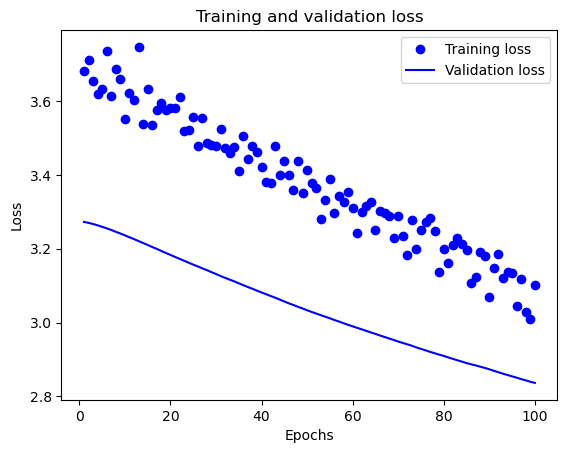

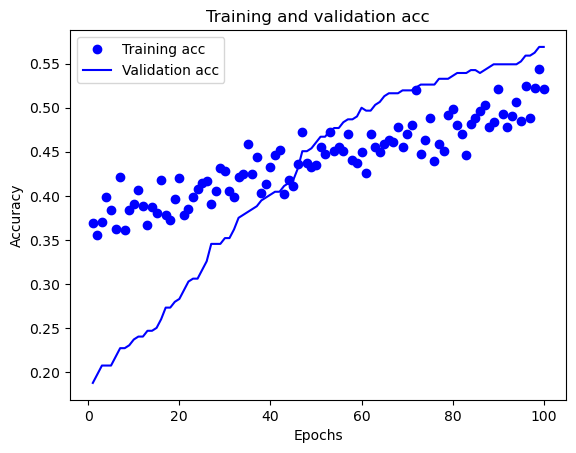

10/10 [==============================] - 0s 2ms/step
Experiment number: 5
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 128, 'learning_rate_decay': 1e-05, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': True, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 238ms/step - loss: 3.5521 - accuracy: 0.3366 - val_loss: 2.5362 - val_accuracy: 0.7475
Epoch 2/100
2/2 [==============================] - 0s 47ms/step - loss: 3.1368 - accuracy: 0.5649 - val_loss: 3.1137 - val_accuracy: 0.8131
Epoch 3/100
2/2 [==============================] - 0s 47ms/step - loss: 3.0270 - accuracy: 0.8259 - val_loss: 3.2206 - val_accuracy: 0.8131
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 3.1710 - accuracy: 0.8506 - val_loss: 3.1737

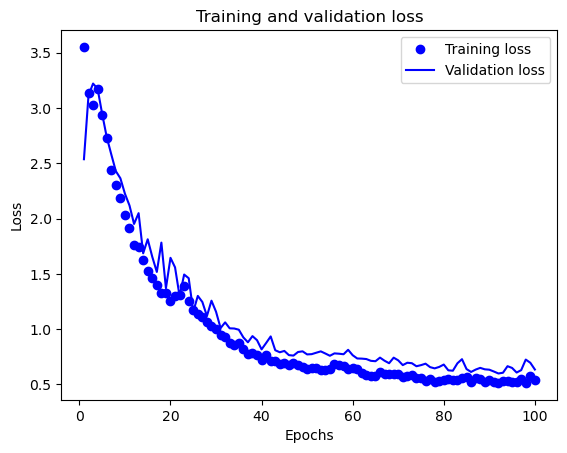

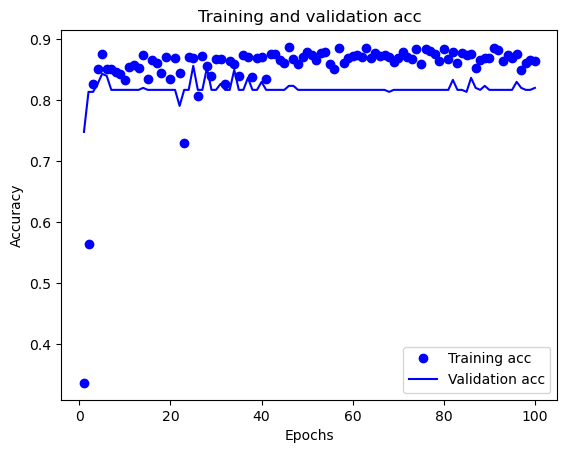

10/10 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 128, 'learning_rate_decay': 1e-05, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': True, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 252ms/step - loss: 3.5351 - accuracy: 0.3284 - val_loss: 2.5808 - val_accuracy: 0.6689
Epoch 2/100
2/2 [==============================] - 0s 47ms/step - loss: 3.2388 - accuracy: 0.6420 - val_loss: 2.6320 - val_accuracy: 0.8787
Epoch 3/100
2/2 [==============================] - 0s 31ms/step - loss: 3.0088 - accuracy: 0.8013 - val_loss: 2.8478 - val_accuracy: 0.8951
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 3.0935 - accuracy: 0.8391 - val_loss: 2.9037 - val_accuracy: 0.885

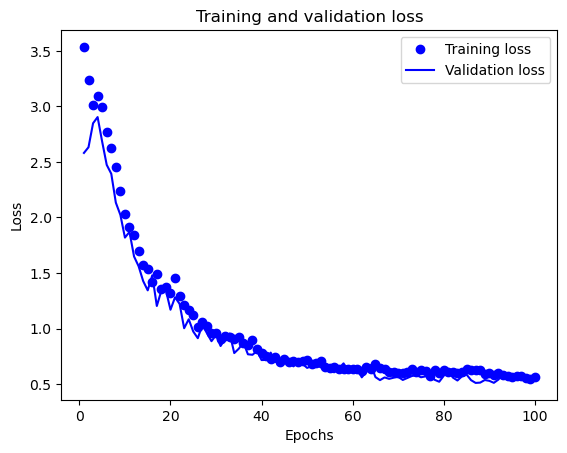

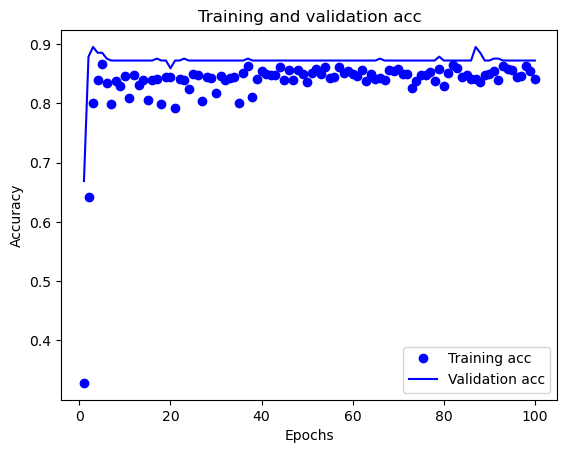

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 5, 'hidden_units': 128, 'learning_rate_decay': 1e-05, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': True, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
2/2 [==============================] - 1s 240ms/step - loss: 3.6063 - accuracy: 0.3574 - val_loss: 2.7792 - val_accuracy: 0.7303
Epoch 2/100
2/2 [==============================] - 0s 31ms/step - loss: 3.6341 - accuracy: 0.6934 - val_loss: 3.0634 - val_accuracy: 0.8618
Epoch 3/100
2/2 [==============================] - 0s 47ms/step - loss: 3.3537 - accuracy: 0.8164 - val_loss: 3.2863 - val_accuracy: 0.8586
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 3.2142 - accuracy: 0.8738 - val_loss: 3.2296 - val_accuracy: 0.79

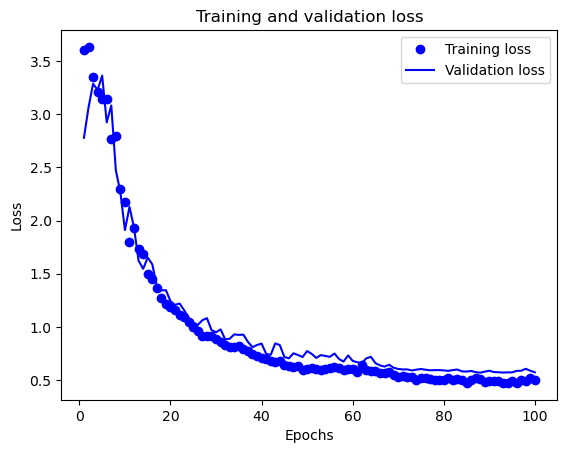

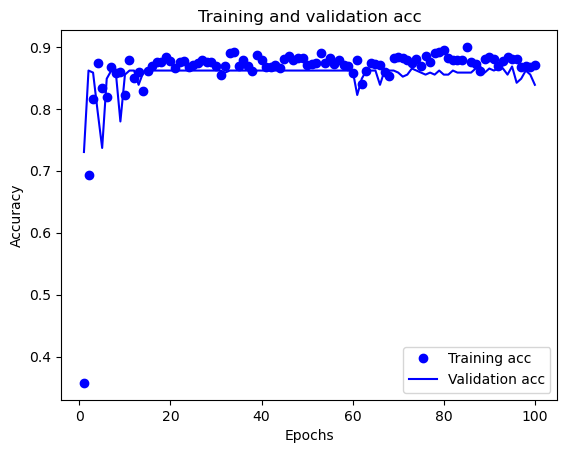

10/10 [==============================] - 0s 2ms/step
Experiment number: 6
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 3, 'hidden_units': 128, 'learning_rate_decay': 1e-05, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False, 'initializers': 'random_normal'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 236ms/step - loss: 2.7391 - accuracy: 0.4269 - val_loss: 2.6780 - val_accuracy: 0.6098
Epoch 2/100
2/2 [==============================] - 0s 47ms/step - loss: 2.6642 - accuracy: 0.5993 - val_loss: 2.6122 - val_accuracy: 0.7672
Epoch 3/100
2/2 [==============================] - 0s 31ms/step - loss: 2.5926 - accuracy: 0.7438 - val_loss: 2.5493 - val_accuracy: 0.7967
Epoch 4/100
2/2 [==============================] - 0s 31ms/step - loss: 2.5255 - accuracy: 0.8259 - val_loss: 2.489

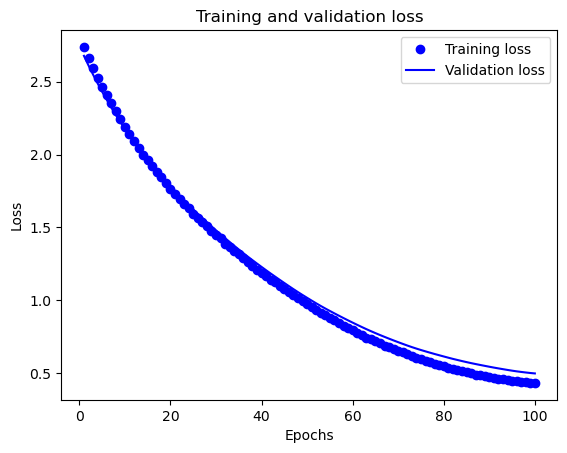

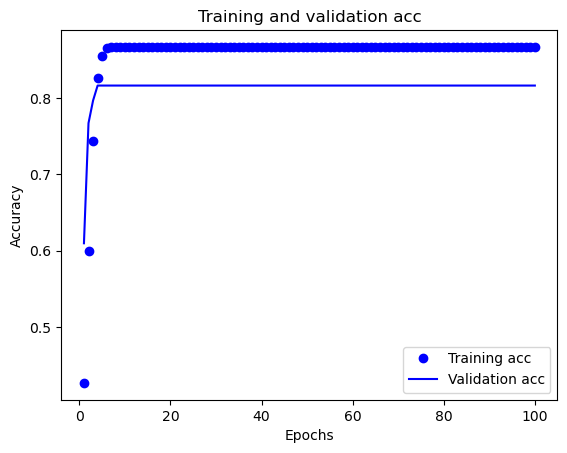

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 3, 'hidden_units': 128, 'learning_rate_decay': 1e-05, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False, 'initializers': 'random_normal'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 220ms/step - loss: 2.6577 - accuracy: 0.6486 - val_loss: 2.5803 - val_accuracy: 0.8656
Epoch 2/100
2/2 [==============================] - 0s 47ms/step - loss: 2.5858 - accuracy: 0.7619 - val_loss: 2.5140 - val_accuracy: 0.8721
Epoch 3/100
2/2 [==============================] - 0s 47ms/step - loss: 2.5218 - accuracy: 0.8112 - val_loss: 2.4502 - val_accuracy: 0.8721
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 2.4603 - accuracy: 0.8309 - val_loss: 2.3892 - val_accuracy: 0.8

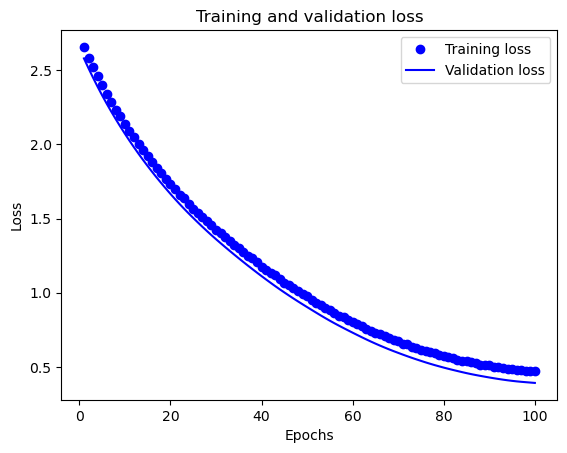

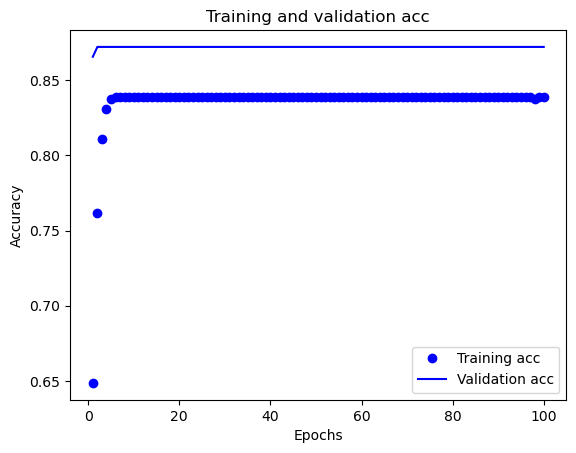

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 3, 'hidden_units': 128, 'learning_rate_decay': 1e-05, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': 0.95, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': False, 'initializers': 'random_normal'}
Batch size: 512
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
2/2 [==============================] - 1s 233ms/step - loss: 2.7298 - accuracy: 0.3852 - val_loss: 2.6548 - val_accuracy: 0.6579
Epoch 2/100
2/2 [==============================] - 0s 31ms/step - loss: 2.6637 - accuracy: 0.5344 - val_loss: 2.5836 - val_accuracy: 0.8289
Epoch 3/100
2/2 [==============================] - 0s 31ms/step - loss: 2.5888 - accuracy: 0.7049 - val_loss: 2.5154 - val_accuracy: 0.8553
Epoch 4/100
2/2 [==============================] - 0s 47ms/step - loss: 2.5334 - accuracy: 0.7525 - val_loss: 2.4500 - val_accuracy: 0.8

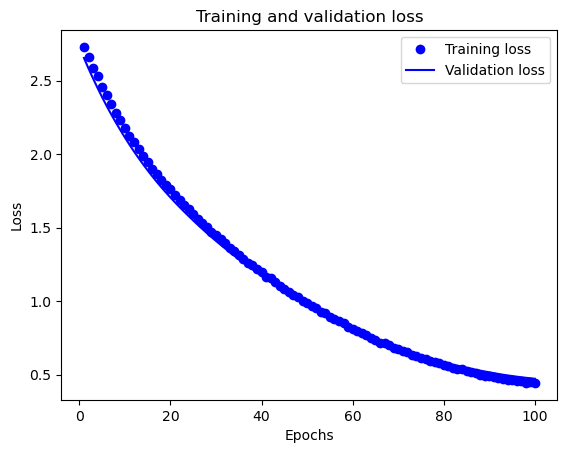

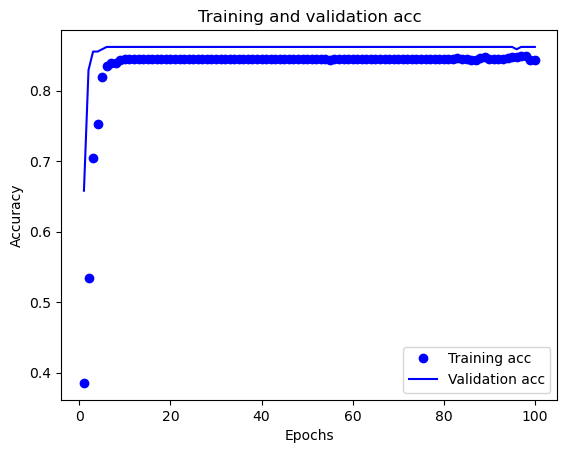

10/10 [==============================] - 0s 2ms/step
Experiment number: 7
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8, 'batch_norm': False, 'initializers': 'glorot_normal'}
Batch size: 256
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
3/3 [==============================] - 1s 118ms/step - loss: 2.5746 - accuracy: 0.4401 - val_loss: 2.4969 - val_accuracy: 0.5049
Epoch 2/100
3/3 [==============================] - 0s 23ms/step - loss: 2.5367 - accuracy: 0.4598 - val_loss: 2.4963 - val_accuracy: 0.5049
Epoch 3/100
3/3 [==============================] - 0s 23ms/step - loss: 2.5346 - accuracy: 0.4647 - val_loss: 2.4958 - val_accuracy: 0.5049
Epoch 4/100
3/3 [==============================] - 0s 24ms/step - loss: 2.5263 - accuracy: 0.4499 - val_loss: 2.4953

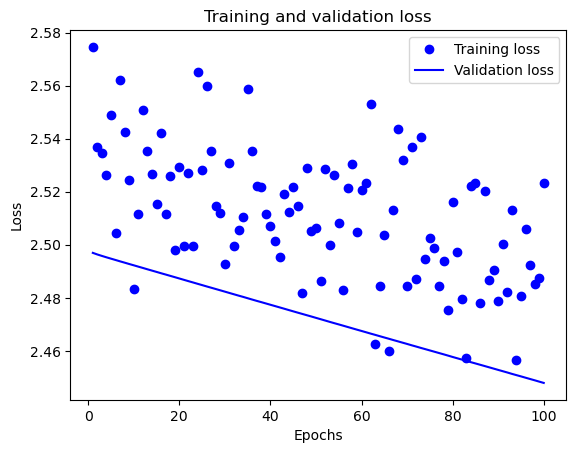

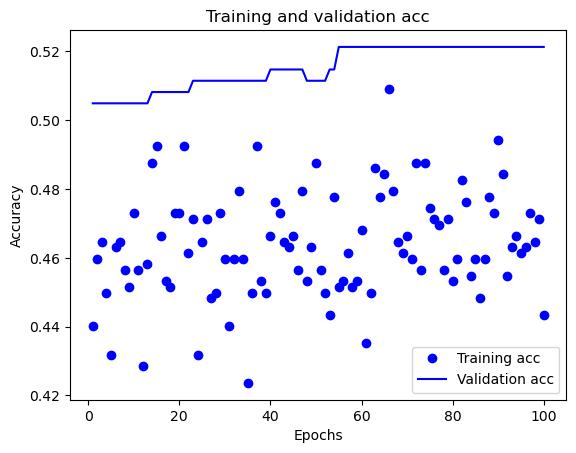

10/10 [==============================] - 0s 193us/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8, 'batch_norm': False, 'initializers': 'glorot_normal'}
Batch size: 256
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
3/3 [==============================] - 1s 117ms/step - loss: 2.8824 - accuracy: 0.1527 - val_loss: 2.8262 - val_accuracy: 0.1016
Epoch 2/100
3/3 [==============================] - 0s 25ms/step - loss: 2.8994 - accuracy: 0.1478 - val_loss: 2.8255 - val_accuracy: 0.1016
Epoch 3/100
3/3 [==============================] - 0s 25ms/step - loss: 2.8990 - accuracy: 0.1445 - val_loss: 2.8249 - val_accuracy: 0.1016
Epoch 4/100
3/3 [==============================] - 0s 25ms/step - loss: 2.8676 - accuracy: 0.1609 - val_loss: 2.8243 - val_accuracy: 0.

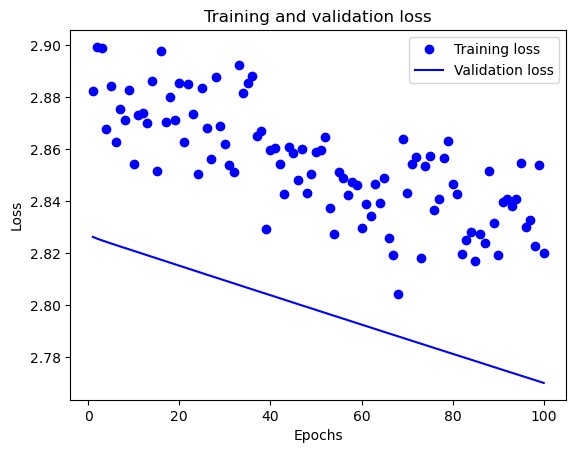

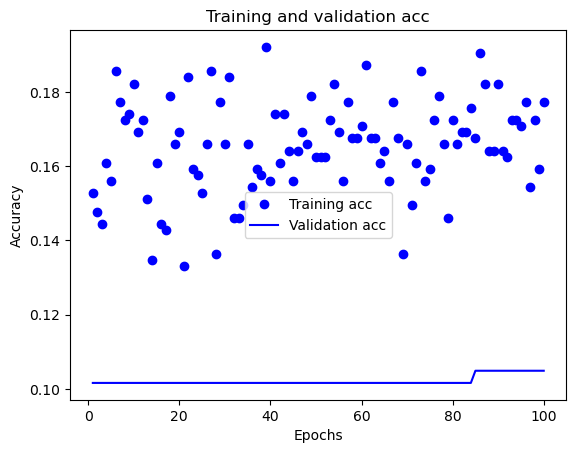

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 1e-05, 'optimizer': 'RMSprop', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8, 'batch_norm': False, 'initializers': 'glorot_normal'}
Batch size: 256
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
3/3 [==============================] - 1s 114ms/step - loss: 2.3553 - accuracy: 0.5738 - val_loss: 2.3477 - val_accuracy: 0.5526
Epoch 2/100
3/3 [==============================] - 0s 20ms/step - loss: 2.3725 - accuracy: 0.5721 - val_loss: 2.3472 - val_accuracy: 0.5526
Epoch 3/100
3/3 [==============================] - 0s 20ms/step - loss: 2.3553 - accuracy: 0.6098 - val_loss: 2.3467 - val_accuracy: 0.5526
Epoch 4/100
3/3 [==============================] - 0s 17ms/step - loss: 2.3510 - accuracy: 0.5689 - val_loss: 2.3463 - val_accuracy: 0.55

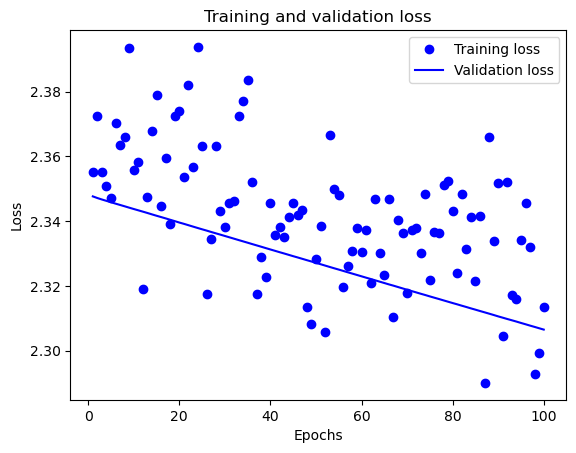

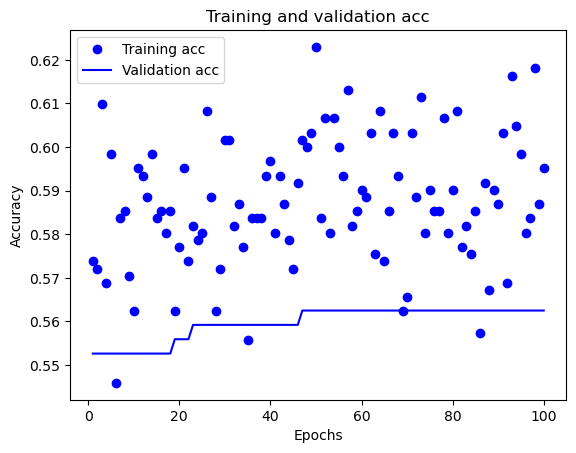

10/10 [==============================] - 0s 0s/step
Experiment number: 8
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 230ms/step - loss: 1.5516 - accuracy: 0.4926 - val_loss: 1.2101 - val_accuracy: 0.7639
Epoch 2/100
2/2 [==============================] - 0s 36ms/step - loss: 1.1765 - accuracy: 0.7570 - val_loss: 0.9689 - val_accuracy: 0.8164
Epoch 3/100
2/2 [==============================] - 0s 35ms/step - loss: 0.9149 - accuracy: 0.8604 - val_loss: 1.0085 - val_accuracy: 0.8164
Epoch 4/100
2/2 [==============================] - 0s 41ms/step - loss: 0.9031 - accuracy: 0.8670 - val_loss: 1.077

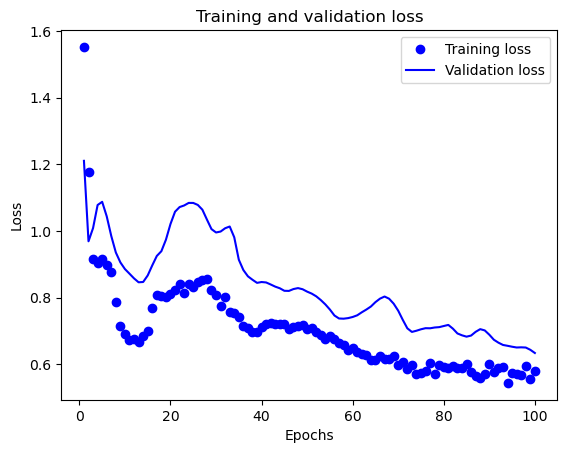

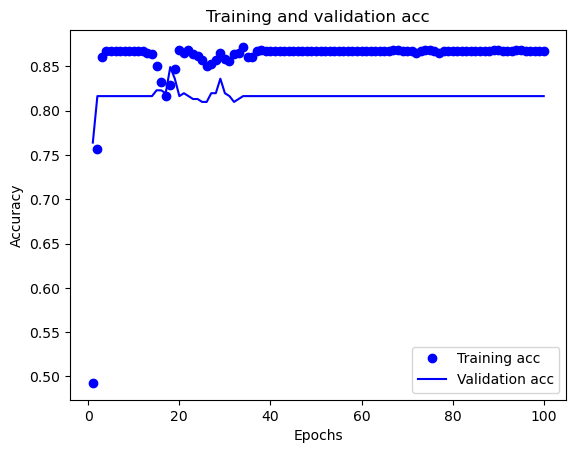

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 227ms/step - loss: 1.4326 - accuracy: 0.5402 - val_loss: 1.1556 - val_accuracy: 0.7902
Epoch 2/100
2/2 [==============================] - 0s 32ms/step - loss: 1.2075 - accuracy: 0.7619 - val_loss: 0.9306 - val_accuracy: 0.8689
Epoch 3/100
2/2 [==============================] - 0s 52ms/step - loss: 0.9798 - accuracy: 0.8342 - val_loss: 0.8095 - val_accuracy: 0.8754
Epoch 4/100
2/2 [==============================] - 0s 42ms/step - loss: 0.8605 - accuracy: 0.8407 - val_loss: 0.7397 - val_accuracy: 0.

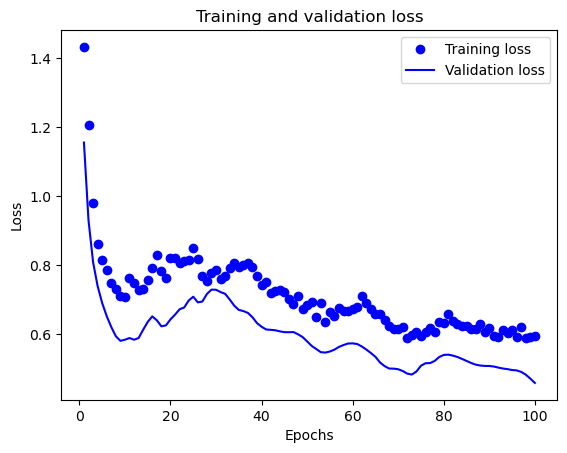

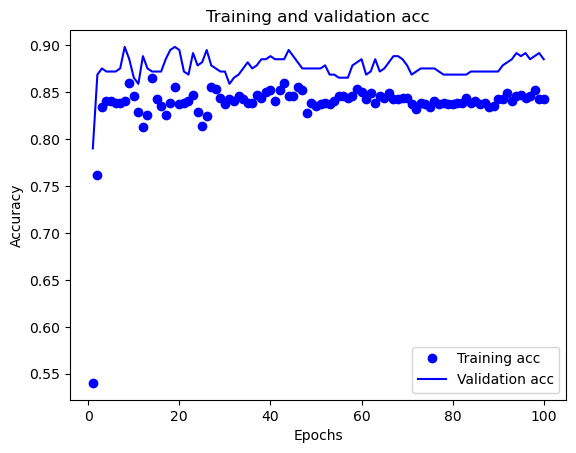

10/10 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
2/2 [==============================] - 1s 219ms/step - loss: 1.2364 - accuracy: 0.6639 - val_loss: 1.0876 - val_accuracy: 0.7664
Epoch 2/100
2/2 [==============================] - 0s 50ms/step - loss: 1.0695 - accuracy: 0.7918 - val_loss: 0.9088 - val_accuracy: 0.8520
Epoch 3/100
2/2 [==============================] - 0s 48ms/step - loss: 0.8983 - accuracy: 0.8508 - val_loss: 0.8310 - val_accuracy: 0.8750
Epoch 4/100
2/2 [==============================] - 0s 33ms/step - loss: 0.8020 - accuracy: 0.8574 - val_loss: 0.8082 - val_accuracy: 0.

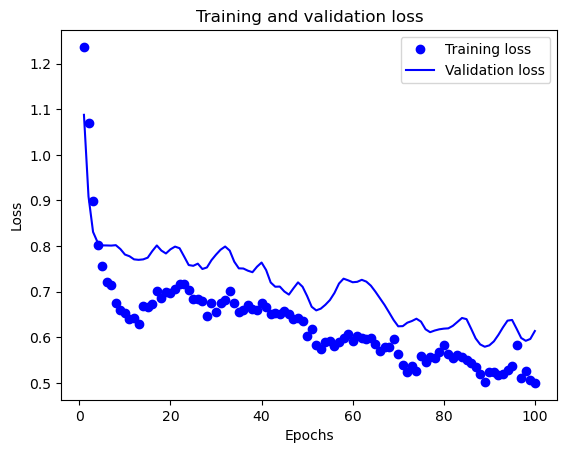

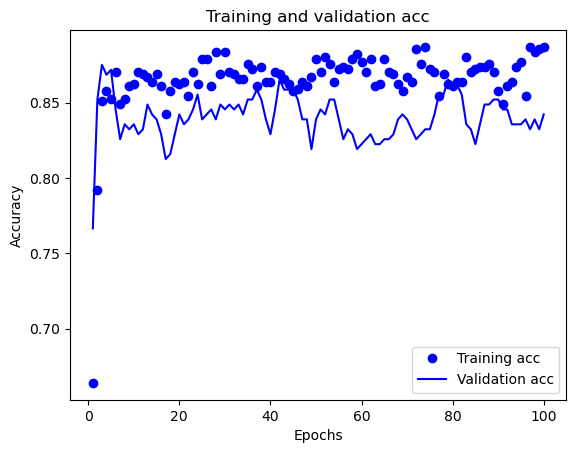

10/10 [==============================] - 0s 2ms/step
Experiment number: 9
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 2, 'hidden_units': 32, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.9, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 1s 64ms/step - loss: 3.4325 - accuracy: 0.3366 - val_loss: 3.3877 - val_accuracy: 0.3770
Epoch 2/100
5/5 [==============================] - 0s 12ms/step - loss: 3.4175 - accuracy: 0.3202 - val_loss: 3.3762 - val_accuracy: 0.3902
Epoch 3/100
5/5 [==============================] - 0s 12ms/step - loss: 3.3971 - accuracy: 0.3235 - val_loss: 3.3665 - val_accuracy: 0.4000
Epoch 4/100
5/5 [==============================] - 0s 11ms/step - loss: 3.3856 - accuracy: 0.3235 - val_loss: 3.3570 -

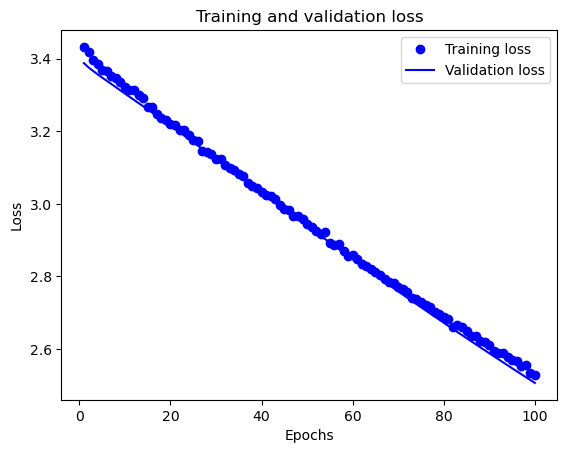

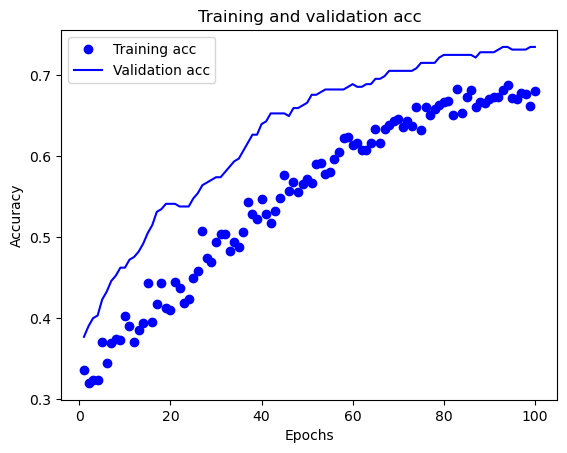

10/10 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 2, 'hidden_units': 32, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.9, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 1s 67ms/step - loss: 3.4493 - accuracy: 0.2512 - val_loss: 3.2983 - val_accuracy: 0.3803
Epoch 2/100
5/5 [==============================] - 0s 12ms/step - loss: 3.4392 - accuracy: 0.2562 - val_loss: 3.2879 - val_accuracy: 0.3869
Epoch 3/100
5/5 [==============================] - 0s 13ms/step - loss: 3.4168 - accuracy: 0.2726 - val_loss: 3.2789 - val_accuracy: 0.3967
Epoch 4/100
5/5 [==============================] - 0s 12ms/step - loss: 3.4063 - accuracy: 0.2578 - val_loss: 3.2706 - val_accuracy: 0.3967

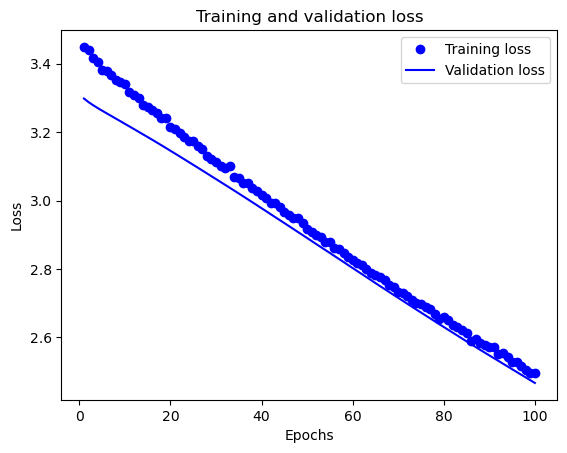

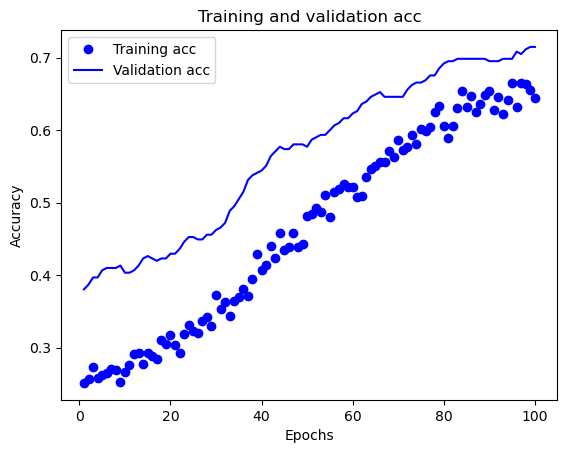

10/10 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 2, 'hidden_units': 32, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.9, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 128
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
5/5 [==============================] - 1s 63ms/step - loss: 3.3981 - accuracy: 0.3902 - val_loss: 3.4153 - val_accuracy: 0.2204
Epoch 2/100
5/5 [==============================] - 0s 14ms/step - loss: 3.3819 - accuracy: 0.4066 - val_loss: 3.4015 - val_accuracy: 0.2237
Epoch 3/100
5/5 [==============================] - 0s 12ms/step - loss: 3.3638 - accuracy: 0.4000 - val_loss: 3.3895 - val_accuracy: 0.2368
Epoch 4/100
5/5 [==============================] - 0s 13ms/step - loss: 3.3491 - accuracy: 0.4098 - val_loss: 3.3783 - val_accuracy: 0.2664

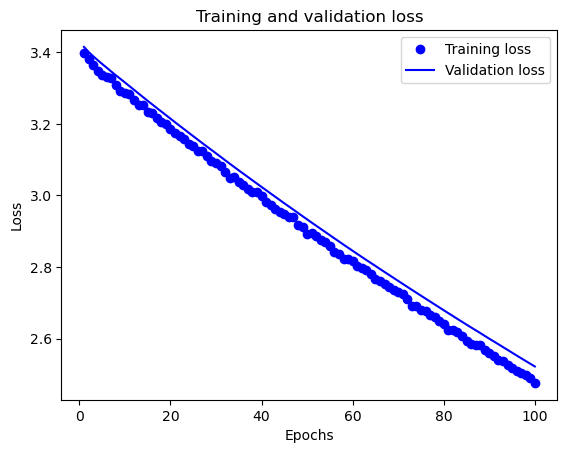

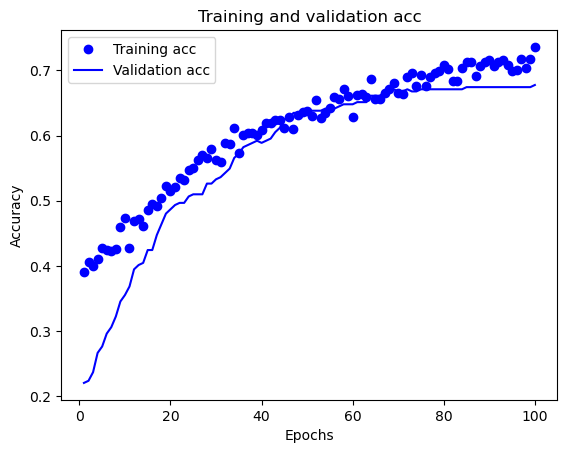

10/10 [==============================] - 0s 2ms/step
Experiment number: 10
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 1, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8, 'batch_norm': True, 'initializers': 'he_normal'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 1s 65ms/step - loss: 3.6413 - accuracy: 0.4844 - val_loss: 2.2323 - val_accuracy: 0.8262
Epoch 2/100
5/5 [==============================] - 0s 14ms/step - loss: 2.3978 - accuracy: 0.7061 - val_loss: 1.8907 - val_accuracy: 0.8164
Epoch 3/100
5/5 [==============================] - 0s 12ms/step - loss: 1.9451 - accuracy: 0.7931 - val_loss: 1.5793 - val_accuracy: 0.8164
Epoch 4/100
5/5 [==============================] - 0s 13ms/step - loss: 1.4311 - accuracy: 0.8522 - val_loss: 1.4708 - v

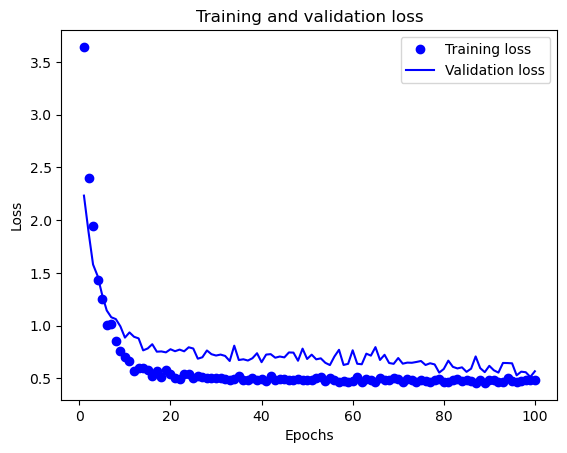

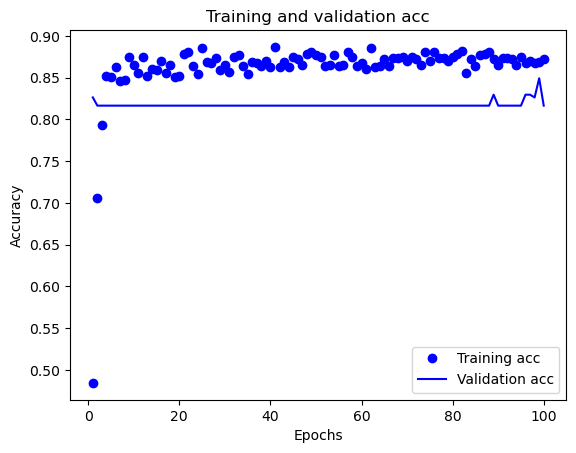

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 1, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8, 'batch_norm': True, 'initializers': 'he_normal'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 1s 63ms/step - loss: 3.5881 - accuracy: 0.5304 - val_loss: 2.1687 - val_accuracy: 0.8721
Epoch 2/100
5/5 [==============================] - 0s 13ms/step - loss: 2.2892 - accuracy: 0.7291 - val_loss: 1.7477 - val_accuracy: 0.8721
Epoch 3/100
5/5 [==============================] - 0s 13ms/step - loss: 1.8662 - accuracy: 0.7833 - val_loss: 1.4690 - val_accuracy: 0.8721
Epoch 4/100
5/5 [==============================] - 0s 12ms/step - loss: 1.4566 - accuracy: 0.8325 - val_loss: 1.2330 - val_accuracy: 0.8721
Ep

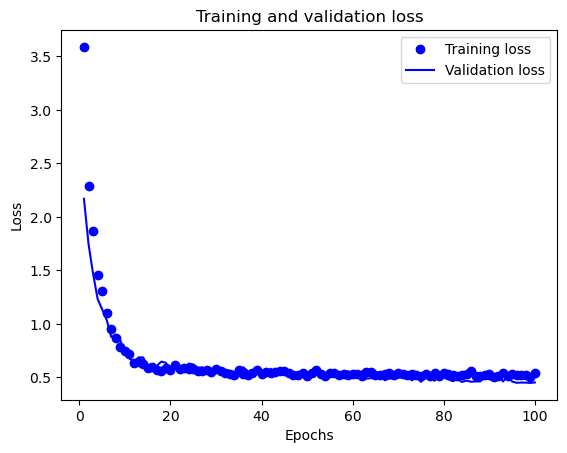

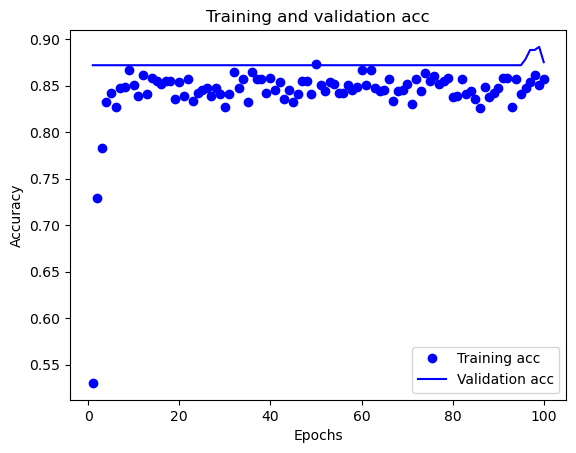

10/10 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 1, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8, 'batch_norm': True, 'initializers': 'he_normal'}
Batch size: 128
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
5/5 [==============================] - 1s 65ms/step - loss: 3.4520 - accuracy: 0.5869 - val_loss: 2.1824 - val_accuracy: 0.8586
Epoch 2/100
5/5 [==============================] - 0s 18ms/step - loss: 2.3145 - accuracy: 0.7410 - val_loss: 1.7659 - val_accuracy: 0.8618
Epoch 3/100
5/5 [==============================] - 0s 10ms/step - loss: 1.7849 - accuracy: 0.8213 - val_loss: 1.4888 - val_accuracy: 0.8618
Epoch 4/100
5/5 [==============================] - 0s 14ms/step - loss: 1.4962 - accuracy: 0.8246 - val_loss: 1.3147 - val_accuracy: 0.8618
Ep

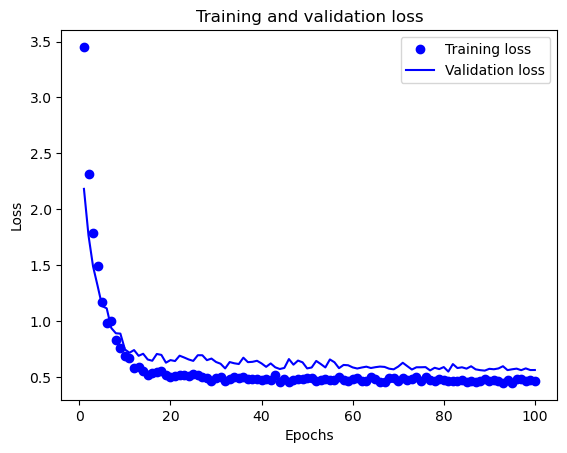

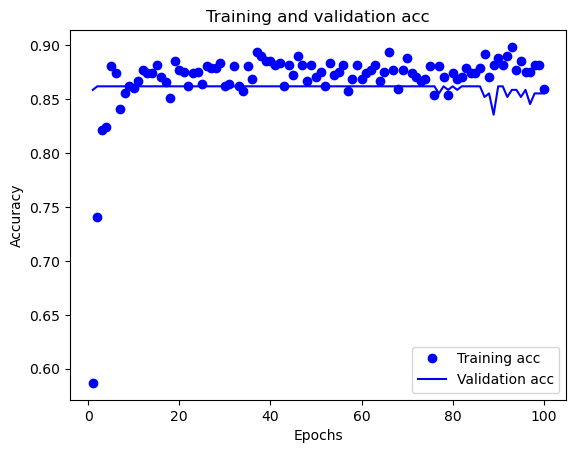

10/10 [==============================] - 0s 2ms/step
Best score: 0.8501222318090308
Best parameters: {'learning_rate': 0.01, 'hidden_layers': 2, 'hidden_units': 64, 'batch_size': 512, 'learning_rate_decay': 1e-06, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.3, 'momentum': 0.99, 'batch_norm': True, 'initializers': 'glorot_uniform'}
Best model is in 10 experiment


In [70]:
n_iter = 10
best_score = 0
best_params = {}

for i in range(n_iter):
    print(f"Experiment number: {i+1}")
    sampled_params = {k: np.random.choice(list(v)) for k,v in param_space.items()} # use random search
    model_params = {k:v for k, v in sampled_params.items() if k != 'batch_size'}
    if model_params['optimizer'] != 'momentum':
        model_params['momentum'] = None
    if model_params['optimizer'] != 'Adam':
        model_params['adam_beta_1'] = None
        model_params['adam_beta_2'] = None
    if model_params['optimizer'] != 'RMSprop':
        model_params['rho'] = None

    cv_scores = []
    for train_index, val_index in cross_validator.split(X_train): # I am confused about the data splits here, asked GPT4, accessed on Jan 27th
        X_current_train, X_val = X_train[train_index], X_train[val_index]
        y_current_train, y_val = y_train[train_index], y_train[val_index]
        model = create_model(**model_params)
        print("Model parameters:", model_params)
        print("Batch size:", sampled_params['batch_size'])
        print("X_current_train shape:", X_current_train.shape)
        print("y_current_train shape:", y_current_train.shape)
        history = model.fit(
            X_current_train, y_current_train, 
            epochs=100, 
            batch_size=sampled_params['batch_size'],
            verbose=1,
            validation_data=(X_val, y_val)
        )
        plot_loss(history)
        plot_accuracy(history)
        y_val_pred = model.predict(X_val) # the evaluation and scoring part, I am not sure which libraries to use. Asked GPT4, accessed on Jan 27th
        y_val_pred_classes = np.argmax(y_val_pred, axis=1)
        y_true_classes = np.argmax(y_val, axis=1)
        
        scoring = accuracy_score(y_true_classes, y_val_pred_classes)
        cv_scores.append(scoring)
    mean_cv_scores = np.mean(cv_scores)
        
    if mean_cv_scores > best_score:
        best_score = mean_cv_scores
        if sampled_params['optimizer'] == 'momentum':
            sampled_params['adam_beta_1'] = None
            sampled_params['adam_beta_2'] = None
            sampled_params['rho'] = None
        if sampled_params['optimizer'] == 'RMSprop':
            sampled_params['adam_beta_1'] = None
            sampled_params['adam_beta_2'] = None
            sampled_params['momentum'] = None
        if sampled_params['optimizer'] == 'Adam':
            sampled_params['momentum'] = None
            sampled_params['rho'] = None
        best_params = {k: v for k, v in sampled_params.items() if v is not None}
               
print("Best score:", best_score)
print("Best parameters:", best_params)
print(f"Best model is in {i+1} experiment")

### Experiment 3 Result Analysis
The inclusion of weight initialization in the training process seems to have had an interesting, yet not entirely positive, impact on model performance. 

* Still No Significant Improvement on Accuracy

   Adding weight initialization did not lead to a substantial increase in model accuracy. This could suggest the model's performance could be bounded by other factors, such as the need for a more sophisticated model architecture or more representative training data.

* Best Performance Peaked Early

   I observed that the model's best performance occurred before the end of training is indicative of the fact that at some point, further training leads to overfitting or is no longer beneficial. By including early stopping in the training process, halt training when the model's performance on the validation set begins to degrade, would be helpful prevent overfitting.

* K-Fold Cross-Validation Variation

   In this case, varying the number of folds in K-Fold cross-validation didn't make much difference. This is might be a good sign, suggesting that the model is not sensitive to the specific splits of the data. I will choose to use 3 folds for cross-validation is a practical decision that will reduce computational load.

## Experiment 4: Kfold = 3, batch_normalization, weight initialization, early-stopping

In [71]:
from keras.callbacks import EarlyStopping
# I am not sure how to include early stopping into my model. I asked GPT4, accessed on Jan 29th.

early_stopping = EarlyStopping(monitor='val_loss',  # Monitor validation loss
                               patience=10,         # Number of epochs with no improvement after which training will be stopped
                               verbose=1,           # To display messages
                               restore_best_weights=True)  # Restores model weights from the epoch with the best value of the monitored quantity.

Experiment number: 1
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 2, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': True, 'initializers': 'random_uniform'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 2s 88ms/step - loss: 11.3030 - accuracy: 0.3498 - val_loss: 11.0709 - val_accuracy: 0.2852
Epoch 2/100
5/5 [==============================] - 0s 17ms/step - loss: 10.9112 - accuracy: 0.4598 - val_loss: 10.7110 - val_accuracy: 0.5016
Epoch 3/100
5/5 [==============================] - 0s 12ms/step - loss: 10.5445 - accuracy: 0.5271 - val_loss: 10.3579 - val_accuracy: 0.6361
Epoch 4/100
5/5 [==============================] - 0s 17ms/step - loss: 10.1921 - accuracy: 0.5665 - val_loss: 10.0105 - val_accuracy: 0.6951
Epoch 

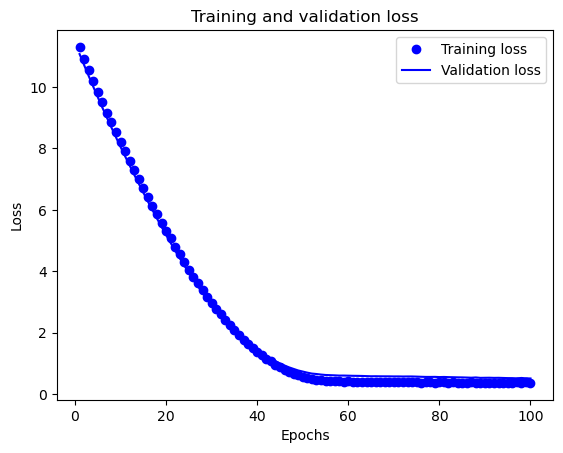

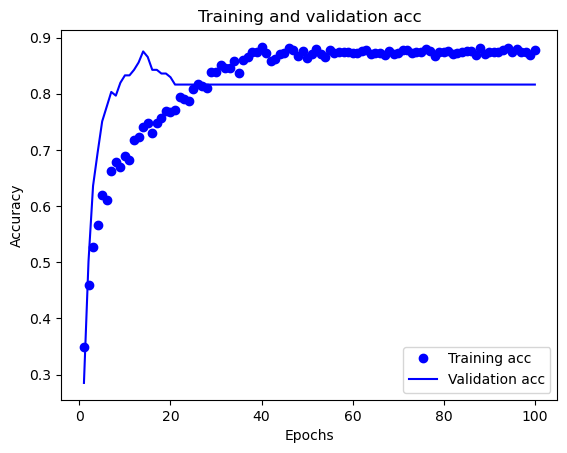

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 2, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': True, 'initializers': 'random_uniform'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 2s 84ms/step - loss: 10.8703 - accuracy: 0.3038 - val_loss: 10.6331 - val_accuracy: 0.0689
Epoch 2/100
5/5 [==============================] - 0s 16ms/step - loss: 10.4663 - accuracy: 0.4007 - val_loss: 10.2616 - val_accuracy: 0.2852
Epoch 3/100
5/5 [==============================] - 0s 17ms/step - loss: 10.1103 - accuracy: 0.4663 - val_loss: 9.8979 - val_accuracy: 0.5574
Epoch 4/100
5/5 [==============================] - 0s 16ms/step - loss: 9.7489 - accuracy: 0.5074 - val_loss: 9.5443 

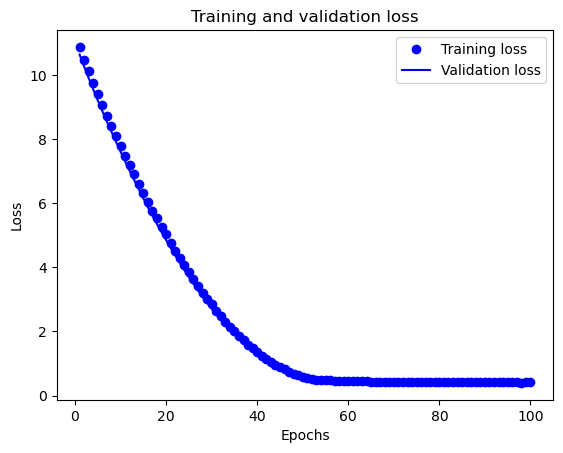

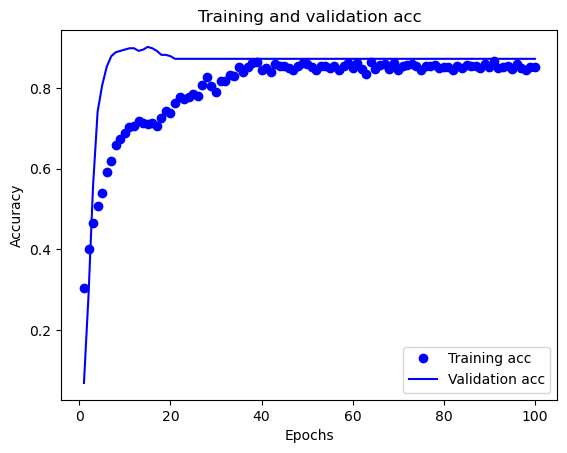

10/10 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 2, 'hidden_units': 64, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.9995, 'rho': None, 'batch_norm': True, 'initializers': 'random_uniform'}
Batch size: 128
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
5/5 [==============================] - 1s 67ms/step - loss: 10.8236 - accuracy: 0.3230 - val_loss: 10.5551 - val_accuracy: 0.6316
Epoch 2/100
5/5 [==============================] - 0s 12ms/step - loss: 10.4367 - accuracy: 0.4098 - val_loss: 10.2063 - val_accuracy: 0.6711
Epoch 3/100
5/5 [==============================] - 0s 13ms/step - loss: 10.0528 - accuracy: 0.5016 - val_loss: 9.8624 - val_accuracy: 0.6875
Epoch 4/100
5/5 [==============================] - 0s 12ms/step - loss: 9.6942 - accuracy: 0.5820 - val_loss: 9.5260 

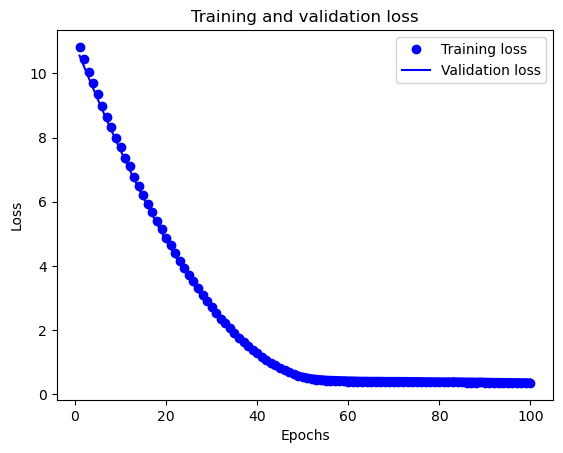

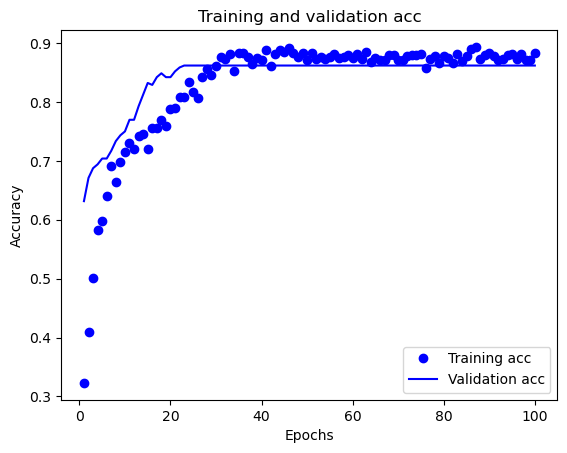

10/10 [==============================] - 0s 1ms/step
Experiment number: 2
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 2, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.8, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 265ms/step - loss: 2.8172 - accuracy: 0.2479 - val_loss: 2.5614 - val_accuracy: 0.3541
Epoch 2/100
2/2 [==============================] - 0s 40ms/step - loss: 2.7138 - accuracy: 0.2857 - val_loss: 2.5173 - val_accuracy: 0.6623
Epoch 3/100
2/2 [==============================] - 0s 40ms/step - loss: 2.6368 - accuracy: 0.3481 - val_loss: 2.4641 - val_accuracy: 0.8197
Epoch 4/100
2/2 [==============================] - 0s 26ms/step - loss: 2.5007 - accuracy: 0.4860 - val_loss: 2.410

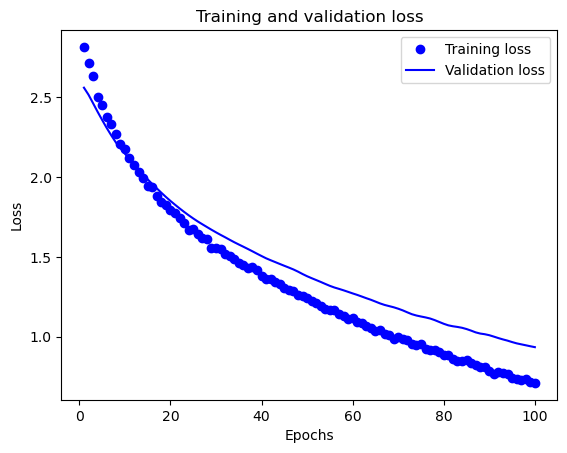

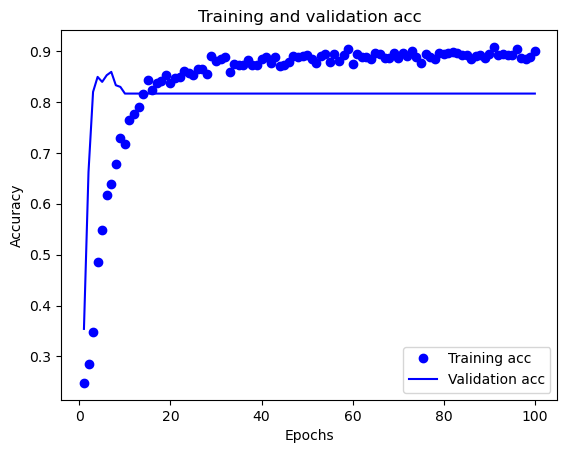

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 2, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.8, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 262ms/step - loss: 2.6556 - accuracy: 0.3612 - val_loss: 2.4518 - val_accuracy: 0.7246
Epoch 2/100
2/2 [==============================] - 0s 56ms/step - loss: 2.5973 - accuracy: 0.4039 - val_loss: 2.4235 - val_accuracy: 0.8033
Epoch 3/100
2/2 [==============================] - 0s 51ms/step - loss: 2.5115 - accuracy: 0.4663 - val_loss: 2.3850 - val_accuracy: 0.8525
Epoch 4/100
2/2 [==============================] - 0s 51ms/step - loss: 2.4331 - accuracy: 0.5501 - val_loss: 2.3407 - val_accuracy: 0.8

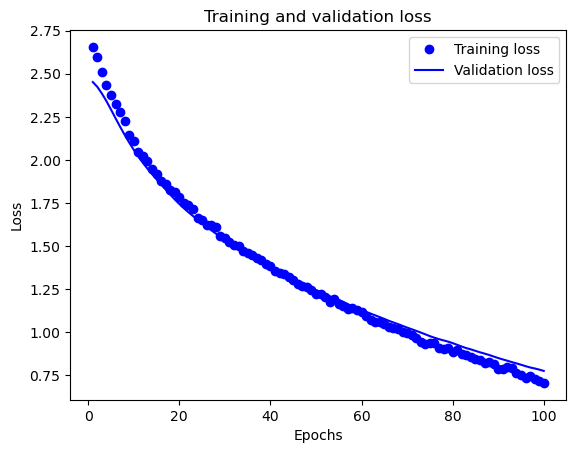

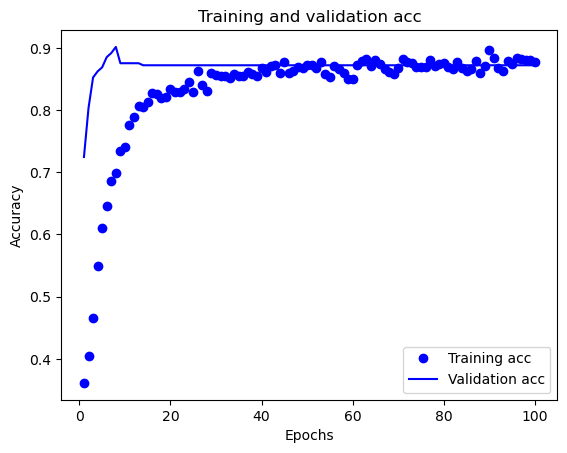

10/10 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 2, 'hidden_units': 128, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.001, 'dropout_rate': 0.4, 'momentum': 0.8, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'random_normal'}
Batch size: 512
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
2/2 [==============================] - 1s 253ms/step - loss: 2.7792 - accuracy: 0.2508 - val_loss: 2.5746 - val_accuracy: 0.5888
Epoch 2/100
2/2 [==============================] - 0s 30ms/step - loss: 2.7049 - accuracy: 0.3098 - val_loss: 2.5441 - val_accuracy: 0.6941
Epoch 3/100
2/2 [==============================] - 0s 35ms/step - loss: 2.5954 - accuracy: 0.4279 - val_loss: 2.5029 - val_accuracy: 0.7303
Epoch 4/100
2/2 [==============================] - 0s 39ms/step - loss: 2.4840 - accuracy: 0.5689 - val_loss: 2.4604 - val_accuracy: 0.7

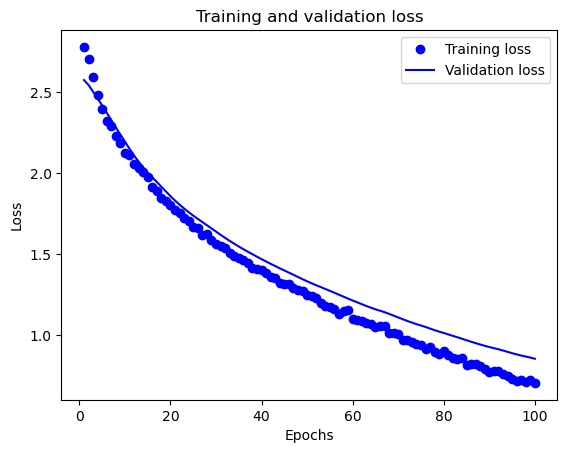

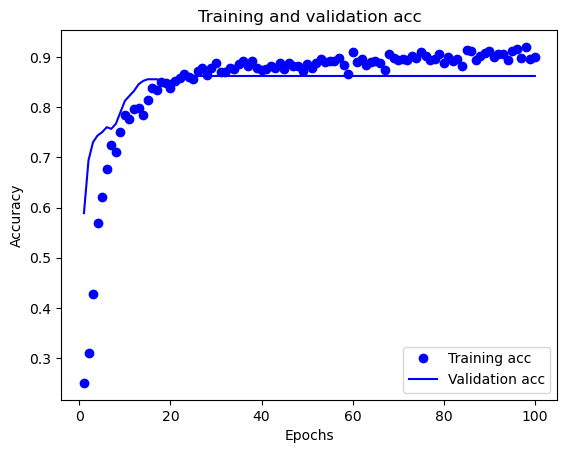

10/10 [==============================] - 0s 2ms/step
Experiment number: 3
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 32, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.8, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'he_uniform'}
Batch size: 256
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
3/3 [==============================] - 1s 117ms/step - loss: 3.8426 - accuracy: 0.1856 - val_loss: 3.8021 - val_accuracy: 0.1541
Epoch 2/100
3/3 [==============================] - 0s 23ms/step - loss: 3.8204 - accuracy: 0.1823 - val_loss: 3.7989 - val_accuracy: 0.1541
Epoch 3/100
3/3 [==============================] - 0s 16ms/step - loss: 3.8422 - accuracy: 0.1954 - val_loss: 3.7949 - val_accuracy: 0.1541
Epoch 4/100
3/3 [==============================] - 0s 18ms/step - loss: 3.8260 - accuracy: 0.1888 - val_loss: 3.7905 -

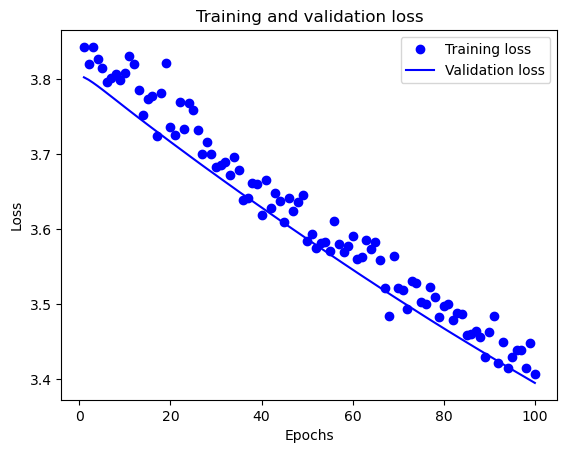

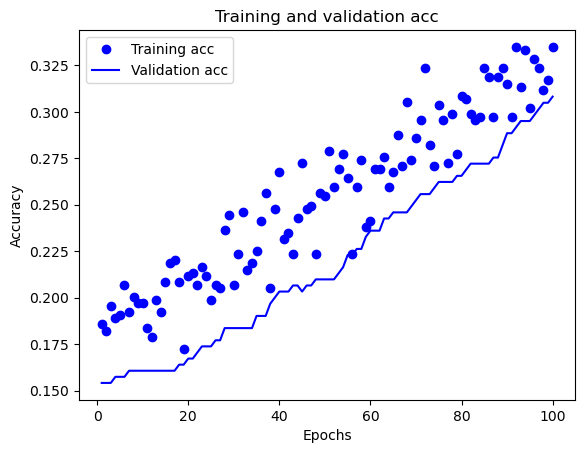

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 32, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.8, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'he_uniform'}
Batch size: 256
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
3/3 [==============================] - 1s 111ms/step - loss: 3.2371 - accuracy: 0.5813 - val_loss: 3.1120 - val_accuracy: 0.7246
Epoch 2/100
3/3 [==============================] - 0s 22ms/step - loss: 3.2574 - accuracy: 0.5649 - val_loss: 3.1103 - val_accuracy: 0.7246
Epoch 3/100
3/3 [==============================] - 0s 20ms/step - loss: 3.2502 - accuracy: 0.5846 - val_loss: 3.1081 - val_accuracy: 0.7279
Epoch 4/100
3/3 [==============================] - 0s 23ms/step - loss: 3.2303 - accuracy: 0.5829 - val_loss: 3.1058 - val_accuracy: 0.7279

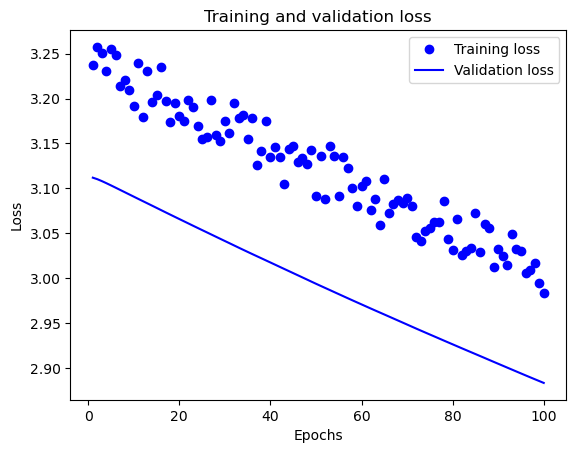

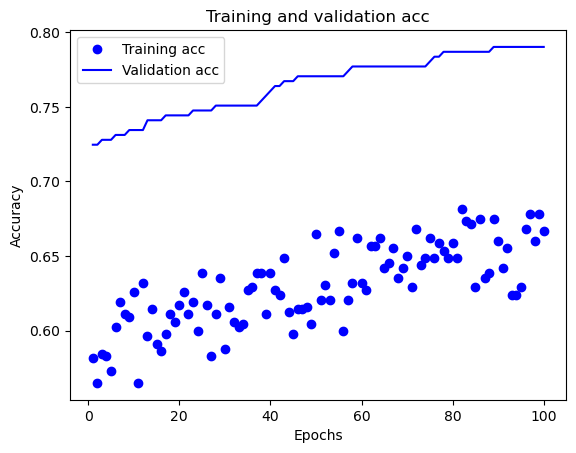

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 3, 'hidden_units': 32, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.8, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'he_uniform'}
Batch size: 256
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
3/3 [==============================] - 1s 118ms/step - loss: 3.4503 - accuracy: 0.3459 - val_loss: 3.3661 - val_accuracy: 0.3520
Epoch 2/100
3/3 [==============================] - 0s 19ms/step - loss: 3.4717 - accuracy: 0.3557 - val_loss: 3.3634 - val_accuracy: 0.3520
Epoch 3/100
3/3 [==============================] - 0s 22ms/step - loss: 3.4541 - accuracy: 0.3492 - val_loss: 3.3601 - val_accuracy: 0.3553
Epoch 4/100
3/3 [==============================] - 0s 23ms/step - loss: 3.4531 - accuracy: 0.3508 - val_loss: 3.3563 - val_accuracy: 0.3553

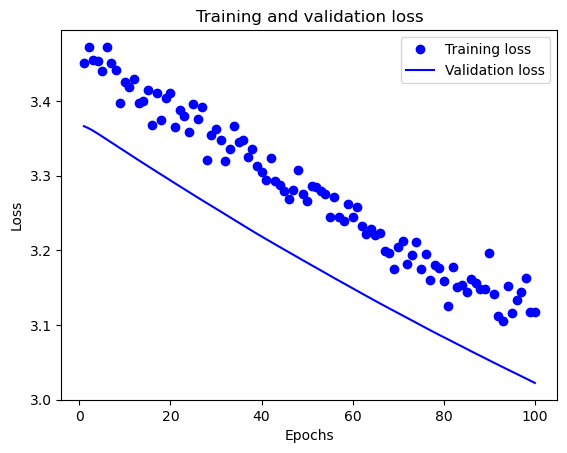

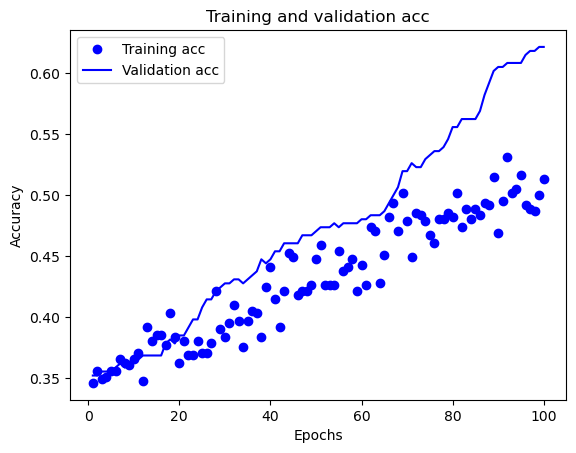

10/10 [==============================] - 0s 2ms/step
Experiment number: 4
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': False, 'initializers': 'he_uniform'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 1s 57ms/step - loss: 1.5015 - accuracy: 0.6305 - val_loss: 1.4062 - val_accuracy: 0.6689
Epoch 2/100
5/5 [==============================] - 0s 13ms/step - loss: 1.4369 - accuracy: 0.6535 - val_loss: 1.3668 - val_accuracy: 0.6984
Epoch 3/100
5/5 [==============================] - 0s 12ms/step - loss: 1.3523 - accuracy: 0.7077 - val_loss: 1.3304 - val_accuracy: 0.7148
Epoch 4/100
5/5 [==============================] - 0s 9ms/step - loss: 1.3476 - accuracy: 0.7225 - val_lo

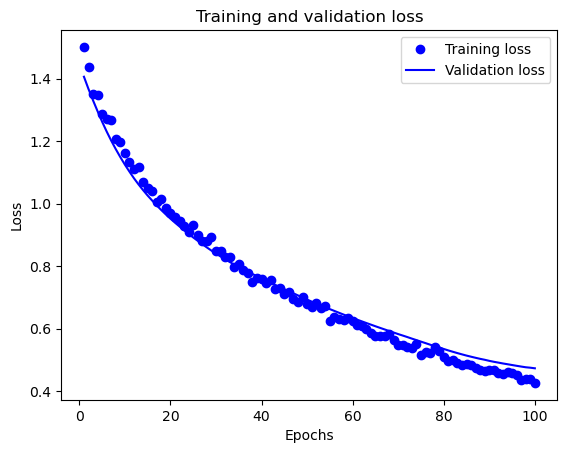

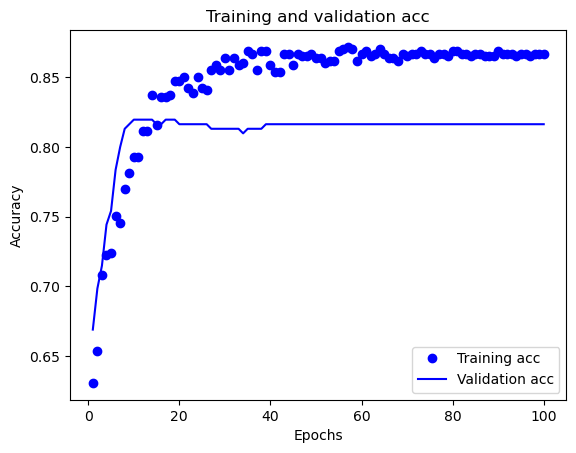

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': False, 'initializers': 'he_uniform'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 1s 59ms/step - loss: 2.1799 - accuracy: 0.1675 - val_loss: 2.0308 - val_accuracy: 0.1508
Epoch 2/100
5/5 [==============================] - 0s 10ms/step - loss: 2.1138 - accuracy: 0.1839 - val_loss: 1.9647 - val_accuracy: 0.1607
Epoch 3/100
5/5 [==============================] - 0s 9ms/step - loss: 1.9940 - accuracy: 0.1921 - val_loss: 1.9015 - val_accuracy: 0.1934
Epoch 4/100
5/5 [==============================] - 0s 11ms/step - loss: 1.9606 - accuracy: 0.2151 - val_loss: 1.8415 - val_accu

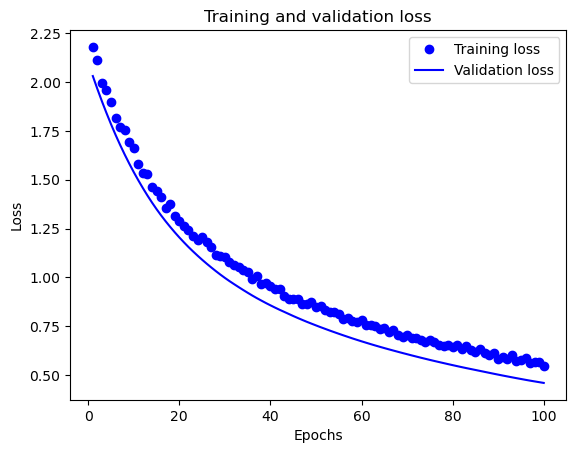

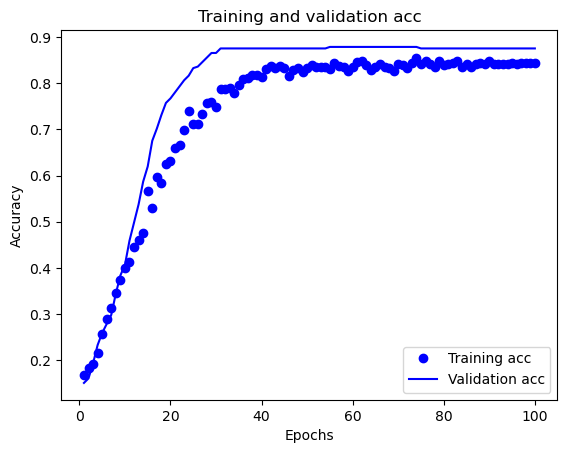

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.001, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'Adam', 'l1': 0.01, 'l2': 0.01, 'dropout_rate': 0.4, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': False, 'initializers': 'he_uniform'}
Batch size: 128
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
5/5 [==============================] - 1s 61ms/step - loss: 1.5234 - accuracy: 0.5984 - val_loss: 1.4057 - val_accuracy: 0.6513
Epoch 2/100
5/5 [==============================] - 0s 14ms/step - loss: 1.4478 - accuracy: 0.6033 - val_loss: 1.3680 - val_accuracy: 0.6941
Epoch 3/100
5/5 [==============================] - 0s 12ms/step - loss: 1.4517 - accuracy: 0.6295 - val_loss: 1.3321 - val_accuracy: 0.7138
Epoch 4/100
5/5 [==============================] - 0s 12ms/step - loss: 1.3829 - accuracy: 0.6213 - val_loss: 1.2981 - val_acc

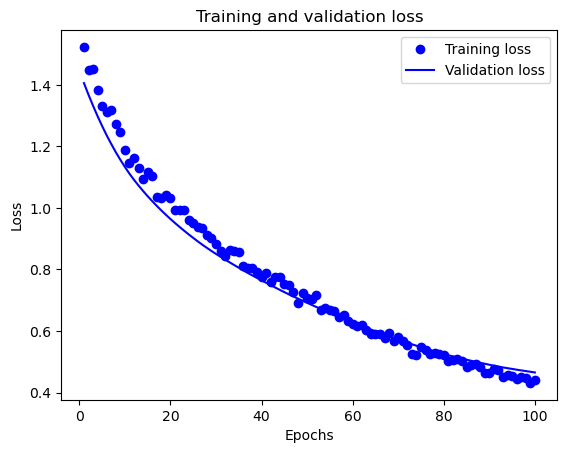

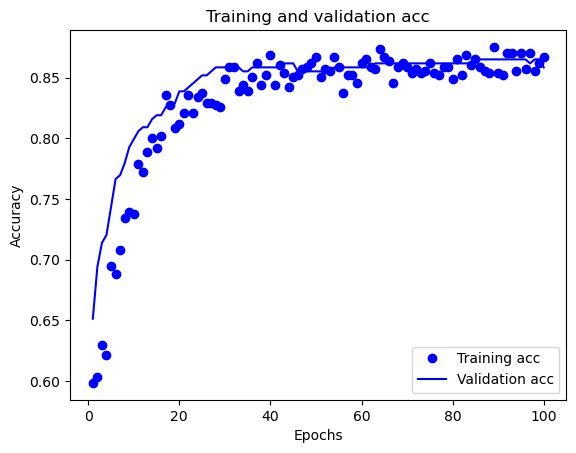

10/10 [==============================] - 0s 3ms/step
Experiment number: 5
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'he_normal'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 254ms/step - loss: 2.0636 - accuracy: 0.2923 - val_loss: 1.4263 - val_accuracy: 0.3279
Epoch 2/100
2/2 [==============================] - 0s 39ms/step - loss: 2.0939 - accuracy: 0.3071 - val_loss: 1.4296 - val_accuracy: 0.3279
Epoch 3/100
2/2 [==============================] - 0s 37ms/step - loss: 2.1102 - accuracy: 0.2627 - val_loss: 1.4344 - val_accuracy: 0.3279
Epoch 4/100
2/2 [==============================] - 0s 30ms/step - loss: 2.0886 - accuracy: 0.2677 - val_loss: 1.4386 -

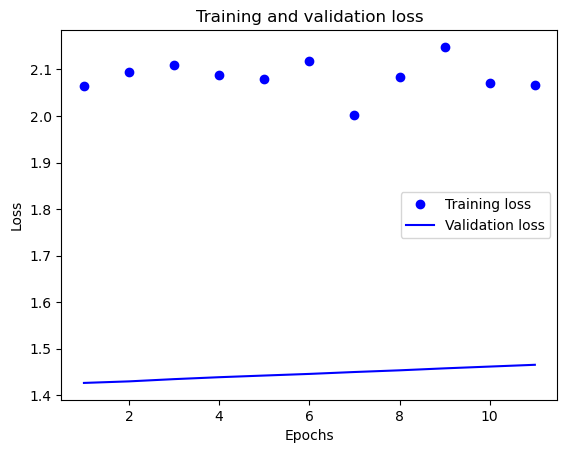

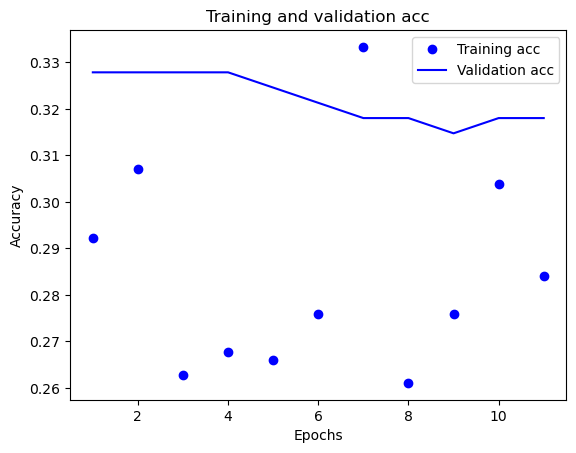

10/10 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'he_normal'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 242ms/step - loss: 2.2476 - accuracy: 0.3859 - val_loss: 2.1307 - val_accuracy: 0.0721
Epoch 2/100
2/2 [==============================] - 0s 53ms/step - loss: 2.1248 - accuracy: 0.4269 - val_loss: 2.1219 - val_accuracy: 0.0721
Epoch 3/100
2/2 [==============================] - 0s 37ms/step - loss: 2.2018 - accuracy: 0.4039 - val_loss: 2.1123 - val_accuracy: 0.0721
Epoch 4/100
2/2 [==============================] - 0s 39ms/step - loss: 2.0901 - accuracy: 0.3875 - val_loss: 2.1034 - val_accuracy: 0.0754

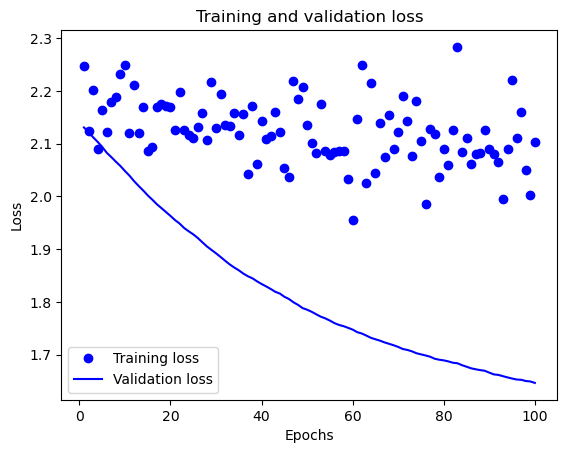

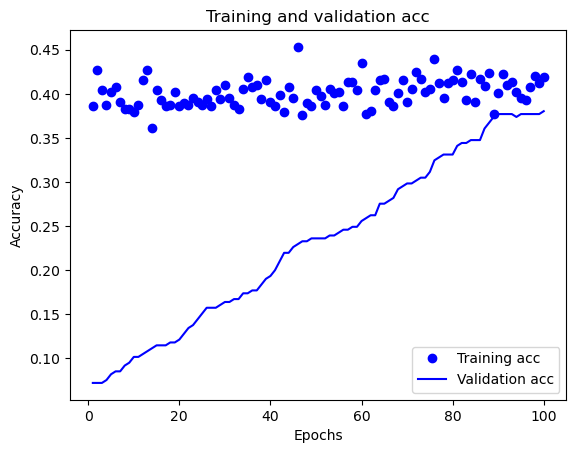

10/10 [==============================] - 0s 1ms/step
Model parameters: {'learning_rate': 1e-05, 'hidden_layers': 3, 'hidden_units': 16, 'learning_rate_decay': 0.0001, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.01, 'dropout_rate': 0.3, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': True, 'initializers': 'he_normal'}
Batch size: 512
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
2/2 [==============================] - 1s 247ms/step - loss: 2.1366 - accuracy: 0.2361 - val_loss: 1.3825 - val_accuracy: 0.3191
Epoch 2/100
2/2 [==============================] - 0s 39ms/step - loss: 2.0646 - accuracy: 0.2459 - val_loss: 1.3861 - val_accuracy: 0.3191
Epoch 3/100
2/2 [==============================] - 0s 41ms/step - loss: 2.1321 - accuracy: 0.2475 - val_loss: 1.3888 - val_accuracy: 0.3191
Epoch 4/100
2/2 [==============================] - 0s 37ms/step - loss: 2.0813 - accuracy: 0.2574 - val_loss: 1.3923 - val_accuracy: 0.3158

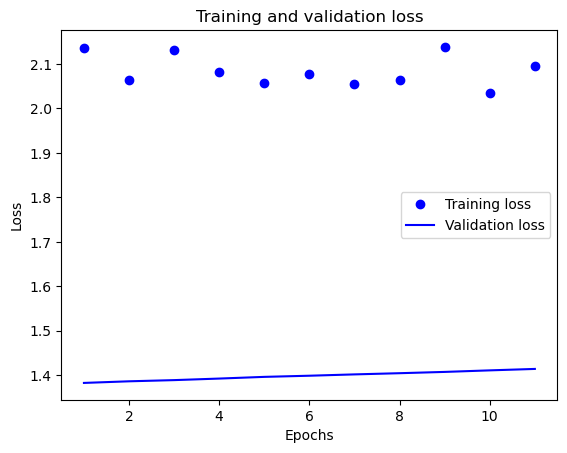

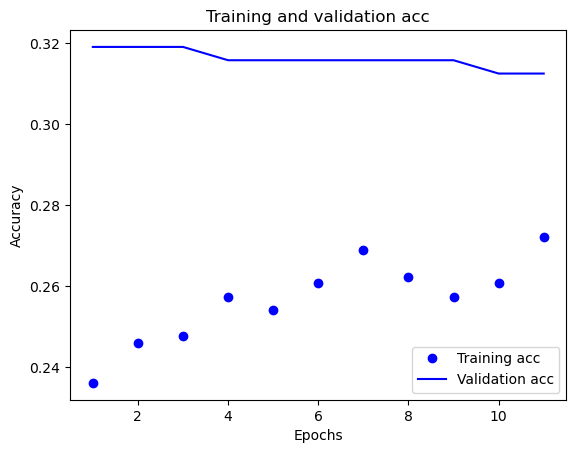

10/10 [==============================] - 0s 504us/step
Experiment number: 6
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 1, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8, 'batch_norm': True, 'initializers': 'glorot_normal'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 1s 67ms/step - loss: 16.6942 - accuracy: 0.5008 - val_loss: 8.1739 - val_accuracy: 0.8164
Epoch 2/100
5/5 [==============================] - 0s 15ms/step - loss: 6.4341 - accuracy: 0.6831 - val_loss: 3.4627 - val_accuracy: 0.8164
Epoch 3/100
5/5 [==============================] - 0s 10ms/step - loss: 2.7272 - accuracy: 0.8013 - val_loss: 2.2567 - val_accuracy: 0.8164
Epoch 4/100
5/5 [==============================] - 0s 13ms/step - loss: 1.8835 - accuracy: 0.8670 - val_loss: 1.9476 

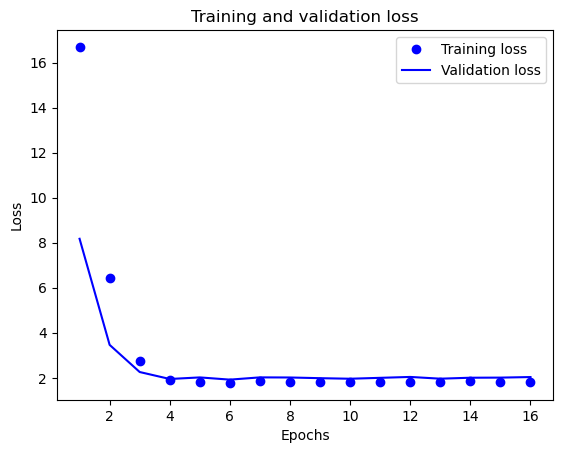

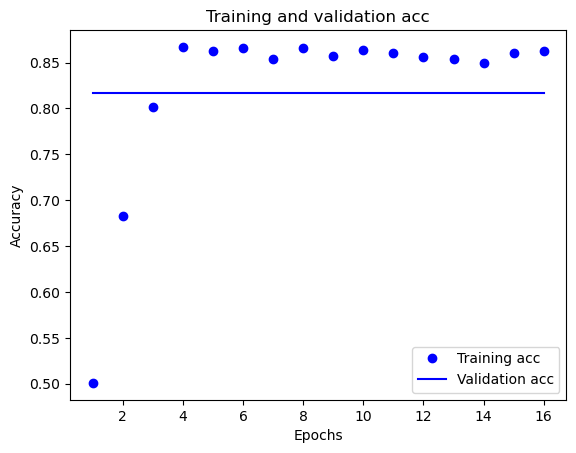

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 1, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8, 'batch_norm': True, 'initializers': 'glorot_normal'}
Batch size: 128
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
5/5 [==============================] - 1s 65ms/step - loss: 16.3605 - accuracy: 0.5090 - val_loss: 7.8345 - val_accuracy: 0.8721
Epoch 2/100
5/5 [==============================] - 0s 14ms/step - loss: 6.3912 - accuracy: 0.6667 - val_loss: 3.2080 - val_accuracy: 0.8721
Epoch 3/100
5/5 [==============================] - 0s 16ms/step - loss: 2.8838 - accuracy: 0.8030 - val_loss: 2.0162 - val_accuracy: 0.8721
Epoch 4/100
5/5 [==============================] - 0s 16ms/step - loss: 2.0834 - accuracy: 0.8079 - val_loss: 1.8422 - val_accuracy: 0.8721


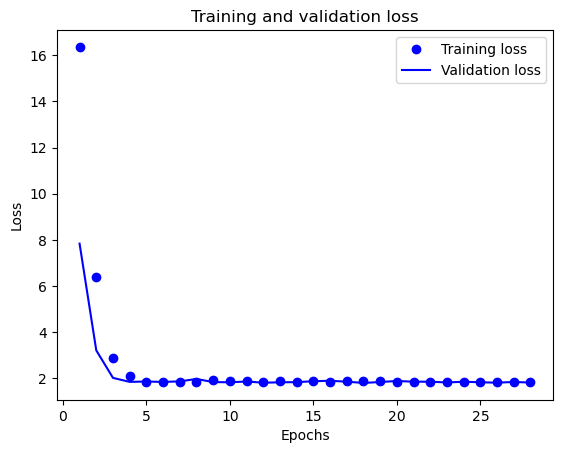

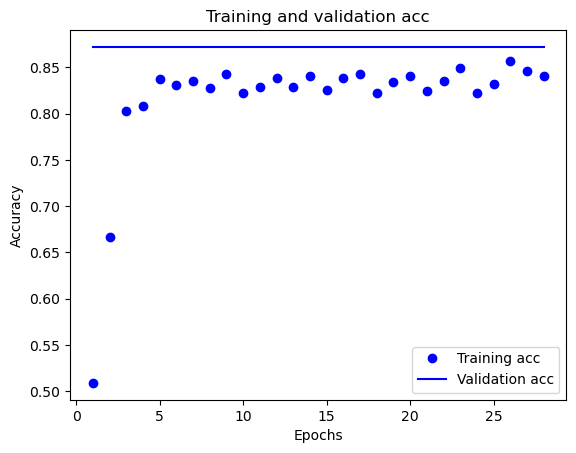

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 1, 'hidden_units': 256, 'learning_rate_decay': 1e-06, 'optimizer': 'RMSprop', 'l1': 0.1, 'l2': 0.1, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': 0.8, 'batch_norm': True, 'initializers': 'glorot_normal'}
Batch size: 128
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
5/5 [==============================] - 1s 65ms/step - loss: 16.7367 - accuracy: 0.5180 - val_loss: 8.2470 - val_accuracy: 0.8618
Epoch 2/100
5/5 [==============================] - 0s 12ms/step - loss: 6.5231 - accuracy: 0.6852 - val_loss: 3.4640 - val_accuracy: 0.8618
Epoch 3/100
5/5 [==============================] - 0s 13ms/step - loss: 2.7340 - accuracy: 0.8328 - val_loss: 2.2269 - val_accuracy: 0.8618
Epoch 4/100
5/5 [==============================] - 0s 9ms/step - loss: 1.9410 - accuracy: 0.8607 - val_loss: 1.8899 - val_accuracy: 0.8618
E

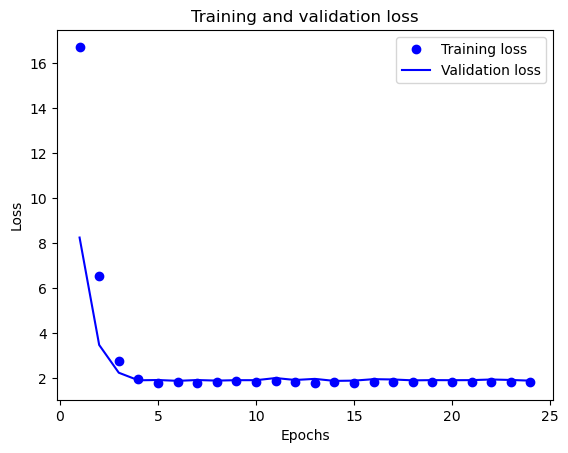

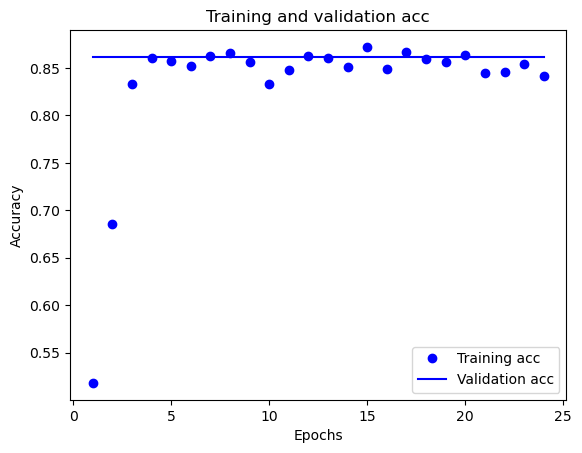

10/10 [==============================] - 0s 2ms/step
Experiment number: 7
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 2, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': False, 'initializers': 'random_normal'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 220ms/step - loss: 1.0937 - accuracy: 0.6749 - val_loss: 0.9444 - val_accuracy: 0.8164
Epoch 2/100
2/2 [==============================] - 0s 37ms/step - loss: 0.9107 - accuracy: 0.8670 - val_loss: 0.8191 - val_accuracy: 0.8164
Epoch 3/100
2/2 [==============================] - 0s 50ms/step - loss: 0.7654 - accuracy: 0.8670 - val_loss: 0.7278 - val_accuracy: 0.8164
Epoch 4/100
2/2 [==============================] - 0s 41ms/step - loss: 0.6655 - accuracy: 0.8670 - val_loss: 0.6652 

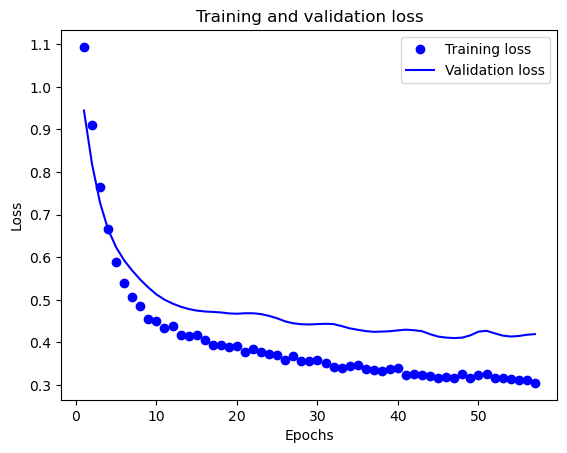

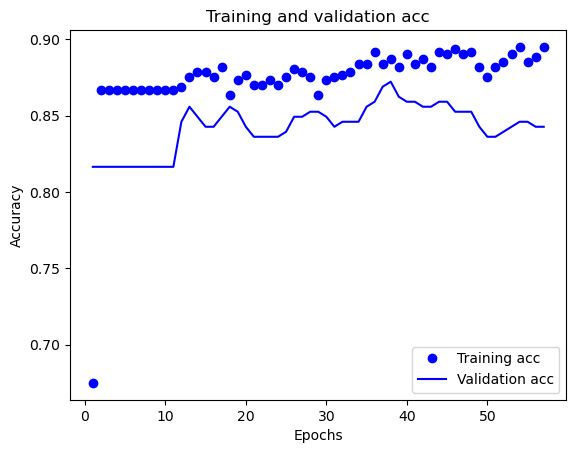

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 2, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': False, 'initializers': 'random_normal'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 227ms/step - loss: 1.2025 - accuracy: 0.2545 - val_loss: 1.0216 - val_accuracy: 0.8721
Epoch 2/100
2/2 [==============================] - 0s 28ms/step - loss: 1.0156 - accuracy: 0.8161 - val_loss: 0.8688 - val_accuracy: 0.8721
Epoch 3/100
2/2 [==============================] - 0s 32ms/step - loss: 0.8771 - accuracy: 0.8391 - val_loss: 0.7455 - val_accuracy: 0.8721
Epoch 4/100
2/2 [==============================] - 1s 567ms/step - loss: 0.7744 - accuracy: 0.8391 - val_loss: 0.6486 - val_accuracy: 0.87

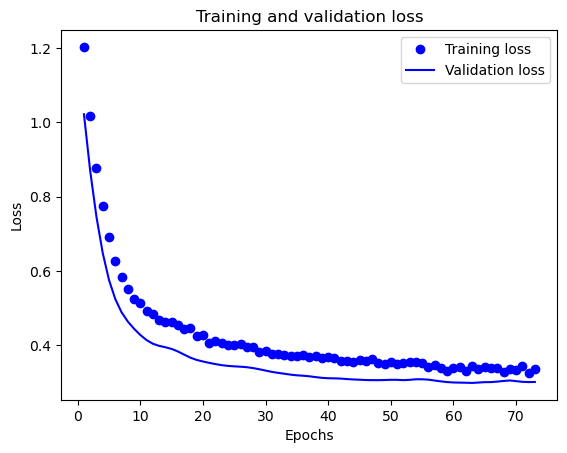

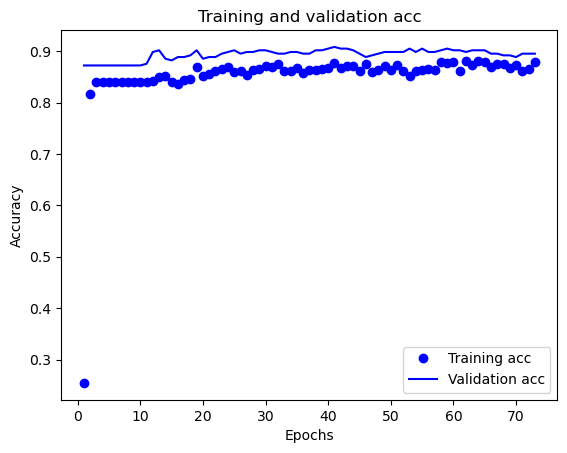

10/10 [==============================] - 0s 3ms/step
Model parameters: {'learning_rate': 0.01, 'hidden_layers': 2, 'hidden_units': 32, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.2, 'momentum': None, 'adam_beta_1': 0.9, 'adam_beta_2': 0.999, 'rho': None, 'batch_norm': False, 'initializers': 'random_normal'}
Batch size: 512
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
2/2 [==============================] - 1s 218ms/step - loss: 1.1603 - accuracy: 0.3951 - val_loss: 0.9750 - val_accuracy: 0.8553
Epoch 2/100
2/2 [==============================] - 0s 36ms/step - loss: 0.9786 - accuracy: 0.8344 - val_loss: 0.8203 - val_accuracy: 0.8618
Epoch 3/100
2/2 [==============================] - 0s 44ms/step - loss: 0.8358 - accuracy: 0.8443 - val_loss: 0.7001 - val_accuracy: 0.8618
Epoch 4/100
2/2 [==============================] - 0s 34ms/step - loss: 0.7176 - accuracy: 0.8443 - val_loss: 0.6125 - val_accuracy: 0.861

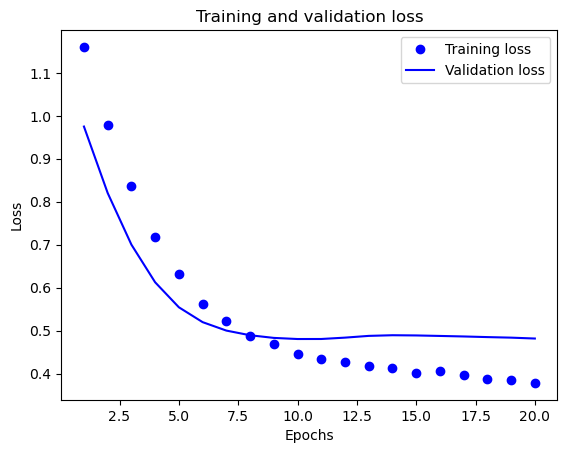

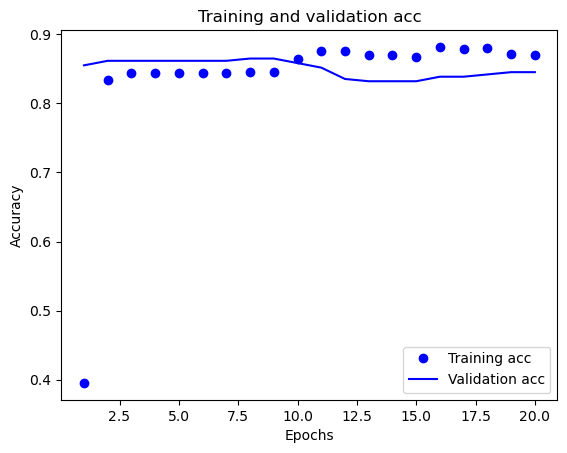

10/10 [==============================] - 0s 2ms/step
Experiment number: 8
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 64, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 222ms/step - loss: 3.7834 - accuracy: 0.5238 - val_loss: 3.2629 - val_accuracy: 0.8098
Epoch 2/100
2/2 [==============================] - 0s 38ms/step - loss: 3.1419 - accuracy: 0.7997 - val_loss: 2.3975 - val_accuracy: 0.8164
Epoch 3/100
2/2 [==============================] - 0s 38ms/step - loss: 2.2361 - accuracy: 0.8670 - val_loss: 1.5207 - val_accuracy: 0.8164
Epoch 4/100
2/2 [==============================] - 0s 40ms/step - loss: 1.3640 - accuracy: 0.8670 - val_loss: 0.873

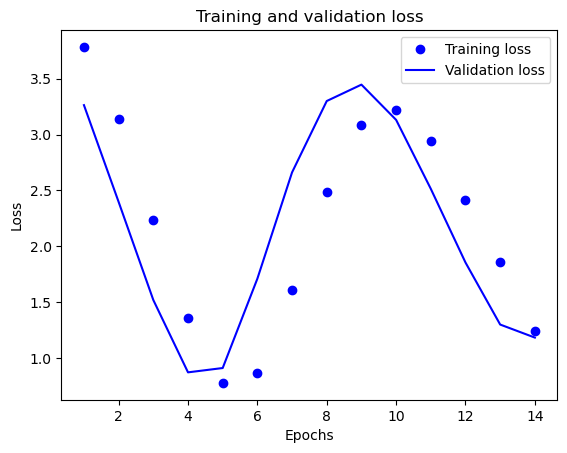

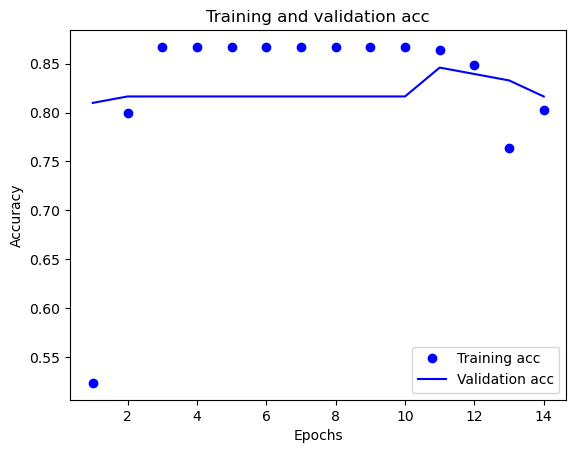

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 64, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
2/2 [==============================] - 1s 228ms/step - loss: 3.8932 - accuracy: 0.3153 - val_loss: 3.1413 - val_accuracy: 0.8098
Epoch 2/100
2/2 [==============================] - 0s 34ms/step - loss: 3.1123 - accuracy: 0.7340 - val_loss: 2.1650 - val_accuracy: 0.8721
Epoch 3/100
2/2 [==============================] - 0s 50ms/step - loss: 2.1523 - accuracy: 0.8391 - val_loss: 1.3339 - val_accuracy: 0.8721
Epoch 4/100
2/2 [==============================] - 0s 48ms/step - loss: 1.3555 - accuracy: 0.8391 - val_loss: 0.7390 - val_accuracy: 0.8

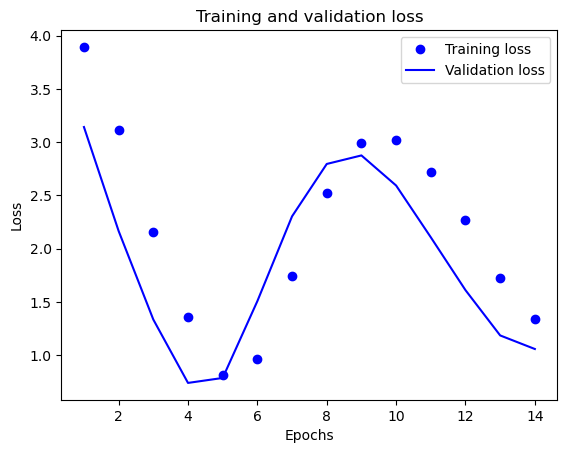

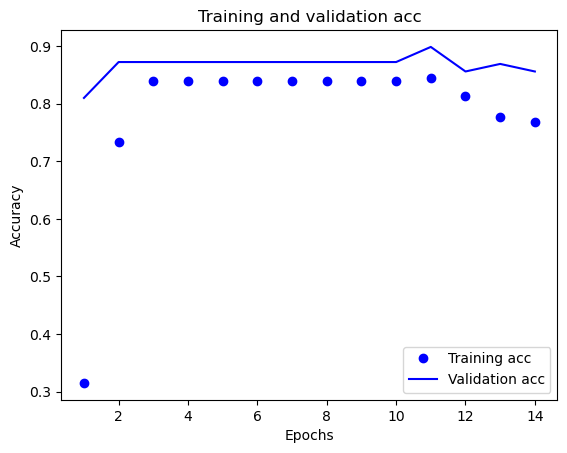

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.1, 'hidden_layers': 3, 'hidden_units': 64, 'learning_rate_decay': 0.001, 'optimizer': 'momentum', 'l1': 0.01, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.999, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'glorot_uniform'}
Batch size: 512
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
2/2 [==============================] - 1s 215ms/step - loss: 4.0263 - accuracy: 0.2164 - val_loss: 3.1470 - val_accuracy: 0.8421
Epoch 2/100
2/2 [==============================] - 0s 33ms/step - loss: 3.1351 - accuracy: 0.7246 - val_loss: 2.1474 - val_accuracy: 0.8618
Epoch 3/100
2/2 [==============================] - 0s 40ms/step - loss: 2.1351 - accuracy: 0.8443 - val_loss: 1.3807 - val_accuracy: 0.8618
Epoch 4/100
2/2 [==============================] - 0s 42ms/step - loss: 1.3340 - accuracy: 0.8443 - val_loss: 0.8672 - val_accuracy: 0.8

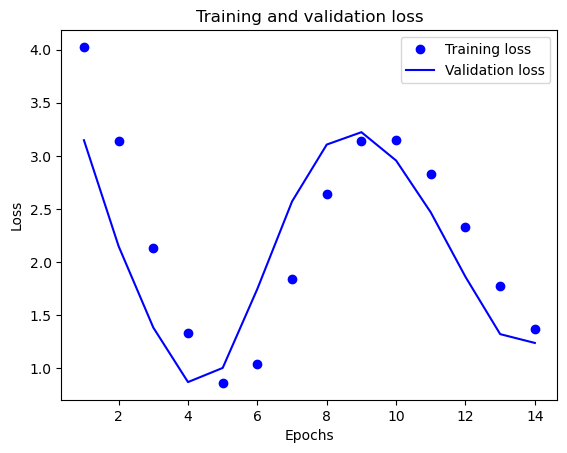

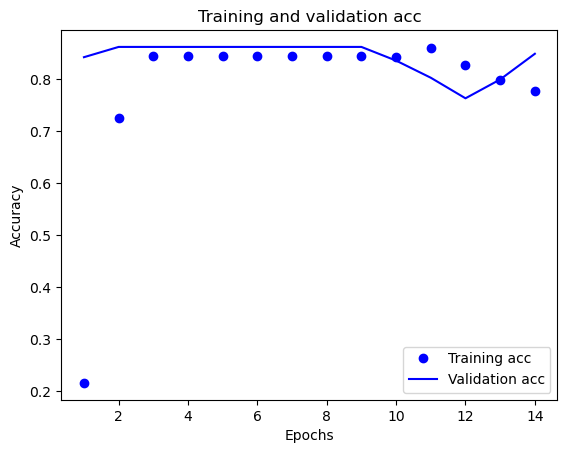

10/10 [==============================] - 0s 2ms/step
Experiment number: 9
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'he_normal'}
Batch size: 256
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
3/3 [==============================] - 1s 108ms/step - loss: 5.5924 - accuracy: 0.1888 - val_loss: 5.5781 - val_accuracy: 0.1770
Epoch 2/100
3/3 [==============================] - 0s 22ms/step - loss: 5.6184 - accuracy: 0.1560 - val_loss: 5.5731 - val_accuracy: 0.1803
Epoch 3/100
3/3 [==============================] - 0s 23ms/step - loss: 5.5790 - accuracy: 0.1888 - val_loss: 5.5653 - val_accuracy: 0.1803
Epoch 4/100
3/3 [==============================] - 0s 14ms/step - loss: 5.5934 - accuracy: 0.1905 - 

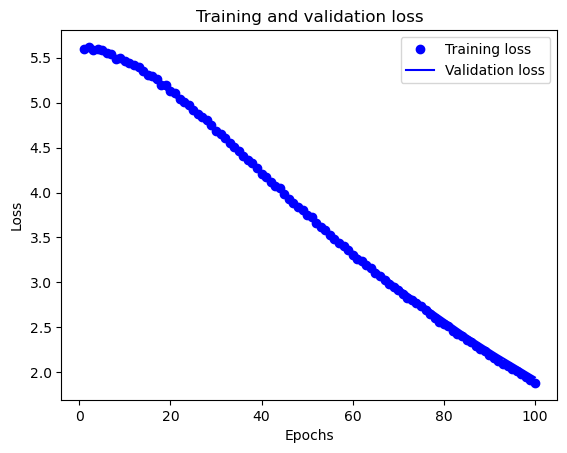

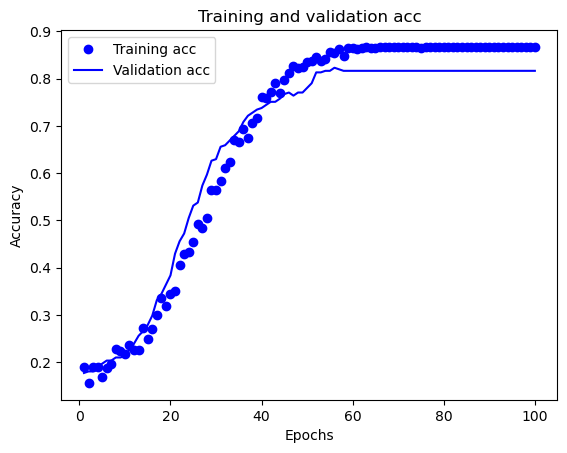

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'he_normal'}
Batch size: 256
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
3/3 [==============================] - 1s 117ms/step - loss: 6.0112 - accuracy: 0.2299 - val_loss: 5.8791 - val_accuracy: 0.2623
Epoch 2/100
3/3 [==============================] - 0s 26ms/step - loss: 6.0593 - accuracy: 0.2562 - val_loss: 5.8719 - val_accuracy: 0.2623
Epoch 3/100
3/3 [==============================] - 0s 26ms/step - loss: 6.0118 - accuracy: 0.2693 - val_loss: 5.8605 - val_accuracy: 0.2656
Epoch 4/100
3/3 [==============================] - 0s 16ms/step - loss: 6.0296 - accuracy: 0.2594 - val_loss: 5.8449 - va

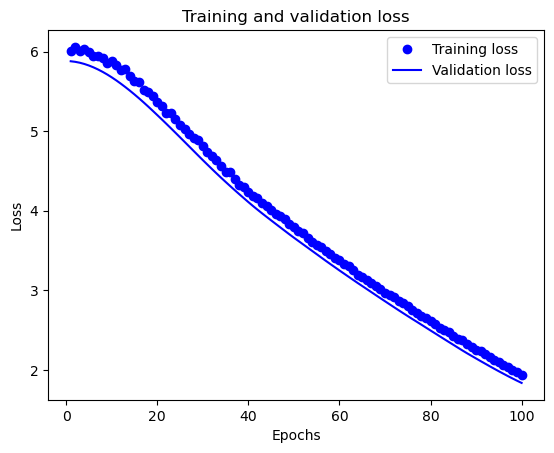

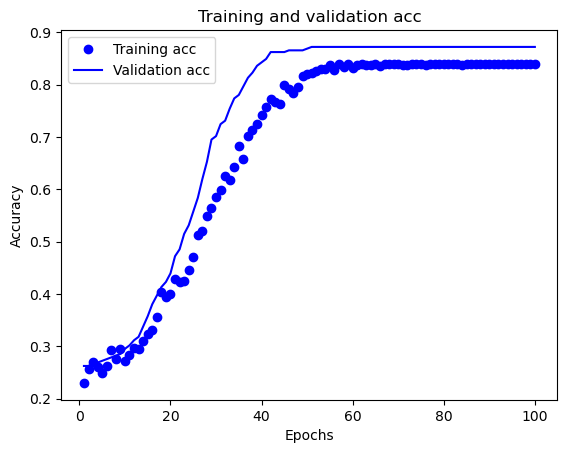

10/10 [==============================] - 0s 0s/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 1, 'hidden_units': 16, 'learning_rate_decay': 1.0000000000000001e-07, 'optimizer': 'momentum', 'l1': 0.1, 'l2': 0.001, 'dropout_rate': 0.3, 'momentum': 0.99, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'he_normal'}
Batch size: 256
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
3/3 [==============================] - 1s 111ms/step - loss: 5.7667 - accuracy: 0.2689 - val_loss: 5.7579 - val_accuracy: 0.2237
Epoch 2/100
3/3 [==============================] - 0s 22ms/step - loss: 5.7405 - accuracy: 0.2656 - val_loss: 5.7510 - val_accuracy: 0.2204
Epoch 3/100
3/3 [==============================] - 0s 15ms/step - loss: 5.7684 - accuracy: 0.2557 - val_loss: 5.7402 - val_accuracy: 0.2204
Epoch 4/100
3/3 [==============================] - 0s 25ms/step - loss: 5.7691 - accuracy: 0.2557 - val_loss: 5.7256 - val

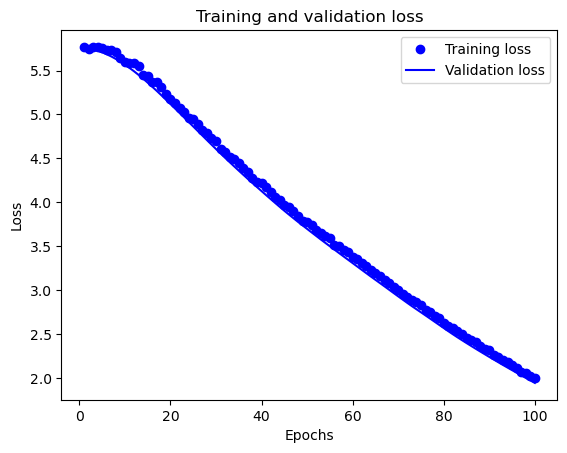

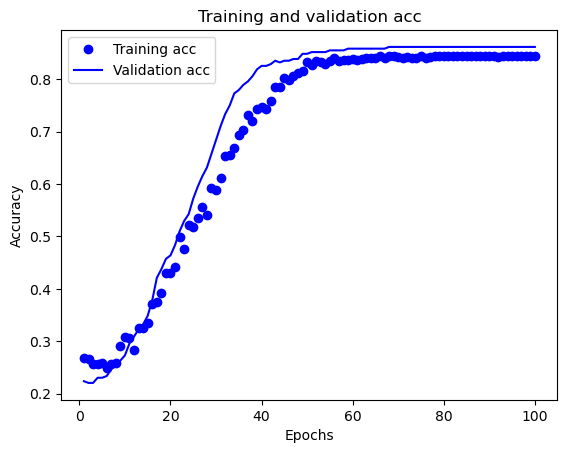

10/10 [==============================] - 0s 2ms/step
Experiment number: 10
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'glorot_uniform'}
Batch size: 256
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
3/3 [==============================] - 1s 118ms/step - loss: 3.5288 - accuracy: 0.2414 - val_loss: 3.5060 - val_accuracy: 0.2164
Epoch 2/100
3/3 [==============================] - 0s 17ms/step - loss: 3.5216 - accuracy: 0.2414 - val_loss: 3.5020 - val_accuracy: 0.2262
Epoch 3/100
3/3 [==============================] - 0s 23ms/step - loss: 3.5238 - accuracy: 0.2430 - val_loss: 3.4964 - val_accuracy: 0.2295
Epoch 4/100
3/3 [==============================] - 0s 25ms/step - loss: 3.5089 - accuracy: 0.2808 - val_loss: 3

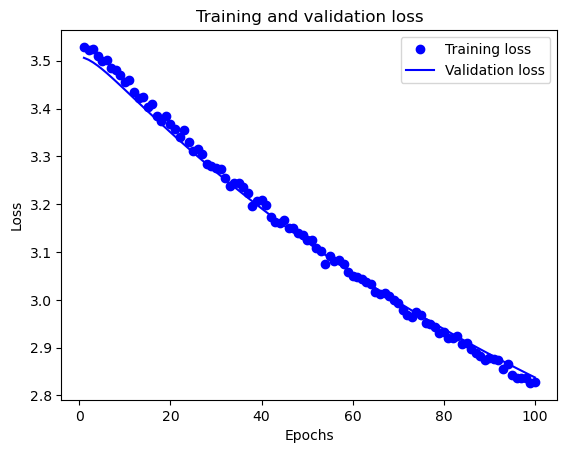

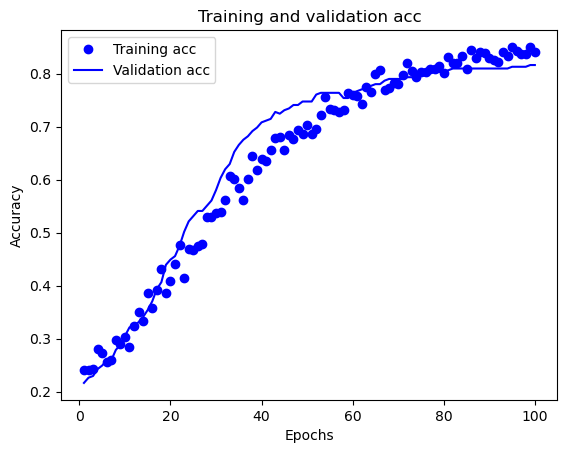

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'glorot_uniform'}
Batch size: 256
X_current_train shape: (609, 11)
y_current_train shape: (609, 3)
Epoch 1/100
3/3 [==============================] - 1s 121ms/step - loss: 3.4552 - accuracy: 0.3448 - val_loss: 3.4413 - val_accuracy: 0.3377
Epoch 2/100
3/3 [==============================] - 0s 26ms/step - loss: 3.4541 - accuracy: 0.3383 - val_loss: 3.4376 - val_accuracy: 0.3443
Epoch 3/100
3/3 [==============================] - 0s 23ms/step - loss: 3.4581 - accuracy: 0.3186 - val_loss: 3.4324 - val_accuracy: 0.3607
Epoch 4/100
3/3 [==============================] - 0s 25ms/step - loss: 3.4411 - accuracy: 0.3793 - val_loss: 3.4263 - val_accuracy: 

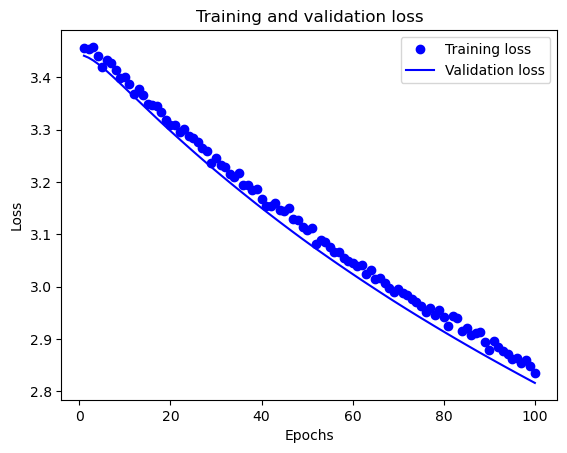

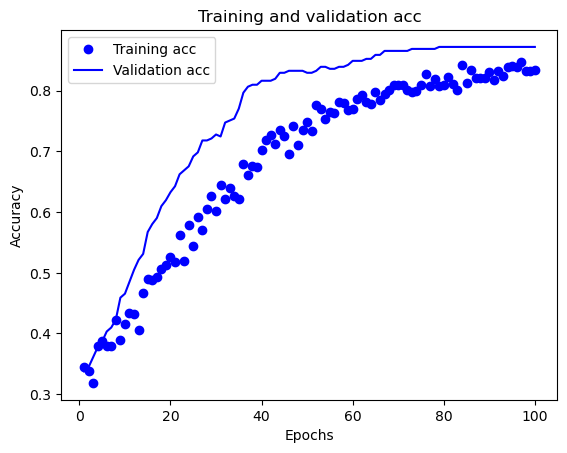

10/10 [==============================] - 0s 2ms/step
Model parameters: {'learning_rate': 0.0001, 'hidden_layers': 4, 'hidden_units': 256, 'learning_rate_decay': 1e-05, 'optimizer': 'momentum', 'l1': 0.001, 'l2': 0.1, 'dropout_rate': 0.4, 'momentum': 0.9, 'adam_beta_1': None, 'adam_beta_2': None, 'rho': None, 'batch_norm': False, 'initializers': 'glorot_uniform'}
Batch size: 256
X_current_train shape: (610, 11)
y_current_train shape: (610, 3)
Epoch 1/100
3/3 [==============================] - 1s 120ms/step - loss: 3.5887 - accuracy: 0.2393 - val_loss: 3.5813 - val_accuracy: 0.1809
Epoch 2/100
3/3 [==============================] - 0s 26ms/step - loss: 3.5969 - accuracy: 0.2066 - val_loss: 3.5768 - val_accuracy: 0.1875
Epoch 3/100
3/3 [==============================] - 0s 20ms/step - loss: 3.5809 - accuracy: 0.2475 - val_loss: 3.5708 - val_accuracy: 0.2007
Epoch 4/100
3/3 [==============================] - 0s 23ms/step - loss: 3.5916 - accuracy: 0.2016 - val_loss: 3.5635 - val_accuracy: 

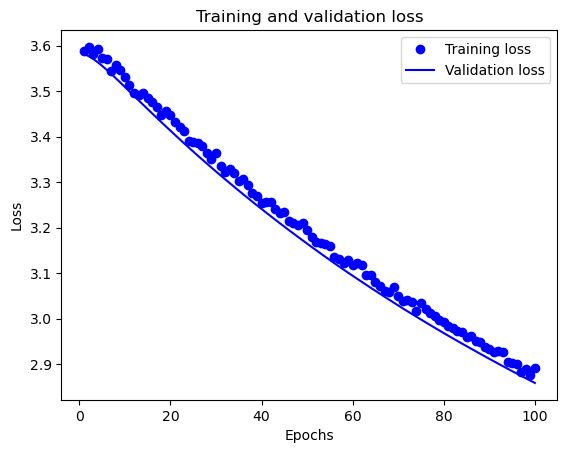

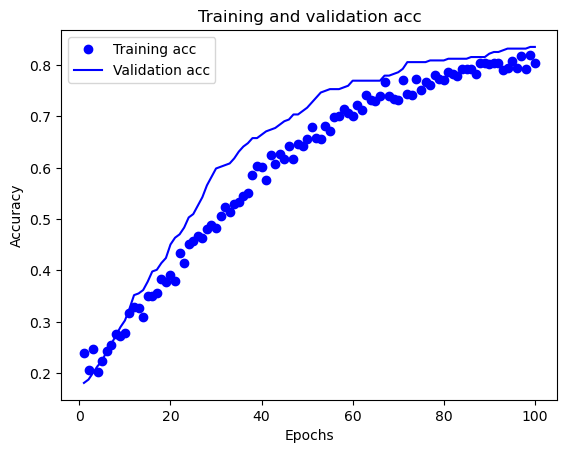

10/10 [==============================] - 0s 1ms/step
Best score: 0.8708836640782284
Best parameters: {'learning_rate': 0.01, 'hidden_layers': 2, 'hidden_units': 32, 'batch_size': 512, 'learning_rate_decay': 0.001, 'optimizer': 'Adam', 'l1': 0.001, 'l2': 0.001, 'dropout_rate': 0.2, 'adam_beta_1': 0.9, 'adam_beta_2': 0.999, 'batch_norm': False, 'initializers': 'random_normal'}
Best model is in 10 experiment


In [72]:
n_iter = 10
best_score = 0
best_params = {}

for i in range(n_iter):
    print(f"Experiment number: {i+1}")
    sampled_params = {k: np.random.choice(list(v)) for k,v in param_space.items()} # use random search
    model_params = {k:v for k, v in sampled_params.items() if k != 'batch_size'}
    if model_params['optimizer'] != 'momentum':
        model_params['momentum'] = None
    if model_params['optimizer'] != 'Adam':
        model_params['adam_beta_1'] = None
        model_params['adam_beta_2'] = None
    if model_params['optimizer'] != 'RMSprop':
        model_params['rho'] = None

    cv_scores = []
    for train_index, val_index in cross_validator.split(X_train): # I am confused about the data splits here, asked GPT4, accessed on Jan 27th
        X_current_train, X_val = X_train[train_index], X_train[val_index]
        y_current_train, y_val = y_train[train_index], y_train[val_index]
        model = create_model(**model_params)
        print("Model parameters:", model_params)
        print("Batch size:", sampled_params['batch_size'])
        print("X_current_train shape:", X_current_train.shape)
        print("y_current_train shape:", y_current_train.shape)
        history = model.fit(
            X_current_train, y_current_train, 
            epochs=100, 
            batch_size=sampled_params['batch_size'],
            verbose=1,
            validation_data=(X_val, y_val),
            callbacks=[early_stopping]
        )
        plot_loss(history)
        plot_accuracy(history)
        y_val_pred = model.predict(X_val) # the evaluation and scoring part, I am not sure which libraries to use. Asked GPT4, accessed on Jan 27th
        y_val_pred_classes = np.argmax(y_val_pred, axis=1)
        y_true_classes = np.argmax(y_val, axis=1)
        
        scoring = accuracy_score(y_true_classes, y_val_pred_classes)
        cv_scores.append(scoring)
    mean_cv_scores = np.mean(cv_scores)
        
    if mean_cv_scores > best_score:
        best_score = mean_cv_scores
        if sampled_params['optimizer'] == 'momentum':
            sampled_params['adam_beta_1'] = None
            sampled_params['adam_beta_2'] = None
            sampled_params['rho'] = None
        if sampled_params['optimizer'] == 'RMSprop':
            sampled_params['adam_beta_1'] = None
            sampled_params['adam_beta_2'] = None
            sampled_params['momentum'] = None
        if sampled_params['optimizer'] == 'Adam':
            sampled_params['momentum'] = None
            sampled_params['rho'] = None
        best_params = {k: v for k, v in sampled_params.items() if v is not None}
               
print("Best score:", best_score)
print("Best parameters:", best_params)
print(f"Best model is in {i+1} experiment")

### Experiment 4 Result Analysis
Including early stopping in the training process and finally saw an improvement in results.

* Early Stopping


   By incorporating early stopping, the training process was halted before the model could overfit to the training data, thereby improving its generalization to unseen data. Additionally, early stopping helped in identifying the optimal number of epochs to train, which is when the model achieves the best performance on the validation dataset.

## Finalize the Model
   Now that training process has been outlined that includes a mechanism to prevent overfitting and to stop at the peak of the model's performance, it is time to finalize the model. Here are the next steps:
   
   **Finalize Hyperparameters:** The last set of hyperparameters are associated with the best validation performance during tuning. 

   **Re-train Model:** Use these hyperparameters to re-train the model on the full training dataset.

   **Performance Evaluation:** After re-training, evaluate the model on the held-out test set to confirm that the improvements hold on completely unseen data.

Epoch 1/100
2/2 - 1s - loss: 1.0964 - accuracy: 0.6083 - val_loss: 0.9402 - val_accuracy: 0.8618 - 967ms/epoch - 484ms/step
Epoch 2/100
2/2 - 0s - loss: 0.9211 - accuracy: 0.8490 - val_loss: 0.7854 - val_accuracy: 0.8618 - 44ms/epoch - 22ms/step
Epoch 3/100
2/2 - 0s - loss: 0.7731 - accuracy: 0.8501 - val_loss: 0.6670 - val_accuracy: 0.8618 - 42ms/epoch - 21ms/step
Epoch 4/100
2/2 - 0s - loss: 0.6733 - accuracy: 0.8501 - val_loss: 0.5810 - val_accuracy: 0.8618 - 46ms/epoch - 23ms/step
Epoch 5/100
2/2 - 0s - loss: 0.5971 - accuracy: 0.8501 - val_loss: 0.5259 - val_accuracy: 0.8618 - 41ms/epoch - 20ms/step
Epoch 6/100
2/2 - 0s - loss: 0.5539 - accuracy: 0.8501 - val_loss: 0.4955 - val_accuracy: 0.8618 - 42ms/epoch - 21ms/step
Epoch 7/100
2/2 - 0s - loss: 0.5184 - accuracy: 0.8501 - val_loss: 0.4803 - val_accuracy: 0.8618 - 46ms/epoch - 23ms/step
Epoch 8/100
2/2 - 0s - loss: 0.4970 - accuracy: 0.8501 - val_loss: 0.4719 - val_accuracy: 0.8618 - 41ms/epoch - 21ms/step
Epoch 9/100
2/2 - 0s -

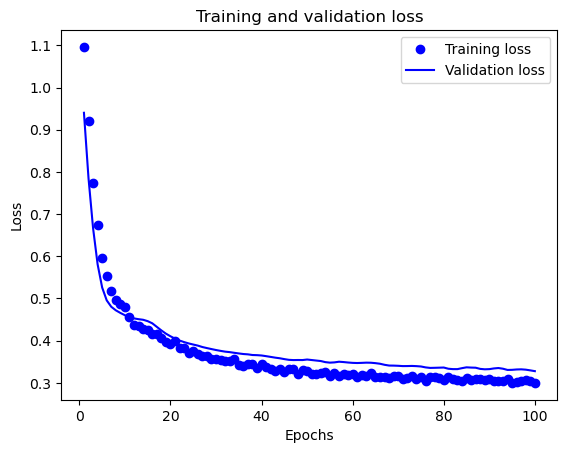

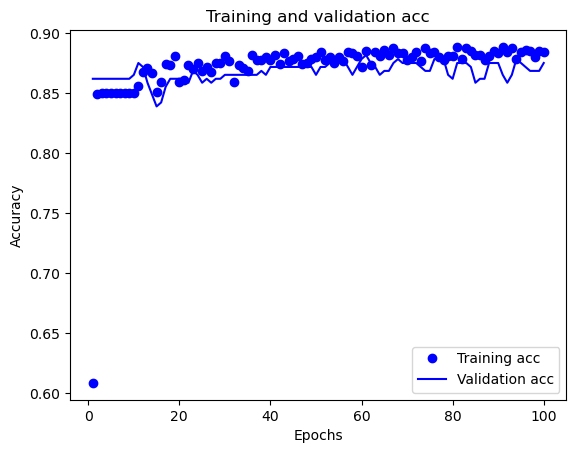

8/8 [==============================] - 0s 2ms/step
0.8820960698689956


In [73]:
best_model_params = {k:v for k, v in best_params.items() if k != 'batch_size'}
best_model = create_model(**best_model_params)
history = best_model.fit(
    X_train, y_train, 
    epochs=100, 
    batch_size=best_params['batch_size'],
    verbose=2,
    validation_data=(X_val, y_val)
)
plot_loss(history)
plot_accuracy(history)
y_test_pred = best_model.predict(X_test)
y_pred_class = np.argmax(y_test_pred, axis=1)
y_true_classes = np.argmax(y_test, axis=1)

test_accuracy = accuracy_score(y_true_classes, y_pred_class)
print(test_accuracy)

# Limitation and Discussion

This investigation represents a comprehensive examination of hyperparameter optimization, encompassing an extensive range of tunable parameters. It has facilitated a more profound comprehension of the roles hyperparameters play within the training process. The exploration began with a critical assessment of the parameter space, marking the first occasion where serious consideration was given to the impact of varying ranges. Employing both hold-out and K-fold cross-validation concurrently offered valuable insights into their operational mechanics and their advantages, particularly for smaller datasets.

Nonetheless, limitation is obviousints. The peak accuracy attained by the optimal model configuration is approximately 88.2%, which, while substantial, is ideal enoughlary. The potential reasons for this are multifaceted:

- **Dataset Size:** In an effort to expedite the training cycle and conserve computational resources, a smaller dataset was deliberately chosen. This decision likely impeded the model's capacity for further refinement and evolution.
- **Impact of Data Volume:** The modest scale of the dataset may have also restricted the full potential of the experimental procedures.

**Future Directions:**
The progression of this research has culminated in the establishment of a solid foundational model. Prospective explorations could encompass:

- **Further Hyperparameter Tuning:** Additional adjustments and tuning of hyperparameters may yield further improvements.
- **Ensemble Techniques:** Integrating multiple models might enhance overall performance.
- **Feature Engineering:** The development or enhancement of features could significantly bolster the model's ability to discern more complex data patterns.

In conclusion, this investigation stands as a successful conceptual proof of hyperparameter optimization's efficacy.

# Reference
[1]CHOLLET, Francois (2021) Deep learning with python, 2nd Edition, Manning

[2]WENGER, Jeremie (2023), Artificial lntelligence Notebooks, Goldsmiths, University of London

[3]Ng, Andrew (2023), Deep Learning Specialization, DeepLearningAI

[3]UCI Machine Learning Repository (2023), Wine Quality Dataset, UCI Machine Learning Repository